# Comments
Both GHGRP (https://www.epa.gov/ghgemissions/understanding-global-warming-potentials) and CLIMATE TRACE report a GWP of 100 years. These will be compared

# Library imports

In [ ]:
# Install necessary packages
!pip install fuzzywuzzy python-Levenshtein us
!pip install contextily
!pip install numpyro

# Import libraries
import os
import re
import json
import pickle
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
import pymc as pm
import arviz as az
#import pymc.sampling.jax as pmjax
from tqdm import tqdm
from difflib import SequenceMatcher
from fuzzywuzzy import fuzz, process
from rapidfuzz import fuzz, process
from scipy.spatial import cKDTree
from scipy.spatial.distance import cdist
from scipy.stats import shapiro, levene, boxcox, yeojohnson, kurtosis, skew, probplot
from statsmodels.formula.api import ols
from statsmodels.stats.diagnostic import het_breuschpagan
from sklearn.utils import resample
from sklearn.preprocessing import QuantileTransformer, PowerTransformer, StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split, KFold, cross_val_score, cross_val_predict, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, ElasticNet, ElasticNetCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance, partial_dependence, PartialDependenceDisplay
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, make_scorer
from sklearn.neighbors import BallTree
from google.colab import drive
import geopandas as gpd
import http.client
import us
from geopy.distance import geodesic
import matplotlib.ticker as mticker

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.7/161.7 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.9/356.9 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 66.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 121.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.8/365.8 kB 7.2 MB/s eta 0:00:00


# Loading GHGRP FLIGHT data

In [ ]:
# Load and preprocess data for all available years

# Load GHGRP Data
ghgrp_files = {
    '2015': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2015.csv',
    '2016': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2016.csv',
    '2017': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2017.csv',
    '2018': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2018.csv',
    '2019': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2019.csv',
    '2020': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2020.csv',
    '2021': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2021.csv',
    '2022': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2022.csv',
    '2023': '/content/drive/MyDrive/Master_Thesis/GHGRP_data/flight_2023.csv'
}

ghgrp_data = []

# Load each file, preprocess, and combine
for year, file_path in ghgrp_files.items():
    try:
        df = pd.read_csv(file_path, delimiter=";")
    except FileNotFoundError:
        print(f"File not found: {file_path}")
        continue
    except pd.errors.ParserError:
        print(f"Parsing error in file: {file_path}")
        continue

    # Ensure 'YEAR' is of integer type
    df['REPORTING YEAR'] = pd.to_numeric(df['REPORTING YEAR'], errors='coerce').astype('Int64')

    # Convert LATITUDE and LONGITUDE to Numeric Format
    df['LATITUDE'] = df['LATITUDE'].astype(str).str.replace(',', '.')
    df['LONGITUDE'] = df['LONGITUDE'].astype(str).str.replace(',', '.')
    df['LATITUDE'] = pd.to_numeric(df['LATITUDE'], errors='coerce')
    df['LONGITUDE'] = pd.to_numeric(df['LONGITUDE'], errors='coerce')

    # Append the dataframe to the list
    ghgrp_data.append(df)

# Combine all years into a single DataFrame
ghgrp_combined = pd.concat(ghgrp_data, ignore_index=True)

# Create a COORDINATE column
ghgrp_combined['ghgrp_coordinate'] = list(zip(ghgrp_combined['LATITUDE'], ghgrp_combined['LONGITUDE']))

# Rename columns for clarity
ghgrp_combined = ghgrp_combined.rename(columns={
    'REPORTING YEAR': 'ghgrp_year',
    'FACILITY NAME': 'ghgrp_facility_name',
    'GHGRP ID': 'ghgrp_id',
    'REPORTED ADDRESS': 'ghgrp_reported_address',
    'LATITUDE': 'ghgrp_latitude',
    'LONGITUDE': 'ghgrp_longitude',
    'ghgrp_coordinate': 'ghgrp_coordinate',
    'CITY NAME': 'ghgrp_city_name',
    'STATE NAME': 'ghgrp_state_name',
    'ZIP CODE': 'ghgrp_zip_code',
    'COUNTY NAME': 'ghgrp_county_name',
    'PARENT COMPANIES': 'ghgrp_parent_companies',
    'GHG QUANTITY (METRIC TONS CO2e)': 'ghgrp_emissions_tons',
    'SUBPARTS': 'ghgrp_subparts',
    'STATE': 'ghgrp_STATE'
})

In [ ]:
# Rename ghgrp_subparts for clarity
# Mapping short codes to official definitions
subpart_mapping = {
    'AA': 'Pulp and Paper Manufacturing',
    'BB': 'Silicon Carbide Production',
    'C': 'General Stationary Fuel Combustion Sources',
    'D': 'Electricity Generation',
    'E': 'Adipic Acid Production',
    'F': 'Aluminum Production',
    'FF': 'Underground Coal Mines',
    'G': 'Ammonia Manufacturing',
    'H': 'Cement Production',
    'HH': 'Municipal Solid Waste Landfills',
    'I': 'Electronics Manufacturing',
    'II': 'Industrial Wastewater Treatment',
    'K': 'Ferroalloy Production',
    'L': 'Fluorinated Gas Production',
    'MM': 'Suppliers of Petroleum Products',
    'N': 'Glass Production',
    'NN': 'Suppliers of Natural Gas and Natural Gas Liquids',
    'O': 'HCFC-22 Production and HFC-23 Destruction',
    'OO': 'Suppliers of Industrial Greenhouse Gases',
    'P': 'Hydrogen Production',
    'PP': 'Suppliers of Carbon Dioxide',
    'Q': 'Iron and Steel Production',
    'QQ': 'Importers and Exporters of Equipment Pre-Charged with Fluorinated GHGs or Containing Fluorinated GHGs in Closed-Cell Foams',
    'R': 'Lead Production',
    'RR (RPT)': 'Geologic Sequestration of Carbon Dioxide',
    'S': 'Lime Manufacturing',
    'SS': 'Manufacture of Electric Transmission and Distribution Equipment',
    'T': 'Magnesium Production',
    'TT': 'Industrial Waste Landfills',
    'U': 'Miscellaneous Uses of Carbonate',
    'UU': 'Injection of Carbon Dioxide',
    'V': 'Nitric Acid Production',
    'W': 'Petroleum and Natural Gas Systems',
    'X': 'Petrochemical Production',
    'Y': 'Petroleum Refineries',
    'Z': 'Phosphoric Acid Production',
    'GG': 'Zinc Production',
    'CC': 'Soda Ash Manufacturing',
    'EE': 'Titanium Dioxide Production',
    'LL': 'Suppliers of Coal-based Liquid Fuels',
    'DD': 'Use of Electric Transmission and Distribution Equipment'
}

# Function to replace short codes with descriptive names
def replace_codes_with_descriptive_names(value):
    # Split the value by commas, map each code to its descriptive name, and join them back
    return ', '.join([subpart_mapping.get(code.strip(), code) for code in value.split(',')])

# Apply the function to the `ghgrp_subparts` column
ghgrp_combined['ghgrp_subparts'] = ghgrp_combined['ghgrp_subparts'].apply(replace_codes_with_descriptive_names)

In [ ]:
# Check for proper year coverage
year_coverage = ghgrp_combined['ghgrp_year'].value_counts().sort_index()
print(f"Year coverage:\n{year_coverage}")

Year coverage:
ghgrp_year
2015    7983
2016    7643
2017    7569
2018    7676
2019    7683
2020    7643
2021    7615
2022    7546
2023    7511
Name: count, dtype: Int64


In [ ]:
print(len(ghgrp_combined))

68869


In [ ]:
# Display basic info to ensure data loaded correctly
display(ghgrp_combined.head())

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,ghgrp_subparts,ghgrp_coordinate
0,2015,#540 BONANZA CREEK ENERGY - DENVER BASIN,1000355,"410 17th Street, Suite 1500",39.744310,-104.988580,Denver,NaN,CO,80202,BONANZA CREEK ENERGY INC (100%),354851,Petroleum and Natural Gas Systems,"(39.74431, -104.98858)"
1,2015,121 REGIONAL DISPOSAL FACILITY,1004377,3820 SAM RAYBURN HIGHWAY,33.298570,-96.535860,MELISSA,COLLIN COUNTY,TX,75454,NORTH TEXAS MUNICIPAL WATER DISTRICT (100%),199012,Municipal Solid Waste Landfills,"(33.29857, -96.53586)"
2,2015,15-18565/15-18662,1010040,1021 Tori Drive,37.274127,-83.239034,Hazard,PERRY COUNTY,KY,40701,CAMBRIAN COAL LLC (100%),118205,Underground Coal Mines,"(37.274127, -83.239034)"
3,2015,15-19015,1010085,1845 S. KY HWY 15,37.236617,-83.181260,Hazard,PERRY COUNTY,KY,41701,CAMBRIAN COAL LLC (100%),55873,Underground Coal Mines,"(37.236617, -83.18126)"
4,2015,220 Gulf Coast,1009263,701 Cedar Lake Blvd,35.567190,-97.498270,Oklahoma City,OKLAHOMA COUNTY,OK,73114,CHAPARRAL ENERGY INC (100%),4448,Petroleum and Natural Gas Systems,"(35.56719, -97.49827)"


## Check for missing or duplicate values

In [ ]:
# Check for duplicate rows in the DataFrame
duplicate_rows = ghgrp_combined.duplicated()
num_duplicates = duplicate_rows.sum()

print(f"Number of duplicate rows: {num_duplicates}")
# Display duplicate rows if there are any
if num_duplicates > 0:
    display(ghgrp_combined[duplicate_rows])
else:
    print("No duplicate rows found.")

Number of duplicate rows: 0
No duplicate rows found.


In [ ]:
# Calculate the percentage of null values in each column
null_percentage = ghgrp_combined.isnull().mean() * 100
null_percentage_sorted = null_percentage.sort_values(ascending=False)

# Display the results
print("Percentage of null values in each column (sorted descending):")
display(null_percentage_sorted)

Percentage of null values in each column (sorted descending):


,0
ghgrp_county_name,9.731519
ghgrp_reported_address,6.760662
ghgrp_parent_companies,0.357200
ghgrp_id,0.000000
ghgrp_facility_name,0.000000
ghgrp_year,0.000000
ghgrp_longitude,0.000000
ghgrp_latitude,0.000000
ghgrp_STATE,0.000000
ghgrp_city_name,0.000000


No missing values in any of the key columns

## Check if ghgrp_id is stable

In [ ]:
# Group by 'ghgrp_facility_name' and 'ghgrp_coordinate' to count unique 'ghgrp_id's
ghgrp_id_stability = ghgrp_combined.groupby(['ghgrp_facility_name', 'ghgrp_coordinate'])['ghgrp_id'].nunique().reset_index()

# Filter combinations where 'ghgrp_id' count is greater than 1 (unstable)
unstable_ghgrp_ids = ghgrp_id_stability[ghgrp_id_stability['ghgrp_id'] > 1]

# Display the results
print(f"Total (ghgrp_facility_name, ghgrp_coordinate) combinations: {ghgrp_id_stability.shape[0]}")
print(f"Number of unstable combinations (multiple GHGRP IDs): {unstable_ghgrp_ids.shape[0]}")

if not unstable_ghgrp_ids.empty:
    print("\nSample of unstable (ghgrp_facility_name, ghgrp_coordinate) combinations:")
    display(unstable_ghgrp_ids.head(10))
else:
    print("All GHGRP IDs are stable for each (ghgrp_facility_name, ghgrp_coordinate) combination.")

Total (ghgrp_facility_name, ghgrp_coordinate) combinations: 10923
Number of unstable combinations (multiple GHGRP IDs): 0
All GHGRP IDs are stable for each (ghgrp_facility_name, ghgrp_coordinate) combination.


## Check if ghgrp_facility_name is stable

In [ ]:
# Group by 'ghgrp_id' and 'ghgrp_coordinate' to count unique 'ghgrp_facility_name's
facility_name_stability = ghgrp_combined.groupby(['ghgrp_id', 'ghgrp_coordinate'])['ghgrp_facility_name'].nunique().reset_index()

# Filter combinations where 'ghgrp_facility_name' count is greater than 1 (unstable)
unstable_facility_names = facility_name_stability[facility_name_stability['ghgrp_facility_name'] > 1]

# Display the results
print(f"Total (ghgrp_id, ghgrp_coordinate) combinations: {facility_name_stability.shape[0]}")
print(f"Number of unstable combinations (multiple ghgrp_facility_name): {unstable_facility_names.shape[0]}")

if not unstable_facility_names.empty:
    print("\nSample of unstable (ghgrp_id, ghgrp_coordinate) combinations:")
    display(unstable_facility_names.head(10))
else:
    print("All ghgrp_facility_name are stable for each (ghgrp_id, ghgrp_coordinate) combination.")

Total (ghgrp_id, ghgrp_coordinate) combinations: 10685
Number of unstable combinations (multiple ghgrp_facility_name): 236

Sample of unstable (ghgrp_id, ghgrp_coordinate) combinations:


,ghgrp_id,ghgrp_coordinate,ghgrp_facility_name
30,1000032,"(39.281072, -81.637901)",2
226,1000255,"(29.8169, -95.1086)",2
258,1000290,"(43.3064, -73.6208)",2
293,1000334,"(39.8466, -88.9261)",2
312,1000355,"(39.74431, -104.98858)",2
345,1000401,"(35.7433, -84.3208)",2
364,1000422,"(33.8759, -118.2491)",2
502,1000593,"(44.506335, -70.238607)",2
593,1000704,"(36.0441, -79.78814)",2
645,1000780,"(41.2044, -73.9689)",2


In [ ]:
display(ghgrp_combined[ghgrp_combined['ghgrp_id'].astype(str).str.strip() == '1000032'])

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,ghgrp_subparts,ghgrp_coordinate
3879,2015,KRATON POLYMERS U S LLC,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON POLYMERS US LLC (100%),258889,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"
11750,2016,KRATON Corporation,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON POLYMERS US LLC (100%),206772,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"
19375,2017,KRATON Corporation,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON POLYMERS US LLC (100%),206088,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"
26980,2018,KRATON Corporation,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON POLYMERS US LLC (100%),214694,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"
34654,2019,KRATON Corporation,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON CHEMICAL CO LLC (100%),206496,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"
42318,2020,KRATON Corporation,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON CORP (100%),205850,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"
49948,2021,KRATON Corporation,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON CORP (100%),209306,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"
57525,2022,KRATON Corporation,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON CORP (100%),208475,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"
65065,2023,KRATON Corporation,1000032,2419 State Route 618,39.281072,-81.637901,BELPRE,WASHINGTON COUNTY,OH,45714,KRATON CORP (100%),209507,General Stationary Fuel Combustion Sources,"(39.281072, -81.637901)"


In [ ]:
display(ghgrp_combined[ghgrp_combined['ghgrp_id'].astype(str).str.strip() == '1000255'])

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,ghgrp_subparts,ghgrp_coordinate
5295,2015,"Optim Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,OPTIM ENERGY LLC (100%),1977833,Electricity Generation,"(29.8169, -95.1086)"
13087,2016,"Odyssey Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,OPTIM ENERGY LLC (100%),1920324,Electricity Generation,"(29.8169, -95.1086)"
20678,2017,"Odyssey Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,OPTIM ENERGY LLC (100%),1946269,Electricity Generation,"(29.8169, -95.1086)"
28314,2018,"Odyssey Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,OPTIM ENERGY LLC (100%),1929685,Electricity Generation,"(29.8169, -95.1086)"
35989,2019,"Odyssey Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,OPTIM ENERGY LLC (100%),2027472,Electricity Generation,"(29.8169, -95.1086)"
43656,2020,"Odyssey Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,OPTIM ENERGY LLC (100%),2080962,Electricity Generation,"(29.8169, -95.1086)"
51293,2021,"Odyssey Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,OPTIM ENERGY LLC (100%),2020072,Electricity Generation,"(29.8169, -95.1086)"
58852,2022,"Odyssey Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,ODYSSEY ENERGY ALTURA COGEN LLC (100%),1917696,Electricity Generation,"(29.8169, -95.1086)"
66392,2023,"Odyssey Energy Altura Cogen, LLC",1000255,2330 SHELDON ROAD,29.8169,-95.1086,CHANNELVIEW,Harris,TX,77530,ODYSSEY ENERGY ALTURA COGEN LLC (100%),2163678,Electricity Generation,"(29.8169, -95.1086)"


We can see that facility names sometomes change over time, however, since the GHGRP ID remains stable, no need to make changes.



## Check if different facilities share coordiantes

In [ ]:
# Grouping to count unqiue facilites
shared_coordinates = ghgrp_combined.groupby(['ghgrp_year', 'ghgrp_coordinate', 'ghgrp_parent_companies'])['ghgrp_id'].nunique().reset_index()

# Filter groups where more than one unique 'ghgrp_id' shares the same coordinates within a year
duplicate_facilities = shared_coordinates[shared_coordinates['ghgrp_id'] > 1]

# Display the results
print(f"Total (ghgrp_year, ghgrp_coordinate) combinations: {shared_coordinates.shape[0]}")
print(f"Number of ghgrp_coordinate overlaps (multiple facilities sharing the same coordinates within a year): {duplicate_facilities.shape[0]}")

if not duplicate_facilities.empty:
    print("\nSample of coordinate overlaps:")
    display(duplicate_facilities.head(10))
else:
    print("No different facilities share the same coordinates within the same year.")

Total (ghgrp_year, ghgrp_coordinate) combinations: 65584
Number of ghgrp_coordinate overlaps (multiple facilities sharing the same coordinates within a year): 1388

Sample of coordinate overlaps:


,ghgrp_year,ghgrp_coordinate,ghgrp_parent_companies,ghgrp_id
323,2015,"(28.651637, -98.000845)",ENTERPRISE PRODUCTS PARTNERS LP (100%),7
324,2015,"(28.651637, -98.000845)",PIONEER NATURAL RESOURCES USA INC (100%),2
327,2015,"(28.665657, -96.567663)",FORMOSA PLASTICS CORP USA (100%),2
558,2015,"(29.71629, -95.08965)",INEOS USA LLC (100%),2
580,2015,"(29.73177, -95.43444)",SHERIDAN PRODUCTION CO LLC (100%),2
599,2015,"(29.74993, -95.48192)",VANGUARD NATURAL RESOURCES INC (100%),3
602,2015,"(29.752554, -95.370401)",CENTERPOINT ENERGY INC (100%),3
605,2015,"(29.752554, -95.3704009)",LINN ENERGY (100%),5
607,2015,"(29.7530996, -95.4621203)",BHP BILLITON (100%),2
609,2015,"(29.75421, -95.36021)",HESS CORP (100%),3


In [ ]:
display(ghgrp_combined[ghgrp_combined['ghgrp_coordinate'].astype(str).str.strip() == '(21.31948, -158.116295)'])

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,ghgrp_subparts,ghgrp_coordinate
552,2015,Asphalt Hawaii Kalaeloa Asphalt Terminal,1004873,91-550 Malakole Street,21.31948,-158.116295,Kapolei,HONOLULU COUNTY,HI,96707,GRACE PACIFIC LLC (70%); JAS W GLOVER LTD (30%),2397,"General Stationary Fuel Combustion Sources, Su...","(21.31948, -158.116295)"
3508,2015,"IES DOWNSTREAM, LLC - KAPOLEI REFINERY",1004891,91-480 MALAKOLE STREET,21.31948,-158.116295,KAPOLEI,HONOLULU COUNTY,HI,96707,CHEVRON CORP (100%),521147,"General Stationary Fuel Combustion Sources, Hy...","(21.31948, -158.116295)"


In [ ]:
display(ghgrp_combined[ghgrp_combined['ghgrp_reported_address'].astype(str).str.strip() == '5911 County Road 136'])

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,ghgrp_subparts,ghgrp_coordinate
506,2015,Area 11B CGP,1011692,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,PIONEER NATURAL RESOURCES USA INC (100%),23055,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
507,2015,Area 31 CGP Facility,1008611,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,ENTERPRISE PRODUCTS PARTNERS LP (100%),96929,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
508,2015,Area 41 CGP Facility,1008614,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,ENTERPRISE PRODUCTS PARTNERS LP (100%),32732,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
509,2015,Area 51 CGP Facility,1008677,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,ENTERPRISE PRODUCTS PARTNERS LP (100%),79621,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
510,2015,Area 61 CGP Facility,1008679,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,ENTERPRISE PRODUCTS PARTNERS LP (100%),11985,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
511,2015,Area 71 CGP Facility,1008680,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,ENTERPRISE PRODUCTS PARTNERS LP (100%),143641,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
512,2015,Area 72 CGP Facility,1008681,5911 County Road 136,28.651637,-98.000845,5911 County Road 136,BEE COUNTY,TX,78145,ENTERPRISE PRODUCTS PARTNERS LP (100%),158611,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
513,2015,Area 81 CGP Facility,1008682,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,ENTERPRISE PRODUCTS PARTNERS LP (100%),42311,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
8497,2016,Area 11B CGP,1011692,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,PIONEER NATURAL RESOURCES USA INC (100%),19509,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"
8498,2016,Area 51 CGP Facility,1008677,5911 County Road 136,28.651637,-98.000845,Pawnee,BEE COUNTY,TX,78145,ENTERPRISE PRODUCTS PARTNERS LP (100%),45954,"General Stationary Fuel Combustion Sources, Pe...","(28.651637, -98.000845)"


There are multiple facilities sharing coordinates or their address, this will need to be considered in the matching algorithm

## Add missing counties

In [ ]:
nan_percentage = ghgrp_combined['ghgrp_county_name'].isna().sum() / len(ghgrp_combined) * 100
print(f"Percentage of NaN rows in 'ghgrp_county_name': {nan_percentage:.2f}%")

Percentage of NaN rows in 'ghgrp_county_name': 9.73%


In [ ]:
# Load the ZIP-COUNTY mapping CSV
zip_county_mapping_path = "/content/drive/MyDrive/Master_Thesis/ZIP-COUNTY-FIPS_2017-06.csv"
zip_county_mapping = pd.read_csv(zip_county_mapping_path)

# Ensure columns are strings for reliable matching
zip_county_mapping['ZIP'] = zip_county_mapping['ZIP'].astype(str)
zip_county_mapping['COUNTYNAME'] = zip_county_mapping['COUNTYNAME'].astype(str)

# Combine CSV mapping with the hardcoded dictionary
hardcoded_zip_to_county = {
    "23826": "Dinwiddie County",
    "24114": "Henry County",
    "24143": "Pulaski County",
    "24255": "Lee County",
    "24505": "City of Lynchburg",
    "27695": "Wake County",
    "36372": "Coffee County",
    "38702": "Washington County",
    "39224": "Hinds County",
    "39568": "Harrison County",
    "42401": "Hopkins County",
    "45418": "Montgomery County",
    "67504": "McPherson County",
    "70066": "Jefferson Parish",
    "70081": "St. Charles Parish",
    "70664": "Calcasieu Parish",
    "70735": "Ascension Parish",
    "70738": "Ascension Parish",
    "70765": "Iberville Parish",
    "71050": "Bienville Parish",
    "71120": "Caddo Parish",
    "74102": "Tulsa County",
    "74362": "Delaware County",
    "76644": "Hill County",
    "77631": "Jefferson County",
    "77641": "Jefferson County",
    "79187": "Potter County",
    "79978": "El Paso County",
    "80625": "Weld County",
    "81626": "Moffat County",
    "83415": "Teton County",
    "85219": "Pinal County",
    "85222": "Pinal County",
    "85228": "Pinal County",
    "85231": "Pinal County",
    "85232": "Pinal County",
    "85242": "Pinal County",
    "85245": "Pinal County",
    "89437": "Humboldt County",
    "93525": "Kern County",
    "1615": "Worcester County",
    "16531": "Erie County",
    "35609": "Morgan County",
    "43301": "Marion County",
    "43697": "Lucas County",
    "44005": "Ashtabula County",
    "45043": "Butler County",
    "48551": "Genesee County",
    "48686": "Midland County",
    "49355": "Kent County",
    "55459": "Hennepin County",
    "57117": "Minnehaha County",
    "72105": "Hot Spring County",
    "75507": "Bowie County",
    "75653": "Rusk County",
    "77592": "Galveston County",
    "79721": "Howard County",
    "88211": "Eddy County",
    "99695": "Lake and Peninsula Borough",
    "56712": "Polk County"
}
# Convert the CSV mapping into a dictionary
csv_zip_to_county = dict(zip(zip_county_mapping['ZIP'], zip_county_mapping['COUNTYNAME']))

# Merge CSV mapping with hardcoded mapping, prioritizing hardcoded values
zip_to_county_mapping = {**csv_zip_to_county, **hardcoded_zip_to_county}

# Update NaN counties in the given DataFrame
def update_nan_counties(df, zip_to_county_mapping):
    # Ensure ZIP codes are strings for consistent mapping
    df['ghgrp_zip_code'] = df['ghgrp_zip_code'].astype(str)

    # Only update rows where 'ghgrp_county_name' is NaN
    nan_rows = df['ghgrp_county_name'].isna()
    df.loc[nan_rows, 'ghgrp_county_name'] = df.loc[nan_rows, 'ghgrp_zip_code'].map(zip_to_county_mapping)

    return df

# Apply the function to the ghgrp_combined DataFrame
ghgrp_combined = update_nan_counties(ghgrp_combined, zip_to_county_mapping)

# Verify the results
print(f"Total NaN in 'ghgrp_county_name' after update: {ghgrp_combined['ghgrp_county_name'].isna().sum()}")

Total NaN in 'ghgrp_county_name' after update: 982


In [ ]:
nan_percentage = ghgrp_combined['ghgrp_county_name'].isna().sum() / len(ghgrp_combined) * 100
print(f"Percentage of NaN rows in 'ghgrp_county_name': {nan_percentage:.2f}%")

Percentage of NaN rows in 'ghgrp_county_name': 1.43%


In [ ]:
# Step 1: Preprocess county names
def preprocess_county_name(name):
    """
    Standardizes county names by:
    - Stripping whitespace
    - Converting to title case
    - Adding 'County' if missing
    """
    if pd.isna(name) or name.strip() == "":
        return "Unknown County"  # Handle missing values
    name = name.strip().title()  # Standardize capitalization and strip whitespace
    if not name.endswith("County"):
        name = f"{name} County"  # Add 'County' if not present
    return name

# Apply preprocessing to all county names
ghgrp_combined['ghgrp_county_name'] = ghgrp_combined['ghgrp_county_name'].apply(preprocess_county_name)

# Step 2: Create a reference list from preprocessed county names
reference_list = list(ghgrp_combined['ghgrp_county_name'].unique())  # Ensure standardized reference list

# Step 3: Align county names using fuzzy matching
def align_county_names(county_name, reference_list, threshold=75):
    """
    Aligns a county name to the most similar name in the reference list using fuzzy matching.

    Parameters:
        county_name (str): The county name to align.
        reference_list (list): List of cleaned and standardized county names.
        threshold (int): Matching threshold for fuzzy matching.

    Returns:
        str: Aligned county name, or original name if no match meets the threshold.
    """
    if county_name == "Unknown County":
        return county_name  # Skip placeholder names
    result = process.extractOne(county_name, reference_list, score_cutoff=threshold)
    if result:  # Match found
        match, score, _ = result
        return match  # Return the best match
    return county_name  # No match found, return the original name

# Apply alignment to all county names
ghgrp_combined['ghgrp_county_name_cleaned'] = ghgrp_combined['ghgrp_county_name'].apply(
    lambda x: align_county_names(x, reference_list)
)

# Step 4: Identify and display changes
changed_names = ghgrp_combined[ghgrp_combined['ghgrp_county_name'] != ghgrp_combined['ghgrp_county_name_cleaned']]
print("Changed County Names:")
print(changed_names[['ghgrp_county_name', 'ghgrp_county_name_cleaned']].drop_duplicates())

# Step 5: Overwrite original column with cleaned names
ghgrp_combined['ghgrp_county_name'] = ghgrp_combined['ghgrp_county_name_cleaned']
ghgrp_combined.drop(columns=['ghgrp_county_name_cleaned'], inplace=True)

# Step 6: Validate final unique county names
final_reference_list = ghgrp_combined['ghgrp_county_name'].unique()
print("Final Reference List of Unique County Names:")
print(sorted(final_reference_list))

Changed County Names:
Empty DataFrame
Columns: [ghgrp_county_name, ghgrp_county_name_cleaned]
Index: []
Final Reference List of Unique County Names:
['Acadia County', 'Acadia Parish County', 'Accomack County', 'Ada County', 'Adams County', 'Addison County', 'Aiken County', 'Alachua County', 'Alamance County', 'Alameda County', 'Albany County', 'Albemarle County', 'Alcona County', 'Alcorn County', 'Aleutians East Borough County', 'Aleutians West Census Area County', 'Aleutians West County', 'Alexander County', 'Alexandria City County', 'Alfalfa County', 'Alger County', 'Allamakee County', 'Allegan County', 'Allegany County', 'Alleghany County', 'Allegheny County', 'Allen County', 'Allen Parish County', 'Allendale County', 'Alpena County', 'Amelia County', 'Amherst County', 'Anchorage Municipality County', 'Anderson County', 'Andrews County', 'Androscoggin County', 'Angelina County', 'Anne Arundel County', 'Anoka County', 'Anson County', 'Apache County', 'Appomattox County', 'Arapahoe Co

In [ ]:
# Find all rows where 'ghgrp_county_name' contains 'heard' (case-insensitive).
rows_with_heard = ghgrp_combined[ghgrp_combined['ghgrp_county_name'].str.contains('heard', case=False, na=False)]

# Print the rows
rows_with_heard

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,ghgrp_subparts,ghgrp_coordinate
1636,2015,Chattahoochee Energy Facility,1001178,3459 HOLLINGSWORTH FERRY RD,33.4070,-85.0387,FRANKLIN,Heard County,GA,30217,OGLETHORPE POWER CORP (100%),1095846,Electricity Generation,"(33.407, -85.0387)"
3374,2015,Hawk Road Energy Facility,1005921,624 HAWK RD,33.3577,-84.9912,FRANKLIN,Heard County,GA,30217,OGLETHORPE POWER CORP (100%),214560,Electricity Generation,"(33.3577, -84.9912)"
7037,2015,Tenaska Georgia Generating Station,1001302,2100 GEORGIA BROWN ROAD,33.3516,-84.9996,FRANKLIN,Heard County,GA,30217,"TENASKA ENERGY INC (35%); Tyr Energy, Inc & Ch...",91120,"General Stationary Fuel Combustion Sources, El...","(33.3516, -84.9996)"
7696,2015,Wansley (6052),1001015,3461 HOLLINGSWORTH FERRY ROAD,33.4124,-85.0345,FRANKLIN,Heard County,GA,30170,MUNICIPAL ELECTRIC AUTHORITY OF GEORGIA (9%); ...,4643314,"General Stationary Fuel Combustion Sources, El...","(33.4124, -85.0345)"
7697,2015,Wansley (7946),1007100,3461 HOLLINGSWORTH FERRY RD,33.4082,-85.0399,FRANKLIN,Heard County,GA,30217,MUNICIPAL ELECTRIC AUTHORITY OF GEORGIA (100%),1065134,Electricity Generation,"(33.4082, -85.0399)"
7698,2015,Wansley CC,1010612,3461 Hollingsworth Ferry Rd,33.4082,-85.0399,Franklin,Heard County,GA,30170,SOUTHERN CO (100%),2974149,Electricity Generation,"(33.4082, -85.0399)"
9558,2016,Chattahoochee Energy Facility,1001178,3459 HOLLINGSWORTH FERRY RD,33.4070,-85.0387,FRANKLIN,Heard County,GA,30217,OGLETHORPE POWER CORP (100%),1156760,Electricity Generation,"(33.407, -85.0387)"
11264,2016,Hawk Road Energy Facility,1005921,624 HAWK RD,33.3577,-84.9912,FRANKLIN,Heard County,GA,30217,OGLETHORPE POWER CORP (100%),544580,Electricity Generation,"(33.3577, -84.9912)"
14740,2016,Tenaska Georgia Generating Station,1001302,2100 GEORGIA BROWN ROAD,33.3516,-84.9996,FRANKLIN,Heard County,GA,30217,ITOCHU INTERNATIONAL INC (35%); TENASKA ENERGY...,53278,"General Stationary Fuel Combustion Sources, El...","(33.3516, -84.9996)"
15381,2016,Wansley (6052),1001015,3461 HOLLINGSWORTH FERRY ROAD,33.4124,-85.0345,FRANKLIN,Heard County,GA,30170,MUNICIPAL ELECTRIC AUTHORITY OF GEORGIA (9%); ...,4853177,"General Stationary Fuel Combustion Sources, El...","(33.4124, -85.0345)"


## Clean and combine parent companies

In [ ]:
# Step 1: Preprocess individual company names
def preprocess_parent_company_name(name):
    """
    Standardizes a single parent company name by:
    - Stripping whitespace
    - Converting to uppercase
    - Removing common suffixes like "INC", "LLC", etc.
    - Normalizing spaces
    """
    if pd.isna(name) or name.strip() == "":
        return "Unknown Company"  # Handle missing values
    name = name.strip().upper()  # Standardize capitalization
    name = re.sub(r'\s+', ' ', name)  # Normalize spaces

    # Remove common suffixes
    common_suffixes = [" INC", " LLC", " LTD", " CORPORATION", " COMPANY", " CO", " LP", " LLP"]
    for suffix in common_suffixes:
        if name.endswith(suffix):
            name = name[: -len(suffix)].strip()
    return name

# Step 2: Split, clean, align, and recombine parent companies
def process_parent_companies(value, reference_list, threshold=85):
    """
    Splits semicolon-separated parent companies, preprocesses and aligns them, and recombines the cleaned list.

    Parameters:
        value (str): Original semicolon-separated parent companies.
        reference_list (list): List of cleaned and standardized parent company names.
        threshold (int): Matching threshold for fuzzy matching.

    Returns:
        str: Cleaned and aligned parent company names recombined into a single string.
    """
    if pd.isna(value):
        return "Other"  # Replace NaN with 'Other'

    # Remove percentages in parentheses and split by semicolon
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
    companies = [company.strip() for company in cleaned_value.split(';')]

    # Preprocess and align each company name
    aligned_companies = []
    for company in companies:
        preprocessed_name = preprocess_parent_company_name(company)
        if preprocessed_name == "Unknown Company":
            aligned_companies.append(preprocessed_name)
            continue

        # Fuzzy match to reference list
        result = process.extractOne(preprocessed_name, reference_list, score_cutoff=threshold)
        if result:  # Match found
            match, score, _ = result
            aligned_companies.append(match)
        else:  # No match found
            aligned_companies.append(preprocessed_name)

    # Recombine aligned names into the original semicolon-separated format
    return '; '.join(aligned_companies)

# Step 3: Prepare the reference list
# Split and preprocess all parent company names in the dataset
split_and_cleaned = ghgrp_combined['ghgrp_parent_companies'].dropna().apply(
    lambda x: [preprocess_parent_company_name(company.strip()) for company in re.sub(r'\([^)]*\)', '', x).split(';')]
)
reference_list = list(set([item for sublist in split_and_cleaned for item in sublist]))  # Flatten and deduplicate

# Step 4: Apply the alignment process
ghgrp_combined['ghgrp_parent_companies_cleaned'] = ghgrp_combined['ghgrp_parent_companies'].apply(
    lambda x: process_parent_companies(x, reference_list)
)

# Step 5: Identify and display changes
changed_names = ghgrp_combined[ghgrp_combined['ghgrp_parent_companies'] != ghgrp_combined['ghgrp_parent_companies_cleaned']]

# Display a sample of changes
print("Changed Parent Company Names (Sample):")
print(changed_names[['ghgrp_parent_companies', 'ghgrp_parent_companies_cleaned']].drop_duplicates().head(10))

# Step 6: Integrate cleaned names back into the original data
ghgrp_combined['ghgrp_parent_companies'] = ghgrp_combined['ghgrp_parent_companies_cleaned']
ghgrp_combined.drop(columns=['ghgrp_parent_companies_cleaned'], inplace=True)

# Step 7: Validate final unique parent company names
final_reference_list = ghgrp_combined['ghgrp_parent_companies'].unique()
print("Final Reference List of Unique Parent Company Names:")
print(sorted(final_reference_list))

Changed Parent Company Names (Sample):
                         ghgrp_parent_companies  \
0               BONANZA CREEK ENERGY INC (100%)   
1   NORTH TEXAS MUNICIPAL WATER DISTRICT (100%)   
2                      CAMBRIAN COAL LLC (100%)   
4                   CHAPARRAL ENERGY INC (100%)   
5                      DEVON ENERGY CORP (100%)   
6                      QEP RESOURCES INC (100%)   
7               NEW YORK POWER AUTHORITY (100%)   
8                         BP AMERICA INC (100%)   
9                  WILLIAMS PARTNERS, LP (100%)   
12                ARCHDIOCESE OF CHICAGO (100%)   

          ghgrp_parent_companies_cleaned  
0                   BONANZA CREEK ENERGY  
1   NORTH TEXAS MUNICIPAL WATER DISTRICT  
2                          CAMBRIAN COAL  
4                       CHAPARRAL ENERGY  
5                      DEVON ENERGY CORP  
6                          QEP RESOURCES  
7               NEW YORK POWER AUTHORITY  
8                             BP AMERICA  
9           

In [ ]:
print(ghgrp_combined.columns)

Index(['ghgrp_year', 'ghgrp_facility_name', 'ghgrp_id',
       'ghgrp_reported_address', 'ghgrp_latitude', 'ghgrp_longitude',
       'ghgrp_city_name', 'ghgrp_county_name', 'ghgrp_STATE', 'ghgrp_zip_code',
       'ghgrp_parent_companies', 'ghgrp_emissions_tons', 'ghgrp_subparts',
       'ghgrp_coordinate'],
      dtype='object')


# Loading Climate TRACE data

In [ ]:
# Define the folder where the Climate TRACE CSV files are stored
folder_path = "/content/drive/MyDrive/Master_Thesis/Climate_TRACE_data/"

# Explicitly not considering the "Forestry and Land Use" category, as GHGRP FLIGHT does not include these types of facilities

# List all CSV files in the folder
csv_files = [f for f in os.listdir(folder_path) if f.endswith("_emissions_sources.csv")]

climate_trace_data = []

# Load each file and filter the data
for file_name in csv_files:
    file_path = os.path.join(folder_path, file_name)
    df = pd.read_csv(file_path, low_memory=False)

    # Ensure 'source_id' and 'source_name' are included
    if 'lat' in df.columns and 'lon' in df.columns:
        # Keep necessary columns including 'source_id' and 'source_name'
        if 'source_id' in df.columns and 'source_name' in df.columns:
            df = df[['source_id', 'source_name', 'subsector', 'start_time', 'end_time', 'lat', 'lon', 'gas', 'emissions_quantity']]
            # Convert LATITUDE and LONGITUDE to Numeric Format
            df['lat'] = df['lat'].astype(str).str.replace(',', '.')
            df['lon'] = df['lon'].astype(str).str.replace(',', '.')
            df['lat'] = pd.to_numeric(df['lat'], errors='coerce')
            df['lon'] = pd.to_numeric(df['lon'], errors='coerce')
        else:
            # If 'source_id' or 'source_name' does not exist, log or handle it accordingly
            print(f"'source_id' or 'source_name' not found in {file_name}.")
            continue
    else:
        # Add placeholders for missing 'lat' and 'lon' columns
        df['lat'] = None
        df['lon'] = None
        if 'source_id' in df.columns and 'source_name' in df.columns:
            df = df[['source_id', 'source_name', 'subsector', 'start_time', 'end_time', 'lat', 'lon', 'gas', 'emissions_quantity']]
        else:
            print(f"'source_id' or 'source_name' not found in {file_name}.")
            continue

    # Filter for CO2e 100yr emissions only
    df = df[df['gas'] == 'co2e_100yr']

    # Add the filtered dataframe to the list
    climate_trace_data.append(df)

# Combine all years into a single DataFrame
climate_trace_combined = pd.concat(climate_trace_data, ignore_index=True)

# Create a COORDINATE column
climate_trace_combined['ct_coordinate'] = list(zip(climate_trace_combined['lat'], climate_trace_combined['lon']))

# Display basic info to ensure data loaded correctly
display(climate_trace_combined.head())

<ipython-input-23-73d3d40b361c>:47: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  climate_trace_combined = pd.concat(climate_trace_data, ignore_index=True)


,source_id,source_name,subsector,start_time,end_time,lat,lon,gas,emissions_quantity,ct_coordinate
0,25449983,491 E 48th Street,electricity-generation,2019-01-01 00:00:00,2019-12-31 00:00:00,42.7568,-86.0849,co2e_100yr,209000.0,"(42.7568, -86.0849)"
1,25449983,491 E 48th Street,electricity-generation,2020-01-01 00:00:00,2020-12-31 00:00:00,42.7568,-86.0849,co2e_100yr,214000.0,"(42.7568, -86.0849)"
2,25449983,491 E 48th Street,electricity-generation,2021-01-01 00:00:00,2021-12-31 00:00:00,42.7568,-86.0849,co2e_100yr,206000.0,"(42.7568, -86.0849)"
3,25449983,491 E 48th Street,electricity-generation,2022-01-01 00:00:00,2022-12-31 00:00:00,42.7568,-86.0849,co2e_100yr,220000.0,"(42.7568, -86.0849)"
4,25456804,500MW CC,electricity-generation,2019-01-01 00:00:00,2019-12-31 00:00:00,40.7889,-73.9069,co2e_100yr,488000.0,"(40.7889, -73.9069)"


In [ ]:
print(len(climate_trace_combined))

363514


In [ ]:
# Rename columns for clarity
climate_trace_combined = climate_trace_combined.rename(columns={
    'source_id': 'ct_source_id',
    'source_name': 'ct_source_name',
    'subsector': 'ct_subsector',
    'start_time': 'ct_start_time',
    'end_time': 'ct_end_time',
    'lat': 'ct_lat',
    'lon': 'ct_lon',
    'gas': 'ct_gas',
    'emissions_quantity': 'ct_emissions_quantity'
})

## Check for missing values and duplicates

In [ ]:
# Check for duplicates
duplicate_rows = climate_trace_combined.duplicated()
num_duplicates = duplicate_rows.sum()

print(f"Number of duplicate rows based on specified columns: {num_duplicates}")
# Display duplicate rows if there are any
if num_duplicates > 0:
    display(climate_trace_combined[duplicate_rows])
else:
    print("No duplicate rows found based on the specified columns.")

Number of duplicate rows based on specified columns: 0
No duplicate rows found based on the specified columns.


In [ ]:
# Calculate the percentage of null values in each column
null_percentage = climate_trace_combined.isnull().mean() * 100
null_percentage_sorted = null_percentage.sort_values(ascending=False)

# Display the results
print("Percentage of null values in each column (sorted descending):")
display(null_percentage_sorted)

Percentage of null values in each column (sorted descending):


,0
ct_emissions_quantity,1.830741
ct_source_name,1.112749
ct_lon,0.105085
ct_lat,0.105085
ct_source_id,0.000000
ct_subsector,0.000000
ct_end_time,0.000000
ct_start_time,0.000000
ct_gas,0.000000
ct_coordinate,0.000000


Some CT facilities have no emissions data at all. Since the goal of the thesis  is comparing emissions, rows without emissions data cannot contribute to this comparison. Dropping them will streamline the dataset to only relevant, comparable data.
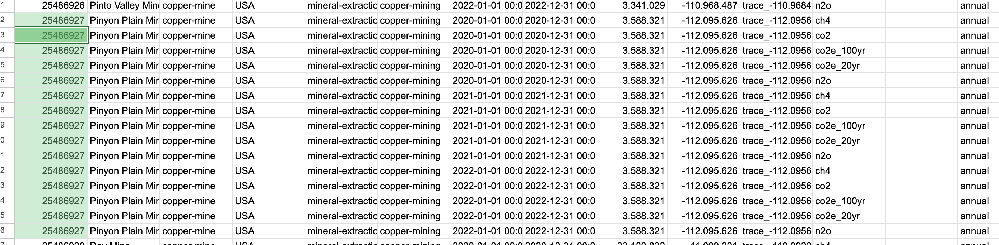

In [ ]:
# Drop rows where 'ct_emissions_quantity' is missing
climate_trace_combined_cleaned = climate_trace_combined.dropna(subset=['ct_emissions_quantity'])

## Aggregate monthly emissions data

In [ ]:
# Step 1: Convert 'ct_start_time' to datetime and extract the year
climate_trace_combined['ct_start_time'] = pd.to_datetime(climate_trace_combined['ct_start_time'], errors='coerce')

# Check for any conversion errors
if climate_trace_combined['ct_start_time'].isnull().any():
    print("Warning: Some 'ct_start_time' entries could not be converted to datetime.")

# Extract the year from 'ct_start_time'
climate_trace_combined['ct_year'] = climate_trace_combined['ct_start_time'].dt.year

# Step 2: Group by 'ct_source_id' and 'year' and count 'ct_start_time' entries
source_year_counts = climate_trace_combined.groupby(['ct_source_id', 'ct_year']).size().reset_index(name='start_time_count')

# Step 3: Identify unstable groups with multiple 'ct_start_time' entries
unstable_source_year = source_year_counts[source_year_counts['start_time_count'] > 1]

# Count the number of unstable groups
num_unstable = unstable_source_year.shape[0]

print(f"Number of (ct_source_id, ct_year) combinations with multiple ct_start_time: {num_unstable}")

# Step 4: Display a sample of unstable combinations
if num_unstable > 0:
    print("\nSample of unstable (ct_source_id, ct_year) combinations:")
    display(unstable_source_year.head(10))
else:
    print("All (ct_source_id, ct_year) combinations have stable ct_start_time.")

Number of (ct_source_id, ct_year) combinations with multiple ct_start_time: 8229

Sample of unstable (ct_source_id, ct_year) combinations:


,ct_source_id,ct_year,start_time_count
521,62267,2015,12
522,62267,2016,12
523,62267,2017,12
524,62267,2018,12
525,62267,2019,12
526,62267,2020,12
527,62267,2021,12
528,62267,2022,12
529,62267,2023,3
530,62268,2015,12


In [ ]:
display(climate_trace_combined[climate_trace_combined['ct_source_id'].astype(str).str.strip() == '62267'])

,ct_source_id,ct_source_name,ct_subsector,ct_start_time,ct_end_time,ct_lat,ct_lon,ct_gas,ct_emissions_quantity,ct_coordinate,ct_year
10174,62267,Cleveland-Cliffs Butler steel plant,steel,2015-01-01,2015-01-31 00:00:00,40.845524,-79.921452,co2e_100yr,19504.0,"(40.845524, -79.921452)",2015
10175,62267,Cleveland-Cliffs Butler steel plant,steel,2015-02-01,2015-02-28 00:00:00,40.845524,-79.921452,co2e_100yr,15591.0,"(40.845524, -79.921452)",2015
10176,62267,Cleveland-Cliffs Butler steel plant,steel,2015-03-01,2015-03-31 00:00:00,40.845524,-79.921452,co2e_100yr,16721.0,"(40.845524, -79.921452)",2015
10177,62267,Cleveland-Cliffs Butler steel plant,steel,2015-04-01,2015-04-30 00:00:00,40.845524,-79.921452,co2e_100yr,15785.0,"(40.845524, -79.921452)",2015
10178,62267,Cleveland-Cliffs Butler steel plant,steel,2015-05-01,2015-05-31 00:00:00,40.845524,-79.921452,co2e_100yr,17412.0,"(40.845524, -79.921452)",2015
...,...,...,...,...,...,...,...,...,...,...,...
10268,62267,Cleveland-Cliffs Butler steel plant,steel,2022-11-01,2022-11-30 00:00:00,40.845524,-79.921452,co2e_100yr,14809.0,"(40.845524, -79.921452)",2022
10269,62267,Cleveland-Cliffs Butler steel plant,steel,2022-12-01,2022-12-31 00:00:00,40.845524,-79.921452,co2e_100yr,15223.0,"(40.845524, -79.921452)",2022
10270,62267,Cleveland-Cliffs Butler steel plant,steel,2023-01-01,2023-01-31 00:00:00,40.845524,-79.921452,co2e_100yr,15925.0,"(40.845524, -79.921452)",2023
10271,62267,Cleveland-Cliffs Butler steel plant,steel,2023-02-01,2023-02-28 00:00:00,40.845524,-79.921452,co2e_100yr,14574.0,"(40.845524, -79.921452)",2023


We can see here that some rows have data for months of a year instead of full year emissions. This means we need to aggreate these into yearly rows and sum up their emissions

In [ ]:
print(f"Number of rows in climate_trace_combined before aggregation: {len(climate_trace_combined)}")

Number of rows in climate_trace_combined before aggregation: 363514


In [ ]:
# Define the grouping columns
group_cols = ['ct_source_id', 'ct_year']

# Perform the aggregation
annual_emissions = climate_trace_combined.groupby(group_cols).agg({
    'ct_emissions_quantity': 'sum',       # Sum emissions for the year
    'ct_source_name': 'first',
    'ct_subsector': 'first',
    'ct_lat': 'first',
    'ct_lon': 'first',
    'ct_gas': 'first',
    'ct_start_time': 'min',               # Earliest start_time of the year
    'ct_end_time': 'max',                 # Latest end_time of the year
    'ct_coordinate': 'first'
}).reset_index()


# Verify the Aggregation
# Check the number of unique (source_id, year) combinations
unique_combinations = annual_emissions.groupby(['ct_source_id', 'ct_year']).size().reset_index(name='count')
duplicates_after_agg = unique_combinations[unique_combinations['count'] > 1]

print(f"Total unique (source_id, year) combinations after aggregation: {annual_emissions.shape[0]}")
if duplicates_after_agg.empty:
    print("All (source_id, year) combinations are unique after aggregation.")
else:
    print(f"Number of duplicate (source_id, year) combinations after aggregation: {duplicates_after_agg.shape[0]}")
    display(duplicates_after_agg.head())

# Replace the original DataFrame with the aggregated annual data
climate_trace_combined = annual_emissions

Total unique (source_id, year) combinations after aggregation: 173073
All (source_id, year) combinations are unique after aggregation.


In [ ]:
print(f"Number of rows in climate_trace_combined before aggregation: {len(climate_trace_combined)}")

Number of rows in climate_trace_combined before aggregation: 173073


In [ ]:
display(climate_trace_combined[climate_trace_combined['ct_source_id'].astype(str).str.strip() == '62267'])

,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_lat,ct_lon,ct_gas,ct_start_time,ct_end_time,ct_coordinate
521,62267,2015,196713.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2015-01-01,2015-12-31 00:00:00,"(40.845524, -79.921452)"
522,62267,2016,195924.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2016-01-01,2016-12-31 00:00:00,"(40.845524, -79.921452)"
523,62267,2017,201926.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2017-01-01,2017-12-31 00:00:00,"(40.845524, -79.921452)"
524,62267,2018,202819.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2018-01-01,2018-12-31 00:00:00,"(40.845524, -79.921452)"
525,62267,2019,204503.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2019-01-01,2019-12-31 00:00:00,"(40.845524, -79.921452)"
526,62267,2020,174169.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2020-01-01,2020-12-31 00:00:00,"(40.845524, -79.921452)"
527,62267,2021,215365.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2021-01-01,2021-12-31 00:00:00,"(40.845524, -79.921452)"
528,62267,2022,195664.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2022-01-01,2022-12-31 00:00:00,"(40.845524, -79.921452)"
529,62267,2023,47199.0,Cleveland-Cliffs Butler steel plant,steel,40.845524,-79.921452,co2e_100yr,2023-01-01,2023-03-31 00:00:00,"(40.845524, -79.921452)"


We now have yearly emmissions data only

In [ ]:
# Check for proper year coverage
year_coverage = climate_trace_combined['ct_year'].value_counts().sort_index()
print(f"Year coverage:\n{year_coverage}")

Year coverage:
ct_year
2015    19643
2016    19600
2017    19614
2018    19611
2019    21874
2020    21799
2021    24574
2022    24595
2023     1763
Name: count, dtype: int64


## Add 2023 data

In [ ]:
display(climate_trace_combined.head())

,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_lat,ct_lon,ct_gas,ct_start_time,ct_end_time,ct_coordinate
0,16395,2015,220520.710059,Affinity Coal Mine,coal-mining,37.703959,-81.230477,co2e_100yr,2015-01-01,2015-12-31 00:00:00,"(37.703959, -81.230477)"
1,16395,2016,220520.710059,Affinity Coal Mine,coal-mining,37.703959,-81.230477,co2e_100yr,2016-01-01,2016-12-31 00:00:00,"(37.703959, -81.230477)"
2,16395,2017,220520.710059,Affinity Coal Mine,coal-mining,37.703959,-81.230477,co2e_100yr,2017-01-01,2017-12-31 00:00:00,"(37.703959, -81.230477)"
3,16395,2018,220520.710059,Affinity Coal Mine,coal-mining,37.703959,-81.230477,co2e_100yr,2018-01-01,2018-12-31 00:00:00,"(37.703959, -81.230477)"
4,16395,2019,220520.710059,Affinity Coal Mine,coal-mining,37.703959,-81.230477,co2e_100yr,2019-01-01,2019-12-31 00:00:00,"(37.703959, -81.230477)"


In [ ]:
# Define the folder path where Climate TRACE CSV files are stored
folder_path = "/content/drive/MyDrive/Master_Thesis/2024_Climate_TRACE_data/"

# Get all relevant Climate TRACE emissions source files
csv_files = [f for f in os.listdir(folder_path) if f.endswith("_emissions_sources.csv")]

climate_trace_data = []

# Load, filter, and clean each file
for file_name in csv_files:
    file_path = os.path.join(folder_path, file_name)
    df = pd.read_csv(file_path, low_memory=False)

    # Check and process necessary columns
    required_cols = ['source_id', 'source_name', 'subsector',
                     'start_time', 'end_time', 'lat', 'lon', 'gas', 'emissions_quantity']

    if all(col in df.columns for col in required_cols):
        df = df[required_cols]

        # Fix lat/lon format if needed
        df['lat'] = df['lat'].astype(str).str.replace(',', '.')
        df['lon'] = df['lon'].astype(str).str.replace(',', '.')
        df['lat'] = pd.to_numeric(df['lat'], errors='coerce')
        df['lon'] = pd.to_numeric(df['lon'], errors='coerce')

        # Filter to CO2e 100-year GWP
        df = df[df['gas'] == 'co2e_100yr']

        # Convert to datetime and extract year
        df['start_time'] = pd.to_datetime(df['start_time'], errors='coerce')
        df['year'] = df['start_time'].dt.year

        climate_trace_data.append(df)
    else:
        print(f"Missing required columns in {file_name}, skipping.")

# Combine all filtered Climate TRACE data
climate_trace_2023 = pd.concat(climate_trace_data, ignore_index=True)

# Aggregate to yearly total per source
climate_trace_2023 = (
    climate_trace_2023
    .groupby(['source_id', 'source_name', 'subsector', 'lat', 'lon', 'year'], as_index=False)
    .agg({'emissions_quantity': 'sum'})
)

# Add coordinate column
climate_trace_2023['ct_coordinate'] = list(zip(climate_trace_2023['lat'], climate_trace_2023['lon']))

# Rename columns for consistency
climate_trace_2023.rename(columns={
    'year': 'ct_year',
    'source_id': 'ct_source_id',
    'source_name': 'ct_source_name',
    'subsector': 'ct_subsector',
    'emissions_quantity': 'ct_emissions_quantity',
    'lat': 'ct_lat',
    'lon': 'ct_lon'
}, inplace=True)

# Filter the DataFrame to include only rows where 'ct_year' is 2021, 2022, or 2023
climate_trace_2023 = climate_trace_2023[climate_trace_2023['ct_year'].isin([2021, 2022, 2023])]
print(len(climate_trace_2023))

# Optional: display preview
display(climate_trace_2023.head())

83102


,ct_source_id,ct_source_name,ct_subsector,ct_lat,ct_lon,ct_year,ct_emissions_quantity,ct_coordinate
0,110,Edge Moor,electricity-generation,39.7412,-75.5055,2021,2091100.0,"(39.7412, -75.5055)"
1,110,Edge Moor,electricity-generation,39.7412,-75.5055,2022,2214500.0,"(39.7412, -75.5055)"
2,110,Edge Moor,electricity-generation,39.7412,-75.5055,2023,2337800.0,"(39.7412, -75.5055)"
5,818,Hibbing,electricity-generation,47.4294,-92.9350,2021,136250.0,"(47.4294, -92.935)"
6,818,Hibbing,electricity-generation,47.4294,-92.9350,2022,130650.0,"(47.4294, -92.935)"


In [ ]:
# Kombiniere die bisherigen Climate TRACE Daten mit den neuen aus 2021–2023
climate_trace_combined = pd.concat(
    [climate_trace_combined, climate_trace_2023],
    ignore_index=True
)

# Optional: Prüfung, ob alles zusammengefügt wurde
print(f"Gesamtanzahl Einträge nach Zusammenführung: {len(climate_trace_combined)}")
display(climate_trace_combined.tail())

Gesamtanzahl Einträge nach Zusammenführung: 256175


,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_lat,ct_lon,ct_gas,ct_start_time,ct_end_time,ct_coordinate
256170,38904840,2022,53.158216,"Indian Point,NY",domestic-shipping,41.269798,-73.954291,NaN,NaT,NaN,"(41.269798, -73.954291)"
256171,38904840,2023,67.937175,"Indian Point,NY",domestic-shipping,41.269798,-73.954291,NaN,NaT,NaN,"(41.269798, -73.954291)"
256172,38905029,2021,286.272039,"Nopetro LNG Terminal,Port St Joe,FL",domestic-shipping,29.818082,-85.314331,NaN,NaT,NaN,"(29.818082, -85.314331)"
256173,38905041,2022,102.354217,Unknown name,domestic-shipping,42.978900,-107.522400,NaN,NaT,NaN,"(42.9789, -107.5224)"
256174,38914575,2021,1819.388197,Unknown name,domestic-shipping,39.298500,-111.635100,NaN,NaT,NaN,"(39.2985, -111.6351)"


In [ ]:
# Prozentualer Anteil fehlender Werte
nan_percentage = (climate_trace_combined.isna().mean() * 100).round(2)
print("\nProzentualer Anteil fehlender Werte pro Spalte:\n")
print(nan_percentage)


Prozentualer Anteil fehlender Werte pro Spalte:

ct_source_id              0.00
ct_year                   0.00
ct_emissions_quantity     0.00
ct_source_name            0.11
ct_subsector              0.00
ct_lat                    0.15
ct_lon                    0.15
ct_gas                   32.44
ct_start_time            32.44
ct_end_time              32.44
ct_coordinate             0.00
dtype: float64


# Define a broad category mapping between GHGRP and CT data




In [ ]:
# Count rows per ct_year in climate_trace_combined
rows_per_year_climate_trace = climate_trace_combined.groupby('ct_year').size()
print("Number of rows per ct_year in climate_trace_combined:\n", rows_per_year_climate_trace)

# Assuming 'ghgrp_year' exists in ghgrp_combined (replace with actual column name if different)
# Count rows per ghgrp_year in ghgrp_combined
rows_per_year_ghgrp = ghgrp_combined.groupby('ghgrp_year').size() #replace ghgrp_year with your actual column name
print("\nNumber of rows per ghgrp_year in ghgrp_combined:\n", rows_per_year_ghgrp)

Number of rows per ct_year in climate_trace_combined:
 ct_year
2015    19643
2016    19600
2017    19614
2018    19611
2019    21874
2020    21799
2021    52245
2022    52329
2023    29460
dtype: int64

Number of rows per ghgrp_year in ghgrp_combined:
 ghgrp_year
2015    7983
2016    7643
2017    7569
2018    7676
2019    7683
2020    7643
2021    7615
2022    7546
2023    7511
dtype: int64


In [ ]:
# Define broad category mappings for `ghgrp_subparts`
ghgrp_broad_category_mapping = {
    # Manufacturing
    "Iron and Steel Production": ["Manufacturing"],
    "Glass Production": ["Manufacturing"],
    "Cement Production": ["Manufacturing"],
    "Pulp and Paper Manufacturing": ["Manufacturing"],
    "Lime Manufacturing": ["Manufacturing"],
    "Ammonia Manufacturing": ["Manufacturing"],
    "Petrochemical Production": ["Manufacturing"],
    "Hydrogen Production": ["Manufacturing"],
    "Aluminum Production": ["Manufacturing"],
    "Electronics Manufacturing": ["Manufacturing"],
    "Silicon Carbide Production": ["Manufacturing"],
    "Soda Ash Manufacturing": ["Manufacturing"],
    "Titanium Dioxide Production": ["Manufacturing"],
    "Manufacture of Electric Transmission and Distribution Equipment": ["Manufacturing"],
    "Lead Production": ["Manufacturing"],
    "Phosphoric Acid Production": ["Manufacturing"],
    "Nitric Acid Production": ["Manufacturing"],
    "Ferroalloy Production": ["Manufacturing"],
    "Zinc Production": ["Manufacturing"],
    "Magnesium Production": ["Manufacturing"],
    "Adipic Acid Production": ["Manufacturing"],

    # Mineral Extraction
    "Underground Coal Mines": ["Mineral Extraction"],

    # Power
    "Electricity Generation": ["Power"],

    # Transportation
    "Road Transportation": ["Transportation"],
    "Domestic Aviation": ["Transportation"],
    "International Aviation": ["Transportation"],

    # Waste
    "Municipal Solid Waste Landfills": ["Waste"],
    "Industrial Waste Landfills": ["Waste"],
    "Industrial Wastewater Treatment": ["Waste"],

    # Fossil Fuel Operations & Fluorinated Gases
    "Petroleum and Natural Gas Systems": ["Fossil fuel operations & Fluorinated Gases"],

    # "Other"
    "Geologic Sequestration of Carbon Dioxide": ["Other"],
    "Use of Electric Transmission and Distribution Equipment": ["Other"],
    "Importers and Exporters of Equipment Pre-Charged with Fluorinated GHGs or Containing Fluorinated GHGs in Closed-Cell Foams": ["Other"],
    "HCFC-22 Production and HFC-23 Destruction": ["Other"],
    "Injection of Carbon Dioxide": ["Other"],
    "Fluorinated Gas Production": ["Other"],
    "Petroleum Refineries": ["Other"],  # Might fit fossil fuels, but structure is very mixed in GHGRP
    "Suppliers of Natural Gas and Natural Gas Liquids": ["Other"],
    "Suppliers of Petroleum Products": ["Other"],
    "Suppliers of Coal-based Liquid Fuels": ["Other"],
    "Suppliers of Carbon Dioxide": ["Other"],
    "Suppliers of Industrial Greenhouse Gases": ["Other"],
    "Miscellaneous Uses of Carbonate": ["Other"],
    "General Stationary Fuel Combustion Sources": ["Other"]
}

# Define broad category mappings for `ct_subsector`
ct_broad_category_mapping = {
    # Fossil Fuel Operations
    "oil-and-gas-production": ["Fossil fuel operations & Fluorinated Gases"],
    "oil-and-gas-transport": ["Fossil fuel operations & Fluorinated Gases"],
    "oil-and-gas-refining": ["Fossil fuel operations & Fluorinated Gases"],

    # Manufacturing
    "aluminum": ["Manufacturing"],
    "petrochemical-steam-cracking": ["Manufacturing"],
    "iron-and-steel": ["Manufacturing"],
    "cement": ["Manufacturing"],
    "lime": ["Manufacturing"],
    "other-metals": ["Manufacturing"],
    "other-manufacturing": ["Manufacturing"],

    # Other:
    "chemicals": ["Other"],  # Too broad; includes GHG-relevant and irrelevant subsectors
    "other-chemicals": ["Other"],  # Unclear classification
    "textiles-leather-apparel": ["Other"],  # Often minor GHG source; if relevant, likely indirect

    # Mineral Extraction
    "coal-mining": ["Mineral Extraction"],
    "copper-mining": ["Mineral Extraction"],
    "iron-mining": ["Mineral Extraction"],

    # Power
    "electricity-generation": ["Power"],

    # Transportation
    "road-transportation": ["Transportation"],
    "international-aviation": ["Transportation"],
    "domestic-aviation": ["Transportation"],
    "domestic-shipping": ["Transportation"],
    "international-shipping": ["Transportation"],

    # Waste
    "solid-waste-disposal": ["Waste"],
    "industrial-wastewater-treatment-and-discharge": ["Waste"],
    "domestic-wastewater-treatment-and-discharge": ["Waste"]
}

# Mapping functions
def map_ghgrp_broad_category(subparts):
    categories = set()
    for subpart in subparts.split(','):
        categories.update(ghgrp_broad_category_mapping.get(subpart.strip(), []))
    return ', '.join(sorted(categories))

def map_ct_broad_category(subsector):
    return ', '.join(ct_broad_category_mapping.get(subsector.strip(), []))

# Map the broad categories
ghgrp_combined['ghgrp_broad_category'] = ghgrp_combined['ghgrp_subparts'].apply(map_ghgrp_broad_category)
climate_trace_combined['ct_broad_category'] = climate_trace_combined['ct_subsector'].apply(map_ct_broad_category)

# Display results to verify
print("Sample of GHGRP broad categories:")
display(ghgrp_combined[['ghgrp_subparts', 'ghgrp_broad_category']].head())

print("Sample of Climate TRACE broad categories:")
display(climate_trace_combined[['ct_subsector', 'ct_broad_category']].head())

Sample of GHGRP broad categories:


,ghgrp_subparts,ghgrp_broad_category
0,Petroleum and Natural Gas Systems,Fossil fuel operations & Fluorinated Gases
1,Municipal Solid Waste Landfills,Waste
2,Underground Coal Mines,Mineral Extraction
3,Underground Coal Mines,Mineral Extraction
4,Petroleum and Natural Gas Systems,Fossil fuel operations & Fluorinated Gases


Sample of Climate TRACE broad categories:


,ct_subsector,ct_broad_category
0,coal-mining,Mineral Extraction
1,coal-mining,Mineral Extraction
2,coal-mining,Mineral Extraction
3,coal-mining,Mineral Extraction
4,coal-mining,Mineral Extraction


# Matching facility level emission data by coordinates

In [ ]:
# Convert 'ghgrp_coordinate' and 'ct_coordinate' columns to tuples if they are not already
# This will ensure they're formatted correctly for distance calculations
if ghgrp_combined['ghgrp_coordinate'].dtype == 'object':
    ghgrp_combined['ghgrp_coordinate'] = ghgrp_combined['ghgrp_coordinate'].apply(
        lambda x: eval(x) if isinstance(x, str) else x
    )

if climate_trace_combined['ct_coordinate'].dtype == 'object':
    climate_trace_combined['ct_coordinate'] = climate_trace_combined['ct_coordinate'].apply(
        lambda x: eval(x) if isinstance(x, str) else x
    )

# Check for any NaN values in critical matching columns
print("GHGRP Data NaN check for matching columns:")
print(ghgrp_combined[['ghgrp_year', 'ghgrp_latitude', 'ghgrp_longitude']].isnull().sum())

print("\nClimate TRACE Data NaN check for matching columns:")
print(climate_trace_combined[['ct_year', 'ct_lat', 'ct_lon']].isnull().sum())

GHGRP Data NaN check for matching columns:
ghgrp_year         0
ghgrp_latitude     0
ghgrp_longitude    0
dtype: int64

Climate TRACE Data NaN check for matching columns:
ct_year      0
ct_lat     382
ct_lon     382
dtype: int64


In [ ]:
# Define the distance thresholds in kilometers
distance_thresholds = [0.005, 0.01, 0.015, 0.02, 0.025, 0.03, 0.035, 0.04, 0.045, 0.05, 0.075, 0.1, 0.5, 1.0]  # 5m, 10m, 15m, 20m, 25m, 30m, 35m, 40m, 45m, 50m, 75m, 100m, 500m, 1000m

# Iterate over each distance threshold
for threshold_km in distance_thresholds:
    print(f"\nRunning coordinate-based matching for threshold: {threshold_km * 1000:.0f} meters")

    # Define the path to save results for the current threshold
    coordinate_matches_file = f"/content/drive/MyDrive/Master_Thesis/2015-2023_coordinate_matches_{int(threshold_km * 1000)}m.pkl"

    if os.path.exists(coordinate_matches_file):
        # Load existing coordinate-based matches from file
        with open(coordinate_matches_file, 'rb') as file:
            matches = pickle.load(file)
        print(f"Loaded existing coordinate-based matches for {threshold_km * 1000:.0f} meters.")
        matched_df = pd.DataFrame(matches)
    else:
        # Initialize a list to store matches and matched indices
        matches = []
        matched_indices = set()

        # Loop through each year for matching
        for year in ghgrp_combined['ghgrp_year'].unique():
            ghgrp_year_data = ghgrp_combined[ghgrp_combined['ghgrp_year'] == year]
            climate_trace_year_data = climate_trace_combined[
                (climate_trace_combined['ct_year'] == year) &
                (~climate_trace_combined['ct_lat'].isna()) &
                (~climate_trace_combined['ct_lon'].isna())
            ].copy()

            # Build a k-d tree for Climate TRACE coordinates
            climate_trace_coords = np.array(climate_trace_year_data[['ct_lat', 'ct_lon']])
            climate_tree = cKDTree(climate_trace_coords)

            # Loop through GHGRP facilities and find the nearest Climate TRACE matches
            for i, ghgrp_row in tqdm(ghgrp_year_data.iterrows(), total=ghgrp_year_data.shape[0], desc=f"Matching year {year}"):
                ghgrp_coord = np.array(ghgrp_row['ghgrp_coordinate'])
                ghgrp_facility_name = ghgrp_row['ghgrp_facility_name']
                ghgrp_broad_categories = set(ghgrp_row['ghgrp_broad_category'].split(', '))

                # Query all Climate TRACE facilities within the threshold
                distances, indices = climate_tree.query(ghgrp_coord, k=len(climate_trace_coords), distance_upper_bound=threshold_km)

                # Filter for valid distances and create a new DataFrame
                valid_matches = climate_trace_year_data.iloc[indices[np.isfinite(distances)]].copy()
                valid_matches['distance'] = distances[np.isfinite(distances)]

                # Filter by category overlap
                valid_matches = valid_matches[
                    valid_matches['ct_broad_category'].apply(
                        lambda x: not ghgrp_broad_categories.isdisjoint(set(x.split(', ')))
                    ) | (ghgrp_broad_categories == {"Other"})
                ].copy()  # Ensure this is a fresh copy

                if not valid_matches.empty:
                    # Add name similarity scores
                    valid_matches['name_similarity'] = valid_matches['ct_source_name'].apply(
                        lambda x: fuzz.ratio(ghgrp_facility_name, x)
                    )

                    # Sort by combined score (prioritize name similarity and distance)
                    valid_matches['combined_score'] = (
                        0.5 * (1 - valid_matches['distance'] / threshold_km) +
                        0.5 * (valid_matches['name_similarity'] / 100)
                    )

                    # Sort valid matches and select the best one
                    valid_matches = valid_matches.sort_values(by='combined_score', ascending=False)

                    # Take the best match
                    best_match = valid_matches.iloc[0]
                    match = ghgrp_row.to_dict()
                    for col in valid_matches.columns:
                        match[col] = best_match[col]
                    matches.append(match)
                    matched_indices.add(best_match.name)

        # Save matches for this threshold
        with open(coordinate_matches_file, 'wb') as file:
            pickle.dump(matches, file)
        print(f"Matches for {threshold_km * 1000:.0f} meters saved.")


Running coordinate-based matching for threshold: 5 meters
Loaded existing coordinate-based matches for 5 meters.

Running coordinate-based matching for threshold: 10 meters
Loaded existing coordinate-based matches for 10 meters.

Running coordinate-based matching for threshold: 15 meters
Loaded existing coordinate-based matches for 15 meters.

Running coordinate-based matching for threshold: 20 meters
Loaded existing coordinate-based matches for 20 meters.

Running coordinate-based matching for threshold: 25 meters
Loaded existing coordinate-based matches for 25 meters.

Running coordinate-based matching for threshold: 30 meters
Loaded existing coordinate-based matches for 30 meters.

Running coordinate-based matching for threshold: 35 meters
Loaded existing coordinate-based matches for 35 meters.

Running coordinate-based matching for threshold: 40 meters
Loaded existing coordinate-based matches for 40 meters.

Running coordinate-based matching for threshold: 45 meters
Loaded existin

In [ ]:
# Initialize a dictionary to store each threshold's DataFrame
matched_dfs = {}

# Load each matched dataset
for threshold_km in distance_thresholds:
    # Define the path for the pickled matched data
    file_path = f"/content/drive/MyDrive/Master_Thesis/2015-2023_coordinate_matches_{int(threshold_km * 1000)}m.pkl"

    # Load the DataFrame directly from the pickled file
    with open(file_path, 'rb') as file:
        matches = pickle.load(file)
    matched_df = pd.DataFrame(matches)
    matched_dfs[f"{int(threshold_km * 1000)}m"] = matched_df

# Fuzzy matching for rows that have not found a match so far

In [ ]:
# Define the path to save and load fuzzy match results
fuzzy_matches_file = "/content/drive/MyDrive/Master_Thesis/fuzzy_matches.pkl"

# Step 1: Check if fuzzy matches file exists
if os.path.exists(fuzzy_matches_file):
    # Load existing fuzzy matches from file
    with open(fuzzy_matches_file, 'rb') as file:
        fuzzy_matches = pickle.load(file)
    print("Loaded existing fuzzy matches from file.")
else:
    # Step 2: Identify unmatched rows in GHGRP and Climate TRACE
    matched_ghgrp_indices = {match['ghgrp_id'] for match in matches}  # GHGRP matched indices
    matched_ct_indices = {match['ct_source_id'] for match in matches}  # Climate TRACE matched indices

    unmatched_ghgrp = ghgrp_combined[~ghgrp_combined['ghgrp_id'].isin(matched_ghgrp_indices)]
    unmatched_ct = climate_trace_combined[~climate_trace_combined['ct_source_id'].isin(matched_ct_indices)]

    # Step 3: Load and merge ownership data into Climate TRACE
    ownership_file_path = "/content/drive/MyDrive/Master_Thesis/Climate_TRACE_data/oil-and-gas-production-and-transport_emissions_sources_ownership.csv"
    ownership_df = pd.read_csv(ownership_file_path, low_memory=False)

    # Rename columns in ownership data for consistent merging
    ownership_df = ownership_df.rename(columns={
        'source_name': 'ct_source_name',
        'company_name': 'ct_ownership',  # Name used in Climate TRACE for matching
        'end_date': 'ct_end_time'
    })

    # Merge ownership data into unmatched Climate TRACE data
    unmatched_ct = pd.merge(
        unmatched_ct,
        ownership_df[['ct_source_name', 'ct_ownership', 'source_id', 'ct_end_time']],
        how='left',
        left_on=['ct_source_id', 'ct_end_time'],
        right_on=['source_id', 'ct_end_time']
    )

    # Resolve column naming conflicts after merge
    unmatched_ct['ct_source_name'] = unmatched_ct['ct_source_name_x'].combine_first(unmatched_ct['ct_source_name_y'])
    unmatched_ct = unmatched_ct.drop(columns=['ct_source_name_x', 'ct_source_name_y', 'source_id'])

    # Step 4: Perform Fuzzy Matching on Names and Ownership
    fuzzy_matches = []
    for i, ghgrp_row in tqdm(unmatched_ghgrp.iterrows(), total=unmatched_ghgrp.shape[0], desc="Fuzzy matching"):
        ghgrp_name = str(ghgrp_row['ghgrp_facility_name'])
        ghgrp_company = str(ghgrp_row['ghgrp_parent_companies'])
        ghgrp_year = ghgrp_row['ghgrp_year']

        # Filter unmatched CT data for the same year
        ct_year_data = unmatched_ct[unmatched_ct['ct_year'] == ghgrp_year]

        # Use fuzzy matching to find the best match for the facility name
        if not ct_year_data.empty:
            best_match_name, best_score_name = process.extractOne(ghgrp_name, ct_year_data['ct_source_name'].tolist(), scorer=fuzz.token_set_ratio)

            # Filter for the best name match and compare ownership
            if best_score_name > 70:
                ct_best_match_row = ct_year_data[ct_year_data['ct_source_name'] == best_match_name].iloc[0]
                ct_company = str(ct_best_match_row.get('ct_ownership', ''))
                company_similarity = fuzz.token_set_ratio(ghgrp_company, ct_company)
                combined_score = (best_score_name + company_similarity) / 2

                # Consider match only if combined score is above threshold
                if combined_score > 70:
                    # Combine both rows into a single dictionary, including all columns from both dataframes
                    match = {**ghgrp_row.to_dict(), **ct_best_match_row.to_dict(), 'similarity_score': combined_score}
                    fuzzy_matches.append(match)

                    # Mark this Climate TRACE row as matched to avoid duplicates
                    unmatched_ct = unmatched_ct.drop(ct_best_match_row.name)

    # Step 5: Save the fuzzy matches to a file
    with open(fuzzy_matches_file, 'wb') as file:
        pickle.dump(fuzzy_matches, file)
    print("Fuzzy matches have been saved to file.")

# Convert fuzzy_matches to a DataFrame for further analysis or merging
fuzzy_matches_df = pd.DataFrame(fuzzy_matches)
display(fuzzy_matches_df.head())

Loaded existing fuzzy matches from file.


,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,...,ct_iso3_country,ct_lat,ct_lon,ct_gas,ct_start_time,ct_end_time,ct_coordinate,ct_ownership,ct_source_name,similarity_score
0,2015,"EPNG Station 6399 Black River, TX",1012153,NaN,30.744447,-102.491284,Fort Stockton,PECOS COUNTY,TX,79735,...,USA,33.620574,-95.049944,co2e_100yr,2015-01-01,2015-12-31 00:00:00,"(33.62057435270091, -95.04994365356008)",NaN,Red River,85.5
1,2015,Elk Station,1012043,1454 County Road 315,33.861807,-101.843823,Abernathy,HALE COUNTY,TX,79311,...,USA,37.453616,-96.244365,co2e_100yr,2015-01-01,2015-12-31 00:00:00,"(37.45361554718224, -96.24436523137376)",NaN,Elk,100.0
2,2015,Faith San Pedro Compressor Station,1011105,23665 Faith Ranch Road,28.263946,-100.021955,Carrizo Springs,DIMMIT COUNTY,TX,78834,...,USA,37.702820,-120.419017,co2e_100yr,2015-01-01,2015-12-31 00:00:00,"(37.70282, -120.419017)",NaN,Don Pedro,85.5
3,2015,Kemper County,1001179,221 MARK COBB RD,32.797600,-88.605700,DE KALB,Kemper,MS,39328,...,USA,32.753544,-88.640733,co2e_100yr,2015-01-01,2015-12-31 00:00:00,"(32.753543982789154, -88.64073300858284)",NaN,Kemper,100.0
4,2015,Matador Production Company - Permian Basin,1012068,"5400 LBJ Freeway, Suite 1500",32.924583,-96.816715,Dallas,NaN,TX,75240,...,USA,NaN,NaN,co2e_100yr,2015-01-01,2015-12-31 00:00:00,"(nan, nan)",NaN,Permian NM,91.0


In [ ]:
# Calculate the total number of rows in ghgrp_combined by year
total_ghgrp_by_year = ghgrp_combined.groupby('ghgrp_year').size()

# Calculate the number of fuzzy matches found by year
matched_ghgrp_by_year_fuzzy = fuzzy_matches_df['ghgrp_year'].value_counts()

# Calculate the percentage of fuzzy matches for each year
fuzzy_match_percentage_by_year = (matched_ghgrp_by_year_fuzzy / total_ghgrp_by_year * 100).round(2)

# Combine into a DataFrame for easy viewing
fuzzy_match_summary = pd.DataFrame({
    'Total GHGRP Rows': total_ghgrp_by_year,
    'Fuzzy Matched Rows': matched_ghgrp_by_year_fuzzy,
    'Fuzzy Match Percentage (%)': fuzzy_match_percentage_by_year
}).fillna(0)  # Fill NaN with 0 for years with no matches

# Display the fuzzy match summary by year
display(fuzzy_match_summary)

,Total GHGRP Rows,Fuzzy Matched Rows,Fuzzy Match Percentage (%)
ghgrp_year,,,
2015,7983,20.0,0.25
2016,7643,8.0,0.10
2017,7569,1.0,0.01
2018,7676,0.0,0.00
2019,7683,0.0,0.00
2020,7643,0.0,0.00
2021,7615,0.0,0.00
2022,7546,9.0,0.12
2023,7511,0.0,0.00


In [ ]:
print(fuzzy_matches_df.shape[0])

38


In [ ]:
# Adding distance to the matches where possible for better evaluation

# Define a function to calculate the Haversine distance
def haversine(coord1, coord2):
    # Radius of Earth in kilometers
    R = 6371.0

    # Unpack latitude/longitude from coordinates
    lat1, lon1 = coord1
    lat2, lon2 = coord2

    # Convert degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])

    # Compute differences
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    # Haversine formula
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    distance = R * c
    return distance

# Apply the distance calculation to rows with both coordinates available
fuzzy_matches_df['distance'] = fuzzy_matches_df.apply(
    lambda row: haversine(row['ghgrp_coordinate'], row['ct_coordinate'])
    if pd.notnull(row['ghgrp_coordinate']) and pd.notnull(row['ct_coordinate'])
    else np.nan,  # Set distance to NaN if coordinates are missing
    axis=1
)

## Manually confirming fuzzy matches

**Manual** confirmation using the web interfaces for [GHGRP](https://ghgdata.epa.gov/ghgp/main.do#/listFacility/?q=Ascent%20Resources%20-%20Utica%20(160a)&st=&bs=&et=&fid=&sf=10000100&lowE=-20000&highE=23000000&g1=1&g2=1&g3=1&g4=1&g5=1&g6=0&g7=1&g8=1&g9=1&g10=1&g11=1&g12=1&s1=1&s2=1&s3=1&s4=1&s5=1&s6=1&s7=1&s8=1&s9=1&s10=1&s201=1&s202=1&s203=1&s204=1&s301=1&s302=1&s303=1&s304=1&s305=1&s306=1&s307=1&s401=1&s402=1&s403=1&s404=1&s405=1&s601=1&s602=1&s701=1&s702=1&s703=1&s704=1&s705=1&s706=1&s707=1&s708=1&s709=1&s710=1&s711=1&s801=1&s802=1&s803=1&s804=1&s805=1&s806=1&s807=1&s808=1&s809=1&s810=1&s901=1&s902=1&s903=1&s904=1&s905=1&s906=1&s907=1&s908=1&s909=1&s910=1&s911=1&si=&ss=&so=0&ds=E&yr=2015&tr=current&cyr=2015&ol=0&sl=0&rs=ALL) and [CT](https://climatetrace.org/explore/#admin=&gas=co2e&year=2022&timeframe=100&sector=&asset=) as the latter offers more information, namely coordinates, online

In [ ]:
# Sort by similarity_score in descending order
fuzzy_matches_df_sorted = fuzzy_matches_df.sort_values(by='similarity_score', ascending=False)

# Display the selected columns with the new distance column, ordered by similarity_score
display(fuzzy_matches_df_sorted[['ghgrp_id', 'ghgrp_year', 'ghgrp_facility_name', 'ghgrp_parent_companies',
                                 'ct_source_name', 'ct_subsector', 'ct_ownership', 'distance', 'similarity_score']])

,ghgrp_id,ghgrp_year,ghgrp_facility_name,ghgrp_parent_companies,ct_source_name,ct_subsector,ct_ownership,distance,similarity_score
1,1012043,2015,Elk Station,NaN,Elk,wetland-fires,NaN,644.330606,100.0
3,1001179,2015,Kemper County,NaN,Kemper,forest-land-clearing,NaN,5.892879,100.0
10,1012039,2015,Saint Francis Hospital,NaN,FRANCIS,wastewater-treatment-and-discharge,NaN,1429.127623,100.0
11,1012077,2015,SandRidge 545 North Park Basin,NaN,Park,wetland-fires,NaN,1435.924850,100.0
7,1012163,2015,New York State Electric and Gas,NaN,New York,wetland-fires,NaN,99.710867,100.0
6,1003756,2015,Naval Medical Center San Diego,NaN,San Diego,wetland-fires,NaN,51.569627,100.0
18,1012060,2015,White Rock Oil & Gas LLC - 230 ArkLa,NaN,Rock,wetland-fires,NaN,1079.231400,100.0
26,1010745,2016,U.S. Air Force JBSA Fort Sam Houston,NaN,Houston,wetland-fires,NaN,356.141746,100.0
33,1013601,2022,Blackbeard Operating - 345 - Arkoma Basin,BLACKBEARD OPERATING LLC (100%),Arkoma,oil-and-gas-production-and-transport,Blackbeard Operating,NaN,100.0
32,1013230,2022,BCE-Mach III Midstream Holding LLC (Boosters -...,BCE-MACH III LLC (100%),Anadarko,oil-and-gas-production-and-transport,BCE-Mach LLC,NaN,100.0


In [ ]:
# IDs of valid matches
valid_fuzzy_matches_ghgrp_id = [1011454, 1013230, 1013601, 1013845, 1012068, 1011393, 1012437, 1012731, 1012797, 1014226]

In [ ]:
# Drop all rowsfrom fuzzy_matches_df where the ghgrp_id is not in valid_fuzzy_matches_ghgrp_id

fuzzy_matches_df = fuzzy_matches_df[fuzzy_matches_df['ghgrp_id'].isin(valid_fuzzy_matches_ghgrp_id)]

# Combine two matched dataframes

In [ ]:
print(fuzzy_matches_df.shape[0])

10


In [ ]:
print(matched_df.shape[0])

49444


In [ ]:
# Define the list of distance thresholds
distance_thresholds = [10, 25, 50, 100, 1000]  # Distance thresholds in meters

# Loop over each threshold and process the corresponding coordinate match file
for threshold in distance_thresholds:
    # Load the coordinate-based match DataFrame for the current threshold
    coord_match_file = f"/content/drive/MyDrive/Master_Thesis/2015-2023_matched_data_{threshold}m.pkl"
    if os.path.exists(coord_match_file):
        with open(coord_match_file, 'rb') as file:
            matches = pickle.load(file)
        matched_df = pd.DataFrame(matches)
        print(f"Loaded coordinate-based matches for {threshold}m.")

        # Step 1: Check for overlaps in `ghgrp_id` and `ghgrp_year` between fuzzy and coordinate matches
        overlap_fuzzy = fuzzy_matches_df[['ghgrp_id', 'ghgrp_year']]
        overlap_coord = matched_df[['ghgrp_id', 'ghgrp_year']]

        # Find overlapping rows in both DataFrames
        overlap = pd.merge(overlap_fuzzy, overlap_coord, on=['ghgrp_id', 'ghgrp_year'], how='inner')

        # Display overlapping rows if any exist
        if not overlap.empty:
            print(f"Warning: Overlapping rows found in both fuzzy and {threshold}m coordinate matches:")
            display(overlap)
        else:
            print(f"No overlaps found for the {threshold}m coordinate matches. Proceeding with the merge.")

        # Step 2: Remove overlaps to avoid duplication
        fuzzy_matches_df_non_overlap = fuzzy_matches_df[~fuzzy_matches_df.set_index(['ghgrp_id', 'ghgrp_year']).index.isin(overlap.set_index(['ghgrp_id', 'ghgrp_year']).index)]
        matched_df_non_overlap = matched_df[~matched_df.set_index(['ghgrp_id', 'ghgrp_year']).index.isin(overlap.set_index(['ghgrp_id', 'ghgrp_year']).index)]

        # Step 3: Combine the unique rows from both DataFrames
        final_combined_df = pd.concat([fuzzy_matches_df_non_overlap, matched_df_non_overlap], ignore_index=True)

        # Save the combined DataFrame for this threshold
        output_file = f"/content/drive/MyDrive/Master_Thesis/2015-2023_final_combined_{threshold}m.pkl"
        with open(output_file, 'wb') as file:
            pickle.dump(final_combined_df, file)
        print(f"Final combined DataFrame for {threshold}m saved to {output_file}")

        # Optional: Display the combined DataFrame for verification
        display(final_combined_df)
    else:
        print(f"Coordinate match file for {threshold}m does not exist.")

Coordinate match file for 10m does not exist.
Coordinate match file for 25m does not exist.
Coordinate match file for 50m does not exist.
Coordinate match file for 100m does not exist.
Coordinate match file for 1000m does not exist.


# Clean the result

In [ ]:
# Define the columns to drop
columns_to_drop = [
    'ghgrp_latitude', 'ghgrp_longitude', 'ct_iso3_country', 'ct_lat', 'ct_lon',
    'ct_gas', 'ct_start_time', 'ct_end_time', 'ct_ownership'
]

# Initialize a dictionary to store cleaned DataFrames
cleaned_dfs = {}

# Loop through each threshold DataFrame, drop columns, and check null values
for threshold_label, df in matched_dfs.items():
    # Create a copy to avoid modifying the original matched_dfs
    df_cleaned = df.drop(columns=columns_to_drop, errors='ignore')

    # Store the cleaned DataFrame in the dictionary
    cleaned_dfs[threshold_label] = df_cleaned

    # Display the DataFrame after dropping columns
    print(f"\nDataFrame for threshold {threshold_label} after dropping columns:")
    display(df_cleaned)

    # Loop through each column and print the percentage of null values
    print(f"\nNull value percentages for threshold {threshold_label}:")
    for column in df_cleaned.columns:
        null_percentage = df_cleaned[column].isnull().mean() * 100
        print(f"Column '{column}' has {null_percentage:.2f}% null values.")


DataFrame for threshold 5m after dropping columns:


,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
1,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.866485
2,2015,3M Cottage Grove Center - Site,1004836,10746 Innovation Rd,Cottage Grove,Washington County,MN,55016,3M,45416,...,3192392,2015,3.067302e+04,3M Cottage Grove Center - Site,other-manufacturing,"(44.789444, -92.908333)",Manufacturing,0.000000,100.000000,1.000000
3,2015,3M MAGNETIC TAPE MANUFACTURING DIVISION,1004914,905-915 ADAMS STREET SOUTHEAST,HUTCHINSON,Mcleod County,MN,55350,3M,36317,...,3192393,2015,3.891980e+04,3M MAGNETIC TAPE MANUFACTURING DIVISION,other-manufacturing,"(44.879677, -94.359598)",Manufacturing,0.000000,100.000000,1.000000
4,2015,3M NEVADA PLANT,1004804,2120 E. AUSTIN,NEVADA,Vernon County,MO,64772,3M,31007,...,3192394,2015,3.100945e+04,3M NEVADA PLANT,other-manufacturing,"(37.834476, -94.330625)",Manufacturing,0.000000,100.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20432,2023,Yucca Power Plant,1001424,7522 S SOMERTON AVE,YUMA,Yuma County,AZ,85364,PINNACLE WEST CAPITAL CORP; IMPERIAL IRRIGATIO...,149196,...,25449447,2023,5.399100e+05,Yucca,electricity-generation,"(32.7214, -114.7106)",Power,0.000900,45.454545,0.637273
20433,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.148772
20434,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.856822
20435,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 5m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.47% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.01% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null va

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
1,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.933243
2,2015,3M Cottage Grove Center - Site,1004836,10746 Innovation Rd,Cottage Grove,Washington County,MN,55016,3M,45416,...,3192392,2015,3.067302e+04,3M Cottage Grove Center - Site,other-manufacturing,"(44.789444, -92.908333)",Manufacturing,0.000000,100.000000,1.000000
3,2015,3M MAGNETIC TAPE MANUFACTURING DIVISION,1004914,905-915 ADAMS STREET SOUTHEAST,HUTCHINSON,Mcleod County,MN,55350,3M,36317,...,3192393,2015,3.891980e+04,3M MAGNETIC TAPE MANUFACTURING DIVISION,other-manufacturing,"(44.879677, -94.359598)",Manufacturing,0.000000,100.000000,1.000000
4,2015,3M NEVADA PLANT,1004804,2120 E. AUSTIN,NEVADA,Vernon County,MO,64772,3M,31007,...,3192394,2015,3.100945e+04,3M NEVADA PLANT,other-manufacturing,"(37.834476, -94.330625)",Manufacturing,0.000000,100.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23263,2023,Yucca Power Plant,1001424,7522 S SOMERTON AVE,YUMA,Yuma County,AZ,85364,PINNACLE WEST CAPITAL CORP; IMPERIAL IRRIGATIO...,149196,...,25449447,2023,5.399100e+05,Yucca,electricity-generation,"(32.7214, -114.7106)",Power,0.000900,45.454545,0.682273
23264,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.384386
23265,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.928411
23266,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 10m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.54% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.01% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
1,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.955495
2,2015,3M CO - WAUSAU DOWNTOWN,1007698,144 ROSECRANS ST,WAUSAU,Marathon County,WI,54401,3M,22927,...,3278446,2015,3.537177e+03,WAUSAU WWTP,wastewater-treatment-and-discharge,"(44.944, -89.628)",,0.011468,52.941176,0.382449
3,2015,3M COMPANY,1004206,1400 STATE DOCKS RD.,DECATUR,Morgan County,AL,35609,3M,47000,...,3192581,2015,4.026672e+04,"AlphaPET, Inc.",other-manufacturing,"(34.64162, -87.05203)",Manufacturing,0.013419,8.333333,0.094364
4,2015,3M Cottage Grove Center - Site,1004836,10746 Innovation Rd,Cottage Grove,Washington County,MN,55016,3M,45416,...,3192392,2015,3.067302e+04,3M Cottage Grove Center - Site,other-manufacturing,"(44.789444, -92.908333)",Manufacturing,0.000000,100.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25042,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.462924
25043,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.241881
25044,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.952274
25045,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 15m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.58% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.01% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
1,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.966621
2,2015,3M CO - WAUSAU DOWNTOWN,1007698,144 ROSECRANS ST,WAUSAU,Marathon County,WI,54401,3M,22927,...,3278446,2015,3.537177e+03,WAUSAU WWTP,wastewater-treatment-and-discharge,"(44.944, -89.628)",,0.011468,52.941176,0.478014
3,2015,3M COMPANY,1004206,1400 STATE DOCKS RD.,DECATUR,Morgan County,AL,35609,3M,47000,...,3192581,2015,4.026672e+04,"AlphaPET, Inc.",other-manufacturing,"(34.64162, -87.05203)",Manufacturing,0.013419,8.333333,0.206190
4,2015,3M Cottage Grove Center - Site,1004836,10746 Innovation Rd,Cottage Grove,Washington County,MN,55016,3M,45416,...,3192392,2015,3.067302e+04,3M Cottage Grove Center - Site,other-manufacturing,"(44.789444, -92.908333)",Manufacturing,0.000000,100.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26320,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.502193
26321,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.335257
26322,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.964205
26323,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 20m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.57% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.01% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
1,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.973297
2,2015,3M CO - WAUSAU DOWNTOWN,1007698,144 ROSECRANS ST,WAUSAU,Marathon County,WI,54401,3M,22927,...,3278446,2015,3.537177e+03,WAUSAU WWTP,wastewater-treatment-and-discharge,"(44.944, -89.628)",,0.011468,52.941176,0.535352
3,2015,3M COMPANY,1004206,1400 STATE DOCKS RD.,DECATUR,Morgan County,AL,35609,3M,47000,...,3192581,2015,4.026672e+04,"AlphaPET, Inc.",other-manufacturing,"(34.64162, -87.05203)",Manufacturing,0.013419,8.333333,0.273285
4,2015,3M CORDOVA,1006665,22614 ROUTE 84 NORTH,CORDOVA,Rock Island County,IL,61242,3M,889485,...,3267610,2015,4.052733e+02,CAMANCHE WWTP,wastewater-treatment-and-discharge,"(41.777, -90.274)",,0.024236,17.391304,0.102243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27320,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.525754
27321,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.391283
27322,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.971364
27323,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 25m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.56% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.01% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
1,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.977748
2,2015,3M CO - WAUSAU DOWNTOWN,1007698,144 ROSECRANS ST,WAUSAU,Marathon County,WI,54401,3M,22927,...,3278446,2015,3.537177e+03,WAUSAU WWTP,wastewater-treatment-and-discharge,"(44.944, -89.628)",,0.011468,52.941176,0.573578
3,2015,3M COMPANY,1004206,1400 STATE DOCKS RD.,DECATUR,Morgan County,AL,35609,3M,47000,...,3192581,2015,4.026672e+04,"AlphaPET, Inc.",other-manufacturing,"(34.64162, -87.05203)",Manufacturing,0.013419,8.333333,0.318015
4,2015,3M CORDOVA,1006665,22614 ROUTE 84 NORTH,CORDOVA,Rock Island County,IL,61242,3M,889485,...,3267610,2015,4.052733e+02,CAMANCHE WWTP,wastewater-treatment-and-discharge,"(41.777, -90.274)",,0.024236,17.391304,0.183029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28265,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.541462
28266,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.428633
28267,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.976137
28268,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 30m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.61% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.01% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,15-19015,1010085,1845 S. KY HWY 15,Hazard,Perry County,KY,41701,CAMBRIAN COAL,55873,...,3164606,2015,1.520832e+05,Bear Branch 2 Mine,coal-mining,"(37.221667, -83.153611)",Mineral Extraction,0.031432,0.000000,0.050972
1,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
2,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.980926
3,2015,3M CO - WAUSAU DOWNTOWN,1007698,144 ROSECRANS ST,WAUSAU,Marathon County,WI,54401,3M,22927,...,3278446,2015,3.537177e+03,WAUSAU WWTP,wastewater-treatment-and-discharge,"(44.944, -89.628)",,0.011468,52.941176,0.600882
4,2015,3M COMPANY,1004206,1400 STATE DOCKS RD.,DECATUR,Morgan County,AL,35609,3M,47000,...,3192581,2015,4.026672e+04,"AlphaPET, Inc.",other-manufacturing,"(34.64162, -87.05203)",Manufacturing,0.013419,8.333333,0.349965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29162,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.552682
29163,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.455312
29164,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.979546
29165,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 35m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.68% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.01% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,15-18565/15-18662,1010040,1021 Tori Drive,Hazard,Perry County,KY,40701,CAMBRIAN COAL,118205,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.039439,10.256410,0.058297
1,2015,15-19015,1010085,1845 S. KY HWY 15,Hazard,Perry County,KY,41701,CAMBRIAN COAL,55873,...,3164606,2015,1.520832e+05,Bear Branch 2 Mine,coal-mining,"(37.221667, -83.153611)",Mineral Extraction,0.031432,0.000000,0.107100
2,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
3,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.983311
4,2015,3M CO - WAUSAU DOWNTOWN,1007698,144 ROSECRANS ST,WAUSAU,Marathon County,WI,54401,3M,22927,...,3278446,2015,3.537177e+03,WAUSAU WWTP,wastewater-treatment-and-discharge,"(44.944, -89.628)",,0.011468,52.941176,0.621360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30107,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.561096
30108,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.475321
30109,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.982103
30110,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 40m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.74% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.02% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,15-18565/15-18662,1010040,1021 Tori Drive,Hazard,Perry County,KY,40701,CAMBRIAN COAL,118205,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.039439,10.256410,0.113073
1,2015,15-19015,1010085,1845 S. KY HWY 15,Hazard,Perry County,KY,41701,CAMBRIAN COAL,55873,...,3164606,2015,1.520832e+05,Bear Branch 2 Mine,coal-mining,"(37.221667, -83.153611)",Mineral Extraction,0.031432,0.000000,0.150756
2,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
3,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.985165
4,2015,3M CO - WAUSAU DOWNTOWN,1007698,144 ROSECRANS ST,WAUSAU,Marathon County,WI,54401,3M,22927,...,3278446,2015,3.537177e+03,WAUSAU WWTP,wastewater-treatment-and-discharge,"(44.944, -89.628)",,0.011468,52.941176,0.637287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30647,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.567641
30648,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.490884
30649,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.984091
30650,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 45m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.79% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.02% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,15-18565/15-18662,1010040,1021 Tori Drive,Hazard,Perry County,KY,40701,CAMBRIAN COAL,118205,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.039439,10.256410,0.156894
1,2015,15-19015,1010085,1845 S. KY HWY 15,Hazard,Perry County,KY,41701,CAMBRIAN COAL,55873,...,3164606,2015,1.520832e+05,Bear Branch 2 Mine,coal-mining,"(37.221667, -83.153611)",Mineral Extraction,0.031432,0.000000,0.185680
2,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,BROWNWOOD,Brown County,TX,76801,3M,36755,...,3192390,2015,3.675650e+04,3M BROWNWOOD,other-manufacturing,"(31.671177, -98.996513)",Manufacturing,0.000000,100.000000,1.000000
3,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,GUIN,Marion County,AL,35563,3M,31695,...,3192391,2015,3.169526e+04,3M CO - GUIN,other-manufacturing,"(33.96672, -87.899855)",Manufacturing,0.001335,100.000000,0.986649
4,2015,3M CO - WAUSAU DOWNTOWN,1007698,144 ROSECRANS ST,WAUSAU,Marathon County,WI,54401,3M,22927,...,3278446,2015,3.537177e+03,WAUSAU WWTP,wastewater-treatment-and-discharge,"(44.944, -89.628)",,0.011468,52.941176,0.650029
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31150,2023,ZFS Ithaca LLC,1013961,1266 E WASHINGTON ROAD,ITHACA,Gratiot County,MI,48847,ZFS ITHACA,47031,...,3896880,2023,3.050811e+02,ITHACA WWSL,domestic-wastewater-treatment-and-discharge,"(43.292, -84.579)",Waste,0.004712,24.000000,0.572877
31151,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.503334
31152,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.985682
31153,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 50m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 1.90% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.02% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,#540 BONANZA CREEK ENERGY - DENVER BASIN,1000355,"410 17th Street, Suite 1500",Denver,Denver County,CO,80202,BONANZA CREEK ENERGY,354851,...,3143681,2015,3.487035e+05,Suncor Energy (USA) Inc Commerce City East,oil-and-gas-refining,"(39.801794, -104.944705)",Fossil fuel operations & Fluorinated Gases,0.072315,17.073171,0.103267
1,2015,15-18565/15-18662,1010040,1021 Tori Drive,Hazard,Perry County,KY,40701,CAMBRIAN COAL,118205,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.039439,10.256410,0.288357
2,2015,15-19015,1010085,1845 S. KY HWY 15,Hazard,Perry County,KY,41701,CAMBRIAN COAL,55873,...,3164606,2015,1.520832e+05,Bear Branch 2 Mine,coal-mining,"(37.221667, -83.153611)",Mineral Extraction,0.031432,0.000000,0.290453
3,2015,230 Arkla Basin QEP Energy Company,1009283,1050 17th Street Unit 800,Denver,Denver County,CO,80265,QEP RESOURCES,135085,...,3143665,2015,6.489759e+05,Suncor Energy (USA) Inc Commerce City West,oil-and-gas-refining,"(39.803311, -104.946497)",Fossil fuel operations & Fluorinated Gases,0.073221,34.210526,0.182916
4,2015,345 Arkoma Bravo NR,1011963,"1323 East 71st Street, Suite 400",Tulsa,Tulsa County,OK,74136,"BRAVO NATURAL RESOURCES,",182937,...,3143663,2015,7.346074e+05,HollyFrontier Tulsa Refining LLC Tulsa East,oil-and-gas-refining,"(36.116749, -95.999949)",Fossil fuel operations & Fluorinated Gases,0.060294,19.354839,0.194814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33672,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.540684
33673,2023,"Zavanna, LLC Williston Basin (395) Operations",1013771,"1200 17th Street, Suite 1100",Denver,Denver County,CO,80202,ZAVANNA,152932,...,1753363,2023,3.335911e+05,Suncor Energy Commerce City East Refinery,oil-and-gas-refining,"(39.801794, -104.944705)",Fossil fuel operations & Fluorinated Gases,0.073463,32.558140,0.173036
33674,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.990455
33675,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 75m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 2.11% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.01% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null v

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,#540 BONANZA CREEK ENERGY - DENVER BASIN,1000355,"410 17th Street, Suite 1500",Denver,Denver County,CO,80202,BONANZA CREEK ENERGY,354851,...,3143681,2015,3.487035e+05,Suncor Energy (USA) Inc Commerce City East,oil-and-gas-refining,"(39.801794, -104.944705)",Fossil fuel operations & Fluorinated Gases,0.072315,17.073171,0.223792
1,2015,15-18565/15-18662,1010040,1021 Tori Drive,Hazard,Perry County,KY,40701,CAMBRIAN COAL,118205,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.039439,10.256410,0.354088
2,2015,15-19015,1010085,1845 S. KY HWY 15,Hazard,Perry County,KY,41701,CAMBRIAN COAL,55873,...,3164606,2015,1.520832e+05,Bear Branch 2 Mine,coal-mining,"(37.221667, -83.153611)",Mineral Extraction,0.031432,0.000000,0.342840
3,2015,230 Arkla Basin QEP Energy Company,1009283,1050 17th Street Unit 800,Denver,Denver County,CO,80265,QEP RESOURCES,135085,...,3143665,2015,6.489759e+05,Suncor Energy (USA) Inc Commerce City West,oil-and-gas-refining,"(39.803311, -104.946497)",Fossil fuel operations & Fluorinated Gases,0.073221,34.210526,0.304950
4,2015,345 Arkoma Bravo NR,1011963,"1323 East 71st Street, Suite 400",Tulsa,Tulsa County,OK,74136,"BRAVO NATURAL RESOURCES,",182937,...,3143663,2015,7.346074e+05,HollyFrontier Tulsa Refining LLC Tulsa East,oil-and-gas-refining,"(36.116749, -95.999949)",Fossil fuel operations & Fluorinated Gases,0.060294,19.354839,0.295304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35103,2023,ZION LANDFILL,1005985,701 GREEN BAY ROAD,ZION,Lake County,IL,60099,GFL ENVIRONMENTAL HOLDINGS,69599,...,25768398,2023,6.501328e+04,Zion Landfill,solid-waste-disposal,"(42.48483, -87.88497)",Waste,0.011205,23.076923,0.559359
35104,2023,"Zavanna, LLC Williston Basin (395) Operations",1013771,"1200 17th Street, Suite 1100",Denver,Denver County,CO,80202,ZAVANNA,152932,...,1753363,2023,3.335911e+05,Suncor Energy Commerce City East Refinery,oil-and-gas-refining,"(39.801794, -104.944705)",Fossil fuel operations & Fluorinated Gases,0.073463,32.558140,0.295475
35105,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.992841
35106,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 100m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 2.29% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.04% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null 

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,#540 BONANZA CREEK ENERGY - DENVER BASIN,1000355,"410 17th Street, Suite 1500",Denver,Denver County,CO,80202,BONANZA CREEK ENERGY,354851,...,3143681,2015,3.487035e+05,Suncor Energy (USA) Inc Commerce City East,oil-and-gas-refining,"(39.801794, -104.944705)",Fossil fuel operations & Fluorinated Gases,0.072315,17.073171,0.513051
1,2015,15-18565/15-18662,1010040,1021 Tori Drive,Hazard,Perry County,KY,40701,CAMBRIAN COAL,118205,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.039439,10.256410,0.511843
2,2015,15-19015,1010085,1845 S. KY HWY 15,Hazard,Perry County,KY,41701,CAMBRIAN COAL,55873,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.087861,13.333333,0.478806
3,2015,230 Arkla Basin QEP Energy Company,1009283,1050 17th Street Unit 800,Denver,Denver County,CO,80265,QEP RESOURCES,135085,...,3143665,2015,6.489759e+05,Suncor Energy (USA) Inc Commerce City West,oil-and-gas-refining,"(39.803311, -104.946497)",Fossil fuel operations & Fluorinated Gases,0.073221,34.210526,0.597832
4,2015,260 East Texas Basin - BP America Production C...,1009170,501 Westlake Park Blvd.,Houston,Harris County,TX,77079,BP AMERICA,42528,...,3143615,2015,2.276405e+06,Valero Refining Co Texas LP Houston,oil-and-gas-refining,"(29.722805, -95.255585)",Fossil fuel operations & Fluorinated Gases,0.378320,36.781609,0.305588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44073,2023,"Zavanna, LLC Williston Basin (395) Operations",1013771,"1200 17th Street, Suite 1100",Denver,Denver County,CO,80202,ZAVANNA,152932,...,1753363,2023,3.335911e+05,Suncor Energy Commerce City East Refinery,oil-and-gas-refining,"(39.801794, -104.944705)",Fossil fuel operations & Fluorinated Gases,0.073463,32.558140,0.589327
44074,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.998568
44075,2023,Zider,1010592,N 31 42'14.83,Aiken,Shelby County,TX,75935,M6 MIDSTREAM,17139,...,3588788,2023,3.850073e+06,United States_ArkLaTex_Tight gas,oil-and-gas-production,"(32.144269, -94.435495)",Fossil fuel operations & Fluorinated Gases,0.432987,21.621622,0.175121
44076,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 500m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 4.23% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.10% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null 

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,ghgrp_parent_companies,ghgrp_emissions_tons,...,ct_source_id,ct_year,ct_emissions_quantity,ct_source_name,ct_subsector,ct_coordinate,ct_broad_category,distance,name_similarity,combined_score
0,2015,#540 BONANZA CREEK ENERGY - DENVER BASIN,1000355,"410 17th Street, Suite 1500",Denver,Denver County,CO,80202,BONANZA CREEK ENERGY,354851,...,3143681,2015,3.487035e+05,Suncor Energy (USA) Inc Commerce City East,oil-and-gas-refining,"(39.801794, -104.944705)",Fossil fuel operations & Fluorinated Gases,0.072315,17.073171,0.549208
1,2015,15-18565/15-18662,1010040,1021 Tori Drive,Hazard,Perry County,KY,40701,CAMBRIAN COAL,118205,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.039439,10.256410,0.531563
2,2015,15-19015,1010085,1845 S. KY HWY 15,Hazard,Perry County,KY,41701,CAMBRIAN COAL,55873,...,3164563,2015,0.000000e+00,#1 Coal Mine (Ki-Coal),coal-mining,"(37.311667, -83.226944)",Mineral Extraction,0.087861,13.333333,0.522736
3,2015,220 Gulf Coast,1009263,701 Cedar Lake Blvd,Oklahoma City,Oklahoma County,OK,73114,CHAPARRAL ENERGY,4448,...,3143659,2015,7.850357e+05,Wynnewood Refining Co Wynnewood,oil-and-gas-refining,"(34.632945, -97.167756)",Fossil fuel operations & Fluorinated Gases,0.990986,22.222222,0.115618
4,2015,220 Gulf Coast Basin DEC,1009238,333 West Sheridan Ave,Oklahoma City,Oklahoma County,OK,73102,DEVON ENERGY CORP,747874,...,3143659,2015,7.850357e+05,Wynnewood Refining Co Wynnewood,oil-and-gas-refining,"(34.632945, -97.167756)",Fossil fuel operations & Fluorinated Gases,0.902992,25.454545,0.175777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49439,2023,"Zavanna, LLC Williston Basin (395) Operations",1013771,"1200 17th Street, Suite 1100",Denver,Denver County,CO,80202,ZAVANNA,152932,...,1753363,2023,3.335911e+05,Suncor Energy Commerce City East Refinery,oil-and-gas-refining,"(39.801794, -104.944705)",Fossil fuel operations & Fluorinated Gases,0.073463,32.558140,0.626059
49440,2023,Zeeland Generating Station,1001308,425 FAIRVIEW AVE,ZEELAND,Ottawa County,MI,49464,CMS ENERGY CORP,2181724,...,25449346,2023,1.132890e+06,Zeeland Generating Station,electricity-generation,"(42.8206, -85.9975)",Power,0.001432,100.000000,0.999284
49441,2023,Zider,1010592,N 31 42'14.83,Aiken,Shelby County,TX,75935,M6 MIDSTREAM,17139,...,3588788,2023,3.850073e+06,United States_ArkLaTex_Tight gas,oil-and-gas-production,"(32.144269, -94.435495)",Fossil fuel operations & Fluorinated Gases,0.432987,21.621622,0.391615
49442,2023,Zion Energy Center,1000805,5701 NINTH ST,ZION,Lake County,IL,60099,CPN MANAGEMENT,189105,...,25456644,2023,8.456600e+05,Zion Energy Center,electricity-generation,"(42.4776, -87.895)",Power,0.000000,100.000000,1.000000



Null value percentages for threshold 1000m:
Column 'ghgrp_year' has 0.00% null values.
Column 'ghgrp_facility_name' has 0.00% null values.
Column 'ghgrp_id' has 0.00% null values.
Column 'ghgrp_reported_address' has 5.47% null values.
Column 'ghgrp_city_name' has 0.00% null values.
Column 'ghgrp_county_name' has 0.00% null values.
Column 'ghgrp_STATE' has 0.00% null values.
Column 'ghgrp_zip_code' has 0.00% null values.
Column 'ghgrp_parent_companies' has 0.00% null values.
Column 'ghgrp_emissions_tons' has 0.00% null values.
Column 'ghgrp_subparts' has 0.00% null values.
Column 'ghgrp_coordinate' has 0.00% null values.
Column 'ghgrp_broad_category' has 0.00% null values.
Column 'ct_source_id' has 0.00% null values.
Column 'ct_year' has 0.00% null values.
Column 'ct_emissions_quantity' has 0.00% null values.
Column 'ct_source_name' has 0.08% null values.
Column 'ct_subsector' has 0.00% null values.
Column 'ct_coordinate' has 0.00% null values.
Column 'ct_broad_category' has 0.00% null

Checking the original CT data, we can see that some rows are indeed missing a source_name. As they hold all other information, they are still included 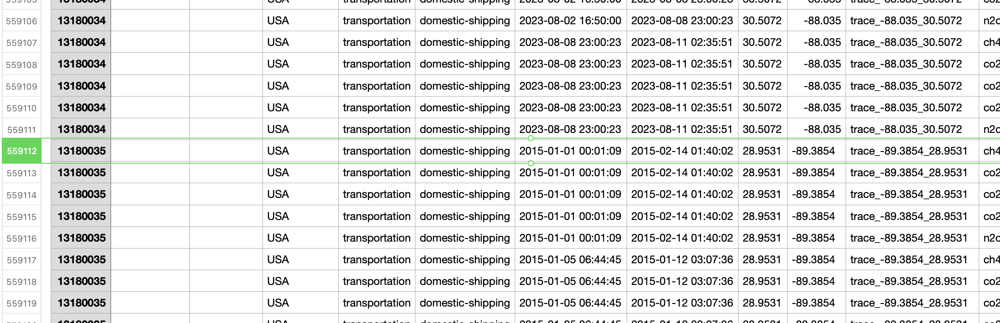

No missing data in any key column

# Add name similarity also to coordiante based matches for better evaluation

In [ ]:
# Preprocessing function to standardize facility and source names
def preprocess_name(name):
    """
    Standardizes a name by making it lowercase, removing special characters,
    and replacing common domain-specific abbreviations.
    """
    if not isinstance(name, str) or pd.isna(name):
        return ""  # Return an empty string for None or NaN values
    name = name.lower()  # Case insensitive
    name = re.sub(r'[^a-z0-9\s]', '', name)  # Remove special characters
    name = re.sub(r'\s+', ' ', name).strip()  # Normalize whitespace
    # Replace domain-specific abbreviations
    name = name.replace("cogen", "cogeneration")
    name = name.replace("facility", "")  # Remove redundant "facility"
    name = name.replace("plant", "")  # Remove "plant"
    return name

# Function to calculate similarity score
def calculate_similarity(row):
    """
    Calculates the similarity score between two standardized names.
    """
    ghgrp_name = preprocess_name(row['ghgrp_facility_name'])
    ct_name = preprocess_name(row['ct_source_name'])
    return fuzz.token_set_ratio(ghgrp_name, ct_name)

# Iterate through each threshold DataFrame in `cleaned_dfs`
for threshold_label, df in cleaned_dfs.items():
    # Define the path to save/load the updated file with similarity scores
    similarity_file_path = f"/content/drive/MyDrive/Master_Thesis/2015-2023_similarity_scores_{threshold_label}.pkl"

    if os.path.exists(similarity_file_path):
        # Load DataFrame with similarity scores if it exists
        with open(similarity_file_path, "rb") as file:
            cleaned_dfs[threshold_label] = pickle.load(file)
        print(f"Loaded similarity scores for threshold: {threshold_label}")
    else:
        # Ensure 'similarity_score' column exists and is initialized
        if 'similarity_score' not in df.columns:
            df['similarity_score'] = pd.NA

        # Calculate or update similarity scores
        df['similarity_score'] = df.apply(calculate_similarity, axis=1)

        # Save the updated DataFrame with similarity scores
        with open(similarity_file_path, "wb") as file:
            pickle.dump(cleaned_dfs[threshold_label], file)
        print(f"Similarity scores calculated and saved for threshold: {threshold_label}")

Loaded similarity scores for threshold: 5m
Loaded similarity scores for threshold: 10m
Loaded similarity scores for threshold: 15m
Loaded similarity scores for threshold: 20m
Loaded similarity scores for threshold: 25m
Loaded similarity scores for threshold: 30m
Loaded similarity scores for threshold: 35m
Loaded similarity scores for threshold: 40m
Loaded similarity scores for threshold: 45m
Loaded similarity scores for threshold: 50m
Loaded similarity scores for threshold: 75m
Loaded similarity scores for threshold: 100m
Loaded similarity scores for threshold: 500m
Loaded similarity scores for threshold: 1000m


# Evaluate match quality

In [ ]:
# Define thresholds of interest
selected_thresholds = ["5m", "10m", "50m", "100m"]

# Prepare summary results
summary_results = []

for threshold in selected_thresholds:
    matched_df = matched_dfs.get(threshold)
    cleaned_df = cleaned_dfs.get(threshold)

    if matched_df is not None and cleaned_df is not None:
        total_ghgrp_rows = len(ghgrp_combined)
        matched_rows = len(matched_df)
        percent_matched = (matched_rows / total_ghgrp_rows) * 100

        # Distance stats in meters
        median_distance_m = matched_df['distance'].median() * 1000
        mean_distance_m = matched_df['distance'].mean() * 1000

        # Similarity score stats
        median_similarity = cleaned_df['similarity_score'].median()
        mean_similarity = cleaned_df['similarity_score'].mean()

        summary_results.append({
            "Threshold": threshold,
            "Matched Rows (%)": round(percent_matched, 2),
            "Median Distance (m)": round(median_distance_m, 2),
            "Average Distance (m)": round(mean_distance_m, 2),
            "Median Similarity Score": round(median_similarity, 2),
            "Average Similarity Score": round(mean_similarity, 2)
        })

# Convert to DataFrame and display
summary_df = pd.DataFrame(summary_results)
display(summary_df)

,Threshold,Matched Rows (%),Median Distance (m),Average Distance (m),Median Similarity Score,Average Similarity Score
0,5m,29.68,0.02,0.90,100.0,92.38
1,10m,33.79,0.32,1.71,100.0,90.27
2,50m,45.24,1.63,8.13,100.0,80.56
3,100m,50.98,2.92,15.84,100.0,76.49


In [ ]:
# Step 1: Check for duplicates across scenarios
duplicate_results = []

for threshold, df in matched_dfs.items():
    duplicate_rows = df.duplicated(subset=['ghgrp_id', 'ct_source_id', 'ghgrp_year'])
    num_duplicates = duplicate_rows.sum()
    total_rows = len(df)
    duplicates_percentage = (num_duplicates / total_rows) * 100

    # Append results for the current threshold
    duplicate_results.append({
        "Threshold": threshold,
        "Total Rows": total_rows,
        "Number of Duplicates": num_duplicates,
        "Percentage of Duplicates (%)": round(duplicates_percentage, 2)
    })

# Convert to DataFrame and display as a table
duplicate_results_df = pd.DataFrame(duplicate_results)
display(duplicate_results_df)

,Threshold,Total Rows,Number of Duplicates,Percentage of Duplicates (%)
0,5m,20437,0,0.0
1,10m,23268,0,0.0
2,15m,25047,0,0.0
3,20m,26325,0,0.0
4,25m,27325,0,0.0
5,30m,28270,0,0.0
6,35m,29167,0,0.0
7,40m,30112,0,0.0
8,45m,30652,0,0.0
9,50m,31155,0,0.0


In [ ]:
# Step 2: Compare unique GHGRP facilities matched across scenarios
facility_match_results = []

for threshold, df in matched_dfs.items():
    total_ghgrp_facilities = ghgrp_combined['ghgrp_facility_name'].nunique()
    unique_ghgrp_facilities_matched = df['ghgrp_facility_name'].nunique()
    matched_percentage = (unique_ghgrp_facilities_matched / total_ghgrp_facilities) * 100

    # Append results for the current threshold
    facility_match_results.append({
        "Threshold": threshold,
        "Total GHGRP Facilities": total_ghgrp_facilities,
        "Unique Facilities Matched": unique_ghgrp_facilities_matched,
        "Matched Percentage (%)": round(matched_percentage, 2)
    })

# Convert to DataFrame and display as a table
facility_match_results_df = pd.DataFrame(facility_match_results)
display(facility_match_results_df)

,Threshold,Total GHGRP Facilities,Unique Facilities Matched,Matched Percentage (%)
0,5m,9902,3672,37.08
1,10m,9902,4237,42.79
2,15m,9902,4565,46.10
3,20m,9902,4780,48.27
4,25m,9902,4935,49.84
5,30m,9902,5084,51.34
6,35m,9902,5247,52.99
7,40m,9902,5398,54.51
8,45m,9902,5494,55.48
9,50m,9902,5590,56.45


In [ ]:
# Step 3: Matched rows comparison across scenarios
row_match_results = []

for threshold, df in matched_dfs.items():
    total_ghgrp_rows = len(ghgrp_combined)
    matched_ghgrp_rows = len(df)
    percentage_matched_rows = (matched_ghgrp_rows / total_ghgrp_rows) * 100

    # Append results for the current threshold
    row_match_results.append({
        "Threshold": threshold,
        "Total GHGRP Rows": total_ghgrp_rows,
        "Matched GHGRP Rows": matched_ghgrp_rows,
        "Percentage of Matched Rows (%)": round(percentage_matched_rows, 2)
    })

# Convert to DataFrame and display as a table
row_match_results_df = pd.DataFrame(row_match_results)
display(row_match_results_df)

,Threshold,Total GHGRP Rows,Matched GHGRP Rows,Percentage of Matched Rows (%)
0,5m,68869,20437,29.68
1,10m,68869,23268,33.79
2,15m,68869,25047,36.37
3,20m,68869,26325,38.22
4,25m,68869,27325,39.68
5,30m,68869,28270,41.05
6,35m,68869,29167,42.35
7,40m,68869,30112,43.72
8,45m,68869,30652,44.51
9,50m,68869,31155,45.24


In [ ]:
# Step 4: Distribution of match percentages by year across scenarios
year_percentage_results = []

# Ensure thresholds are ordered from smallest to largest after stripping "m"
ordered_thresholds = sorted(matched_dfs.keys(), key=lambda x: int(x.replace('m', '')))

for threshold in ordered_thresholds:
    df = matched_dfs[threshold]
    year_distribution = df['ghgrp_year'].value_counts().sort_index()
    total_matches_by_year = year_distribution.sum()

    for year, count in year_distribution.items():
        percentage = (count / total_matches_by_year) * 100
        year_percentage_results.append({
            "Threshold": threshold,  # Threshold already labeled with "m"
            "Year": year,
            "Percentage of Matches (%)": round(percentage, 2)
        })

# Convert to DataFrame and display as a table
year_percentage_df = pd.DataFrame(year_percentage_results)

# Pivot the table for a cleaner display of percentages across thresholds by year
pivoted_year_percentage_df = year_percentage_df.pivot(index="Year", columns="Threshold", values="Percentage of Matches (%)")

# Ensure columns are in ascending order of numeric thresholds
pivoted_year_percentage_df = pivoted_year_percentage_df[ordered_thresholds]  # Columns already ordered

print("\nPercentage of matches by year across different distance thresholds:")
display(pivoted_year_percentage_df)


Percentage of matches by year across different distance thresholds:


Threshold,5m,10m,15m,20m,25m,30m,35m,40m,45m,50m,75m,100m,500m,1000m
Year,,,,,,,,,,,,,,
2015,7.02,7.04,7.11,7.24,7.34,7.52,7.65,7.83,7.93,8.04,8.48,8.69,9.30,9.30
2016,6.96,6.88,6.93,7.04,7.13,7.26,7.36,7.49,7.55,7.59,7.91,8.00,8.38,8.51
2017,6.88,6.82,6.87,6.97,7.05,7.15,7.24,7.36,7.41,7.45,7.74,7.82,8.24,8.40
2018,6.98,6.92,6.96,7.07,7.15,7.24,7.33,7.45,7.50,7.55,7.84,7.92,8.30,8.48
2019,13.11,12.52,12.23,12.03,11.92,11.81,11.72,11.63,11.57,11.52,11.29,11.15,10.79,10.76
2020,12.86,12.31,12.03,11.85,11.75,11.65,11.56,11.48,11.43,11.38,11.15,11.03,10.67,10.68
2021,16.06,16.35,16.42,16.35,16.24,16.12,16.01,15.86,15.79,15.73,15.38,15.30,14.87,14.76
2022,15.99,16.29,16.36,16.28,16.19,16.06,15.96,15.81,15.74,15.69,15.32,15.24,14.79,14.62
2023,14.14,14.86,15.10,15.16,15.21,15.18,15.18,15.10,15.09,15.05,14.88,14.85,14.66,14.50


In [ ]:
# Step 5: Climate TRACE subsector distribution across scenarios
sector_percentage_results = []

# Ensure thresholds are ordered from smallest to largest
ordered_thresholds = sorted(matched_dfs.keys(), key=lambda x: int(x.replace("m", "")))

for threshold in ordered_thresholds:
    df = matched_dfs[threshold]
    sector_distribution = df['ct_subsector'].value_counts()
    total_matches = sector_distribution.sum()  # Total matches for this threshold
    total_sector_counts = climate_trace_combined['ct_subsector'].value_counts()

    for sector, count in sector_distribution.items():
        # Percentage of total subsector matched
        total_percentage = (count / total_sector_counts.get(sector, 1)) * 100
        # Contribution of this subsector's matches to overall matches for this threshold
        matched_percentage = (count / total_matches) * 100
        sector_percentage_results.append({
            "Threshold": threshold,
            "Subsector": sector,
            "Percentage of Total Subsector (%)": round(total_percentage, 2),
            "Contribution to Overall Matches (%)": round(matched_percentage, 2)
        })

# Convert to DataFrame and display as a table
sector_percentage_df = pd.DataFrame(sector_percentage_results)

# Pivot the table for a cleaner display across thresholds by subsector
pivoted_sector_percentage_df = sector_percentage_df.pivot(index="Subsector", columns="Threshold",
                                                          values=["Percentage of Total Subsector (%)",
                                                                  "Contribution to Overall Matches (%)"])

# Reorder columns based on `ordered_thresholds`
pivoted_sector_percentage_df = pivoted_sector_percentage_df.reindex(columns=ordered_thresholds, level=1)

print("\nClimate TRACE subsector distribution across different distance thresholds (ordered by threshold):")
display(pivoted_sector_percentage_df)


Climate TRACE subsector distribution across different distance thresholds (ordered by threshold):


Percentage of Total Subsector (%)  \
Threshold                                                                    5m   
Subsector                                                                         
aluminum                                                                  43.59   
cement                                                                    63.99   
chemicals                                                                   NaN   
coal-mining                                                                1.86   
copper-mining                                                               NaN   
domestic-aviation                                                          0.19   
domestic-shipping                                                          0.19   
domestic-wastewater-treatment-and-discharge                                0.17   
electricity-generation                                                    40.93   
glass                                                                      0.28   
industrial-wastewater-treatment-and-discharge                             27.78   
international-aviation                                                     0.19   
international-shipping                                                     0.13   
iron-and-steel                                                            60.19   
iron-mining                                                                 NaN   
lime                                                                      18.85   
oil-and-gas-production                                                      NaN   
oil-and-gas-refining                                                      29.54   
oil-and-gas-transport                                                       NaN   
other-chemicals                                                           47.88   
other-manufacturing                                                       66.27   
other-metals                                                              49.09   
petrochemical-steam-cracking                                              26.47   
petrochemicals                                                             5.51   
pulp-and-paper                                                              NaN   
road-transportation                                                        0.09   
solid-waste-disposal                                                      15.43   
steel                                                                      1.63   
textiles-leather-apparel                                                   0.48   
wastewater-treatment-and-discharge                                         0.14   

                                                                           \
Threshold                                        10m    15m    20m    25m   
Subsector                                                                   
aluminum                                       60.26  48.72  48.72  48.72   
cement                                         66.48  67.31  69.90  70.73   
chemicals                                        NaN    NaN    NaN   2.94   
coal-mining                                     3.34   4.72   5.59   5.97   
copper-mining                                    NaN   2.35   2.35   2.35   
domestic-aviation                               0.34   0.56   0.62   1.11   
domestic-shipping                               0.52   0.95   2.09   2.25   
domestic-wastewater-treatment-and-discharge     0.47   0.84   1.09   1.32   
electricity-generation                         44.17  45.19  45.85  46.59   
glass                                           0.28   1.41   2.26   2.26   
industrial-wastewater-treatment-and-discharge  33.33  35.60  36.42  37.45   
international-aviation                          0.41   0.60   0.80   0.99   
international-shipping                          0.63   0.84   2.07   2.17   
iron-and-steel                                 72.04  84.83  86.26  87.68 

In [ ]:
# Step 6: GHGRP state distribution across scenarios
state_percentage_results = []

# Ensure thresholds are ordered from smallest to largest
ordered_thresholds = sorted(matched_dfs.keys(), key=lambda x: int(x.replace("m", "")))

for threshold in ordered_thresholds:
    df = matched_dfs[threshold]
    state_distribution = df['ghgrp_STATE'].value_counts()
    total_matches = state_distribution.sum()  # Total matches for this threshold
    total_state_counts = ghgrp_combined['ghgrp_STATE'].value_counts()

    for state, count in state_distribution.items():
        # Percentage of total state matched
        total_percentage = (count / total_state_counts.get(state, 1)) * 100
        # Contribution of this state's matches to overall matches for this threshold
        matched_percentage = (count / total_matches) * 100
        state_percentage_results.append({
            "Threshold": threshold,
            "State": state,
            "Percentage of Total State (%)": round(total_percentage, 2),
            "Contribution to Overall Matches (%)": round(matched_percentage, 2)
        })

# Convert to DataFrame and display as a table
state_percentage_df = pd.DataFrame(state_percentage_results)

# Pivot the table for a cleaner display across thresholds by state
pivoted_state_percentage_df = state_percentage_df.pivot(index="State", columns="Threshold",
                                                        values=["Percentage of Total State (%)",
                                                                "Contribution to Overall Matches (%)"])

# Reorder columns based on `ordered_thresholds`
pivoted_state_percentage_df = pivoted_state_percentage_df.reindex(columns=ordered_thresholds, level=1)

print("\nGHGRP state distribution across different distance thresholds (ordered by threshold):")
display(pivoted_state_percentage_df)


GHGRP state distribution across different distance thresholds (ordered by threshold):


Percentage of Total State (%)                                     \
Threshold                            5m    10m    15m    20m    25m    30m   
State                                                                        
AK                                16.50  20.44  26.57  28.18  28.76  32.12   
AL                                39.57  43.64  45.56  48.89  50.43  52.04   
AR                                35.71  39.75  41.30  42.75  43.06  43.37   
AZ                                27.57  30.30  32.66  34.67  36.09  36.57   
CA                                36.72  40.50  43.08  44.59  46.92  48.89   
CO                                12.31  14.45  15.42  16.15  16.73  17.02   
CT                                37.25  43.00  45.00  49.50  50.50  52.25   
DC                                25.53  25.53  31.91  51.06  61.70  61.70   
DE                                37.17  42.41  43.98  44.50  52.36  52.36   
FL                                38.37  42.18  44.59  46.04  46.53  46.95   
GA                                37.85  41.81  44.06  45.77  48.61  50.26   
GU                                 2.86   2.86   2.86   2.86   2.86   2.86   
HI                                40.48  53.17  57.94  60.71  67.06  69.44   
IA                                32.77  36.20  40.55  43.07  45.94  47.69   
ID                                40.00  45.51  45.51  46.67  47.83  49.57   
IL                                36.51  41.14  45.59  47.93  50.36  52.43   
IN                                41.28  48.23  53.39  56.11  56.65  58.17   
KS                                31.51  36.49  38.41  38.41  38.79  41.19   
KY                                36.31  40.86  45.80  47.29  47.69  49.57   
LA                                21.08  25.85  27.72  30.12  30.87  32.26   
MA                                38.54  43.27  47.99  49.71  51.72  53.87   
MD                                23.29  35.38  37.18  38.63  42.42  46.75   
ME                                25.82  30.33  31.56  31.56  36.07  40.16   
MI                                40.61  45.57  48.22  50.63  51.54  53.61   
MN                                29.41  31.86  34.56  36.44  37.75  38.73   
MO                                43.09  45.02  48.70  50.14  53.04  53.62   
MS                                29.37  31.34  31.93  32.81  32.81  33.69   
MT                                44.75  50.85  55.93  56.27  56.27  56.61   
NC                                43.65  47.18  50.38  51.30  53.15  53.99   
ND                                17.75  19.14  20.06  21.91  23.46  26.70   
NE                                25.54  29.29  32.90  36.51  40.40  42.14   
NH                                41.67  43.59  46.15  51.92  52.56  55.13   
NJ                                37.81  47.61  49.71  53.09  54.61  56.83   
NM                                17.22  19.11  22.67  23.33  23.33  23.44   
NV                                32.92  37.13  37.13  39.60  42.57  42.82   
NY                                34.78  40.90  43.68  48.28  50.51  51.77   
OH                                40.27  45.86  49.50  51.24  53.85  55.51   
OK                                13.76  17.31  17.69  18.66  19.20  20.97   
OR                                30.19  35.66  37.55  38.49  40.75  44.15   
PA                                27.87  32.94  35.86  38.07  40.76  41.79   
PR                                 4.29   5.71   7.62   7.62  10.00  13.81   
RI                                39.00  39.00  40.00  53.00  56.00  56.00   
SC                                46.04  51.62  56.86  59.42  61.76  63.32   
SD                                22.05  26.71  27.64  27.95  27.95  36.65   
TN                                36.79  43.18  47.32  50.26  50.26  51.38   
TX                                19.02  21.35  23.03  24.15  24.52  24.95   
UT                                28.19  32.29  32.44  33.71  35.84  37.25   
VA                                33.07  37.05  40.72  42.43  44.85  45.71   
VI                              

In [ ]:
# Step 7: Summary statistics for matching distance across scenarios
distance_stats_results = []

# Ensure thresholds are ordered from smallest to largest
ordered_thresholds = sorted(matched_dfs.keys(), key=lambda x: int(x.replace("m", "")))

for threshold in ordered_thresholds:
    df = matched_dfs[threshold]
    # Calculate summary statistics for distance
    distance_stats = df['distance'].describe()
    distance_stats_results.append(distance_stats.rename(threshold))

# Combine distance statistics into a single DataFrame for comparison
distance_stats_df = pd.DataFrame(distance_stats_results)
distance_stats_df.index.name = "Threshold"  # Set index name for clarity

print("\nSummary statistics for matching distance (in km) across thresholds (ordered by threshold):")
display(distance_stats_df)


Summary statistics for matching distance (in km) across thresholds (ordered by threshold):


,count,mean,std,min,25%,50%,75%,max
Threshold,,,,,,,,
5m,20437.0,0.000902,0.001333,0.0,0.000000,0.000015,0.001419,0.004996
10m,23268.0,0.001709,0.002526,0.0,0.000000,0.000316,0.002615,0.009996
15m,25047.0,0.002494,0.003709,0.0,0.000000,0.000572,0.003595,0.014974
20m,26325.0,0.003253,0.004905,0.0,0.000000,0.000769,0.004494,0.020000
25m,27325.0,0.003980,0.006067,0.0,0.000000,0.000900,0.005360,0.024960
30m,28270.0,0.004798,0.007348,0.0,0.000000,0.001051,0.006544,0.029993
35m,29167.0,0.005703,0.008756,0.0,0.000000,0.001217,0.007849,0.034982
40m,30112.0,0.006740,0.010294,0.0,0.000000,0.001400,0.009121,0.039985
45m,30652.0,0.007424,0.011322,0.0,0.000000,0.001513,0.010064,0.044997


In [ ]:
# Step 8: Summary statistics for similarity score across scenarios
similarity_stats_results = []

for threshold_label, df in cleaned_dfs.items():
    # Collect similarity score statistics for each threshold
    similarity_stats = df['similarity_score'].describe()
    similarity_stats.name = threshold_label  # Label for clarity in aggregation
    similarity_stats_results.append(similarity_stats)

# Combine similarity statistics for comparison across thresholds
similarity_stats_df = pd.DataFrame(similarity_stats_results)

# Display the table of similarity statistics
display(similarity_stats_df)

,count,mean,std,min,25%,50%,75%,max
5m,20437.0,92.380699,18.445197,0.0,100.000000,100.000000,100.0,100.0
10m,23268.0,90.274875,21.051001,0.0,100.000000,100.000000,100.0,100.0
15m,25047.0,88.431692,22.835561,0.0,96.153846,100.000000,100.0,100.0
20m,26325.0,86.825763,24.257047,0.0,84.848485,100.000000,100.0,100.0
25m,27325.0,85.423368,25.425835,0.0,78.260870,100.000000,100.0,100.0
30m,28270.0,84.189466,26.284101,0.0,72.727273,100.000000,100.0,100.0
35m,29167.0,83.034651,27.033486,0.0,66.666667,100.000000,100.0,100.0
40m,30112.0,81.839053,27.764261,0.0,61.904762,100.000000,100.0,100.0
45m,30652.0,81.174076,28.144393,0.0,58.823529,100.000000,100.0,100.0
50m,31155.0,80.564829,28.463113,0.0,56.000000,100.000000,100.0,100.0


In [ ]:
df_5m = matched_dfs["5m"]

# Calculate total GHGRP rows and facilities
total_ghgrp_rows = len(ghgrp_combined)
total_ghgrp_facilities = ghgrp_combined['ghgrp_facility_name'].nunique()

# Initialize results list
year_match_results = []

# Calculate distribution of matches by year
year_distribution = df_5m['ghgrp_year'].value_counts().sort_index()

total_matches_by_year = year_distribution.sum()

for year, count in year_distribution.items():
    matched_ghgrp_rows = count
    percentage_matched_rows = (matched_ghgrp_rows / total_ghgrp_rows) * 100

    unique_facilities_matched = df_5m[df_5m['ghgrp_year'] == year]['ghgrp_facility_name'].nunique()
    percentage_unique_facilities_matched = (unique_facilities_matched / total_ghgrp_facilities) * 100

    year_match_results.append({
        "Year": year,
        "Percentage of Matched Rows (%)": round(percentage_matched_rows, 2),
        "Percentage of Unique Facilities Matched (%)": round(percentage_unique_facilities_matched, 2)
    })

# Convert to DataFrame and display as a table
year_match_results_df = pd.DataFrame(year_match_results)

display(year_match_results_df)

,Year,Percentage of Matched Rows (%),Percentage of Unique Facilities Matched (%)
0,2015,2.08,13.98
1,2016,2.06,13.89
2,2017,2.04,13.79
3,2018,2.07,14.00
4,2019,3.89,26.59
5,2020,3.82,26.07
6,2021,4.77,32.63
7,2022,4.75,32.50
8,2023,4.20,28.90


<Figure size 1200x500 with 0 Axes>

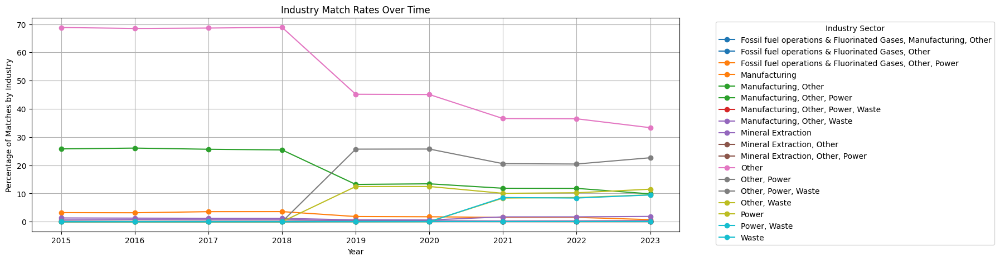

In [ ]:
# Group matches by year and industry
industry_match_rates = matched_dfs["5m"].groupby(["ghgrp_year", "ghgrp_broad_category"]).size().unstack(fill_value=0)

# Convert to percentage of total matches per year
industry_match_rates = industry_match_rates.div(industry_match_rates.sum(axis=1), axis=0) * 100

# Plot industry match rates over time
plt.figure(figsize=(12, 5))
industry_match_rates.plot(kind="line", colormap="tab10", marker="o", figsize=(15, 5))
plt.xlabel("Year")
plt.ylabel("Percentage of Matches by Industry")
plt.title("Industry Match Rates Over Time")
plt.legend(title="Industry Sector", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

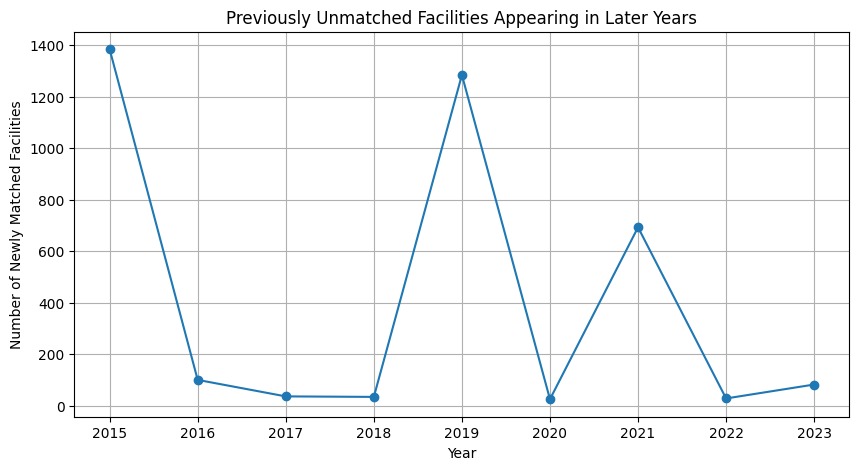

In [ ]:
# Identify GHGRP facilities that were first matched in each year
matched_facilities_over_time = matched_dfs["5m"].groupby("ghgrp_year")["ghgrp_facility_name"].unique()

# Count how many facilities were matched for the first time in each year
first_time_matches = {}
all_matched = set()

for year, facilities in matched_facilities_over_time.items():
    new_matches = set(facilities) - all_matched  # Facilities that were not matched in previous years
    first_time_matches[year] = len(new_matches)
    all_matched.update(new_matches)  # Update list of matched facilities

# Convert to DataFrame for visualization
first_time_matches_df = pd.DataFrame.from_dict(first_time_matches, orient="index", columns=["Newly Matched Facilities"])

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(first_time_matches_df.index, first_time_matches_df["Newly Matched Facilities"], marker="o", linestyle="-")
plt.xlabel("Year")
plt.ylabel("Number of Newly Matched Facilities")
plt.title("Previously Unmatched Facilities Appearing in Later Years")
plt.grid(True)
plt.show()

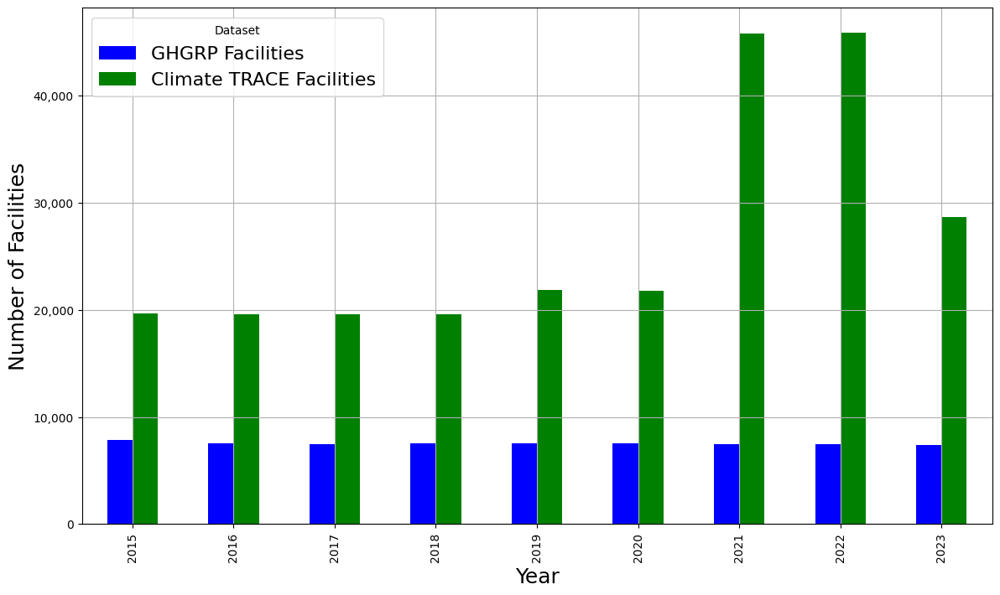

In [ ]:
# Count the number of unique facilities in Climate TRACE for each year
ct_facility_counts = climate_trace_combined.groupby("ct_year")["ct_source_id"].nunique()

# Count the number of unique facilities in GHGRP for each year
ghgrp_facility_counts = ghgrp_combined.groupby("ghgrp_year")["ghgrp_facility_name"].nunique()

# Create a DataFrame for comparison
facility_coverage_df = pd.DataFrame({
    "GHGRP Facilities": ghgrp_facility_counts,
    "Climate TRACE Facilities": ct_facility_counts
})


# Plot the results
fig, ax = plt.subplots(figsize=(14, 8))
colors = ["blue", "green"]  # Ensure consistent color scheme
facility_coverage_df.plot(kind="bar", ax=ax, color=colors)
ax.set_xlabel("Year", fontsize=18)
ax.set_ylabel("Number of Facilities", fontsize=18)
ax.legend(title="Dataset", fontsize=16)
ax.grid(True)
ax.yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.show()

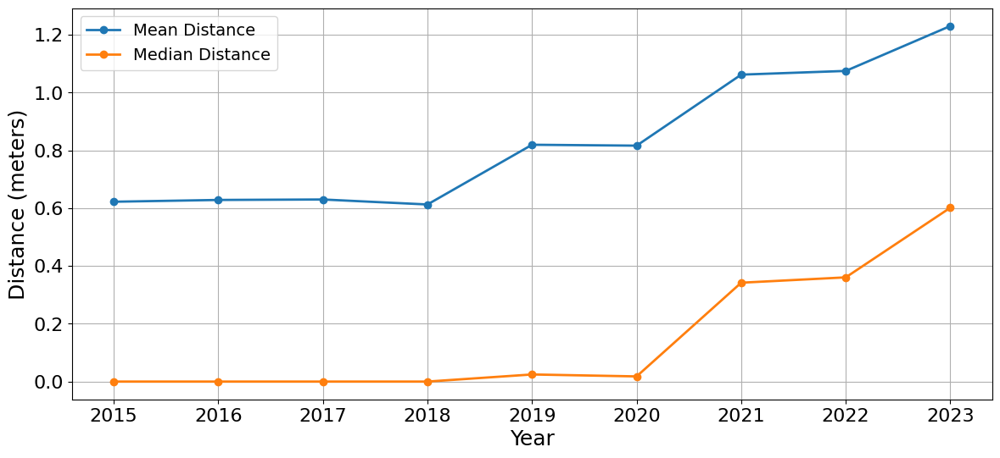

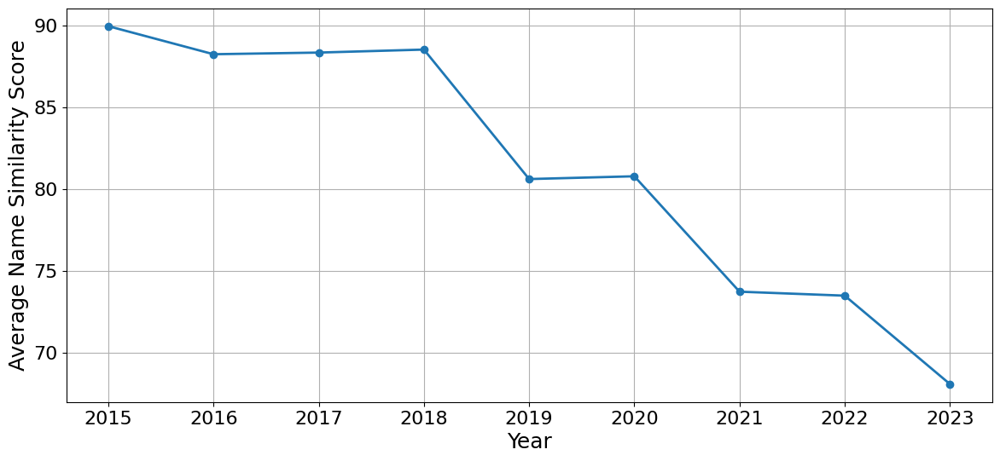

In [ ]:
# Group by year and calculate mean and median distance
distance_trends = matched_dfs["5m"].groupby("ghgrp_year")["distance"].agg(["mean", "median"])

# Convert distances to meters if they are in kilometers
distance_trends *= 1000  # Assuming the original values are in kilometers

# Plot distance trends
plt.figure(figsize=(14, 6))
plt.rcParams.update({'font.size': 16})  # Increase font size for all elements
plt.plot(distance_trends.index, distance_trends["mean"], marker="o", label="Mean Distance", linewidth=2)
plt.plot(distance_trends.index, distance_trends["median"], marker="o", label="Median Distance", linewidth=2)
plt.xlabel("Year", fontsize=18)
plt.ylabel("Distance (meters)", fontsize=18)
plt.legend(fontsize=14)
plt.grid(True)
plt.show()

# Calculate average name similarity per year
name_similarity_trends = matched_dfs["5m"].groupby("ghgrp_year")["name_similarity"].mean()

# Plot name similarity trends
plt.figure(figsize=(14, 6))
plt.plot(name_similarity_trends.index, name_similarity_trends, marker="o", linestyle="-", linewidth=2)
plt.xlabel("Year", fontsize=18)
plt.ylabel("Average Name Similarity Score", fontsize=18)
plt.grid(True)
plt.show()

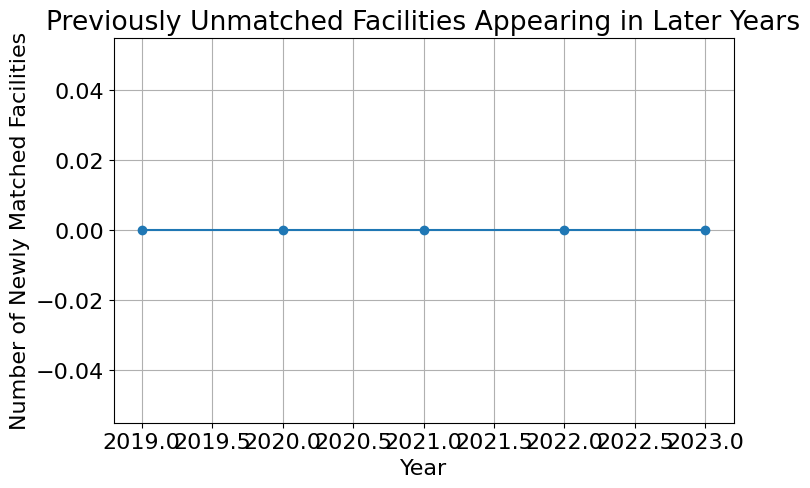

In [ ]:
# Extract unique facility IDs for each year from the matched dataset
matched_facilities_by_year = matched_dfs["5m"].groupby("ghgrp_year")["ghgrp_id"].unique()

# Find facilities that were unmatched in early years but appeared in later years
unmatched_early_years = set(ghgrp_combined[ghgrp_combined["ghgrp_year"] < 2019]["ghgrp_id"]) - set(matched_dfs["5m"]["ghgrp_id"])

newly_matched_counts = {}

for year in range(2019, 2024):
    newly_matched = set(matched_facilities_by_year.get(year, [])) & unmatched_early_years
    newly_matched_counts[year] = len(newly_matched)

# Convert to DataFrame for visualization
newly_matched_df = pd.DataFrame.from_dict(newly_matched_counts, orient="index", columns=["Newly Matched Facilities"])
newly_matched_df.index.name = "Year"

# Plot the trend
plt.figure(figsize=(8,5))
plt.plot(newly_matched_df.index, newly_matched_df["Newly Matched Facilities"], marker="o")
plt.xlabel("Year")
plt.ylabel("Number of Newly Matched Facilities")
plt.title("Previously Unmatched Facilities Appearing in Later Years")
plt.grid()
plt.show()

<Figure size 1400x600 with 0 Axes>

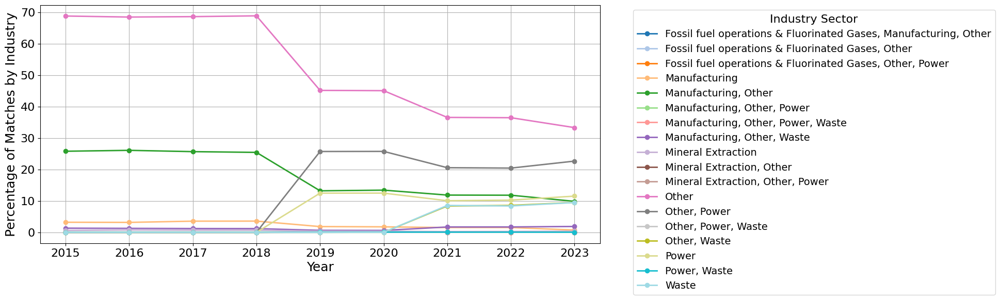

In [ ]:
# Merge matched dataset with industry category information
industry_matches = matched_dfs["5m"][["ghgrp_year", "ghgrp_id", "ghgrp_broad_category"]].copy()

# Count the number of new matches by industry and year
industry_match_counts = industry_matches.groupby(["ghgrp_year", "ghgrp_broad_category"])["ghgrp_id"].nunique().unstack(fill_value=0)

# Normalize to get percentages
industry_match_percentages = industry_match_counts.div(industry_match_counts.sum(axis=1), axis=0) * 100

# Plot industry match rates over time
plt.figure(figsize=(14, 6))
plt.rcParams.update({'font.size': 16})  # Increase font size for all elements
industry_match_percentages.plot(kind="line", marker="o", colormap="tab20", linewidth=2, figsize=(14, 6))
plt.xlabel("Year", fontsize=18)
plt.ylabel("Percentage of Matches by Industry", fontsize=18)
plt.legend(title="Industry Sector", bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=14)
plt.grid()
plt.show()

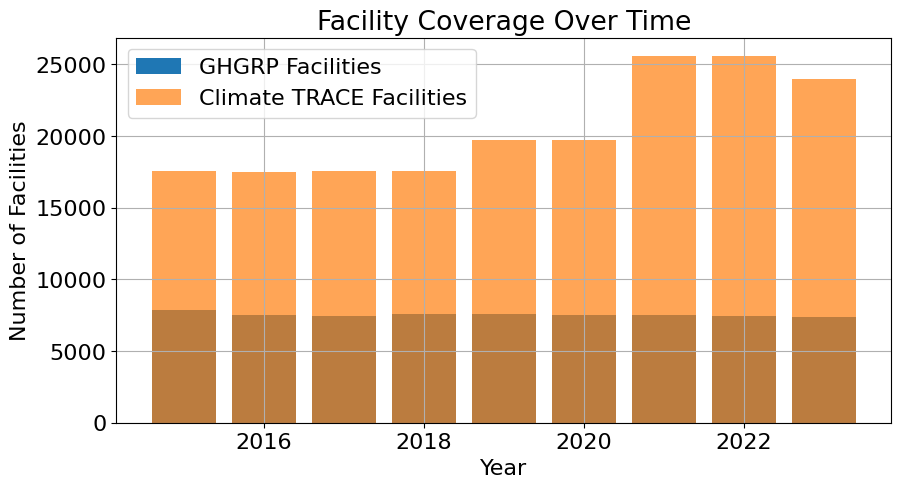

In [ ]:
# Count the number of unique facilities per year in GHGRP and Climate TRACE
ghgrp_facility_counts = ghgrp_combined.groupby("ghgrp_year")["ghgrp_facility_name"].nunique()
ct_facility_counts = climate_trace_combined.groupby("ct_year")["ct_source_name"].nunique()

# Merge into a single DataFrame
coverage_df = pd.DataFrame({
    "GHGRP Facilities": ghgrp_facility_counts,
    "Climate TRACE Facilities": ct_facility_counts
}).fillna(0)

# Plot facility coverage over time
plt.figure(figsize=(10,5))
plt.bar(coverage_df.index, coverage_df["GHGRP Facilities"], label="GHGRP Facilities")
plt.bar(coverage_df.index, coverage_df["Climate TRACE Facilities"], label="Climate TRACE Facilities", alpha=0.7)
plt.xlabel("Year")
plt.ylabel("Number of Facilities")
plt.title("Facility Coverage Over Time")
plt.legend()
plt.grid()
plt.show()

# Deciding which km threshold delivers the best results


Final Evaluation Results (average across all weight combinations):


,Threshold,Median Distance,Median Similarity,Match Percentage (%),Average Overall Score
11,100m,0.002921,100.000000,50.977944,0.874691
10,75m,0.002419,100.000000,48.900086,0.869970
9,50m,0.001628,100.000000,45.238061,0.860728
8,45m,0.001513,100.000000,44.507689,0.858461
7,40m,0.001400,100.000000,43.723591,0.855932
6,35m,0.001217,100.000000,42.351421,0.851362
5,30m,0.001051,100.000000,41.048948,0.846938
4,25m,0.000900,100.000000,39.676778,0.842050
3,20m,0.000769,100.000000,38.224746,0.836596
2,15m,0.000572,100.000000,36.369048,0.829914


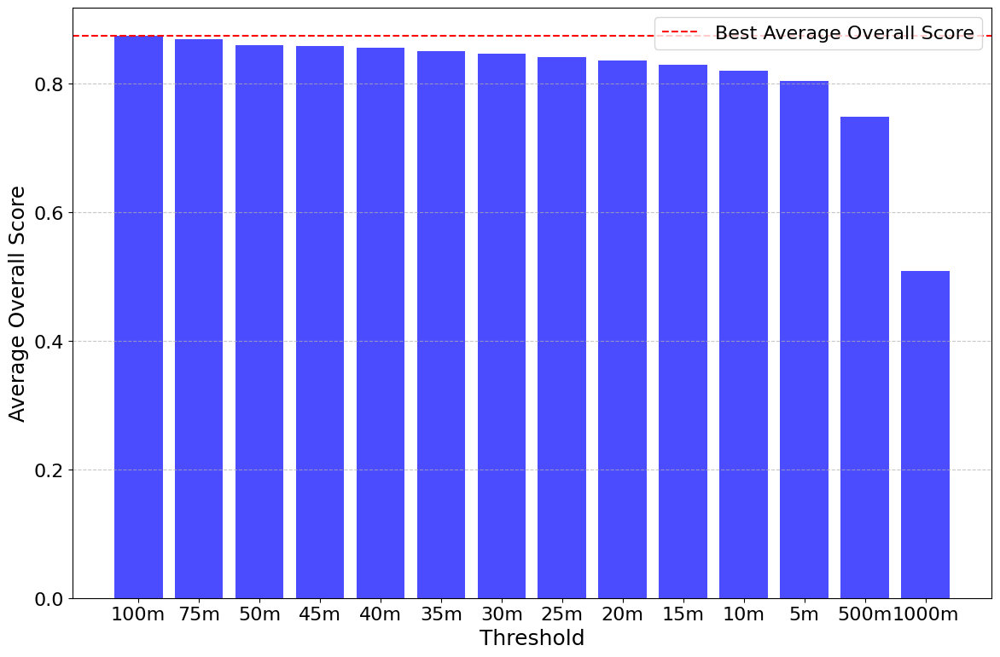

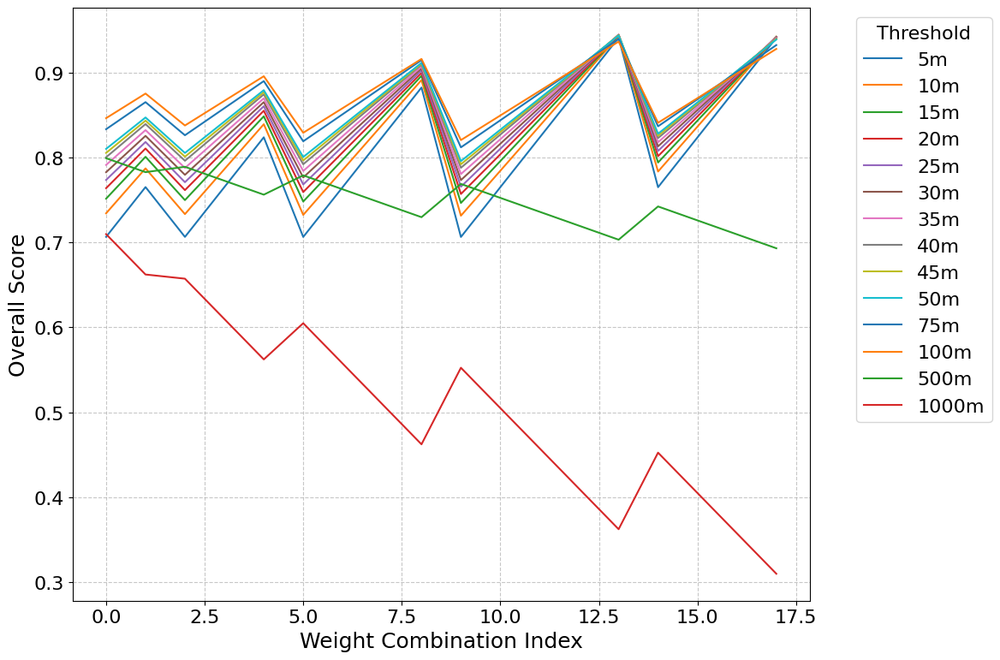


Best Thresholds for Different Weight Combinations:


,Weights,Best Threshold,Max Score
0,"(0.1, 0.4, 0.5)",100m,0.846430
1,"(0.1, 0.5, 0.4)",100m,0.875424
2,"(0.2, 0.3, 0.5)",100m,0.837832
3,"(0.2, 0.4, 0.4)",100m,0.866826
4,"(0.2, 0.5, 0.3)",100m,0.895820
5,"(0.3, 0.2, 0.5)",100m,0.829233
6,"(0.3, 0.3, 0.4)",100m,0.858228
7,"(0.3, 0.4, 0.3)",100m,0.887222
8,"(0.3, 0.5, 0.2)",100m,0.916217
9,"(0.4, 0.1, 0.5)",100m,0.820635



Best threshold overall (highest average score): 100m


In [ ]:
# Define weight combinations (step of 0.1)
weights = [0.1, 0.2, 0.3, 0.4, 0.5]
weight_combinations = list(itertools.product(weights, repeat=3))
weight_combinations = [wc for wc in weight_combinations if sum(wc) == 1.0]  # Only valid combinations summing to 1

# Initialize results container
evaluation_results = []
weighting_results = []

# Iterate through thresholds and collect metrics
for threshold_label, df in cleaned_dfs.items():
    # Compute metrics
    median_distance = df['distance'].median() if 'distance' in df else None
    median_similarity = df['similarity_score'].median() if 'similarity_score' in df else None
    total_rows = len(ghgrp_combined)
    matched_rows = len(df)
    match_percentage = (matched_rows / total_rows) * 100 if total_rows > 0 else 0

    # Add to results
    evaluation_results.append({
        "Threshold": threshold_label,
        "Median Distance": median_distance,
        "Median Similarity": median_similarity,
        "Match Percentage (%)": match_percentage
    })

# Convert to DataFrame
evaluation_df = pd.DataFrame(evaluation_results)

# Normalize metrics for unified comparison (all scores between 0 and 1)
evaluation_df['Normalized Distance'] = 1 - (evaluation_df['Median Distance'] / evaluation_df['Median Distance'].max())
evaluation_df['Normalized Similarity'] = evaluation_df['Median Similarity'] / evaluation_df['Median Similarity'].max()
evaluation_df['Normalized Match Percentage'] = evaluation_df['Match Percentage (%)'] / evaluation_df['Match Percentage (%)'].max()

# Calculate overall scores for each weight combination
for weights in weight_combinations:
    weight_distance, weight_similarity, weight_match = weights

    evaluation_df[f'Overall Score ({weights})'] = (
        evaluation_df['Normalized Distance'] * weight_distance +
        evaluation_df['Normalized Similarity'] * weight_similarity +
        evaluation_df['Normalized Match Percentage'] * weight_match
    )

    # Append the best threshold for this weight combination
    best_threshold = evaluation_df.loc[evaluation_df[f'Overall Score ({weights})'].idxmax()]['Threshold']
    weighting_results.append({
        "Weights": weights,
        "Best Threshold": best_threshold,
        "Max Score": evaluation_df[f'Overall Score ({weights})'].max()
    })

# Aggregate results across weight combinations
weighting_df = pd.DataFrame(weighting_results)

# Calculate the average overall score for each threshold across all weightings
evaluation_df['Average Overall Score'] = evaluation_df[
    [f'Overall Score ({weights})' for weights in weight_combinations]
].mean(axis=1)

# Sort the first table by "Average Overall Score" in descending order
final_table = evaluation_df[['Threshold', 'Median Distance', 'Median Similarity', 'Match Percentage (%)', 'Average Overall Score']]
final_table = final_table.sort_values(by='Average Overall Score', ascending=False)

# Display the final table
print("\nFinal Evaluation Results (average across all weight combinations):")
display(final_table)

# Visualization 1: Average Overall Scores Across Thresholds
plt.figure(figsize=(12, 8))
plt.bar(final_table['Threshold'], final_table['Average Overall Score'], color='blue', alpha=0.7)

# Labels
plt.xlabel("Threshold", fontsize=18)
plt.ylabel("Average Overall Score", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.axhline(y=final_table['Average Overall Score'].max(), color='red', linestyle='--', label='Best Average Overall Score')
plt.legend(fontsize=16)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualization 2: Variation in Scores Across Weight Combinations
plt.figure(figsize=(12, 8))
for threshold_label in evaluation_df['Threshold']:
    threshold_scores = [
        evaluation_df.loc[evaluation_df['Threshold'] == threshold_label, f'Overall Score ({weights})'].values[0]
        for weights in weight_combinations
    ]
    plt.plot(threshold_scores, label=threshold_label)

# Labels
plt.xlabel("Weight Combination Index", fontsize=18)
plt.ylabel("Overall Score", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(title="Threshold", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Display the weighting results
print("\nBest Thresholds for Different Weight Combinations:")
display(weighting_df)

print(f"\nBest threshold overall (highest average score): {final_table.iloc[0]['Threshold']}")

# Calculate GHG differences

From the CT *about_the_data.pdf*: "Quantity of gas emitted in metric tonnes."

GHG data given in "GHG QUANTITY (METRIC TONS CO2e)"

In [ ]:
# Define the list of thresholds to remove
# only keeping 5m as its the most conservative and 50m as it was shown to hold the best matches
thresholds_to_remove = ['15m', '20m', '25m', '30m', '35m', '40m', '45m', '75m', '500m', '1000m']

# Remove the specified thresholds from matched_dfs
for threshold in thresholds_to_remove:
  if threshold in matched_dfs:
    del matched_dfs[threshold]

print(matched_dfs.keys())

dict_keys(['5m', '10m', '50m', '100m'])


In [ ]:
# Calculate the emissions discrepancy and percentage discrepancy across scenarios
for threshold, df in matched_dfs.items():
    # Exclude rows where GHGRP emissions are zero
    df = df[df['ghgrp_emissions_tons'] > 0].copy()

    # Calculate the emissions discrepancy directly in tons
    df['emissions_discrepancy'] = df['ghgrp_emissions_tons'] - df['ct_emissions_quantity']

    # Separate rows with zero discrepancy for potential later analysis
    df['zero_discrepancy_flag'] = df['emissions_discrepancy'] == 0

    # Calculate the percentage discrepancy relative to GHGRP
    df['emissions_percentage_discrepancy'] = np.where(
        df['ghgrp_emissions_tons'] > 0,
        (df['emissions_discrepancy'] / df['ghgrp_emissions_tons']) * 100,
        np.nan
    )

    # Calculate total emissions for each `ghgrp_subparts` category
    ghgrp_subparts_emissions = df.groupby('ghgrp_subparts')['ghgrp_emissions_tons'].sum()

    # Map the total emissions of the corresponding category to each row
    df['ghgrp_subparts_total_emissions'] = df['ghgrp_subparts'].map(ghgrp_subparts_emissions)

    # Compute the weighted percentage discrepancy
    df['weighted_percentage_discrepancy'] = np.where(
        (df['ghgrp_emissions_tons'] > 0) & (df['ghgrp_subparts_total_emissions'] > 0),
        (
            (df['emissions_discrepancy'] / df['ghgrp_emissions_tons']) * 100 *
            (df['ghgrp_emissions_tons'] / df['ghgrp_subparts_total_emissions'])
        ),
        np.nan
    )

    # Update the original DataFrame
    matched_dfs[threshold] = df

# Print a summary of changes for validation
for threshold, df in matched_dfs.items():
    print(f"\nThreshold: {threshold}")
    print(f"Rows after filtering: {len(df)}")
    print(f"Rows with zero emissions discrepancy: {df['zero_discrepancy_flag'].sum()}")
    print(f"Rows with NaN or -inf in percentage discrepancy: {df['emissions_percentage_discrepancy'].isna().sum()}")
    print(f"Rows with NaN or -inf in weighted discrepancy: {df['weighted_percentage_discrepancy'].isna().sum()}")


Threshold: 5m
Rows after filtering: 20432
Rows with zero emissions discrepancy: 271
Rows with NaN or -inf in percentage discrepancy: 0
Rows with NaN or -inf in weighted discrepancy: 0

Threshold: 10m
Rows after filtering: 23261
Rows with zero emissions discrepancy: 287
Rows with NaN or -inf in percentage discrepancy: 0
Rows with NaN or -inf in weighted discrepancy: 0

Threshold: 50m
Rows after filtering: 31145
Rows with zero emissions discrepancy: 336
Rows with NaN or -inf in percentage discrepancy: 0
Rows with NaN or -inf in weighted discrepancy: 0

Threshold: 100m
Rows after filtering: 35098
Rows with zero emissions discrepancy: 333
Rows with NaN or -inf in percentage discrepancy: 0
Rows with NaN or -inf in weighted discrepancy: 0


In [ ]:
# Calculate and display median and mean percentage and weighted percentage discrepancies by subsector
subsector_discrepancies = {}

for threshold, df in matched_dfs.items():
    subsector_stats = (
        df.groupby('ct_subsector')[['emissions_percentage_discrepancy', 'weighted_percentage_discrepancy']]
        .agg(['median', 'mean'])  # Calculate both median and mean
        .reset_index()
    )

    # Flatten MultiIndex columns and rename them to include the threshold
    subsector_stats.columns = ['ct_subsector'] + [
        f"{threshold} ({agg_type.capitalize()} {col.replace('_', ' ')})"
        for col, agg_type in subsector_stats.columns[1:]  # Skip the first column (ct_subsector)
    ]

    subsector_discrepancies[threshold] = subsector_stats

# Combine subsector results across scenarios for comparison
subsector_discrepancy_df = subsector_discrepancies[list(matched_dfs.keys())[0]]  # Get the first key of matched_dfs
for threshold in list(matched_dfs.keys())[1:]:  # Iterate over remaining keys of matched_dfs
    subsector_discrepancy_df = pd.merge(subsector_discrepancy_df, subsector_discrepancies[threshold], on='ct_subsector', how='outer')

subsector_discrepancy_df = subsector_discrepancy_df.set_index('ct_subsector')

# Display the results
print("\nMedian and Mean percentage and weighted percentage discrepancy by subsector across scenarios:")
display(subsector_discrepancy_df)


Median and Mean percentage and weighted percentage discrepancy by subsector across scenarios:


,5m (Median emissions percentage discrepancy),5m (Mean emissions percentage discrepancy),5m (Median weighted percentage discrepancy),5m (Mean weighted percentage discrepancy),10m (Median emissions percentage discrepancy),10m (Mean emissions percentage discrepancy),10m (Median weighted percentage discrepancy),10m (Mean weighted percentage discrepancy),50m (Median emissions percentage discrepancy),50m (Mean emissions percentage discrepancy),50m (Median weighted percentage discrepancy),50m (Mean weighted percentage discrepancy),100m (Median emissions percentage discrepancy),100m (Mean emissions percentage discrepancy),100m (Median weighted percentage discrepancy),100m (Mean weighted percentage discrepancy)
ct_subsector,,,,,,,,,,,,,,,,
aluminum,3.975284,-383640.851572,1.226423e-01,0.047895,3.817221,-1.164550e+06,9.291713e-02,0.845553,3.925258,-19.944089,7.689504e-02,1.087393,9.265102,-6.794283,1.378762e-01,1.296268
cement,17.888988,-2746.129080,2.906412e-02,0.031291,17.251682,-2.700938e+03,2.867842e-02,0.028639,15.953562,-2540.081902,2.463681e-02,-0.076208,16.306787,-2437.744003,2.306189e-02,-0.066488
chemicals,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-329.085527,-460.175109,-3.087055e+00,-2.099836,-1136.735492,-4366.182303,-2.671837e+00,-2.027869
coal-mining,-290.818798,-7198.075057,-7.642727e-01,-1.718576,-147.415684,-4.472665e+03,-3.120467e-01,-0.644833,-99.829458,-3616.382283,-1.099860e-01,-0.167565,-91.110251,-2662.766384,-1.406133e-01,-0.135478
copper-mining,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1920.233717,-2787.671810,-4.986468e-02,-0.083325,-4876.568234,-3564.348351,-1.301667e-01,-0.093067
domestic-aviation,-64.112453,-7931.416431,-7.984301e-03,-0.248262,-136.567315,-8.006434e+03,-1.874509e-02,-0.259242,84.087404,-3200.324060,1.863945e-03,-0.132203,84.538460,-2417.250066,1.646365e-03,-0.137805
domestic-shipping,98.812403,95.788804,1.008458e-02,0.575735,98.497372,-5.489262e+01,7.157445e-03,0.848581,92.302314,-1529.908120,2.879372e-03,0.242867,92.348540,-2560.391810,2.478269e-03,0.268529
domestic-wastewater-treatment-and-discharge,97.890851,11.375466,1.089014e-02,2.282738,97.716649,6.676175e+01,1.134710e-02,1.506204,98.596557,37.536608,1.403273e-02,0.855454,98.689989,52.429180,1.446114e-02,0.658325
electricity-generation,-12.292143,-7746.184573,-1.025385e-03,-0.009754,-10.797940,-7.358671e+03,-8.131272e-04,0.054138,-14.458120,-7660.502652,-9.469411e-04,0.042566,-12.399990,-7629.859834,-8.188942e-04,0.045203


In [ ]:
# Calculate and display the median and mean percentage and weighted percentage discrepancies for each threshold
discrepancies_summary = {
    threshold: {
        'Median Absolute Discrepancy (tons)': df['emissions_discrepancy'].median(),
        'Mean Absolute Discrepancy (tons)': df['emissions_discrepancy'].mean(),
        'Median Percentage Discrepancy': df['emissions_percentage_discrepancy'].median(),
        'Mean Percentage Discrepancy': df['emissions_percentage_discrepancy'].mean(),
        'Median Weighted Percentage Discrepancy': df['weighted_percentage_discrepancy'].median(),
        'Mean Weighted Percentage Discrepancy': df['weighted_percentage_discrepancy'].mean(),
    }
    for threshold, df in matched_dfs.items()
}

# Convert the discrepancies summary to a DataFrame
discrepancies_summary_df = pd.DataFrame(discrepancies_summary).T

# Display the results
print("\nSummary of percentage, weighted percentage, and absolute discrepancies (Median and Mean) across all data by scenario:")
display(discrepancies_summary_df)



Summary of percentage, weighted percentage, and absolute discrepancies (Median and Mean) across all data by scenario:


,Median Absolute Discrepancy (tons),Mean Absolute Discrepancy (tons),Median Percentage Discrepancy,Mean Percentage Discrepancy,Median Weighted Percentage Discrepancy,Mean Weighted Percentage Discrepancy
5m,-2.15090,57103.123017,-0.004388,-3291.024531,-3.469576e-07,-0.972759
10m,-2.12950,54075.278709,-0.004376,-5174.976776,-2.892111e-07,-1.013918
50m,-1.58615,13090.722798,-0.004238,-5557.879315,-1.470476e-07,-0.982252
100m,-1.47804,-22971.504289,-0.004188,-5795.496852,-1.213488e-07,-0.902263


In [ ]:
# Calculate and display median and mean percentage and weighted percentage discrepancies by year
year_discrepancies = {}

for threshold, df in matched_dfs.items():
    year_stats = (
        df.groupby('ghgrp_year')[['emissions_percentage_discrepancy', 'weighted_percentage_discrepancy']]
        .agg(['median', 'mean'])  # Calculate both median and mean
        .reset_index()
    )

    # Flatten MultiIndex columns and rename them to include the threshold
    year_stats.columns = ['ghgrp_year'] + [
        f"{threshold} ({agg_type.capitalize()} {col.replace('_', ' ')})"
        for col, agg_type in year_stats.columns[1:]  # Skip the first column (ghgrp_year)
    ]

    year_discrepancies[threshold] = year_stats

# Combine year results across scenarios for comparison
year_discrepancy_df = year_discrepancies[list(matched_dfs.keys())[0]]  # Get the first key of matched_dfs
for threshold in list(matched_dfs.keys())[1:]:  # Iterate over remaining keys of matched_dfs
    year_discrepancy_df = pd.merge(year_discrepancy_df, year_discrepancies[threshold], on='ghgrp_year', how='outer')

year_discrepancy_df = year_discrepancy_df.set_index('ghgrp_year')

# Display the results
print("\nMedian and Mean percentage and weighted percentage discrepancy by year across scenarios:")
display(year_discrepancy_df)


Median and Mean percentage and weighted percentage discrepancy by year across scenarios:


,5m (Median emissions percentage discrepancy),5m (Mean emissions percentage discrepancy),5m (Median weighted percentage discrepancy),5m (Mean weighted percentage discrepancy),10m (Median emissions percentage discrepancy),10m (Mean emissions percentage discrepancy),10m (Median weighted percentage discrepancy),10m (Mean weighted percentage discrepancy),50m (Median emissions percentage discrepancy),50m (Mean emissions percentage discrepancy),50m (Median weighted percentage discrepancy),50m (Mean weighted percentage discrepancy),100m (Median emissions percentage discrepancy),100m (Mean emissions percentage discrepancy),100m (Median weighted percentage discrepancy),100m (Mean weighted percentage discrepancy)
ghgrp_year,,,,,,,,,,,,,,,,
2015,-0.004320,-84.062621,-3.045435e-07,-2.496350,-0.004290,-1600.463946,-2.472662e-07,-2.335420,-0.003865,-28197.653848,-1.145570e-07,-1.639806,-0.003014,-23387.946517,-8.511357e-08,-1.289246
2016,-0.004363,-526.722361,-3.200961e-07,-3.158779,-0.004328,-743.357587,-2.588765e-07,-2.936861,-0.004136,-2459.077669,-1.256227e-07,-2.058258,-0.004112,-2198.499271,-1.121841e-07,-1.692962
2017,-0.004328,-205.652239,-3.063594e-07,-3.214081,-0.004298,-302.892065,-2.510855e-07,-2.990006,-0.004109,-891.914925,-1.235974e-07,-2.132745,-0.004042,-815.587725,-1.032312e-07,-1.723541
2018,-0.004324,-233.163468,-2.894081e-07,-3.318316,-0.004296,-293.918589,-2.444712e-07,-3.828999,-0.004063,-6919.970717,-1.215729e-07,-2.734875,-0.003858,-6081.376112,-1.014069e-07,-2.553124
2019,-0.004365,-7627.454047,-3.318208e-07,-1.325559,-0.004331,-7107.634767,-2.719987e-07,-1.614681,-0.004255,-5995.561669,-1.507178e-07,-1.483454,-0.004237,-5717.279945,-1.350111e-07,-1.552903
2020,-0.004370,-369.167329,-3.247662e-07,0.081170,-0.004356,-381.793766,-2.656493e-07,-0.229144,-0.004256,-894.911077,-1.437027e-07,-0.349324,-0.004232,-991.497868,-1.278829e-07,-0.526433
2021,-0.004707,-2474.940264,-5.417275e-07,0.139967,-0.005633,-2239.580366,-6.307675e-07,0.086990,-0.004919,-2438.432595,-3.617519e-07,-0.207479,-0.004806,-6291.962364,-3.278097e-07,-0.186972
2022,-0.506613,-6513.339133,-4.527255e-05,0.142646,-0.811341,-6965.558523,-6.664403e-05,0.096457,0.220329,-6091.781808,1.079238e-05,-0.227871,0.623954,-6173.115151,2.650709e-05,-0.256652
2023,-2.472211,-5176.575584,-2.462872e-04,-0.049494,-2.116832,-17039.296506,-1.803834e-04,0.148194,0.975272,-2534.937879,6.773064e-05,-0.330100,1.891539,-2631.582049,1.061988e-04,-0.127956


In [ ]:
# Calculate and display median and mean percentage and weighted percentage discrepancies by state
state_discrepancies = {}

for threshold, df in matched_dfs.items():
    state_stats = (
        df.groupby('ghgrp_STATE')[['emissions_percentage_discrepancy', 'weighted_percentage_discrepancy']]
        .agg(['median', 'mean'])  # Calculate both median and mean
        .reset_index()
    )

    # Flatten MultiIndex columns and rename them to include the threshold
    state_stats.columns = ['ghgrp_STATE'] + [
        f"{threshold} ({agg_type.capitalize()} {col.replace('_', ' ')})"
        for col, agg_type in state_stats.columns[1:]  # Skip the first column (ghgrp_STATE)
    ]

    state_discrepancies[threshold] = state_stats

# Combine state results across scenarios for comparison
state_discrepancy_df = state_discrepancies[list(matched_dfs.keys())[0]]  # Get the first key of matched_dfs
for threshold in list(matched_dfs.keys())[1:]:  # Iterate over remaining keys of matched_dfs
    state_discrepancy_df = pd.merge(state_discrepancy_df, state_discrepancies[threshold], on='ghgrp_STATE', how='outer')

state_discrepancy_df = state_discrepancy_df.set_index('ghgrp_STATE')

# Display the final DataFrame
print("\nMedian and Mean percentage and weighted percentage discrepancy by state across scenarios:")
display(state_discrepancy_df)


Median and Mean percentage and weighted percentage discrepancy by state across scenarios:


,5m (Median emissions percentage discrepancy),5m (Mean emissions percentage discrepancy),5m (Median weighted percentage discrepancy),5m (Mean weighted percentage discrepancy),10m (Median emissions percentage discrepancy),10m (Mean emissions percentage discrepancy),10m (Median weighted percentage discrepancy),10m (Mean weighted percentage discrepancy),50m (Median emissions percentage discrepancy),50m (Mean emissions percentage discrepancy),50m (Median weighted percentage discrepancy),50m (Mean weighted percentage discrepancy),100m (Median emissions percentage discrepancy),100m (Mean emissions percentage discrepancy),100m (Median weighted percentage discrepancy),100m (Mean weighted percentage discrepancy)
ghgrp_STATE,,,,,,,,,,,,,,,,
AK,6.504566e+01,-88.701950,6.640112e-03,0.769326,39.417673,-1254.155519,2.300532e-03,0.630891,39.897568,-1288.156465,1.821405e-03,0.204241,63.459101,-954.146119,2.600580e-03,0.330918
AL,-4.249419e-03,-779.726298,-3.895439e-07,0.226251,-0.004256,-707.970331,-3.313641e-07,0.233581,-0.004020,-560.009132,-1.708232e-07,0.156750,-0.004053,-1228.837515,-1.539346e-07,0.146757
AR,-4.331603e-03,-36.861780,-2.035550e-07,0.253498,-0.004287,-31.201792,-1.627534e-07,0.400458,-0.003534,-45.657694,-8.541202e-08,-3.900504,-0.001917,-43.069051,-5.961417e-08,-3.455599
AZ,0.000000e+00,-257.807945,0.000000e+00,0.090480,0.000000,-233.925173,0.000000e+00,0.077868,0.000000,-260.438484,0.000000e+00,0.065573,0.000000,-262.559505,0.000000e+00,0.057201
CA,-4.413694e-03,-2712.959729,-3.499539e-07,0.147606,-0.004441,-2570.971456,-3.127729e-07,0.111031,-0.004334,-3136.904368,-1.636902e-07,0.165217,-0.004282,-11279.279387,-1.331449e-07,0.140652
CO,-4.346544e-03,-76.382571,-3.953628e-07,0.010289,-0.004456,-100.680127,-4.107755e-07,-0.007416,-0.004579,-776.567605,-3.029286e-06,-0.099118,-51.807212,-967.893973,-1.489657e-02,-2.710610
CT,1.798991e+01,-202.411119,4.803858e-04,0.005821,-0.002490,-185.911642,-6.452230e-08,0.003220,48.626077,-170.297644,2.016812e-03,0.002159,52.583955,-170.636850,2.179495e-03,0.002599
DC,-6.361939e+02,-383.893543,-2.295827e-02,-0.007388,-636.193950,-383.893543,-1.983109e-02,-0.006381,38.915273,-1164.239665,1.141949e-03,-0.021268,49.403266,-766.626800,1.505067e-03,-0.003906
DE,-1.199987e+01,-201.002887,-1.119302e-03,2.557420,-3.479352,-174.841507,-7.364999e-04,2.243634,-0.004440,-128.776658,-1.151323e-07,1.826426,-0.004804,-121.025624,-1.176994e-07,1.554134


In [ ]:
# Calculate the median emissions for both GHGRP and CT
median_ghgrp_emissions = matched_dfs["5m"]['ghgrp_emissions_tons'].median()
median_ct_emissions = matched_dfs["5m"]['ct_emissions_quantity'].median()

# Create a DataFrame for display
median_emissions_df = pd.DataFrame({
    "GHGRP Median Emissions (tons)": [median_ghgrp_emissions],
    "CT Median Emissions (tons)": [median_ct_emissions]
})

display(median_emissions_df)

,GHGRP Median Emissions (tons),CT Median Emissions (tons)
0,77544.5,86174.84515


# Export data with primary parent

In [ ]:
import re

def extract_main_parent(pc_str):
    """
    From a string like
      "A (55%); B (45%); C (55%)"
    return "A" (first company with the max percent).
    If there's only one company, returns its name without the "(XX%)".
    """
    if pd.isna(pc_str) or not pc_str.strip():
        return None

    # split on semicolon
    parts = [p.strip() for p in pc_str.split(';') if p.strip()]

    max_pct = -1
    main_company = None

    for part in parts:
        # pull out the number inside parentheses
        m = re.search(r'\((\d+)\s*%\)', part)
        pct = int(m.group(1)) if m else 0

        # strip off the "(XX%)" suffix to get the name
        name = re.sub(r'\s*\(\d+\s*%\)\s*$', '', part).strip()

        if pct > max_pct:
            max_pct = pct
            main_company = name

    return main_company

# Apply it
ghgrp_combined['ghgrp_main_parent_company'] = (
    ghgrp_combined['ghgrp_parent_companies']
    .apply(extract_main_parent)
)

# Quick check
print(ghgrp_combined[['ghgrp_parent_companies','ghgrp_main_parent_company']].head(10))


                 ghgrp_parent_companies             ghgrp_main_parent_company
0                  BONANZA CREEK ENERGY                  BONANZA CREEK ENERGY
1  NORTH TEXAS MUNICIPAL WATER DISTRICT  NORTH TEXAS MUNICIPAL WATER DISTRICT
2                         CAMBRIAN COAL                         CAMBRIAN COAL
3                         CAMBRIAN COAL                         CAMBRIAN COAL
4                      CHAPARRAL ENERGY                      CHAPARRAL ENERGY
5                     DEVON ENERGY CORP                     DEVON ENERGY CORP
6                         QEP RESOURCES                         QEP RESOURCES
7              NEW YORK POWER AUTHORITY              NEW YORK POWER AUTHORITY
8                            BP AMERICA                            BP AMERICA
9                    WILLIAMS PARTNERS,                    WILLIAMS PARTNERS,


In [ ]:
# 1. Build a mapping from ghgrp_id → ghgrp_main_parent_company
main_ppc_map = (
    ghgrp_combined
    .drop_duplicates(subset='ghgrp_id', keep='first')      # one entry per ghgrp_id
    .set_index('ghgrp_id')['ghgrp_main_parent_company']    # series mapping
    .to_dict()
)

# 2. Copy the 50m matches so we don’t modify the original
matched_50m = matched_dfs['50m'].copy()

# 3. Map in the new column
matched_50m['ghgrp_main_parent_company'] = matched_50m['ghgrp_id'].map(main_ppc_map)

# 4. Replace the entry in your dict (or assign to a new key)
matched_dfs['50m'] = matched_50m

# 5. Quick check
print(f"Rows: {len(matched_50m)}")
print("Columns now include:", matched_50m.columns.tolist())
matched_50m[['ghgrp_id','ghgrp_main_parent_company']].head()

Rows: 31145
Columns now include: ['ghgrp_year', 'ghgrp_facility_name', 'ghgrp_id', 'ghgrp_reported_address', 'ghgrp_latitude', 'ghgrp_longitude', 'ghgrp_city_name', 'ghgrp_county_name', 'ghgrp_STATE', 'ghgrp_zip_code', 'ghgrp_parent_companies', 'ghgrp_emissions_tons', 'ghgrp_subparts', 'ghgrp_coordinate', 'ghgrp_broad_category', 'ct_source_id', 'ct_year', 'ct_emissions_quantity', 'ct_source_name', 'ct_subsector', 'ct_lat', 'ct_lon', 'ct_gas', 'ct_start_time', 'ct_end_time', 'ct_coordinate', 'ct_broad_category', 'distance', 'name_similarity', 'combined_score', 'emissions_discrepancy', 'zero_discrepancy_flag', 'emissions_percentage_discrepancy', 'ghgrp_subparts_total_emissions', 'weighted_percentage_discrepancy', 'ghgrp_main_parent_company']


,ghgrp_id,ghgrp_main_parent_company
0,1010040,CAMBRIAN COAL
1,1010085,CAMBRIAN COAL
2,1003188,3M
3,1003739,3M
4,1007698,3M


In [ ]:
from google.colab import files

# 5. Now subset only the columns you want for export
keep_cols = [
    "ghgrp_year",
    "ghgrp_id",
    "ghgrp_county_name",
    "ghgrp_main_parent_company",
    "ghgrp_emissions_tons",
    "ghgrp_subparts",
    "emissions_discrepancy"
]
export_df = matched_50m[keep_cols]

# 6. Write out and trigger download
export_df.to_csv('50m_matches_selected.csv', index=False)
files.download('50m_matches_selected.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Investigate outliers

Checking the outliers of emissions_discrepancy to check if they're matched correctly

Note: most large discrepancies are in the electricity-generation subsector

In [ ]:
# After manually checking top 1% highest and lowest 1% emissions discrepancies manually
# These matches appear incorrect and will be dropped, total of 15
rows_to_drop = [
    ('1005668', 2021),
    ('1005668', 2019),
    ('1005668', 2022),
    ('1005668', 2018),
    ('1005668', 2019),
    ('1005668', 2022),
    ('1005668', 2015),
    ('1005668', 2017),
    ('1005668', 2016),
    ('1013813', 2020),
    ('1001984', 2020),
    ('1001984', 2017),
    ('1001984', 2016),
    ('1001984', 2015),
    ('1001984', 2022),
]

# Convert the DataFrame to a boolean mask based on the condition
filtered_df = matched_dfs["5m"][~matched_dfs["5m"].apply(
    lambda row: (row['ghgrp_id'], row['ghgrp_year']) in rows_to_drop, axis=1
)]

# Descriptive statistics

In [ ]:
# prompt: please give min and max values of ghgrp_emissions_tons in df = matched_dfs["50m"].copy() and display these rows, show only ghgrp_year	ghgrp_facility_name	ghgrp_id and ghgrp_emissions_tons

df = matched_dfs["50m"].copy()
min_emissions = df['ghgrp_emissions_tons'].min()
max_emissions = df['ghgrp_emissions_tons'].max()

min_row = df[df['ghgrp_emissions_tons'] == min_emissions][['ghgrp_year', 'ghgrp_facility_name', 'ghgrp_id', 'ghgrp_emissions_tons']]
max_row = df[df['ghgrp_emissions_tons'] == max_emissions][['ghgrp_year', 'ghgrp_facility_name', 'ghgrp_id', 'ghgrp_emissions_tons']]

print(f"Minimum ghgrp_emissions_tons: {min_emissions}")
display(min_row)

print(f"Maximum ghgrp_emissions_tons: {max_emissions}")
display(max_row)


Minimum ghgrp_emissions_tons: 1


,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_emissions_tons
9138,2018,Scholz Electric Generating Plant,1007432,1
12994,2019,WILLMAR MUNICIPAL UTILITIES,1004590,1
25368,2022,Robert Reid,1001600,1
27146,2023,CENTURY ALUMINUM OF KENTUCKY,1006853,1
29815,2023,Par West Refinery,1013281,1


Maximum ghgrp_emissions_tons: 21775440


,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_emissions_tons
23915,2022,James H Miller Jr,1007227,21775440


In [ ]:
percentage = (matched_dfs["50m"]['ghgrp_emissions_tons'] < 25000).sum() / len(matched_dfs["50m"]) * 100
print(f"{percentage:.2f}% of rows in matched_dfs['50m'] have a ghgrp_emissions_tons value under 25000")

14.53% of rows in matched_dfs['50m'] have a ghgrp_emissions_tons value under 25000


/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
<ipython-input-93-3dfd95e7e04a>:95: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


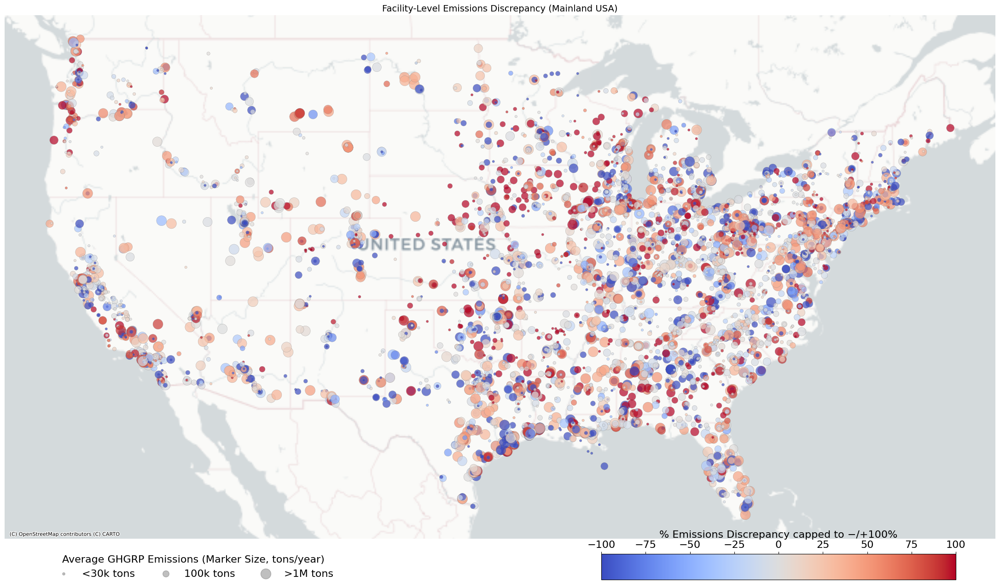

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
import contextily as cx
import numpy as np

# === Load and Filter ===
df = matched_dfs["50m"].copy()
df = df[df["ghgrp_latitude"].notnull() & df["ghgrp_longitude"].notnull()]
df = df[df["ghgrp_emissions_tons"] > 0]

# === Aggregate to one row per facility ===
agg_df = (
    df.groupby("ghgrp_id", as_index=False)
      .agg({
          "ghgrp_facility_name": "first",
          "ghgrp_latitude": "first",
          "ghgrp_longitude": "first",
          "ghgrp_emissions_tons": "mean",
          "emissions_percentage_discrepancy": "mean",
          "ghgrp_STATE": "first"
      })
)

# === Convert to GeoDataFrame and reproject ===
gdf = gpd.GeoDataFrame(
    agg_df,
    geometry=[Point(xy) for xy in zip(agg_df["ghgrp_longitude"], agg_df["ghgrp_latitude"])],
    crs="EPSG:4326"
).to_crs(epsg=3857)

# === Filter Mainland ===
mainland = gdf.cx[-1.7e7:-6.0e6, 2.5e6:7.0e6]

# === Marker Size Scaling (Log)
def scale_size_log(val, min_size=15, max_size=250):
    # New range: 30k to 1M
    val = np.clip(val, 30_000, 1_000_000)
    normed = (np.log10(val) - np.log10(30_000)) / (np.log10(1_000_000) - np.log10(30_000))
    return min_size + normed * (max_size - min_size)

mainland["marker_size"] = mainland["ghgrp_emissions_tons"].apply(scale_size_log)

# === Color Mapping (Diverging)
cmap = plt.cm.coolwarm
vmin, vmax = -100, 100
norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

clipped = mainland["emissions_percentage_discrepancy"].clip(lower=vmin, upper=vmax)
normed_discrepancy = norm(clipped)
mainland["marker_color"] = [mcolors.to_hex(c) for c in cmap(normed_discrepancy)]

# === Plot Setup
fig, ax = plt.subplots(figsize=(22, 14))
mainland.plot(
    ax=ax,
    markersize=mainland["marker_size"],
    color=mainland["marker_color"],
    edgecolor="gray",
    linewidth=0.3,
    alpha=0.7
)
cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)
ax.set_title("Facility-Level Emissions Discrepancy (Mainland USA)", fontsize=14)
ax.axis("off")

# === Marker Size Legend (bottom-left, aligned with colorbar)
legend_ax = fig.add_axes([0.05, 0.03, 0.5, 0.04])  # y = 0.03 for vertical alignment
for val, label in zip([30_000, 100_000, 1_000_000], ["<30k tons", "100k tons", ">1M tons"]):
    size = scale_size_log(val)
    legend_ax.scatter([], [], s=size, c="gray", alpha=0.5, label=label)
legend_ax.legend(
    loc="center left",
    title="Average GHGRP Emissions (Marker Size, tons/year)",
    ncol=3,
    frameon=False
)
legend_ax.axis("off")

# === Colorbar (bottom-right, same height)
cbar_ax = fig.add_axes([0.6, 0.03, 0.35, 0.04])  # x = 0.6 moves it beside the legend
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(
    sm,
    cax=cbar_ax,
    orientation="horizontal",
    label="% Emissions Discrepancy capped to −/+100%"
)
cbar_ax.xaxis.set_ticks_position("top")
cbar_ax.xaxis.set_label_position("top")

plt.tight_layout()
plt.show()

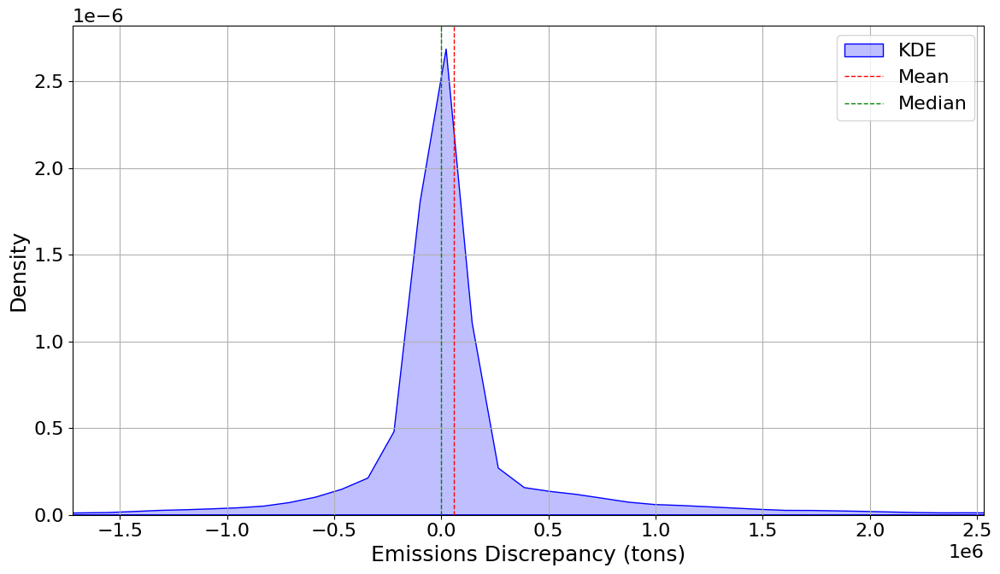

In [ ]:
# Create the KDE plot
plt.figure(figsize=(12, 7))

# Compute percentiles to cut off extreme tails
lower_bound, upper_bound = np.percentile(matched_dfs['5m']['emissions_discrepancy'], [1, 99])

sns.kdeplot(
    matched_dfs['5m']['emissions_discrepancy'],
    fill=True,
    color="blue",
    label="KDE"
)

# Add mean and median lines
plt.axvline(matched_dfs['5m']['emissions_discrepancy'].mean(), color='red', linestyle='dashed', linewidth=1, label="Mean")
plt.axvline(matched_dfs['5m']['emissions_discrepancy'].median(), color='green', linestyle='dashed', linewidth=1, label="Median")

# Labels
plt.xlabel("Emissions Discrepancy (tons)", fontsize=18)
plt.ylabel("Density", fontsize=18)
plt.xlim(lower_bound, upper_bound)  # Limit x-axis to focus on central distribution
plt.legend(fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-95-b2cc59083af3>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


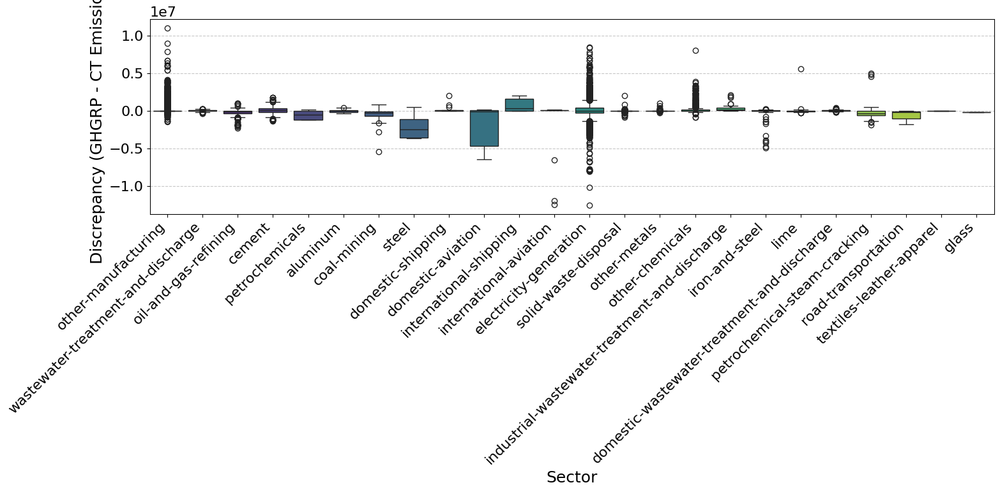

In [ ]:
# Set figure size
plt.figure(figsize=(16, 8))

# Boxplot of discrepancies by sector
sns.boxplot(
    data=matched_dfs['5m'],
    x='ct_subsector',
    y='emissions_discrepancy',
    palette='viridis'
)

# Customize plot
plt.xticks(rotation=45, ha='right', fontsize=16)
plt.yticks(fontsize=16)
plt.xlabel("Sector", fontsize=18)
plt.ylabel("Discrepancy (GHGRP - CT Emissions)", fontsize=18)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show plot
plt.tight_layout()
plt.show()

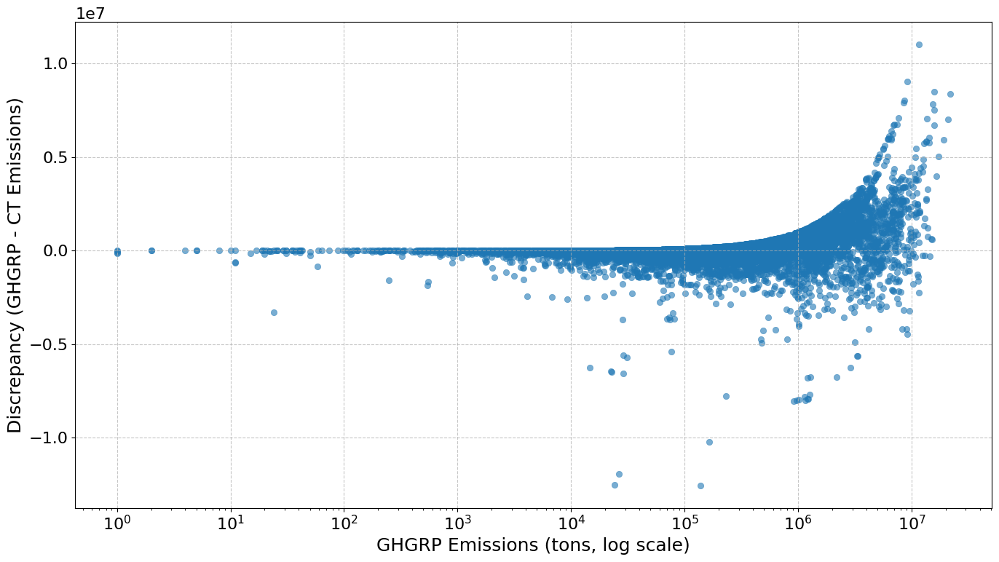

In [ ]:
# Set figure size
plt.figure(figsize=(14, 8))

# Scatter plot
sns.scatterplot(
    data=matched_dfs['5m'],
    x='ghgrp_emissions_tons',
    y='emissions_discrepancy',
    alpha=0.6,
    edgecolor=None
)

# Customize plot
plt.xscale('log')  # Log scale for better visualization if facility sizes vary significantly

# Labels
plt.xlabel("GHGRP Emissions (tons, log scale)", fontsize=18)
plt.ylabel("Discrepancy (GHGRP - CT Emissions)", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

# Show plot
plt.tight_layout()
plt.show()

             state  avg_discrepancy
0          Alabama    102622.936827
1           Alaska    119688.334834
2          Arizona    168703.551804
3         Arkansas     84585.028173
4       California     27455.915852
5         Colorado    126465.501386
6      Connecticut     70370.488662
7         Delaware    211161.395748
9          Florida    145251.619814
10         Georgia   -241576.998438
11          Hawaii    162070.057446
12           Idaho     32868.524921
13        Illinois    -11221.079833
14         Indiana     97568.102692
15            Iowa     74622.607830
16          Kansas    114552.668505
17        Kentucky     26636.373116
18       Louisiana      6262.876117
19           Maine    -85769.861540
20        Maryland   -194206.979583
21   Massachusetts    -71663.076482
22        Michigan     22549.916214
23       Minnesota     80735.148011
24     Mississippi    279588.588454
25        Missouri    137271.017612
26         Montana    249888.712461
27        Nebraska    147074

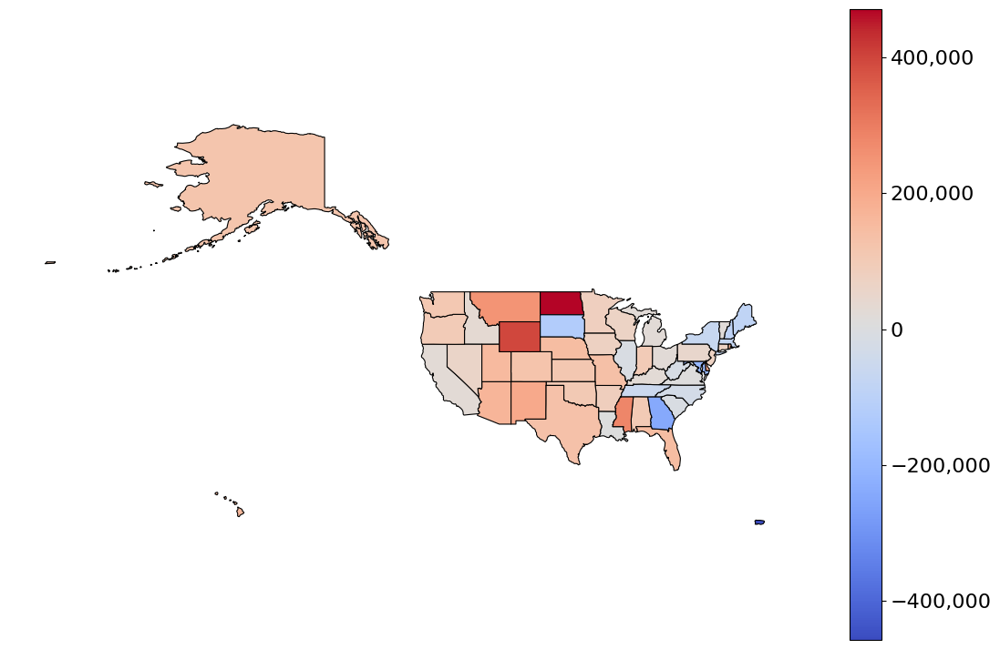

In [ ]:
# Load the US States GeoJSON file
usa = gpd.read_file("https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json")

# Rename for consistency
usa = usa.rename(columns={"name": "state"})

# Aggregate discrepancies by state
state_discrepancy = (
    matched_dfs['5m']
    .groupby('ghgrp_STATE', as_index=False)
    .agg(avg_discrepancy=('emissions_discrepancy', 'mean'))
)

# Convert abbreviations to full names
state_discrepancy['state'] = state_discrepancy['ghgrp_STATE'].map(lambda x: us.states.lookup(x).name if us.states.lookup(x) else x)

# Drop original abbreviation column
state_discrepancy = state_discrepancy.drop(columns=['ghgrp_STATE'])

# Ensure no duplicate columns
state_discrepancy = state_discrepancy.loc[:, ~state_discrepancy.columns.duplicated()]

# Merge with GeoPandas data
usa = usa.merge(state_discrepancy, on="state", how="left")

# Check if merge worked
print(usa[['state', 'avg_discrepancy']].dropna())  # Should not be empty

# Plot the map
fig, ax = plt.subplots(figsize=(14, 9))
usa.plot(column='avg_discrepancy', cmap='coolwarm', linewidth=0.8, edgecolor='black',
         legend=True, missing_kwds={"color": "white", "label": "No Data"}, ax=ax, legend_kwds={"format": "{x:,.0f}"})

# Increase font sizes
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.axis("off")  # Hide axes
plt.show()

<ipython-input-98-081002b4d489>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


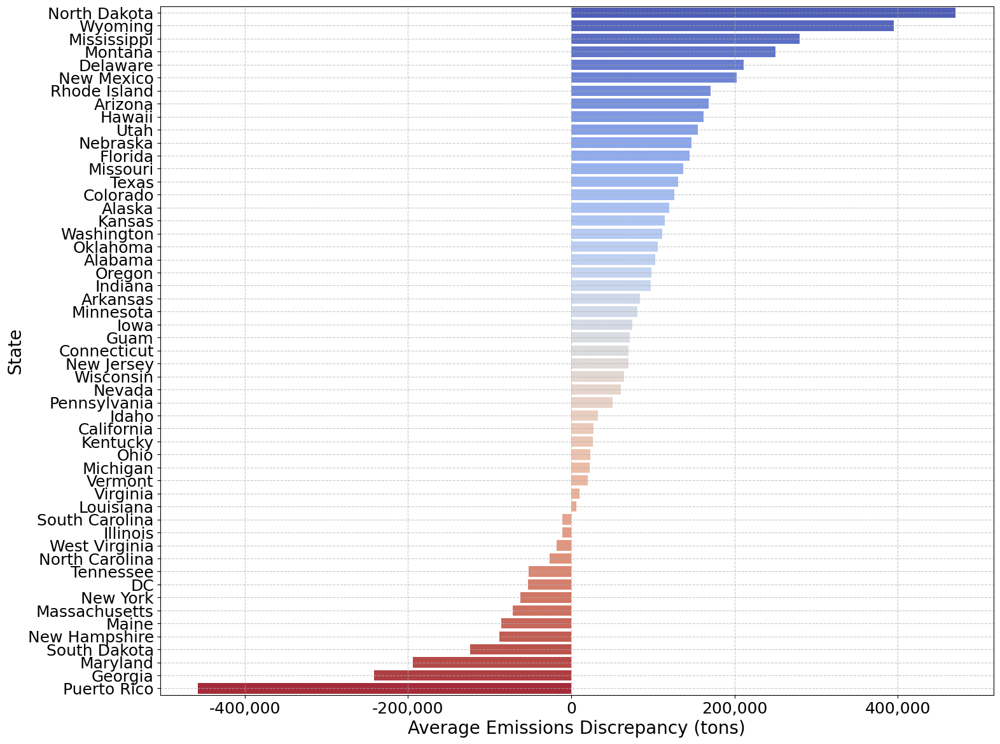

In [ ]:
# Bar plot for state-level discrepancies
plt.figure(figsize=(16, 12))
sns.barplot(
    x='avg_discrepancy',
    y='state',
    data=state_discrepancy.sort_values(by='avg_discrepancy', ascending=False),
    palette="coolwarm"
)

# Labels
plt.xlabel("Average Emissions Discrepancy (tons)", fontsize=20)
plt.ylabel("State", fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(True, linestyle='--', alpha=0.7)
plt.gca().xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.tight_layout()
plt.show()

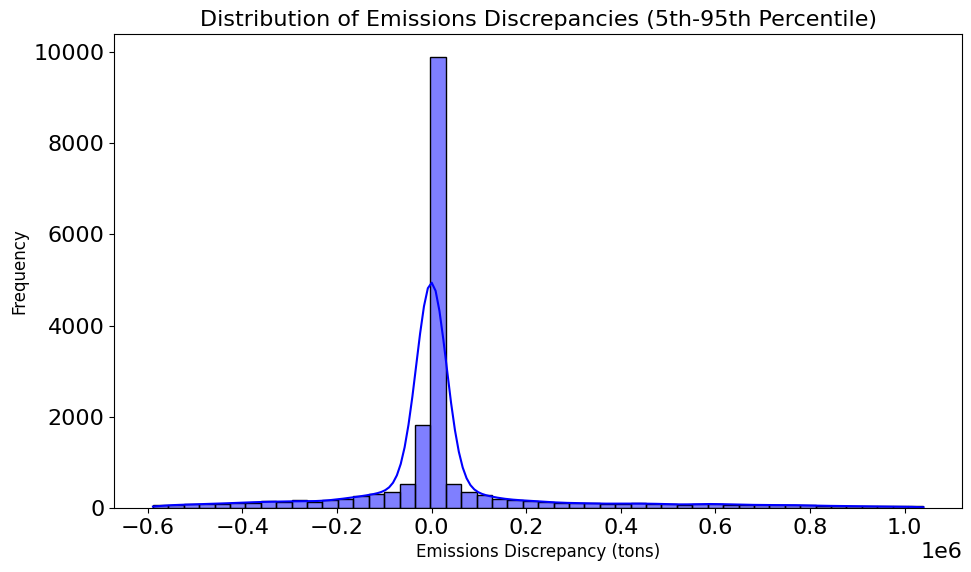

In [ ]:
# Define 5th and 95th percentiles to cut off extremes
lower_bound = matched_dfs['5m']['emissions_discrepancy'].quantile(0.05)
upper_bound = matched_dfs['5m']['emissions_discrepancy'].quantile(0.95)

# Filter data to exclude extreme values
filtered_data = matched_dfs['5m'][
    (matched_dfs['5m']['emissions_discrepancy'] >= lower_bound) &
    (matched_dfs['5m']['emissions_discrepancy'] <= upper_bound)
]

# Plot histogram of emissions discrepancies
plt.figure(figsize=(10, 6))
sns.histplot(
    filtered_data['emissions_discrepancy'],
    bins=50,
    kde=True,
    color="blue"
)
plt.title("Distribution of Emissions Discrepancies (5th-95th Percentile)", fontsize=16)
plt.xlabel("Emissions Discrepancy (tons)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.tight_layout()
plt.show()

Percentage of rows in the first bin: 75.64%
The first bin includes values from 0 to 251496.48 tons.
Minimum absolute emissions discrepancy: 0.00 tons
Maximum absolute emissions discrepancy: 12574824.00 tons


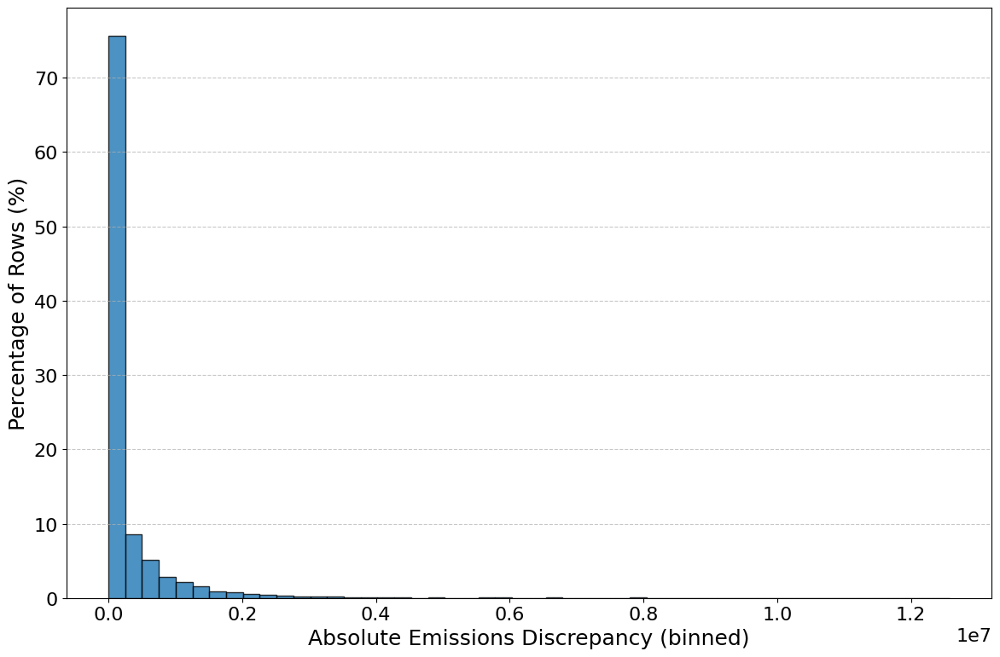

In [ ]:
# Prepare Data
df = matched_dfs['5m']

df['abs_emissions_discrepancy'] = df['emissions_discrepancy'].abs()
num_bins = 50  # Reduce the number of bins for better readability

# Get histogram data
counts, bin_edges = np.histogram(df['abs_emissions_discrepancy'], bins=num_bins)
first_bin_percentage = (counts[0] / len(df)) * 100
first_bin_upper_limit = bin_edges[1]

min_value = df['abs_emissions_discrepancy'].min()
max_value = df['abs_emissions_discrepancy'].max()

print(f"Percentage of rows in the first bin: {first_bin_percentage:.2f}%")
print(f"The first bin includes values from 0 to {first_bin_upper_limit:.2f} tons.")
print(f"Minimum absolute emissions discrepancy: {min_value:.2f} tons")
print(f"Maximum absolute emissions discrepancy: {max_value:.2f} tons")

# Create the histogram
plt.figure(figsize=(12, 8))
plt.hist(df['abs_emissions_discrepancy'], bins=num_bins, weights=[100/len(df)]*len(df), edgecolor='black', alpha=0.8)

# Labels
plt.xlabel('Absolute Emissions Discrepancy (binned)', fontsize=18)
plt.ylabel('Percentage of Rows (%)', fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<ipython-input-101-07d94f6280a7>:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


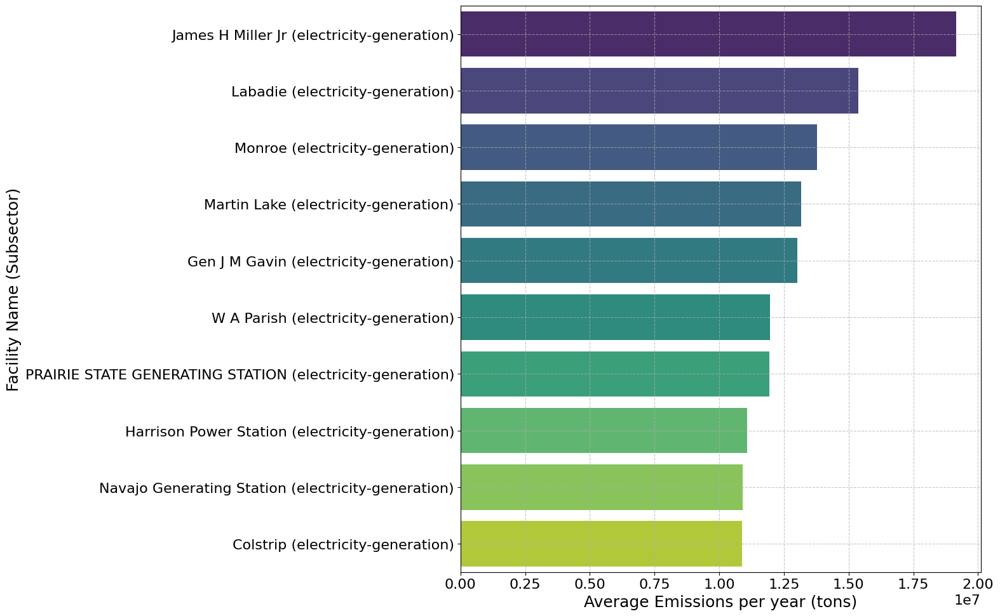

In [ ]:
# Concatenate the facility name with ct_subsector in brackets
matched_dfs['5m']['facility_with_subsector'] = (
    matched_dfs['5m']['ghgrp_facility_name'] +
    " (" + matched_dfs['5m']['ct_subsector'].fillna("Unknown") + ")"
)

# Group by facility name (with subsector), calculate mean emissions
average_emissions = (
    matched_dfs['5m']
    .groupby('facility_with_subsector')['ghgrp_emissions_tons']
    .mean()
    .reset_index()
    .sort_values(by='ghgrp_emissions_tons', ascending=False)
)

# Extract the top 10 unique facilities by average emissions
top_10_facilities = average_emissions.head(10)

# Plotting the top 10 facilities
plt.figure(figsize=(16, 10))
sns.barplot(
    x='ghgrp_emissions_tons',
    y='facility_with_subsector',
    data=top_10_facilities,
    palette='viridis',
    orient='h'  # Horizontal bar plot
)

# Labels
plt.xlabel("Average Emissions per year (tons)", fontsize=18)
plt.ylabel("Facility Name (Subsector)", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<ipython-input-102-7049c4012d11>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


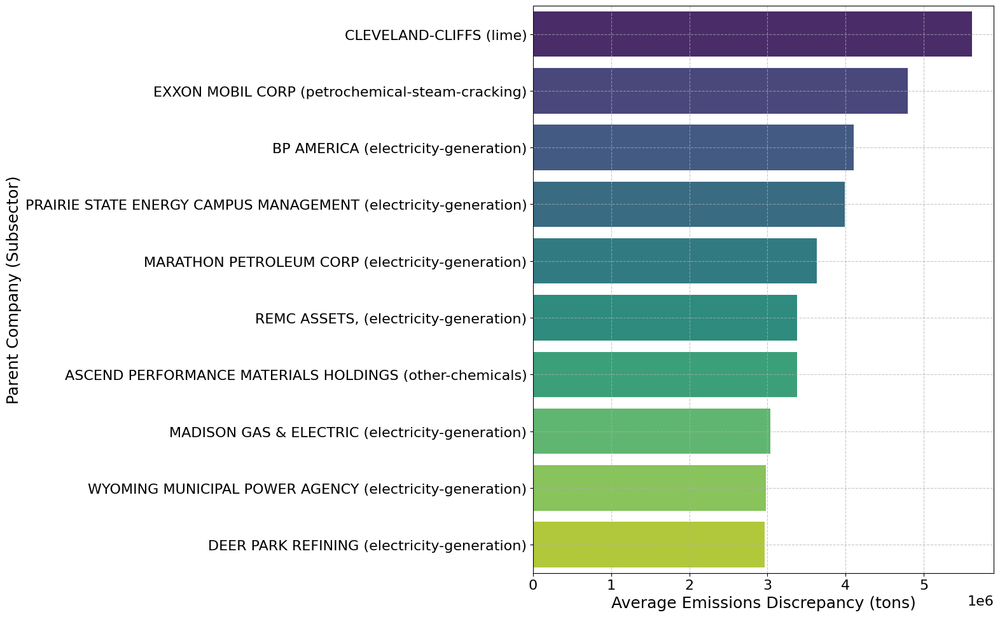

In [ ]:
# Function to process parent companies
def process_parent_companies(value):
    if pd.isna(value):
        return ["Other"]  # Replace NaN with 'Other'
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))  # Remove anything in parentheses
    companies = [company.strip() for company in cleaned_value.split(';')]  # Split by ';' and strip whitespace
    return companies

# Apply the function to split parent companies
matched_dfs['5m']['ghgrp_parent_companies_processed'] = matched_dfs['5m']['ghgrp_parent_companies'].apply(process_parent_companies)

# Explode the DataFrame to separate each parent company into its own row
exploded_df = matched_dfs['5m'].explode('ghgrp_parent_companies_processed')

# Rename the exploded column for clarity
exploded_df = exploded_df.rename(columns={'ghgrp_parent_companies_processed': 'parent_company'})

# Concatenate the parent company name with ct_subsector in brackets
exploded_df['parent_company_with_subsector'] = (
    exploded_df['parent_company'] +
    " (" + exploded_df['ct_subsector'].fillna("Unknown") + ")"
)

# Aggregate discrepancies by individual parent companies
parent_company_discrepancy = (
    exploded_df.groupby('parent_company_with_subsector')['emissions_discrepancy']
    .mean()
    .reset_index()
)

# Get the top 10 parent companies by average discrepancy
top_parent_companies = parent_company_discrepancy.nlargest(10, 'emissions_discrepancy')

# Bar plot for top parent companies
plt.figure(figsize=(16, 10))
sns.barplot(
    x='emissions_discrepancy',
    y='parent_company_with_subsector',
    data=top_parent_companies,
    palette="viridis"
)

# Labels
plt.xlabel("Average Emissions Discrepancy (tons)", fontsize=18)
plt.ylabel("Parent Company (Subsector)", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

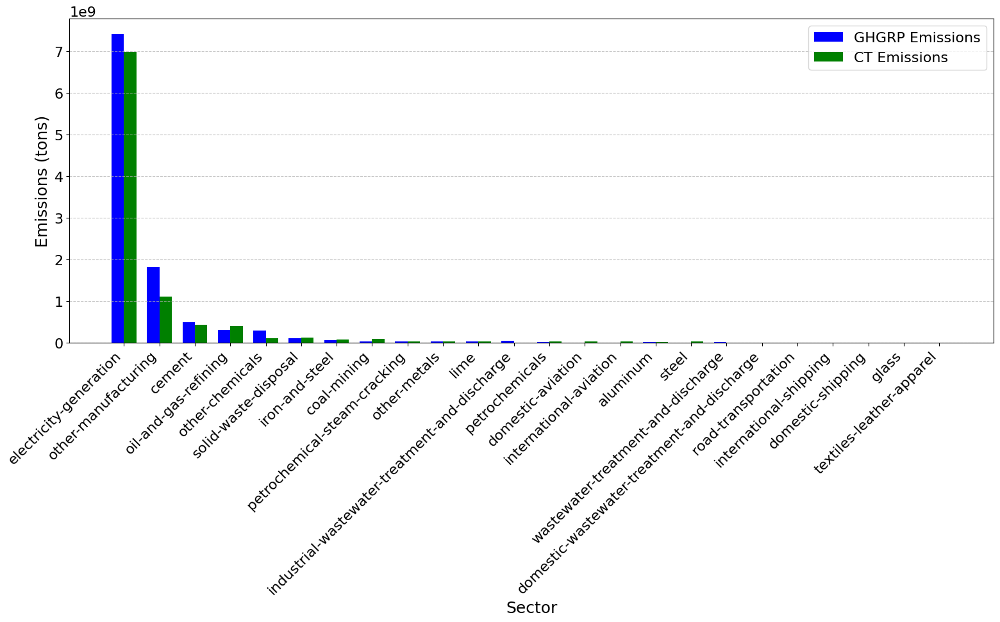

In [ ]:
# Aggregate emissions by sector and sort in descending order
sector_comparison = matched_dfs['5m'].groupby('ct_subsector')[
    ['ghgrp_emissions_tons', 'ct_emissions_quantity']
].sum().reset_index()

# Add a column for total emissions (for sorting)
sector_comparison['total_emissions'] = (
    sector_comparison['ghgrp_emissions_tons'] + sector_comparison['ct_emissions_quantity']
)

# Sort by total emissions in descending order
sector_comparison = sector_comparison.sort_values(by='total_emissions', ascending=False)

# Plot side-by-side bar chart
plt.figure(figsize=(16, 10))
width = 0.35  # Width of each bar

# X positions for bars
x = np.arange(len(sector_comparison['ct_subsector']))

plt.bar(
    x - width/2,
    sector_comparison['ghgrp_emissions_tons'],
    width=width,
    label='GHGRP Emissions',
    color='blue'
)
plt.bar(
    x + width/2,
    sector_comparison['ct_emissions_quantity'],
    width=width,
    label='CT Emissions',
    color='green'
)

# Labels and legend
plt.xlabel("Sector", fontsize=18)
plt.ylabel("Emissions (tons)", fontsize=18)
plt.xticks(x, sector_comparison['ct_subsector'], rotation=45, ha='right', fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

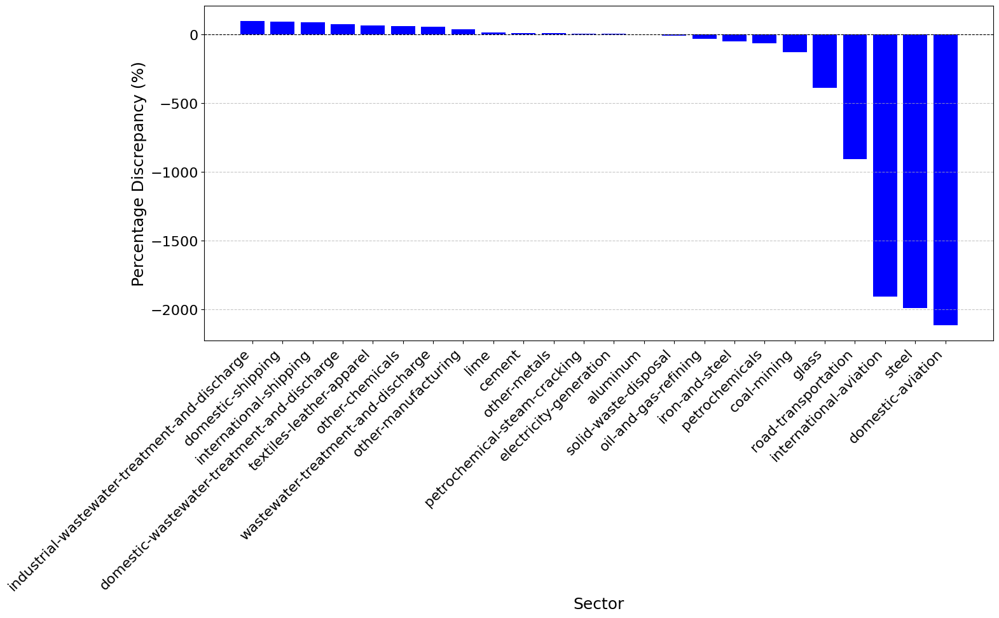

In [ ]:
# Aggregate emissions by sector and calculate percentage discrepancies
sector_comparison = matched_dfs['5m'].groupby('ct_subsector')[
    ['ghgrp_emissions_tons', 'ct_emissions_quantity']
].sum().reset_index()

# Calculate percentage discrepancy
sector_comparison['percentage_discrepancy'] = (
    (sector_comparison['ghgrp_emissions_tons'] - sector_comparison['ct_emissions_quantity'])
    / sector_comparison['ghgrp_emissions_tons']
) * 100

# Sort by absolute percentage discrepancies in descending order
sector_comparison = sector_comparison.sort_values(by='percentage_discrepancy', ascending=False)

# Plot percentage discrepancies
plt.figure(figsize=(16, 10))
plt.bar(
    sector_comparison['ct_subsector'],
    sector_comparison['percentage_discrepancy'],
    color='blue'
)

# Labels
plt.xlabel("Sector", fontsize=18)
plt.ylabel("Percentage Discrepancy (%)", fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=16)
plt.yticks(fontsize=16)
plt.axhline(0, color='black', linewidth=0.8, linestyle='--')  # Add a horizontal line at 0
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

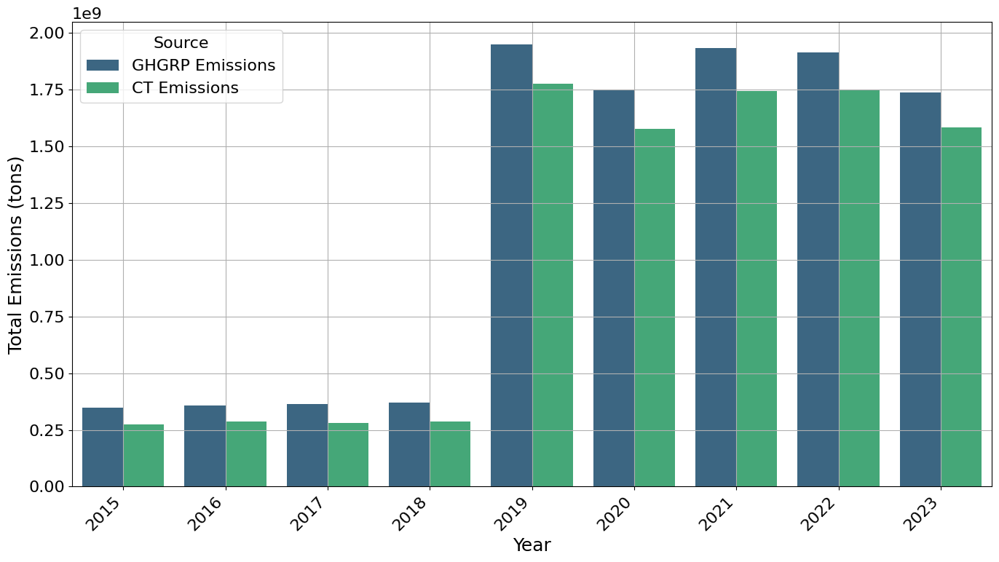

In [ ]:
# Aggregate GHGRP and CT emissions by year
yearly_emissions = (
    matched_dfs['5m']
    .groupby('ghgrp_year')[['ghgrp_emissions_tons', 'ct_emissions_quantity']]
    .sum()
    .reset_index()
)

# Reshape the data for easier plotting
yearly_emissions_melted = yearly_emissions.melt(
    id_vars='ghgrp_year',
    value_vars=['ghgrp_emissions_tons', 'ct_emissions_quantity'],
    var_name='Source',
    value_name='Total Emissions'
)

# Map source names for better labels
source_map = {
    'ghgrp_emissions_tons': 'GHGRP Emissions',
    'ct_emissions_quantity': 'CT Emissions'
}
yearly_emissions_melted['Source'] = yearly_emissions_melted['Source'].map(source_map)

# Plot the bar chart
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 16})  # Increase font size globally
sns.barplot(
    x='ghgrp_year',
    y='Total Emissions',
    hue='Source',
    data=yearly_emissions_melted,
    palette='viridis'
)

# Labels
plt.xlabel("Year", fontsize=18)
plt.ylabel("Total Emissions (tons)", fontsize=18)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Source", fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()

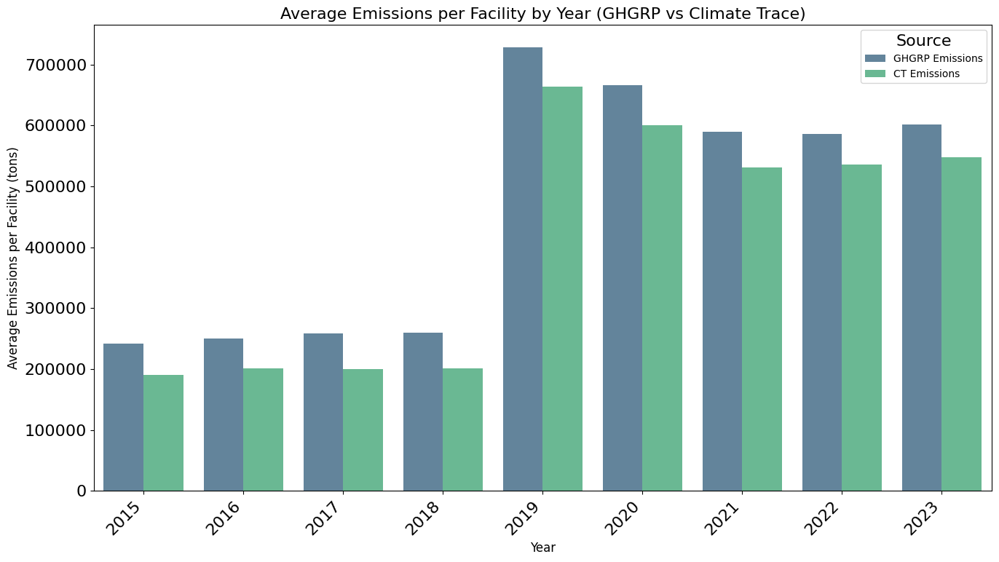

In [ ]:
# Calculate average emissions per facility per year
yearly_avg_emissions_per_facility = (
    matched_dfs['5m']
    .groupby(['ghgrp_year', 'ghgrp_id'])[['ghgrp_emissions_tons', 'ct_emissions_quantity']]
    .mean()
    .groupby('ghgrp_year')
    .mean()
    .reset_index()
)

# Reshape the data for easier plotting
yearly_avg_emissions_per_facility_melted = yearly_avg_emissions_per_facility.melt(
    id_vars='ghgrp_year',
    value_vars=['ghgrp_emissions_tons', 'ct_emissions_quantity'],
    var_name='Source',
    value_name='Average Emissions per Facility'
)

# Map source names for better labels
source_map = {
    'ghgrp_emissions_tons': 'GHGRP Emissions',
    'ct_emissions_quantity': 'CT Emissions'
}
yearly_avg_emissions_per_facility_melted['Source'] = yearly_avg_emissions_per_facility_melted['Source'].map(source_map)

# Plot the bar chart
plt.figure(figsize=(14, 8))
sns.barplot(
    x='ghgrp_year',
    y='Average Emissions per Facility',
    hue='Source',
    data=yearly_avg_emissions_per_facility_melted,
    palette='viridis',
    alpha=0.8
)

# Customize plot
plt.title("Average Emissions per Facility by Year (GHGRP vs Climate Trace)", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Average Emissions per Facility (tons)", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Source", fontsize=10)
plt.tight_layout()
plt.show()

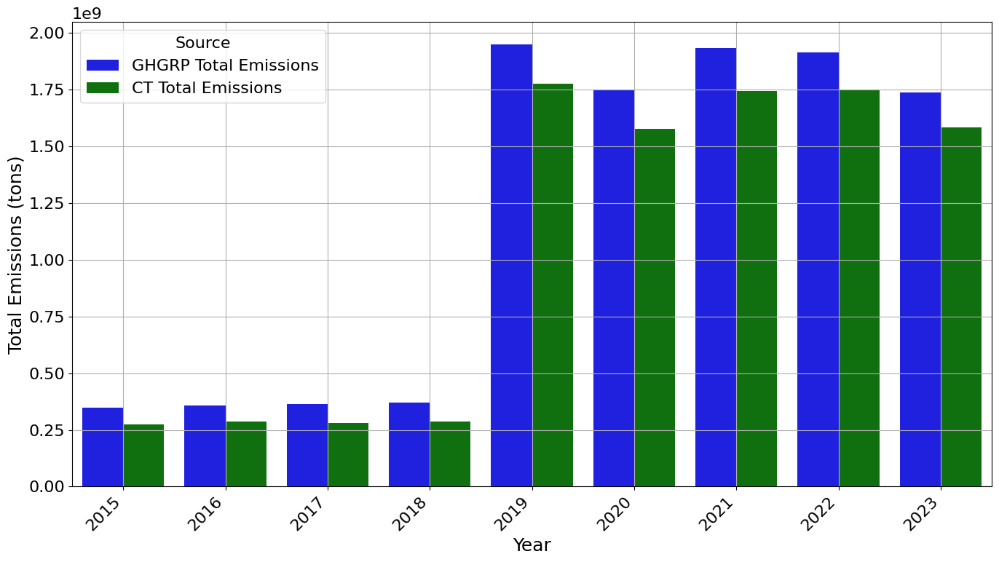

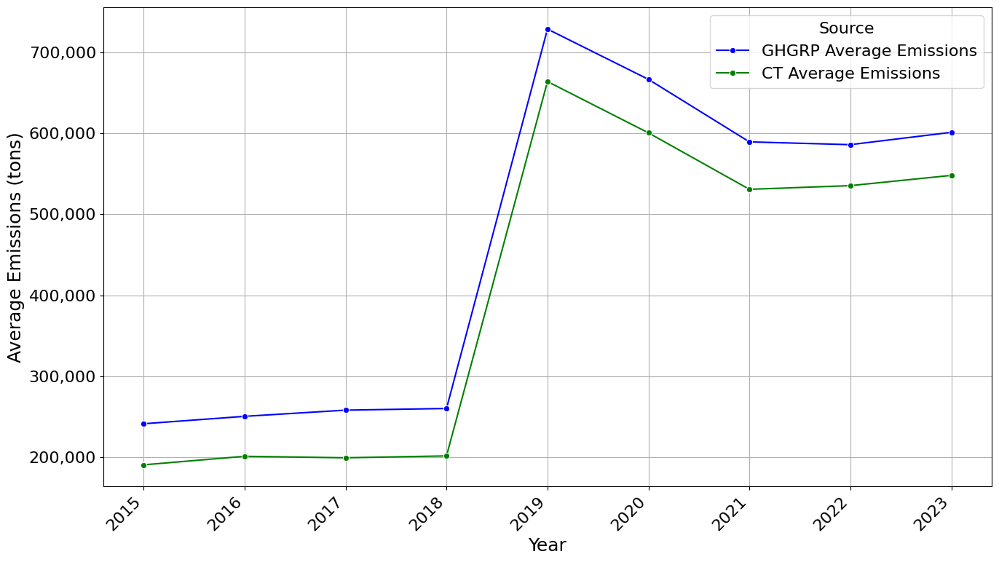

In [ ]:
# Aggregate GHGRP and CT emissions by year (sum and mean)
yearly_emissions = (
    matched_dfs['5m']
    .groupby('ghgrp_year')[['ghgrp_emissions_tons', 'ct_emissions_quantity']]
    .agg(['sum', 'mean'])
    .reset_index()
)

# Flatten MultiIndex columns
yearly_emissions.columns = ['ghgrp_year', 'ghgrp_emissions_total', 'ghgrp_emissions_avg',
                            'ct_emissions_total', 'ct_emissions_avg']

# Reshape the data for easier plotting (sum for bar plot)
yearly_emissions_melted = yearly_emissions.melt(
    id_vars='ghgrp_year',
    value_vars=['ghgrp_emissions_total', 'ct_emissions_total'],
    var_name='Source',
    value_name='Total Emissions'
)

# Map source names for better labels
source_map = {
    'ghgrp_emissions_total': 'GHGRP Total Emissions',
    'ct_emissions_total': 'CT Total Emissions'
}
yearly_emissions_melted['Source'] = yearly_emissions_melted['Source'].map(source_map)

# Plot the bar chart for total emissions
plt.figure(figsize=(14, 8))
plt.rcParams.update({'font.size': 16})  # Increase font size globally
sns.barplot(
    x='ghgrp_year',
    y='Total Emissions',
    hue='Source',
    data=yearly_emissions_melted,
    palette=['blue', 'green']
)

# Labels
plt.xlabel("Year", fontsize=18)
plt.ylabel("Total Emissions (tons)", fontsize=18)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Source", fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()

# Reshape the data for averages
yearly_avg_emissions_melted = yearly_emissions.melt(
    id_vars='ghgrp_year',
    value_vars=['ghgrp_emissions_avg', 'ct_emissions_avg'],
    var_name='Source',
    value_name='Average Emissions'
)

# Map source names for averages
avg_source_map = {
    'ghgrp_emissions_avg': 'GHGRP Average Emissions',
    'ct_emissions_avg': 'CT Average Emissions'
}
yearly_avg_emissions_melted['Source'] = yearly_avg_emissions_melted['Source'].map(avg_source_map)

# Plot the line chart for average emissions
plt.figure(figsize=(14, 8))
sns.lineplot(
    x='ghgrp_year',
    y='Average Emissions',
    hue='Source',
    data=yearly_avg_emissions_melted,
    marker='o',
    palette=['blue', 'green']
)

# Labels
plt.xlabel("Year", fontsize=18)
plt.ylabel("Average Emissions (tons)", fontsize=18)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Source", fontsize=16)
plt.grid(True)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.tight_layout()
plt.show()

In [ ]:
# Calculate the number of rows per year in matched_dfs['5m']
matched_row_counts = matched_dfs['5m'].groupby('ghgrp_year').size().rename('Matched Rows')

# Display the counts
print("Number of rows per year in matched_dfs['5m']:")
display(matched_row_counts)

Number of rows per year in matched_dfs['5m']:


,Matched Rows
ghgrp_year,
2015,1434
2016,1422
2017,1405
2018,1427
2019,2677
2020,2628
2021,3282
2022,3267
2023,2890


In [ ]:
# Select specific columns to display
columns_to_display = [
    'ghgrp_year', 'ghgrp_facility_name',
    'ghgrp_city_name', 'ghgrp_county_name',
    'ghgrp_parent_companies', 'ghgrp_emissions_tons', 'ghgrp_subparts',

    'ct_emissions_quantity', 'ct_source_name', 'ct_subsector',
 'distance',
    'emissions_discrepancy'
]

# Display 10 random rows with the selected columns
display(matched_dfs['5m'][columns_to_display].sample(10, random_state=42))

,ghgrp_year,ghgrp_facility_name,ghgrp_city_name,ghgrp_county_name,ghgrp_parent_companies,ghgrp_emissions_tons,ghgrp_subparts,ct_emissions_quantity,ct_source_name,ct_subsector,distance,emissions_discrepancy
19637,2023,Pastoria Energy Facility,LEBEC,Kern County,CPN MANAGEMENT,1800309,Electricity Generation,869650.000000,"Pastoria Energy Facility, LLC",electricity-generation,0.000000,930659.000000
16227,2022,"MORTON SALT, INC.",SILVER SPRINGS,Wyoming County,STONE CANYON INDUSTRIES HOLDINGS,52152,General Stationary Fuel Combustion Sources,54274.000000,Indeck Silver Springs Energy Center,electricity-generation,0.003181,-2122.000000
7649,2019,Pasadena Plant,Pasadena,Harris County,ENTERPRISE PRODUCTS PARTNERS,46294,General Stationary Fuel Combustion Sources,46296.042790,Pasadena Plant,other-manufacturing,0.000000,-2.042790
1402,2015,WILSONART LLC-TEMPLE NORTH,TEMPLE,Bell County,CLAYTON DUBILIER & RICE; ILLINOIS TOOL WORKS,26184,General Stationary Fuel Combustion Sources,26183.656620,WILSONART LLC-TEMPLE NORTH,other-manufacturing,0.000000,0.343380
1328,2015,US ARMY RADFORD ARMY AMMUNITION PLANT,RADFORD,Montgomery County,Other,285813,General Stationary Fuel Combustion Sources,285850.771300,US ARMY RADFORD ARMY AMMUNITION PLANT,other-manufacturing,0.000000,-37.771300
16105,2022,Lewis Creek,WILLIS,Montgomery County,ENTERGY CORP,1060698,"General Stationary Fuel Combustion Sources, El...",843000.000000,Lewis Creek,electricity-generation,0.000806,217698.000000
17843,2023,Billy Wright Landfill,Los Banos,Merced County,MERCED COUNTY REGIONAL WASTE MANAGEMENT AUTHORITY,48218,Municipal Solid Waste Landfills,44187.574480,Billy Wright Landfill,solid-waste-disposal,0.000882,4030.425520
9988,2020,Matalco Inc.,Bluffton,Wells County,ALEXIN,23882,General Stationary Fuel Combustion Sources,25546.129500,Matalco Inc.,other-manufacturing,0.000000,-1664.129500
16295,2022,McKinley Paper WI Company,COMBINED LOCKS,Outagamie County,APPLETON PROPERTY VENTURES,260304,"General Stationary Fuel Combustion Sources, El...",63765.000000,Combined Locks Energy Center,electricity-generation,0.002833,196539.000000
18559,2023,GEORGIA-PACIFIC Crossett LLC,CROSSETT,Ashley County,KOCH INDUSTRIES,265878,"General Stationary Fuel Combustion Sources, In...",43839.934684,"Ingevity Arkansas, LLC",other-chemicals,0.003619,222038.065316


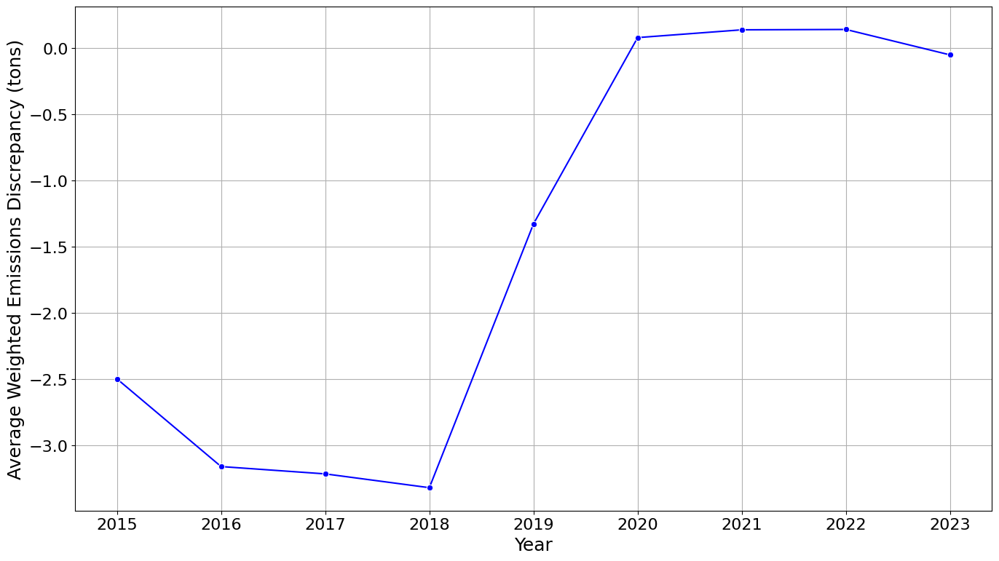

In [ ]:
# Aggregate discrepancies by year
yearly_discrepancy = matched_dfs['5m'].groupby('ghgrp_year')['weighted_percentage_discrepancy'].mean().reset_index()

# Line plot for temporal trends
plt.figure(figsize=(14, 8))
sns.lineplot(x='ghgrp_year', y='weighted_percentage_discrepancy', data=yearly_discrepancy, marker='o', color='blue')

# Labels
plt.xlabel("Year", fontsize=18)
plt.ylabel("Average Weighted Emissions Discrepancy (tons)", fontsize=18)
plt.grid(True)
plt.tight_layout()
plt.show()

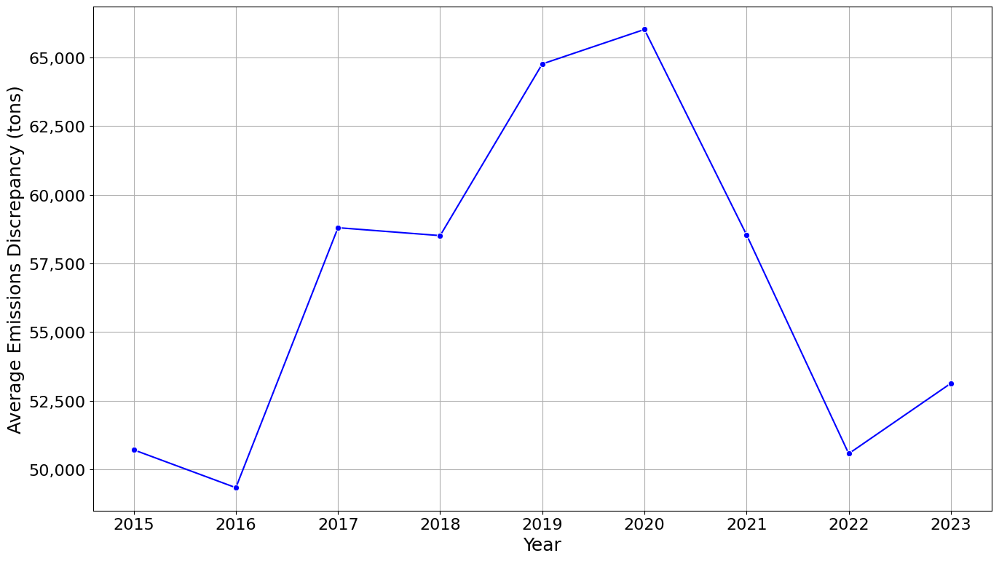

In [ ]:
# Aggregate discrepancies by year
yearly_discrepancy = matched_dfs['5m'].groupby('ghgrp_year')['emissions_discrepancy'].mean().reset_index()

# Line plot for temporal trends
plt.figure(figsize=(14, 8))
sns.lineplot(x='ghgrp_year', y='emissions_discrepancy', data=yearly_discrepancy, marker='o', color='blue')

# Labels
plt.xlabel("Year", fontsize=18)
plt.ylabel("Average Emissions Discrepancy (tons)", fontsize=18)
plt.grid(True)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.tight_layout()
plt.show()

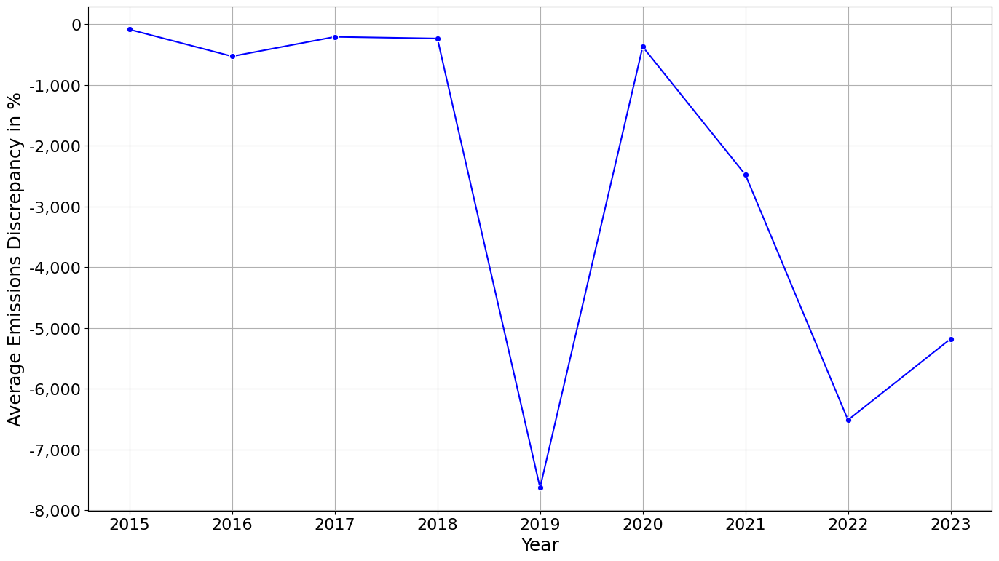

In [ ]:
# Aggregate discrepancies by year
yearly_discrepancy = matched_dfs['5m'].groupby('ghgrp_year')['emissions_percentage_discrepancy'].mean().reset_index()

# Line plot for temporal trends
plt.figure(figsize=(14, 8))
sns.lineplot(x='ghgrp_year', y='emissions_percentage_discrepancy', data=yearly_discrepancy, marker='o', color='blue')

# Labels
plt.xlabel("Year", fontsize=18)
plt.ylabel("Average Emissions Discrepancy in %", fontsize=18)
plt.grid(True)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.tight_layout()
plt.show()

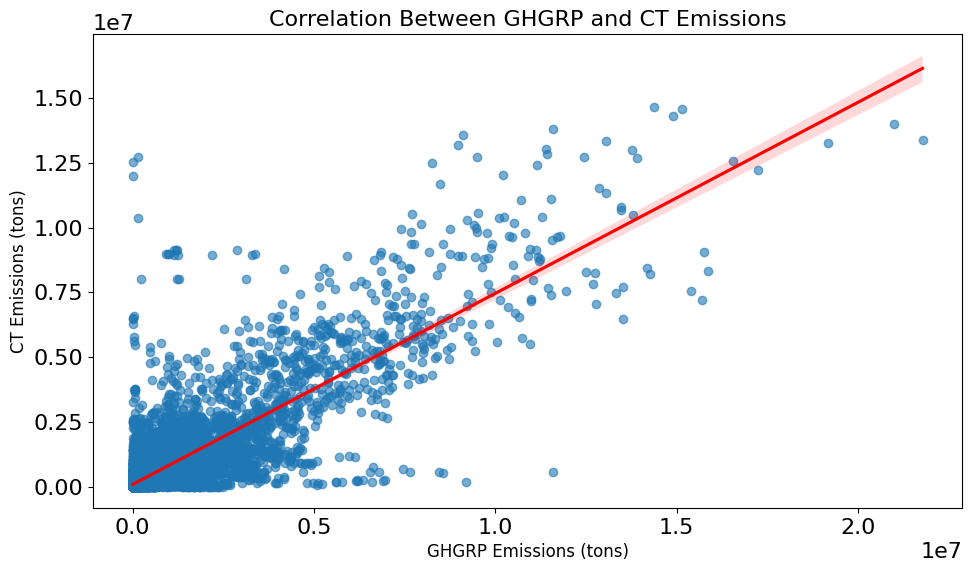

In [ ]:
# Scatter plot with trendline
plt.figure(figsize=(10, 6))
sns.regplot(
    x='ghgrp_emissions_tons',
    y='ct_emissions_quantity',
    data=matched_dfs['5m'],
    scatter_kws={'alpha': 0.6},
    line_kws={"color": "red"}
)
plt.title("Correlation Between GHGRP and CT Emissions", fontsize=16)
plt.xlabel("GHGRP Emissions (tons)", fontsize=12)
plt.ylabel("CT Emissions (tons)", fontsize=12)
plt.tight_layout()
plt.show()

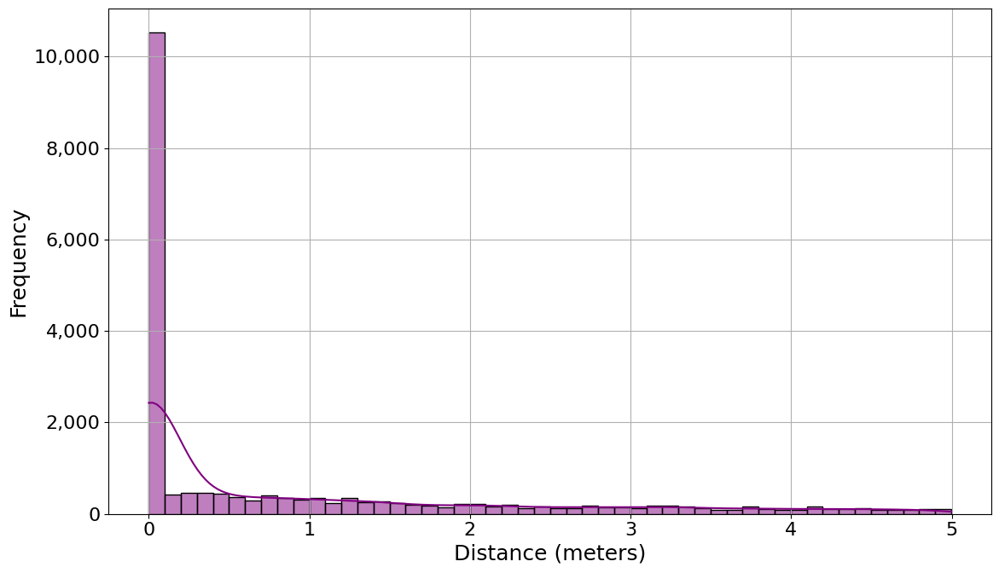

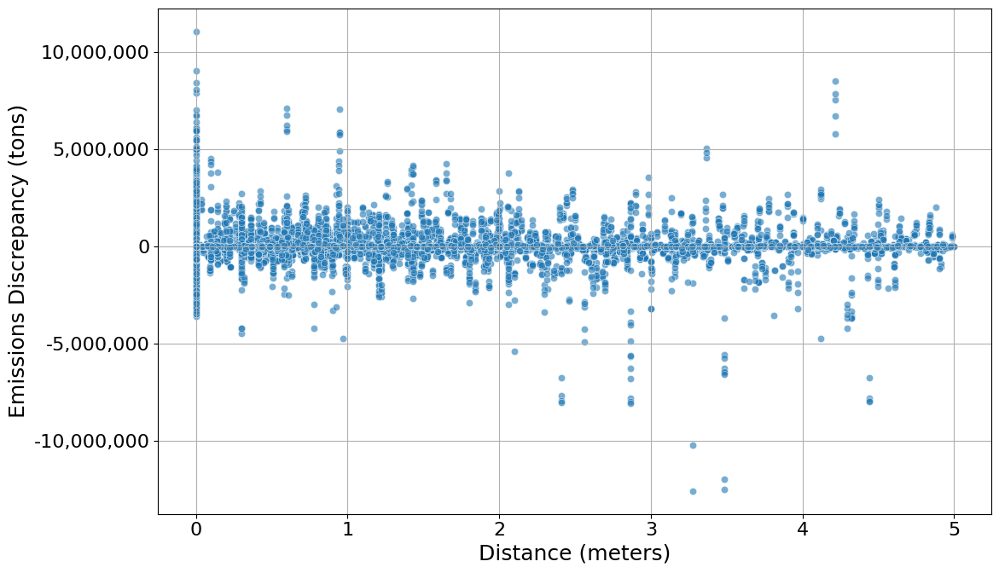

In [ ]:
# Histogram for distances
plt.figure(figsize=(12, 7))
sns.histplot(
    matched_dfs['5m']['distance'] * 1000,  # Convert km to meters
    bins=50,
    kde=True,
    color="purple"
)
plt.xlabel("Distance (meters)", fontsize=18)
plt.ylabel("Frequency", fontsize=18)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.grid(True)
plt.tight_layout()
plt.show()

# Scatter plot for distance vs. emissions discrepancy
plt.figure(figsize=(12, 7))
sns.scatterplot(
    x=matched_dfs['5m']['distance'] * 1000,  # Convert km to meters
    y=matched_dfs['5m']['emissions_discrepancy'],
    alpha=0.6
)
plt.xlabel("Distance (meters)", fontsize=18)
plt.ylabel("Emissions Discrepancy (tons)", fontsize=18)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.grid(True)
plt.tight_layout()
plt.show()

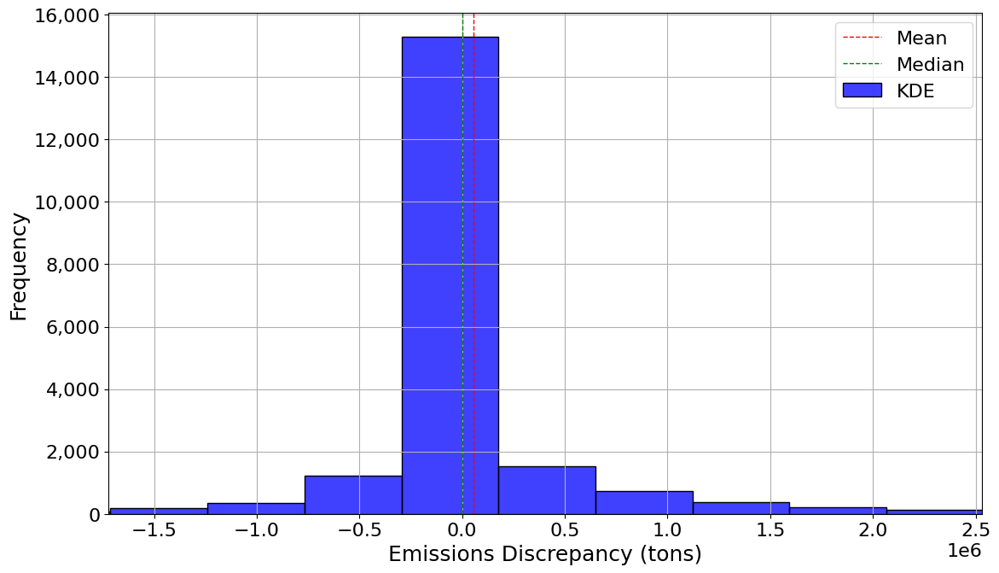

In [ ]:
# Compute the 1st and 99th percentiles
lower_bound = matched_dfs['5m']['emissions_discrepancy'].quantile(0.01)
upper_bound = matched_dfs['5m']['emissions_discrepancy'].quantile(0.99)

# Plot the histogram and KDE
plt.figure(figsize=(12, 7))
sns.histplot(
    matched_dfs['5m']['emissions_discrepancy'],
    bins=50, color="blue", label="KDE"
)

# Add vertical lines for mean and median
plt.axvline(matched_dfs['5m']['emissions_discrepancy'].mean(), color='red', linestyle='dashed', linewidth=1, label="Mean")
plt.axvline(matched_dfs['5m']['emissions_discrepancy'].median(), color='green', linestyle='dashed', linewidth=1, label="Median")

# Set axis labels and limits
plt.xlabel("Emissions Discrepancy (tons)", fontsize=18)
plt.ylabel("Frequency", fontsize=18)
plt.xlim(lower_bound, upper_bound)  # Focus on central 98%
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
plt.legend(fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()

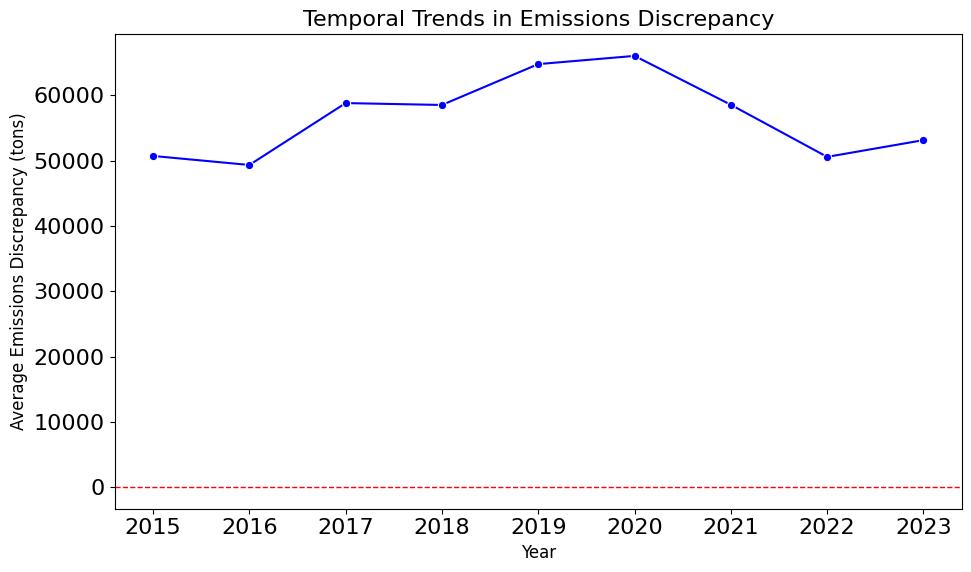

In [ ]:
# 2. Temporal Trend (Line Plot)
yearly_discrepancy = matched_dfs['5m'].groupby('ghgrp_year')['emissions_discrepancy'].mean().reset_index()
plt.figure(figsize=(10, 6))
sns.lineplot(data=yearly_discrepancy, x='ghgrp_year', y='emissions_discrepancy', marker='o', color='blue')
plt.title("Temporal Trends in Emissions Discrepancy", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Average Emissions Discrepancy (tons)", fontsize=12)
plt.axhline(0, color='red', linestyle='dashed', linewidth=1)  # Highlight zero line
plt.tight_layout()
plt.show()

<ipython-input-117-649573ebe80f>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=matched_dfs['5m'], x='ghgrp_year', y='emissions_discrepancy', palette="Set3")


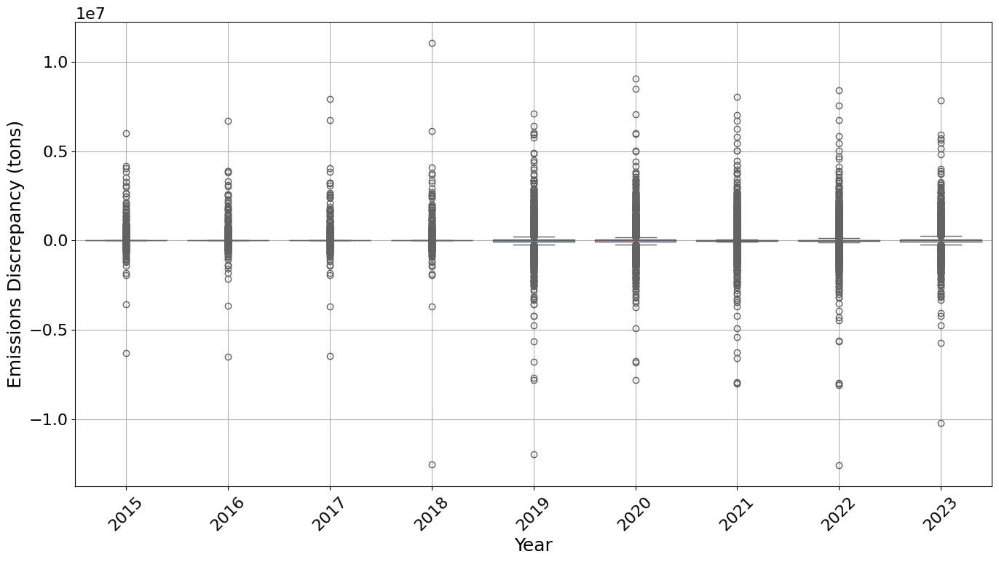

In [ ]:
# 3. Boxplot by Category (e.g., County or Parent Company)
plt.figure(figsize=(14, 8))
sns.boxplot(data=matched_dfs['5m'], x='ghgrp_year', y='emissions_discrepancy', palette="Set3")

# Labels
plt.xlabel("Year", fontsize=18)
plt.ylabel("Emissions Discrepancy (tons)", fontsize=18)
plt.xticks(rotation=45, fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Find the row with the smallest emissions_percentage_discrepancy
min_discrepancy_row = matched_dfs['5m'].loc[matched_dfs['5m']['emissions_percentage_discrepancy'].idxmin()]

# Display the row
print("\nRow with the smallest emissions_percentage_discrepancy:")
display(min_discrepancy_row)


Row with the smallest emissions_percentage_discrepancy:


,6989
ghgrp_year,2019
ghgrp_facility_name,J T Deely
ghgrp_id,1001039
ghgrp_reported_address,12940 S US Hwy 181
ghgrp_latitude,29.3072
ghgrp_longitude,-98.3228
ghgrp_city_name,SAN ANTONIO
ghgrp_county_name,Bexar County
ghgrp_STATE,TX
ghgrp_zip_code,78223


# Test which transformation to apply to DP variable


=== Normality Checks ===
Dependent Variable:
Shapiro-Wilk p-value: 2.1948e-111
D'Agostino p-value: 0.0000e+00

Residuals:
Shapiro-Wilk p-value: 3.0091e-112
D'Agostino p-value: 0.0000e+00

=== Heteroscedasticity Check ===
Breusch-Pagan Test p-value: 3.7062e-266


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17767.
  res = hypotest_fun_out(*samples, **kwds)


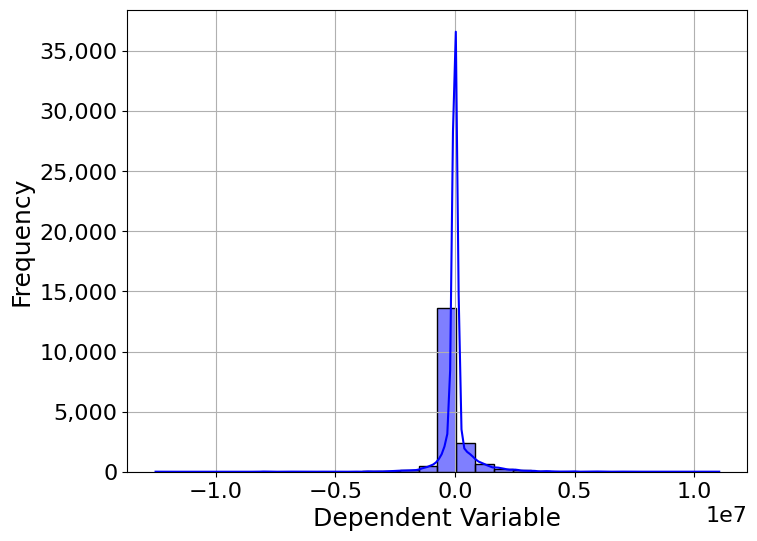

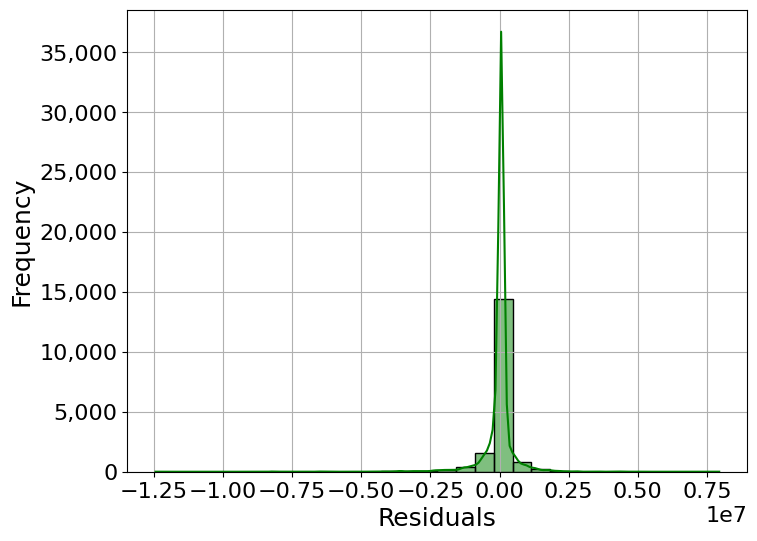

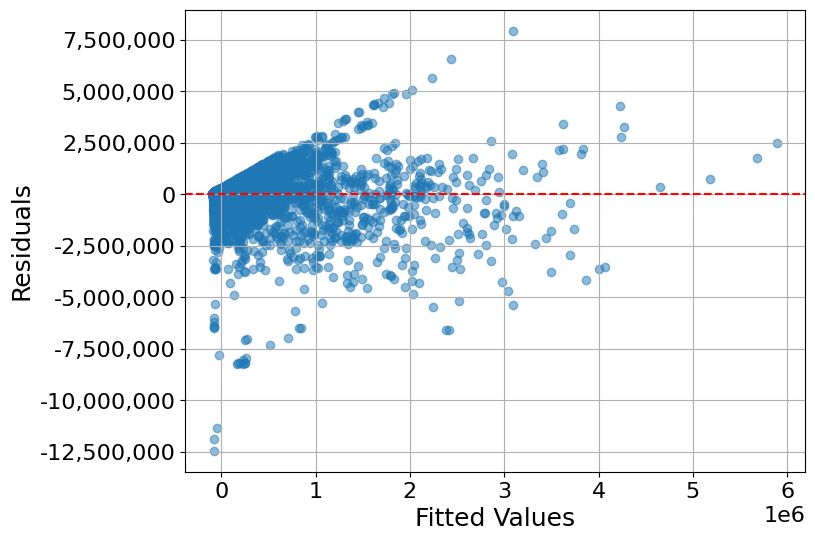

In [ ]:
# Check Normality of the Dependent Variable and Residuals
def normality_checks(y, residuals):
    print("\n=== Normality Checks ===")

    # Normality test on the dependent variable
    print("Dependent Variable:")
    shapiro_test = stats.shapiro(y)
    dagostino_test = stats.normaltest(y)
    print(f"Shapiro-Wilk p-value: {shapiro_test.pvalue:.4e}")
    print(f"D'Agostino p-value: {dagostino_test.pvalue:.4e}")

    # Normality test on residuals
    print("\nResiduals:")
    shapiro_test_res = stats.shapiro(residuals)
    dagostino_test_res = stats.normaltest(residuals)
    print(f"Shapiro-Wilk p-value: {shapiro_test_res.pvalue:.4e}")
    print(f"D'Agostino p-value: {dagostino_test_res.pvalue:.4e}")

# Check for Heteroscedasticity
def heteroscedasticity_checks(X, residuals):
    print("\n=== Heteroscedasticity Check ===")

    # Add a constant to X for the Breusch-Pagan test
    X_with_const = sm.add_constant(X)
    _, pval, _, _ = het_breuschpagan(residuals, X_with_const)
    print(f"Breusch-Pagan Test p-value: {pval:.4e}")

# Visualization of Distribution & Residuals
def plot_diagnostics(y, residuals):
    plt.rcParams.update({'font.size': 16})  # Increase font size globally

    # Dependent variable distribution
    plt.figure(figsize=(8, 6))
    sns.histplot(y, kde=True, color="blue", bins=30)
    plt.xlabel("Dependent Variable", fontsize=18)
    plt.ylabel("Frequency", fontsize=18)
    plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
    plt.grid(True)
    plt.show()

    # Residuals distribution
    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, kde=True, color="green", bins=30)
    plt.xlabel("Residuals", fontsize=18)
    plt.ylabel("Frequency", fontsize=18)
    plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
    plt.grid(True)
    plt.show()

    # Residuals vs Fitted Values
    plt.figure(figsize=(8, 6))
    plt.scatter(fitted_values, residuals, alpha=0.5)
    plt.axhline(0, color="red", linestyle="--")
    plt.xlabel("Fitted Values", fontsize=18)
    plt.ylabel("Residuals", fontsize=18)
    plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
    plt.grid(True)
    plt.show()

# Load Original Data and Run Diagnostics
# Use the original dataframe
df = matched_dfs["5m"].copy()

# Extract dependent and independent variables
y_original = df["emissions_discrepancy"].values  # Untransformed dependent variable
X_original = df[["ghgrp_emissions_tons"]].values  # Untransformed independent variable

# Fit a simple linear regression model
X_with_const = sm.add_constant(X_original)  # Add a constant for the model
model = sm.OLS(y_original, X_with_const).fit()
fitted_values = model.fittedvalues
residuals = model.resid

# Run diagnostics
normality_checks(y_original, residuals)
heteroscedasticity_checks(X_original, residuals)
plot_diagnostics(y_original, residuals)

**Summary of findings**

1.	Non-Normality of Dependent Variable:
	The dependent variable significantly deviates from normality based on extremely low p-values from the Shapiro-Wilk and D’Agostino tests. This violates key assumptions of many statistical models, including ordinary least squares regression.
2.	Non-Normality of Residuals:
	Residuals from the model also exhibit non-normality, as confirmed by similar normality test results. This could lead to unreliable inference, particularly with p-values and confidence intervals.
3.	Heteroscedasticity:
	The Breusch-Pagan test p-value indicates severe heteroscedasticity in the residuals, meaning that the variance of errors is not constant across levels of the independent variable. This can lead to biased standard errors.
4.	Visual Insights:
	Histograms and residual plots further confirm the above findings:
	•	The dependent variable and residuals are sharply peaked with long tails, consistent with non-normality.
	•	A “funnel-like” pattern in the residuals versus fitted values plot is indicative of heteroscedasticity.
5.	Implications for Transformation:
	Transforming the dependent variable may address the non-normality and heteroscedasticity issues.
	Transformations such as logarithmic, Box-Cox, quantile-based, or Yeo-Johnson could help stabilize variance and improve the normality of the residuals, leading to better model performance.

Next step: find out which transformation works best

Column 'emissions_discrepancy_scaled' not found. Creating it...


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17767.
  res = hypotest_fun_out(*samples, **kwds)


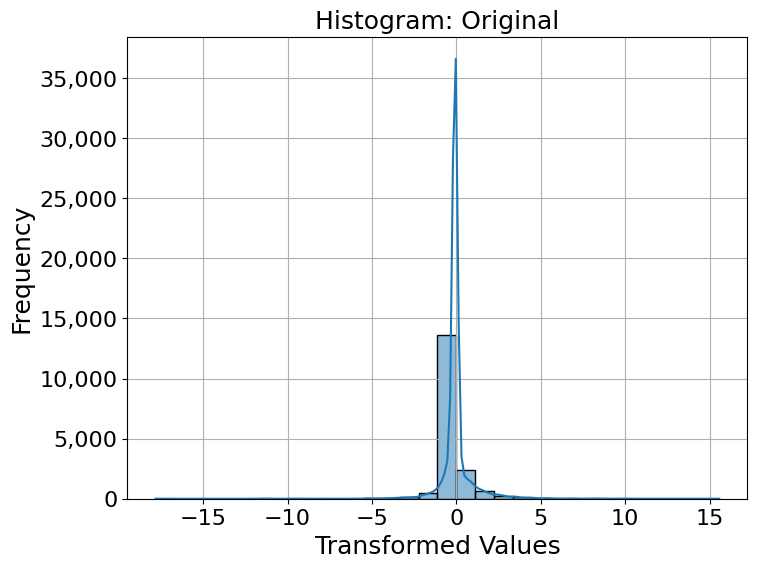

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17767.
  res = hypotest_fun_out(*samples, **kwds)


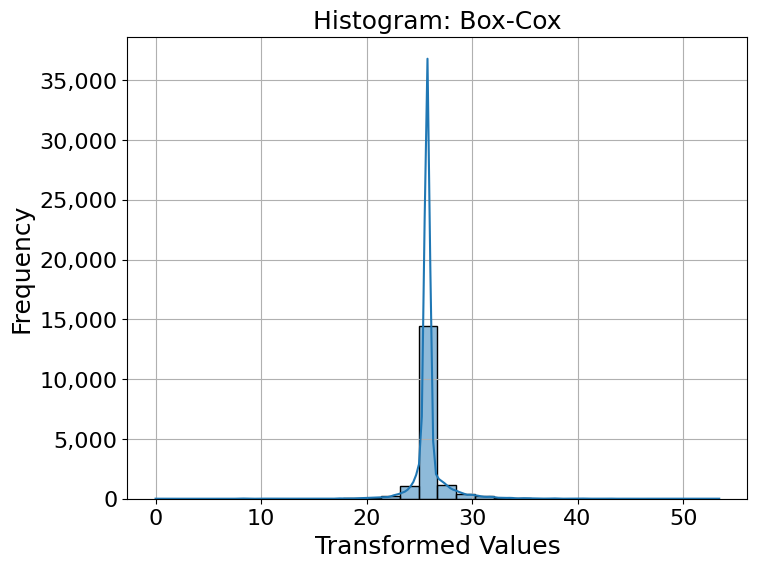

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17767.
  res = hypotest_fun_out(*samples, **kwds)


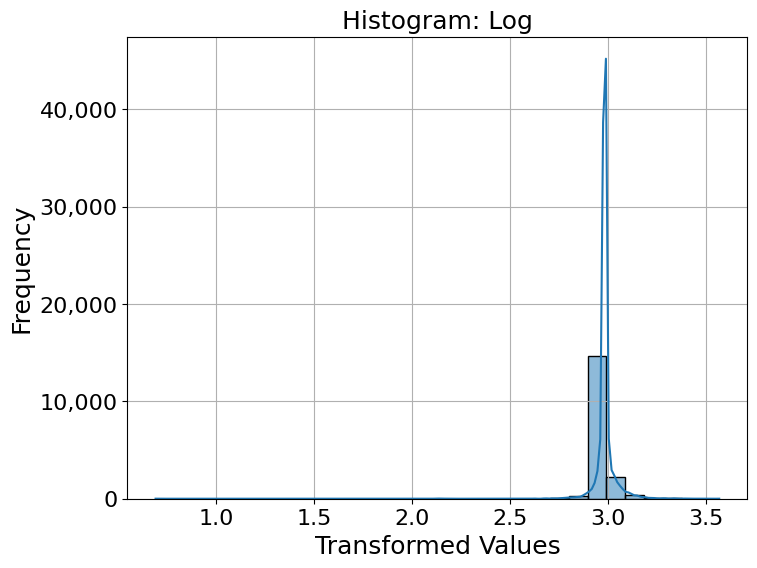

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17767.
  res = hypotest_fun_out(*samples, **kwds)


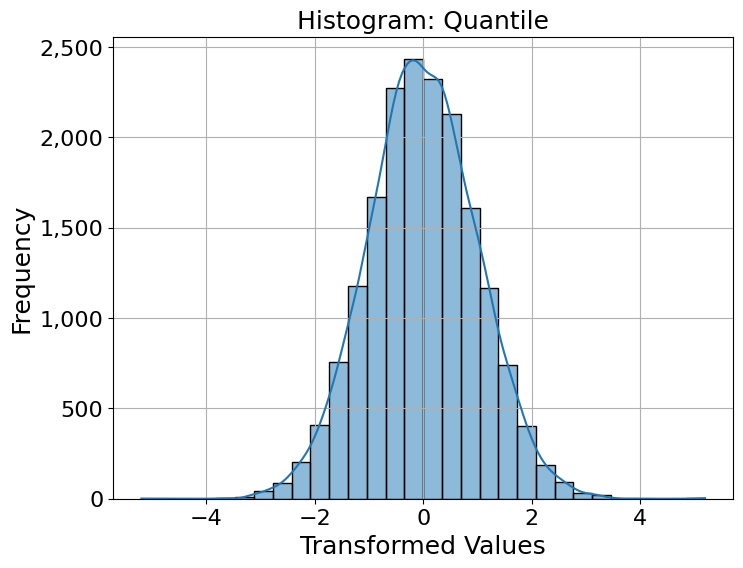

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 17767.
  res = hypotest_fun_out(*samples, **kwds)


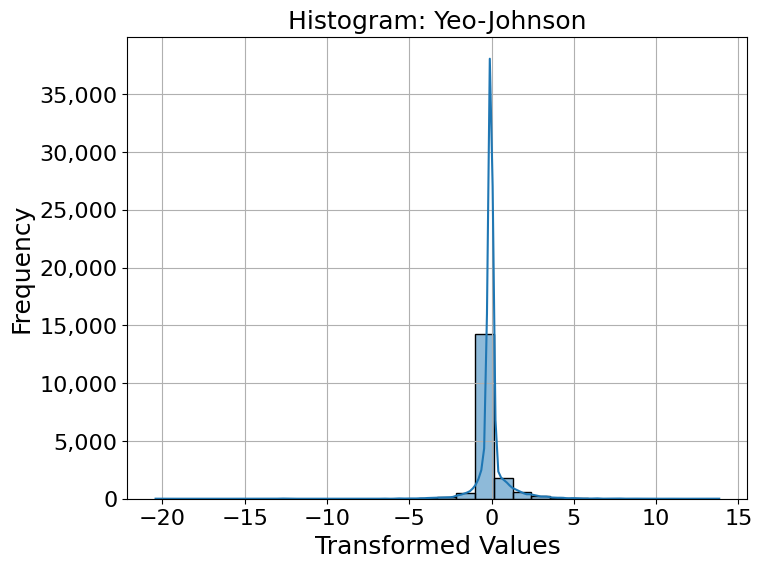

  Transformation  Skewness    Kurtosis  Shapiro-Wilk (p-value)  \
0       Original  0.372224   49.503915           2.194816e-111   
1        Box-Cox  1.164955   44.963419           3.158320e-111   
2            Log -9.321395  318.957549           3.208471e-116   
3       Quantile  0.038444    0.108746            1.028700e-04   
4    Yeo-Johnson -1.252875   60.426559           1.422691e-111   

   Breusch-Pagan (p-value)  
0                      0.0  
1                      0.0  
2                      0.0  
3                      0.0  
4                      0.0  

Best Transformation(s):
No transformation met all criteria.


In [ ]:
# Function to evaluate transformations
def evaluate_transformations(df, target_col):
    results = []

    # Original
    original = df[target_col]
    results.append(('Original', original))

    # Box-Cox (ensure all values > 0)
    if (original + abs(original.min()) + 1).min() > 0:
        boxcox_transformed, _ = boxcox(original + abs(original.min()) + 1)
        results.append(('Box-Cox', boxcox_transformed))

    # Log
    log_transformed = np.log1p(original + abs(original.min()) + 1)
    results.append(('Log', log_transformed))

    # Quantile Transformation
    qt = QuantileTransformer(output_distribution='normal', random_state=42)
    quantile_transformed = qt.fit_transform(original.values.reshape(-1, 1)).flatten()
    results.append(('Quantile', quantile_transformed))

    # Yeo-Johnson Transformation
    pt = PowerTransformer(method='yeo-johnson', standardize=True)
    yeo_johnson_transformed = pt.fit_transform(original.values.reshape(-1, 1)).flatten()
    results.append(('Yeo-Johnson', yeo_johnson_transformed))

    # Analyze each transformation
    analysis = []
    for name, transformed in results:
        skewness = skew(transformed)
        kurt = kurtosis(transformed)
        shapiro_test = shapiro(transformed)

        # Add a constant for Breusch-Pagan test
        explanatory_vars = sm.add_constant(df.drop(columns=[target_col])._get_numeric_data())
        bp_test = het_breuschpagan(transformed, explanatory_vars)

        analysis.append({
            'Transformation': name,
            'Skewness': skewness,
            'Kurtosis': kurt,
            'Shapiro-Wilk (p-value)': shapiro_test[1],
            'Breusch-Pagan (p-value)': bp_test[3]
        })

        # Plot histogram
        plt.figure(figsize=(8, 6))
        sns.histplot(transformed, kde=True, bins=30)
        plt.title(f'Histogram: {name}', fontsize=18)
        plt.xlabel('Transformed Values', fontsize=18)
        plt.ylabel('Frequency', fontsize=18)
        plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.FuncFormatter(lambda x, _: f"{x:,.0f}"))
        plt.grid(True)
        plt.show()

    # Return results as a DataFrame
    return pd.DataFrame(analysis)

# Ensure the column is created properly
if 'emissions_discrepancy_scaled' not in df.columns:
    print("Column 'emissions_discrepancy_scaled' not found. Creating it...")
    scaler = StandardScaler()
    df['emissions_discrepancy_scaled'] = scaler.fit_transform(df[['emissions_discrepancy']])
else:
    print("Column 'emissions_discrepancy_scaled' found.")

# Evaluate transformations on 'emissions_discrepancy_scaled'
transformation_results = evaluate_transformations(df, 'emissions_discrepancy_scaled')
print(transformation_results)

# Highlight the best transformation based on lowest skewness, kurtosis, and highest p-values
best_transformation = transformation_results.loc[
    (transformation_results['Skewness'].abs() < 0.5) &
    (transformation_results['Shapiro-Wilk (p-value)'] > 0.05) &
    (transformation_results['Breusch-Pagan (p-value)'] > 0.05)
]

print("\nBest Transformation(s):")
print(best_transformation if not best_transformation.empty else "No transformation met all criteria.")

**Observations**



1.   Quantile Transformation performed best in reducing skewness and kurtosis but still fell short of perfect normality due to sample size sensitivity in tests
2.   None of the transformations addressed heteroscedasticity



**Justification for Applying Quantile Transformation**

The dependent variable, emissions discrepancy, shows high skewness, kurtosis, and heteroscedasticity, as evidenced by diagnostic tests. These issues violate the assumptions of statistical models like ANOVA, Elastic Net, and Bayesian Regression, potentially biasing results.

**Benefits**



1.	Improves Normality: Converts the variable closer to a standard normal distribution, reducing skewness and kurtosis more effectively than other transformations.
2.	Reduces Heteroscedasticity: Helps stabilize variance across the dataset, though additional modeling adjustments may still be required.
3.	Enhances Model Validity: Aligns data with parametric model assumptions and benefits both parametric (e.g., ANOVA) and non-parametric models (e.g., Random Forest).
4.	Consistency Across Models: Ensures comparability of results across ANOVA, Elastic Net, and Bayesian frameworks.
5.	Better Interpretability: Predictions can be back-transformed for real-world understanding, ensuring usability of model outputs.





# Variance Decomposition Analysis (base model, not suitable)

In [ ]:
# Load data
df = matched_dfs["5m"].copy()

# Apply Quantile Transformation to the dependent variable and the explanatory variable
qt = QuantileTransformer(output_distribution='normal', random_state=42)

df['emissions_discrepancy_quantile'] = qt.fit_transform(df[['emissions_discrepancy']])
df['ghgrp_emissions_tons_quantile'] = qt.fit_transform(df[['ghgrp_emissions_tons']])

# Ensure variables are of the correct data type
df['ghgrp_year'] = df['ghgrp_year'].astype(int)

# Preprocessing functions
def process_parent_companies(value):
    if pd.isna(value):
        return ["Other"]  # Replace NaN with 'Other'
    # Remove percentages in parentheses
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
    # Split by ';' and strip spaces
    companies = [company.strip() for company in cleaned_value.split(';')]
    return companies

def process_subparts(value):
    if pd.isna(value):
        return []
    subparts = [subpart.strip() for subpart in str(value).split(',')]
    return subparts

# Apply the processing functions
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].apply(process_parent_companies)
df['ghgrp_subparts'] = df['ghgrp_subparts'].apply(process_subparts)

# Explode both parent companies and subparts so that each is a separate category
df = df.explode('ghgrp_parent_companies')
df = df.explode('ghgrp_subparts')

# Convert to categorical
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].astype('category')
df['ghgrp_county_name'] = df['ghgrp_county_name'].astype('category')
df['ghgrp_subparts'] = df['ghgrp_subparts'].astype('category')
df['ghgrp_id'] = df['ghgrp_id'].astype('category')  # Include ghgrp_id as a categorical variable

# Define ANOVA model (updated to use Quantile Transformed variables)
model_formula = (
    'emissions_discrepancy_quantile ~ '
    'C(ghgrp_year) + ghgrp_emissions_tons_quantile + '
    'C(ghgrp_county_name) + C(ghgrp_parent_companies) + '
    'C(ghgrp_subparts) + C(ghgrp_id)'
)

print("Fitting the ANOVA model...")
model = ols(model_formula, data=df).fit()

# Display model summary
print("\nModel Summary:")
print(model.summary())

# Perform ANOVA
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table['Partial Eta Squared'] = anova_table['sum_sq'] / anova_table['sum_sq'].sum()

# Add p-values to Partial Eta Squared
anova_table['p-value'] = anova_table['PR(>F)']  # Copy p-values from the ANOVA table
anova_table['Significant'] = anova_table['p-value'] < 0.05  # Add significance indicator

# Print the updated ANOVA table
print("\nUpdated ANOVA Table with p-values and robust mean coefficient handling:")
print(anova_table)

Die letzten 5000 Zeilen der Streamingausgabe wurden abgeschnitten.
C(ghgrp_parent_companies)[T.EVERGY]                                                                                                                -0.5405      0.239     -2.260      0.024      -1.009      -0.072
C(ghgrp_parent_companies)[T.EVERYWARE GLOBAL]                                                                                                      -0.1144      0.197     -0.580      0.562      -0.501       0.272
C(ghgrp_parent_companies)[T.EVONIK CORP]                                                                                                            0.0565      0.088      0.639      0.523      -0.117       0.230
C(ghgrp_parent_companies)[T.EVONIK INDUSTRIES]                                                                                                      0.1636      0.078      2.088      0.037       0.010       0.317
C(ghgrp_parent_companies)[T.EVRAZ INC NORTH AMERICA]                                 

In [ ]:
# Diagnostics

residuals = model.resid

# Shapiro-Wilk Test
shapiro_test = shapiro(residuals)
print(f"\nShapiro-Wilk Test:")
print(f"Statistic: {shapiro_test.statistic:.3f}, p-value: {shapiro_test.pvalue:.3e}")

# Levene's Test
levene_test = levene(df['emissions_discrepancy_quantile'], df['ghgrp_emissions_tons_quantile'])
print(f"\nLevene's Test:")
print(f"Statistic: {levene_test.statistic:.3f}, p-value: {levene_test.pvalue:.3e}")

# Breusch-Pagan Test
bp_test = het_breuschpagan(residuals, model.model.exog)
print(f"\nBreusch-Pagan Test:")
print(f"Statistic: {bp_test[0]:.3f}, p-value: {bp_test[1]:.3e}")


Shapiro-Wilk Test:
Statistic: 0.777, p-value: 1.174e-104

Levene's Test:
Statistic: 465.900, p-value: 6.361e-103


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 29031.
  res = hypotest_fun_out(*samples, **kwds)



Breusch-Pagan Test:
Statistic: 14295.721, p-value: 0.000e+00


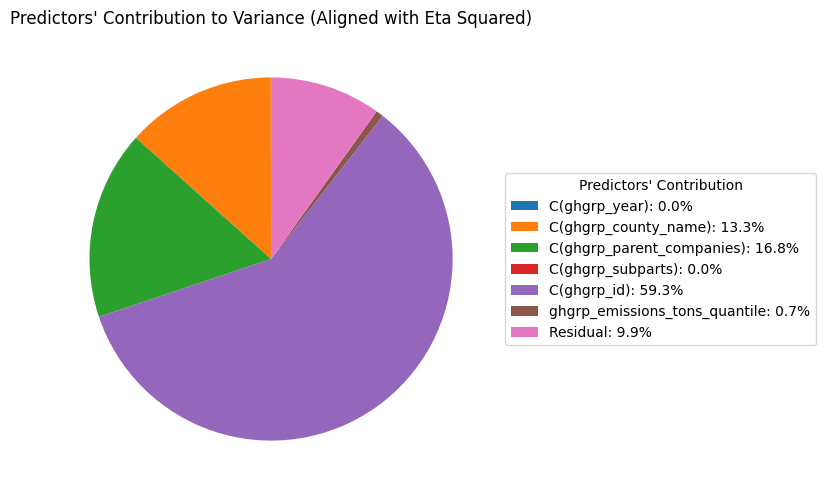

In [ ]:
# Plot Predictors' Contribution

total_sum_sq = anova_table['sum_sq'].sum()  # Total variance including residual
factor_names = anova_table.index
factor_sum_sq = anova_table['sum_sq']

# Calculate Partial Eta Squared-like percentages
percentages = factor_sum_sq / total_sum_sq * 100

# Create the pie chart
fig, ax = plt.subplots(figsize=(8, 8))
wedges, _ = ax.pie(factor_sum_sq, startangle=90)

# Prepare the legend labels with factor names and percentages
labels_with_values = [f"{name}: {pct:.1f}%" for name, pct in zip(factor_names, percentages)]

# Add legend to the right side of the chart
ax.legend(wedges, labels_with_values, title="Predictors' Contribution", loc='center left', bbox_to_anchor=(1, 0.5), frameon=True)

# Add title
plt.title("Predictors' Contribution to Variance (Aligned with Eta Squared)")

plt.tight_layout()
plt.show()

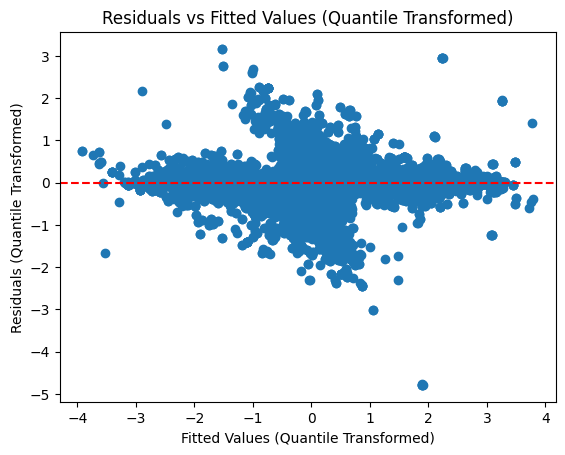

In [ ]:
plt.scatter(model.fittedvalues, model.resid)
plt.axhline(0, color='red', linestyle='--')
plt.title("Residuals vs Fitted Values (Quantile Transformed)")
plt.xlabel("Fitted Values (Quantile Transformed)")
plt.ylabel("Residuals (Quantile Transformed)")
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

# Split data into training and testing sets
train_data, test_data = train_test_split(df, test_size=0.3, random_state=42)

# Fit the model on the training set
model_train = ols(model_formula, data=train_data).fit()

# Predict on the testing set
test_data['predicted'] = model_train.predict(test_data)

# Calculate R-squared for the testing set
test_r_squared = 1 - (sum((test_data['emissions_discrepancy_quantile'] - test_data['predicted'])**2) /
                      sum((test_data['emissions_discrepancy_quantile'] - test_data['emissions_discrepancy_quantile'].mean())**2))

print(f"Test R-squared: {test_r_squared:.3f}")

Test R-squared: 0.861


In [ ]:
# Compute original R-squared and Adjusted R-squared
original_r_squared = model.rsquared
original_adj_r_squared = model.rsquared_adj

print(f"\nOriginal R-squared (Quantile Transformed): {original_r_squared:.4f}")
print(f"Original Adjusted R-squared (Quantile Transformed): {original_adj_r_squared:.4f}")


Original R-squared (Quantile Transformed): 0.9097
Original Adjusted R-squared (Quantile Transformed): 0.8921


In [ ]:
# Initialize KFold cross-validator
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Containers for R-squared and adjusted R-squared values
r_squared_list = []
adj_r_squared_list = []

print("Performing 5-Fold Cross-Validation with Quantile Transformed Variables...")

# Perform K-Fold Cross-Validation
for train_index, test_index in kf.split(df):
    # Split data into training and validation sets
    train_df = df.iloc[train_index]
    test_df = df.iloc[test_index]

    # Fit the model on the training set
    model = ols(model_formula, data=train_df).fit()

    # Predict on the validation set
    test_y = test_df['emissions_discrepancy_quantile']
    test_y_pred = model.predict(test_df)

    # Calculate R-squared
    ss_total = np.sum((test_y - test_y.mean()) ** 2)
    ss_residual = np.sum((test_y - test_y_pred) ** 2)
    r_squared = 1 - (ss_residual / ss_total)
    r_squared_list.append(r_squared)

    # Calculate Adjusted R-squared
    n = len(test_y)
    p = model.df_model
    adj_r_squared = 1 - ((1 - r_squared) * (n - 1) / (n - p - 1))
    adj_r_squared_list.append(adj_r_squared)

# Print Cross-Validation Results
mean_r_squared = np.mean(r_squared_list)
mean_adj_r_squared = np.mean(adj_r_squared_list)

print(f"\nR-squared values across folds (Quantile Transformed): {r_squared_list}")
print(f"Adjusted R-squared values across folds (Quantile Transformed): {adj_r_squared_list}")
print(f"\nMean R-squared: {mean_r_squared:.4f}")
print(f"Mean Adjusted R-squared: {mean_adj_r_squared:.4f}")

Performing 5-Fold Cross-Validation with Quantile Transformed Variables...

R-squared values across folds (Quantile Transformed): [0.8559051494699735, 0.8701819529791479, 0.8629554512335396, 0.8476459017523073, 0.8612580875863052]
Adjusted R-squared values across folds (Quantile Transformed): [0.2922041436739986, 0.36884944476043013, 0.32865518515670644, 0.24473480757655297, 0.3282762288894925]

Mean R-squared: 0.8596
Mean Adjusted R-squared: 0.3125


**Key Observations:**


1.	Residual Normality (Shapiro-Wilk Test): Residuals are not normally distributed, violating a key assumption of classical ANOVA models. While the quantile transformation improves normality, the residuals still deviate significantly from normality.
2.	Homogeneity of Variance (Levene’s Test): Homoscedasticity is still violated. The residual variance differs significantly across groups, requiring robust standard errors or alternative modeling approaches.
3.	Heteroscedasticity (Breusch-Pagan Test): Strong evidence of heteroscedasticity persists, emphasizing the need for models designed to handle such variance patterns.
4.	Omnibus and Jarque-Bera Tests: Confirm heavy-tailed residual distributions, suggesting the presence of outliers or over-dispersion in the data.
5.	Model Overfitting: The slight overfitting observed through the disparity between R-squared and Adjusted R-squared highlights the challenge of high dimensionality in the predictor set.
6.	Adjusted R-squared Discrepancy: The notably lower Adjusted R-squared reflects high dimensionality, redundancy, and the penalty applied to models with numerous predictors.








**Next steps:**


*   VDA with Robust Standard Errors: The violations of residual assumptions (non-normality and heteroscedasticity) justify using models with robust standard errors to ensure valid statistical inference.
*   Elastic Net:  valuable for handling multicollinearity and regularizing coefficients.



# ANOVA VDA with Robust Standard Errors

## Run model

In [ ]:
# Define the model save/load path
MODEL_PATH = '/content/drive/MyDrive/Master_Thesis/simplified_anova_model.pkl'

# Load data
df = matched_dfs["5m"].copy()

# Apply Quantile Transformation
qt = QuantileTransformer(output_distribution='normal', random_state=42)

# Transform dependent variable (emissions_discrepancy)
df['emissions_discrepancy_transformed'] = qt.fit_transform(df[['emissions_discrepancy']])

# Transform explanatory variable (ghgrp_emissions_tons)
df['ghgrp_emissions_tons_transformed'] = qt.fit_transform(df[['ghgrp_emissions_tons']])

# Ensure variables are of the correct data type
df['ghgrp_year'] = df['ghgrp_year'].astype(int)

# Preprocessing functions
def process_parent_companies(value):
    if pd.isna(value):
        return ["Other"]  # Replace NaN with 'Other'
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
    companies = [company.strip() for company in cleaned_value.split(';')]
    return companies

def process_subparts(value):
    if pd.isna(value):
        return []
    subparts = [subpart.strip() for subpart in str(value).split(',')]
    return subparts

# Apply the processing functions
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].apply(process_parent_companies)
df['ghgrp_subparts'] = df['ghgrp_subparts'].apply(process_subparts)

# Explode both parent companies and subparts
df = df.explode('ghgrp_parent_companies')
df = df.explode('ghgrp_subparts')

# Convert to categorical
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].astype('category')
df['ghgrp_county_name'] = df['ghgrp_county_name'].astype('category')
df['ghgrp_subparts'] = df['ghgrp_subparts'].astype('category')
df['ghgrp_id'] = df['ghgrp_id'].astype('category')  # Convert ghgrp_id to categorical

# Define ANOVA model
def run_model(df, formula):
    model = ols(formula, data=df).fit(cov_type='HC0')
    return model

model_formula = (
    'emissions_discrepancy_transformed ~ '
    'C(ghgrp_year) + ghgrp_emissions_tons_transformed + '
    'C(ghgrp_county_name) + C(ghgrp_parent_companies) + '
    'C(ghgrp_subparts) + C(ghgrp_id)'
)

# Check if the model already exists in Google Drive
if os.path.exists(MODEL_PATH):
    print("Loading the saved model from Google Drive...")
    with open(MODEL_PATH, 'rb') as file:
        simplified_model = pickle.load(file)
else:
    # Run the full model
    print("Fitting the full ANOVA model...")
    full_model = run_model(df, model_formula)

    # Identify minimally contributing categories
    def identify_minimal_contributors(model, df, variable, threshold=0.1):
        group_means = df.groupby(variable)['emissions_discrepancy_transformed'].mean()
        overall_mean = df['emissions_discrepancy_transformed'].mean()
        group_sizes = df[variable].value_counts()
        group_contributions = group_sizes * (group_means - overall_mean)**2

        total_variance = df['emissions_discrepancy_transformed'].var()
        variance_proportions = (group_contributions / total_variance) * 100

        minimal_contributors = variance_proportions[variance_proportions < threshold].index
        return minimal_contributors

    # Identify minimally contributing parent companies, subparts, and IDs
    min_contributing_parent_companies = identify_minimal_contributors(full_model, df, 'ghgrp_parent_companies')
    min_contributing_subparts = identify_minimal_contributors(full_model, df, 'ghgrp_subparts')
    min_contributing_ids = identify_minimal_contributors(full_model, df, 'ghgrp_id')

    print(f"\nNumber of minimally contributing parent companies: {len(min_contributing_parent_companies)}")
    print(f"Number of minimally contributing subparts: {len(min_contributing_subparts)}")
    print(f"Number of minimally contributing IDs: {len(min_contributing_ids)}")

    # Group minimal contributors into "Other"
    df['ghgrp_parent_companies_grouped'] = df['ghgrp_parent_companies'].apply(
        lambda x: 'Other' if x in min_contributing_parent_companies else x
    )
    df['ghgrp_subparts_grouped'] = df['ghgrp_subparts'].apply(
        lambda x: 'Other' if x in min_contributing_subparts else x
    )
    df['ghgrp_id_grouped'] = df['ghgrp_id'].apply(
        lambda x: 'Other' if x in min_contributing_ids else x
    )

    # Define the model with grouped variables and interaction
    model_formula_grouped = (
        'emissions_discrepancy_transformed ~ '
        'C(ghgrp_year) + ghgrp_emissions_tons_transformed + '
        'C(ghgrp_county_name) + C(ghgrp_parent_companies_grouped) + '
        'C(ghgrp_subparts_grouped) + C(ghgrp_id_grouped)'
    )

    # Rerun the model with grouped variables
    print("\nFitting the simplified ANOVA model...")
    simplified_model = run_model(df, model_formula_grouped)

    # Save the simplified model to Google Drive
    print("Saving the simplified model to Google Drive...")
    with open(MODEL_PATH, 'wb') as file:
        pickle.dump(simplified_model, file)

# Display the simplified model summary
print("\nSimplified Model Summary with Grouped Variables:")
print(simplified_model.summary())

Loading the saved model from Google Drive...

Simplified Model Summary with Grouped Variables:


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 6762, but rank is 4286
  warnings.warn('covariance of constraints does not have full '


                                    OLS Regression Results                                   
Dep. Variable:     emissions_discrepancy_transformed   R-squared:                       0.910
Model:                                           OLS   Adj. R-squared:                  0.892
Method:                                Least Squares   F-statistic:                 1.114e+06
Date:                               Tue, 18 Feb 2025   Prob (F-statistic):               0.00
Time:                                       11:57:27   Log-Likelihood:                -10942.
No. Observations:                              29031   AIC:                         3.135e+04
Df Residuals:                                  24298   BIC:                         7.052e+04
Df Model:                                       4732                                         
Covariance Type:                                 HC0                                         
                                                            

In [ ]:
# Perform ANOVA on the simplified model
anova_table = sm.stats.anova_lm(simplified_model, typ=2)

# Calculate Partial Eta Squared
anova_table['Partial Eta Squared'] = anova_table['sum_sq'] / anova_table['sum_sq'].sum()

# Copy p-values and determine significance
anova_table['p-value'] = anova_table['PR(>F)']
anova_table['Significant'] = anova_table['p-value'] < 0.05

# Print and display the updated ANOVA table
print("\nUpdated ANOVA Table for Simplified Model (Transformed Dependent Variable):")
display(anova_table)

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 985, but rank is 973
  warnings.warn('covariance of constraints does not have full '
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2250, but rank is 2092
  warnings.warn('covariance of constraints does not have full '



Updated ANOVA Table for Simplified Model (Transformed Dependent Variable):


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3483, but rank is 3374
  warnings.warn('covariance of constraints does not have full '


,sum_sq,df,F,PR(>F),Partial Eta Squared,p-value,Significant
C(ghgrp_year),1.221731e+01,7.0,11.740426,5.250058e-15,5.698868e-08,5.250058e-15,True
C(ghgrp_county_name),1.864718e+06,985.0,12734.540803,0.000000e+00,8.698136e-03,0.000000e+00,True
C(ghgrp_parent_companies_grouped),3.116520e+07,2250.0,93173.785860,0.000000e+00,1.453727e-01,0.000000e+00,True
C(ghgrp_subparts_grouped),1.877359e+00,36.0,0.350793,9.998928e-01,8.757102e-09,9.998928e-01,False
C(ghgrp_id_grouped),1.813477e+08,3483.0,350239.378801,0.000000e+00,8.459119e-01,0.000000e+00,True
ghgrp_emissions_tons_transformed,6.638649e+01,1.0,446.566438,3.087731e-98,3.096655e-07,3.087731e-98,True
Residual,3.612136e+03,24298.0,NaN,NaN,1.684912e-05,NaN,False


## Residual analyis

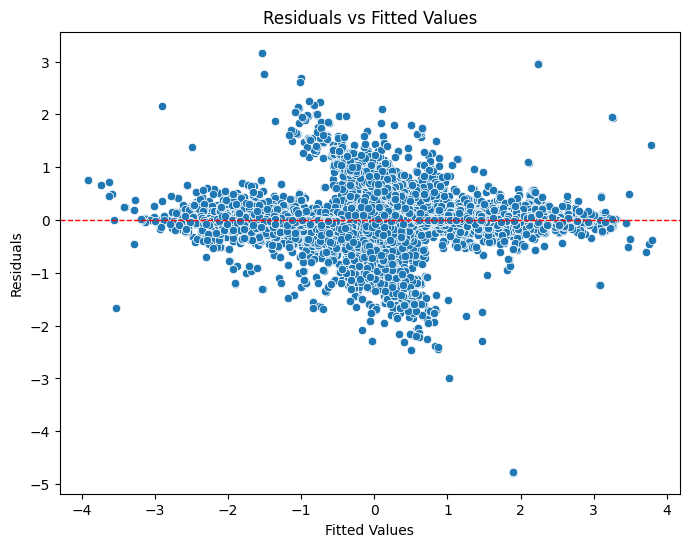

In [ ]:
# Residuals vs. Fitted Values Plot for Simplified Model
plt.figure(figsize=(8, 6))

# Plot residuals against fitted values
sns.scatterplot(x=simplified_model.fittedvalues, y=simplified_model.resid)
plt.axhline(0, color='red', linestyle='--', linewidth=1)

# Titles and labels
plt.title("Residuals vs Fitted Values")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")

# Display the plot
plt.show()

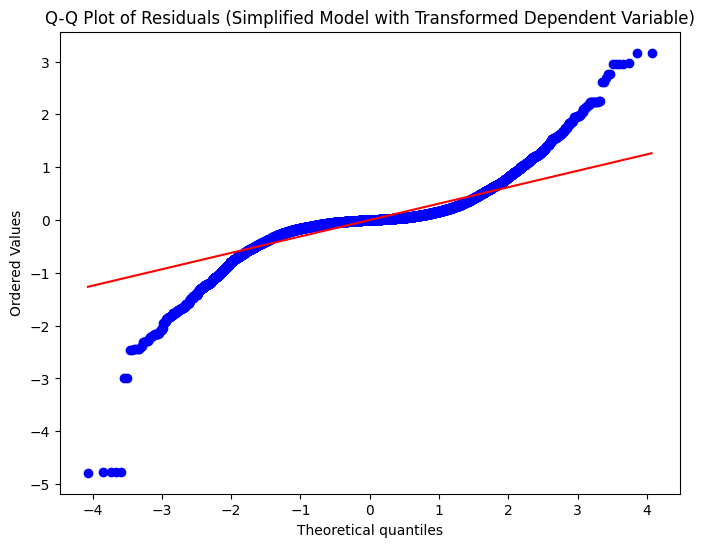

In [ ]:
# Q-Q Plot for Residuals of Simplified Model
plt.figure(figsize=(8, 6))

# Generate Q-Q plot for residuals
probplot(simplified_model.resid, dist="norm", plot=plt)

# Title for the plot
plt.title("Q-Q Plot of Residuals (Simplified Model with Transformed Dependent Variable)")

# Display the plot
plt.show()

In [ ]:
# Breusch-Pagan test for Simplified Model
bp_test = het_breuschpagan(simplified_model.resid, simplified_model.model.exog)
bp_labels = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']

print("\nBreusch-Pagan Test Results for Simplified Model:")
print(dict(zip(bp_labels, bp_test)))


Breusch-Pagan Test Results for Simplified Model:
{'Lagrange multiplier statistic': 14298.699302577608, 'p-value': 0.0, 'f-value': 4.983698380185764, 'f p-value': 0.0}


In [ ]:
# Shapiro-Wilk test for Residuals of Simplified Model
shapiro_test = shapiro(simplified_model.resid)
print("\nShapiro-Wilk Test for Normality (Simplified Model):")
print(f"Statistic: {shapiro_test.statistic:.3f}, p-value: {shapiro_test.pvalue:.3e}")


Shapiro-Wilk Test for Normality (Simplified Model):
Statistic: 0.777, p-value: 1.344e-104


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 29031.
  res = hypotest_fun_out(*samples, **kwds)


## Predictor importance

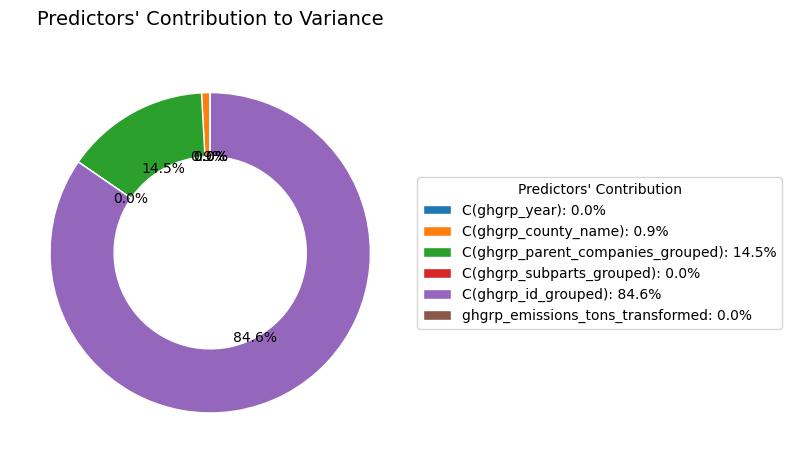

In [ ]:
# Exclude residuals from the ANOVA table
anova_table_no_residuals = anova_table.drop(index='Residual', errors='ignore')

# Recalculate percentages without residuals
total_sum_sq_no_residuals = anova_table_no_residuals['sum_sq'].sum()
anova_table_no_residuals['Percentage'] = (
    anova_table_no_residuals['sum_sq'] / total_sum_sq_no_residuals
) * 100

# Extract data for visualization
factor_names = anova_table_no_residuals.index
factor_sum_sq = anova_table_no_residuals['sum_sq']
percentages = anova_table_no_residuals['Percentage']

# Create a pie chart
fig, ax = plt.subplots(figsize=(8, 8))
wedges, texts, autotexts = ax.pie(
    factor_sum_sq,
    labels=None,  # Avoid overlapping text, legend will provide labels
    startangle=90,
    wedgeprops=dict(width=0.4, edgecolor='w'),
    autopct='%1.1f%%'
)

# Prepare legend labels with factor names and percentages
labels_with_values = [
    f"{name}: {pct:.1f}%" for name, pct in zip(factor_names, percentages)
]
ax.legend(
    wedges,
    labels_with_values,
    title="Predictors' Contribution",
    loc='center left',
    bbox_to_anchor=(1, 0.5),
    frameon=True
)

# Add title
plt.title("Predictors' Contribution to Variance", fontsize=14, pad=20)

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
sum_of_predictors = anova_table['sum_sq'].sum()
print(f"Sum of Squares for Predictors: {sum_of_predictors}")
print(f"Residual Sum of Squares: {simplified_model.ssr}")
print(f"Total Sum of Squares (Predictors + Residuals): {sum_of_predictors + simplified_model.ssr}")

Sum of Squares for Predictors: 214381308.30818555
Residual Sum of Squares: 3612.1363433480024
Total Sum of Squares (Predictors + Residuals): 214384920.4445289


# Elastic Net Model (using Regularization)

In [ ]:
# Handle NaN values by mean imputation
df['emissions_discrepancy'] = df['emissions_discrepancy'].fillna(df['emissions_discrepancy'].mean())
df['ghgrp_emissions_tons'] = df['ghgrp_emissions_tons'].fillna(df['ghgrp_emissions_tons'].mean())

# Define transformations
def no_transform(x):
    return x  # No transformation

def log_transform(x):
    return np.log1p(x)  # Log(1 + x) to handle zeros

def sqrt_transform(x):
    return np.sqrt(x)

def boxcox_transform(x):
    return boxcox(x + abs(x.min()) + 1)[0]  # Ensure positive values by adding a constant

def yeo_johnson_transform(x):
    return yeojohnson(x)[0]

# Dictionary of transformations to test
transformations = {
    "No Transformation": no_transform,
    "Log": log_transform,
    "Square Root": sqrt_transform,
    "Box-Cox": boxcox_transform,
    "Yeo-Johnson": yeo_johnson_transform,
    "Quantile (Normal)": lambda x: QuantileTransformer(output_distribution="normal", random_state=42).fit_transform(x),
}

# Store results
results = {}

# Iterate over transformations
for name, func in transformations.items():
    try:
        # Apply transformation to the target variables
        transformed_discrepancy = func(df['emissions_discrepancy'].values.reshape(-1, 1)).flatten()
        transformed_emissions = func(df['ghgrp_emissions_tons'].values.reshape(-1, 1)).flatten()

        # Replace in dataframe for modeling
        df['emissions_discrepancy_transformed'] = transformed_discrepancy
        df['ghgrp_emissions_tons_transformed'] = transformed_emissions

        # Create dummies and split data
        X = pd.get_dummies(
            df[['ghgrp_year', 'ghgrp_emissions_tons_transformed', 'ghgrp_county_name',
                'ghgrp_parent_companies', 'ghgrp_subparts', 'ghgrp_id']],
            drop_first=True
        )
        y = df['emissions_discrepancy_transformed']
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        # Train ElasticNet model with example parameters
        model = ElasticNet(alpha=0.01, l1_ratio=0.5, random_state=42)
        model.fit(X_train, y_train)

        # Evaluate the model
        train_r2 = model.score(X_train, y_train)
        test_r2 = model.score(X_test, y_test)
        test_mae = mean_absolute_error(y_test, model.predict(X_test))

        # Store results
        results[name] = {
            "Train R²": train_r2,
            "Test R²": test_r2,
            "MAE": test_mae
        }

    except Exception as e:
        # Handle transformation errors
        print(f"Transformation {name} failed: {e}")

# Compare and print results
print("Transformation Results:")
for name, metrics in results.items():
    print(f"{name}: {metrics}")

<ipython-input-121-1d5f431105c7>:10: RuntimeWarning: invalid value encountered in log1p
  return np.log1p(x)  # Log(1 + x) to handle zeros


Transformation Log failed: Input y contains NaN.


<ipython-input-121-1d5f431105c7>:13: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(x)


Transformation Square Root failed: Input y contains NaN.
Transformation Box-Cox failed: Data must be 1-dimensional.
Transformation Results:
No Transformation: {'Train R²': 0.5965617412552042, 'Test R²': 0.6045518059104968, 'MAE': 290259.45106626535}
Yeo-Johnson: {'Train R²': 0.456109725085575, 'Test R²': 0.4504332906799904, 'MAE': 327805.3052173025}
Quantile (Normal): {'Train R²': 0.1672033997705863, 'Test R²': 0.1842681475759902, 'MAE': 0.725776286512233}


For Elastic Net, the Yeo-Johnson transformation delivers the best results



In [ ]:
# Path to save/load Elastic Net results
elastic_net_results_path = "/content/drive/MyDrive/Master_Thesis/elastic_net_results.pkl"

# Check if results already exist
if os.path.exists(elastic_net_results_path):
    print("Elastic Net results found. Loading from file...")
    with open(elastic_net_results_path, "rb") as file:
        results = pickle.load(file)
    optimal_alpha = results["optimal_alpha"]
    optimal_l1_ratio = results["optimal_l1_ratio"]
    elastic_net_train_r2 = results["train_r2"]
    elastic_net_train_mse = results["train_mse"]
    elastic_net_test_r2 = results["test_r2"]
    elastic_net_test_mse = results["test_mse"]
    print("Elastic Net results successfully loaded.")
else:
    # Load data
    df = matched_dfs["5m"].copy()

    # Apply Yeo-Johnson transformation to numeric variables
    pt = PowerTransformer(method='yeo-johnson', standardize=True)
    df['emissions_discrepancy_transformed'] = pt.fit_transform(df[['emissions_discrepancy']])
    df['ghgrp_emissions_tons_transformed'] = pt.fit_transform(df[['ghgrp_emissions_tons']])

    # Ensure variables are of the correct data type
    df['ghgrp_year'] = df['ghgrp_year'].astype(int)

    # Preprocessing functions
    def process_parent_companies(value):
        if pd.isna(value):
            return ["Other"]  # Replace NaN with 'Other'
        cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
        companies = [company.strip() for company in cleaned_value.split(';')]
        return companies

    def process_subparts(value):
        if pd.isna(value):
            return []
        subparts = [subpart.strip() for subpart in str(value).split(',')]
        return subparts

    # Apply the processing functions
    df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].apply(process_parent_companies)
    df['ghgrp_subparts'] = df['ghgrp_subparts'].apply(process_subparts)

    # Explode both parent companies and subparts
    df = df.explode('ghgrp_parent_companies')
    df = df.explode('ghgrp_subparts')

    # Convert to categorical
    df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].astype('category')
    df['ghgrp_county_name'] = df['ghgrp_county_name'].astype('category')
    df['ghgrp_subparts'] = df['ghgrp_subparts'].astype('category')
    df['ghgrp_id'] = df['ghgrp_id'].astype('category')  # Convert ghgrp_id to categorical

    # Add hierarchical interaction terms
    df['parent_county_interaction'] = df['ghgrp_parent_companies'].astype(str) + "_" + df['ghgrp_county_name'].astype(str)

    # Create dummy variables for modeling, including ghgrp_id
    X = pd.get_dummies(
        df[['ghgrp_year', 'ghgrp_emissions_tons_transformed', 'ghgrp_county_name', 'ghgrp_parent_companies',
            'ghgrp_subparts', 'ghgrp_id']],
        drop_first=True
    )
    y = df['emissions_discrepancy_transformed']

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Determine optimal alpha and l1_ratio using ElasticNetCV
    print("Finding optimal alpha and l1_ratio using ElasticNetCV...")
    elastic_net_cv = ElasticNetCV(l1_ratio=[0.1, 0.5, 0.7, 0.9, 1.0], cv=5, random_state=42, n_jobs=-1)
    elastic_net_cv.fit(X_train, y_train)

    optimal_alpha = elastic_net_cv.alpha_
    optimal_l1_ratio = elastic_net_cv.l1_ratio_
    print(f"Optimal alpha: {optimal_alpha}")
    print(f"Optimal l1_ratio: {optimal_l1_ratio}")

    # Apply ElasticNet with optimal parameters
    elastic_net = ElasticNet(alpha=optimal_alpha, l1_ratio=optimal_l1_ratio, random_state=42).fit(X_train, y_train)

    # Evaluate Elastic Net model on training data
    elastic_net_train_r2 = elastic_net.score(X_train, y_train)
    elastic_net_train_mse = mean_squared_error(y_train, elastic_net.predict(X_train))

    # Evaluate Elastic Net model on test data
    elastic_net_test_r2 = elastic_net.score(X_test, y_test)
    elastic_net_test_mse = mean_squared_error(y_test, elastic_net.predict(X_test))

    # Save results to file
    results = {
        "optimal_alpha": optimal_alpha,
        "optimal_l1_ratio": optimal_l1_ratio,
        "train_r2": elastic_net_train_r2,
        "train_mse": elastic_net_train_mse,
        "test_r2": elastic_net_test_r2,
        "test_mse": elastic_net_test_mse,
    }
    with open(elastic_net_results_path, "wb") as file:
        pickle.dump(results, file)
    print("Elastic Net results saved to file.")

Elastic Net results found. Loading from file...
Elastic Net results successfully loaded.


## Model performance

In [ ]:
# Print model performance metrics
print("\nElastic Net model performance:")
print(f"Train R-squared: {elastic_net_train_r2:.4f}")
print(f"Train Mean Squared Error (MSE): {elastic_net_train_mse:.4f}")
print(f"Test R-squared: {elastic_net_test_r2:.4f}")
print(f"Test Mean Squared Error (MSE): {elastic_net_test_mse:.4f}")


Elastic Net model performance:
Train R-squared: 0.7715
Train Mean Squared Error (MSE): 0.3822
Test R-squared: 0.7237
Test Mean Squared Error (MSE): 0.4517


In [ ]:
# Path to save/load bootstrap results
elasticnet_bootstrap_path = "/content/drive/MyDrive/Master_Thesis/elasticnet_bootstrap_results.pkl"

# Parameters
n_bootstraps = 100

# Check if bootstrap results already exist
if os.path.exists(elasticnet_bootstrap_path):
    print("Bootstrap results found. Loading from file...")
    with open(elasticnet_bootstrap_path, "rb") as file:
        coefs_array = pickle.load(file)
    print("Bootstrap results successfully loaded.")
else:
    print("Bootstrap results not found. Performing bootstrapping...")
    # Initialize a NumPy array for coefficients
    coefs_array = np.zeros((X_train.shape[1], n_bootstraps))

    # Precompute bootstrap samples
    bootstrap_samples = [(resample(X_train, y_train, random_state=i)) for i in range(n_bootstraps)]

    # Perform bootstrapping with ElasticNet
    print("Performing bootstrapping...")
    for i, (X_resampled, y_resampled) in tqdm(enumerate(bootstrap_samples), total=n_bootstraps, desc="Bootstrapping Elastic Net coefficients"):
        # Fit ElasticNet model with optimal parameters
        model_bootstrap = ElasticNet(alpha=optimal_alpha, l1_ratio=optimal_l1_ratio, random_state=i).fit(X_resampled, y_resampled)
        coefs_array[:, i] = model_bootstrap.coef_

    # Save the results
    with open(elasticnet_bootstrap_path, "wb") as file:
        pickle.dump(coefs_array, file)
    print(f"Bootstrap results saved to: {elasticnet_bootstrap_path}")

# Convert coefficients array to DataFrame
coefs_bootstrap = pd.DataFrame(coefs_array, index=X_train.columns)

# Calculate mean coefficient and confidence intervals
coef_mean = coefs_bootstrap.mean(axis=1)
coef_lower = coefs_bootstrap.quantile(0.025, axis=1)
coef_upper = coefs_bootstrap.quantile(0.975, axis=1)

# Create a summary DataFrame
coef_summary = pd.DataFrame({
    "Mean Coefficient": coef_mean,
    "Lower CI (2.5%)": coef_lower,
    "Upper CI (97.5%)": coef_upper,
    "Significant": (coef_lower > 0) | (coef_upper < 0)  # Significant if CI does not cross zero
}).sort_values("Mean Coefficient", ascending=False)

# Display top 10 results
print("\nBootstrap Coefficient Summary:")
print(coef_summary.head(10))

Bootstrap results found. Loading from file...
Bootstrap results successfully loaded.

Bootstrap Coefficient Summary:
                                                 Mean Coefficient  \
ghgrp_id_1007227                                         6.946696   
ghgrp_id_1005585                                         6.341196   
ghgrp_id_1000156                                         5.993141   
ghgrp_id_1000192                                         4.794626   
ghgrp_id_1007959                                         4.597175   
ghgrp_parent_companies_TENASKA GEORGIA PARTNERS          4.306275   
ghgrp_id_1007339                                         4.261799   
ghgrp_id_1004962                                         4.129319   
ghgrp_id_1001020                                         3.701753   
ghgrp_id_1003286                                         3.520099   

                                                 Lower CI (2.5%)  \
ghgrp_id_1007227                                       

In [ ]:
# Aggregate the importance and significance of predictors by group
group_map = {
    'ghgrp_year': 'ghgrp_year',
    'ghgrp_emissions_tons_boxcox': 'ghgrp_emissions_tons',
    'ghgrp_county_name': 'ghgrp_county_name',
    'ghgrp_parent_companies': 'ghgrp_parent_companies',
    'ghgrp_subparts': 'ghgrp_subparts',
    'ghgrp_id': 'ghgrp_id'
}

group_contributions = {}

for group, name in group_map.items():
    # Filter columns belonging to the current group
    group_cols = [col for col in coef_summary.index if group in col]

    if group_cols:  # Ensure the group has columns
        # Aggregate total contribution and count significant predictors
        total_contribution = coef_summary.loc[group_cols, "Mean Coefficient"].abs().sum()
        significant_count = coef_summary.loc[group_cols, "Significant"].sum()  # Count of significant predictors

        group_contributions[name] = {
            "Total Contribution": total_contribution,
            "Percentage": 100 * total_contribution / coef_summary["Mean Coefficient"].abs().sum(),
            "Significant Predictors": significant_count,
            "Total Predictors": len(group_cols)
        }

# Create a DataFrame for visualization
group_contributions_df = pd.DataFrame.from_dict(group_contributions, orient='index')
group_contributions_df["Significance Percentage"] = (
    group_contributions_df["Significant Predictors"] / group_contributions_df["Total Predictors"]
) * 100

# Display the results
print("\nGroup Contributions Summary with Significance:")
display(group_contributions_df)


Group Contributions Summary with Significance:


,Total Contribution,Percentage,Significant Predictors,Total Predictors,Significance Percentage
ghgrp_year,0.010399,0.003439,1,1,100.000000
ghgrp_county_name,46.826965,15.484502,33,985,3.350254
ghgrp_parent_companies,39.227601,12.971583,47,2289,2.053298
ghgrp_subparts,1.819044,0.601512,9,36,25.000000
ghgrp_id,214.211274,70.834294,68,3541,1.920361


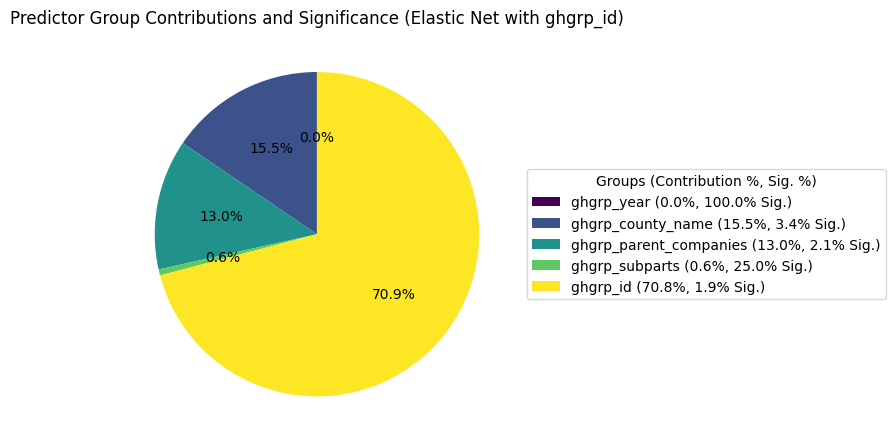

In [ ]:
# Visualization (e.g., pie chart)
fig, ax = plt.subplots(figsize=(8, 8))
colors = plt.cm.viridis(np.linspace(0, 1, len(group_contributions_df)))

# Plot pie chart
wedges, texts, autotexts = ax.pie(
    group_contributions_df['Percentage'],
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    textprops={'fontsize': 10}
)

# Add a legend to the right with percentages and significance
labels = [
    f"{index} ({row['Percentage']:.1f}%, {row['Significance Percentage']:.1f}% Sig.)"
    for index, row in group_contributions_df.iterrows()
]
ax.legend(
    wedges,
    labels,
    title="Groups (Contribution %, Sig. %)",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10
)

plt.title("Predictor Group Contributions and Significance (Elastic Net with ghgrp_id)")
plt.tight_layout()
plt.show()

## Validation

In [ ]:
# Path to save/load cross-validation results
cv_results_path = "/content/drive/MyDrive/Master_Thesis/elasticnet_cv_results.pkl"

# Sample a subset of the data for cross-validation
X_sampled, y_sampled = X.sample(frac=0.5, random_state=42), y.sample(frac=0.5, random_state=42)

# Check if cross-validation results already exist
if os.path.exists(cv_results_path):
    print("Cross-validation results found. Loading from file...")
    with open(cv_results_path, "rb") as file:
        cv_scores = pickle.load(file)
    print("Cross-validation results successfully loaded.")
else:
    print("Cross-validation results not found. Performing cross-validation...")
    # Perform cross-validation
    cv_scores = cross_val_score(elastic_net, X_sampled, y_sampled, cv=5, scoring='r2', n_jobs=-1)

    # Save the results to the drive
    with open(cv_results_path, "wb") as file:
        pickle.dump(cv_scores, file)
    print(f"Cross-validation results saved to: {cv_results_path}")

# Display results
print("\nCross-Validation R^2 Scores:", cv_scores)
print(f"Mean R^2: {np.mean(cv_scores):.4f}")
print(f"Std Dev of R^2: {np.std(cv_scores):.4f}")

Cross-validation results found. Loading from file...
Cross-validation results successfully loaded.

Cross-Validation R^2 Scores: [0.63007878 0.70024051 0.74832078 0.7171227  0.65855709]
Mean R^2: 0.6909
Std Dev of R^2: 0.0420


# Bayesian Model

In [ ]:
# Cell: Collapse‐Threshold‐Analyse für ghg_matched_50m.parquet

# 1) Mount Google Drive (falls nicht bereits geschehen)
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import pandas as pd
import numpy as np
from IPython.display import display

# 2) Lade den Datensatz
DATA_PATH = "/content/drive/MyDrive/Master_Thesis/ghg_matched_50m.parquet"
df = pd.read_parquet(DATA_PATH)
print(f"Geladene Zeilen: {len(df):,}")

# 3) Parameter definieren
THRESHOLDS         = range(1, 21)    # prüfe min_count von 1 bis 20
COLLAPSE_PCT_LIMIT = 0.05           # max. 5% der Daten in Other
COLUMNS = {
    "ghgrp_subparts":          ",",
    "ghgrp_parent_companies": ";",
    "ghgrp_county_name":      None,  # einfache Kategorie
}

# 4) Hilfsfunktion
def evaluate_thresholds(series, sep, thresholds, pct_limit):
    # flatten für Häufigkeitszählung
    if sep is None:
        flat = series.astype(str)
    else:
        flat = series.dropna().str.split(sep).explode().str.strip()
    vc = flat.value_counts()
    total = len(series)
    rows = []
    for t in thresholds:
        if sep is None:
            n_other = vc[vc < t].sum()
        else:
            n_other = flat[flat.map(vc) < t].count()
        pct_other = n_other / total
        n_keep    = (vc >= t).sum()
        rows.append((t, n_keep, pct_other))
    out = pd.DataFrame(rows, columns=["min_count","n_keep","pct_in_other"])
    # Empfehlung: größtes t mit pct_other <= pct_limit
    valid = out[out["pct_in_other"] <= pct_limit]
    recommended = int(valid["min_count"].max()) if not valid.empty else None
    return out, recommended

# 5) Schwellen für jede Spalte auswerten
results = {}
for col, sep in COLUMNS.items():
    table, rec = evaluate_thresholds(
        series     = df[col],
        sep        = sep,
        thresholds = THRESHOLDS,
        pct_limit  = COLLAPSE_PCT_LIMIT
    )
    print(f"\nSpalte: {col!r}")
    print(f"Empfohlener min_count (≤{COLLAPSE_PCT_LIMIT*100:.0f}% in Other): {rec}")
    display(table.style.format({"pct_in_other":"{:.1%}"}))
    results[col] = {"table": table, "recommended": rec}

# `results` enthält für jede Spalte:
# - results[col]["table"]      → vollständige DataFrame mit min_count–Statistiken
# - results[col]["recommended"] → automatischer Empfehlungsschwellenwert

Mounted at /content/drive
Geladene Zeilen: 31,145

Spalte: 'ghgrp_subparts'
Empfohlener min_count (≤5% in Other): 20


,min_count,n_keep,pct_in_other
0,1,39,0.0%
1,2,39,0.0%
2,3,39,0.0%
3,4,38,0.0%
4,5,38,0.0%
5,6,38,0.0%
6,7,38,0.0%
7,8,38,0.0%
8,9,38,0.0%
9,10,37,0.0%



Spalte: 'ghgrp_parent_companies'
Empfohlener min_count (≤5% in Other): 2


,min_count,n_keep,pct_in_other
0,1,3599,0.0%
1,2,2937,2.1%
2,3,2428,5.4%
3,4,1865,10.8%
4,5,1546,14.9%
5,6,1235,19.9%
6,7,1102,22.5%
7,8,1028,24.1%
8,9,922,26.9%
9,10,649,34.7%



Spalte: 'ghgrp_county_name'
Empfohlener min_count (≤5% in Other): 8


,min_count,n_keep,pct_in_other
0,1,1156,0.0%
1,2,1137,0.1%
2,3,1119,0.2%
3,4,989,1.4%
4,5,970,1.7%
5,6,890,3.0%
6,7,856,3.6%
7,8,841,3.9%
8,9,789,5.3%
9,10,691,8.1%


Sub‑parts ≥ 3: You collapse 78 % of the categories (those with < 3 observations), but since they’re all very rare, you lose effectively 0.0 % of your rows—i.e. you still model virtually every facility’s sector composition.

Parents ≥ 2: You remove every singleton firm (≈ 41 % of the companies), but these account for only 2.1 % of your observations, so you retain 97.9 % of the data at the true‐company level.

Counties ≥ 8: You fold up the tiniest third of counties (≈ 66 % of all counties), but these tiny regions only cover 3.9 % of your records, so you keep 96.1 % of the geographic variation.

In [ ]:
!pip install numpyro
import os, sys, time, inspect
import numpy as np
import pandas as pd
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
from pymc.sampling.jax import sample_numpyro_nuts
import tensorflow_probability.substrates.jax as tfp  # for HalfStudentT kernel draw if you prefer
from sklearn.preprocessing import QuantileTransformer, MultiLabelBinarizer

# Use the 4 performance cores for BLAS
os.environ["OMP_NUM_THREADS"] = "4"

# Cell X+1: Full‑Data Thresholds vor Sampling berechnen
DATA_PATH = "/content/drive/MyDrive/Master_Thesis/ghg_matched_50m.parquet"
full_df  = pd.read_parquet(DATA_PATH)

# Schwellen definieren
MIN_SUBPART   = 3
MIN_PARENT    = 2
MIN_COUNTY    = 8

# 1) Sub‑parts
subs_all  = full_df["ghgrp_subparts"].str.split(",").explode().str.strip()
keep_subs = set(subs_all.value_counts().loc[lambda s: s>=MIN_SUBPART].index)

# 2) Parent companies
pars_all  = full_df["ghgrp_parent_companies"].str.split(";").explode().str.strip()
keep_pars = set(pars_all.value_counts().loc[lambda s: s>=MIN_PARENT].index)

# 3) Counties
cts_all   = full_df["ghgrp_county_name"]
keep_cts  = set(cts_all.value_counts().loc[lambda s: s>=MIN_COUNTY].index)

# Info‑Prints
print("Full data categories:")
print(f"  Subparts before: {subs_all.nunique()},   kept: {len(keep_subs)}")
print(f"  Parents before:  {pars_all.nunique()},   kept: {len(keep_pars)}")
print(f"  Counties before: {cts_all.nunique()},   kept: {len(keep_cts)}")

# Cell X+2: Jetzt Test‑Subset ziehen
#df = full_df.sample(frac=0.01, random_state=42)
df = full_df
print(f"\nTest‑Subset size: {len(df):,} rows")
print(f"  Unique subparts in subset: {df['ghgrp_subparts'].nunique()}")
print(f"  Unique parents in subset:  {df['ghgrp_parent_companies'].nunique()}")
print(f"  Unique counties in subset: {df['ghgrp_county_name'].nunique()}")

# Cell X+3: Collapse rare categories im Subset
# Subparts
df["ghgrp_subparts_coll"] = (
    df["ghgrp_subparts"]
      .str.split(",")
      .apply(lambda xs: [s.strip() for s in xs])
      .apply(lambda xs: list(dict.fromkeys(
          [s if s in keep_subs else "Other" for s in xs]
      )))
)

# Parent companies
df["ghgrp_parent_coll"] = (
    df["ghgrp_parent_companies"]
      .str.split(";")
      .apply(lambda xs: [p.strip() for p in xs])
      .apply(lambda xs: list(dict.fromkeys(
          [p if p in keep_pars else "Other" for p in xs]
      )))
)

# Counties
df["ghgrp_county_coll"] = df["ghgrp_county_name"].where(
    df["ghgrp_county_name"].isin(keep_cts), other="Other"
)

# Cell 6: Quantile‑transform skewed vars
qt = QuantileTransformer(output_distribution="normal", random_state=42)
df[["discrep_q","size_q"]] = qt.fit_transform(
    df[["emissions_discrepancy","ghgrp_emissions_tons"]]
)

# Cell 7: Build multi‑membership matrices
# Sub‑parts
mlb_sub = MultiLabelBinarizer()
M_sub   = mlb_sub.fit_transform(df["ghgrp_subparts_coll"]).astype("float32")
rowsum  = M_sub.sum(axis=1, keepdims=True); rowsum[rowsum==0]=1
M_sub  /= rowsum

# Parent companies (dense)
mlb_par = MultiLabelBinarizer(sparse_output=True)
M_par_sp = mlb_par.fit_transform(df["ghgrp_parent_coll"]).astype("float32")
rs2 = np.asarray(M_par_sp.sum(axis=1)).ravel(); rs2[rs2==0]=1
M_par_sp = M_par_sp.multiply(1/rs2[:,None])
M_par = M_par_sp.toarray()

# Cell 8: Factor‑encode & coords
fac_idx, fac_lvls = pd.factorize(df["ghgrp_id"])
cty_idx, cty_lvls = pd.factorize(df["ghgrp_county_coll"])
yr_idx,  yr_lvls  = pd.factorize(df["ghgrp_year"])

coords = {
    "obs":      np.arange(len(df)),
    "facility": fac_lvls,
    "county":   cty_lvls,
    "year":     yr_lvls,
    "subpart":  mlb_sub.classes_,
    "parent":   mlb_par.classes_,
}

# ─────────────────────────────────────────────────────────────────────────────
# Cell 9 (final): robust hierarchical model with improved mixing
# ─────────────────────────────────────────────────────────────────────────────
full_model = pm.Model(coords=coords)
with full_model:
    # -------------------------------- data ----------------------------------
    y   = pm.Data("y",  df["discrep_q"].astype("float32").values, dims="obs")
    xs  = pm.Data("xs", df["size_q"].astype("float32").values,    dims="obs")

    f_i = pm.Data("f_i", fac_idx.astype("int32"), dims="obs")
    c_i = pm.Data("c_i", cty_idx.astype("int32"), dims="obs")
    y_i = pm.Data("y_i", yr_idx.astype("int32"),  dims="obs")

    M_s = pm.Data("M_s", M_sub, dims=("obs", "subpart"))
    M_p = pm.Data("M_p", M_par, dims=("obs", "parent"))

    # ----------------------- group-level SD priors --------------------------
    σ_fac = pm.HalfStudentT("σ_fac", nu=3, sigma=0.4)   # tighter than before
    σ_sub = pm.HalfStudentT("σ_sub", nu=3, sigma=0.5)
    σ_par = pm.HalfNormal(  "σ_par",           sigma=0.3)
    σ_cty = pm.HalfNormal(  "σ_cty",           sigma=0.3)
    σ_yr  = pm.HalfStudentT("σ_yr",  nu=3, sigma=0.4)

    # --------------------- random effects (non-centred) ---------------------
    fac_off = pm.Normal("fac_off", 0, σ_fac, dims="facility")       # centred
    sub_off = pm.Normal("sub_off", 0, σ_sub, dims="subpart")        # centred

    z_par   = pm.Normal("z_par", 0, 1, dims="parent")
    par_off = pm.Deterministic("par_off", z_par * σ_par, dims="parent")

    z_cty   = pm.Normal("z_cty", 0, 1, dims="county")
    cty_off = pm.Deterministic("cty_off", z_cty * σ_cty, dims="county")

    z_yr    = pm.Normal("z_yr", 0, 1, dims="year")
    yr_off  = pm.Deterministic("yr_off", z_yr * σ_yr,  dims="year")

    # --------------------------- fixed effects ------------------------------
    α      = pm.Normal("α", 0, 1)
    β_size = pm.Normal("β_size", 0, 1)

    # ------------------------- linear predictor -----------------------------
    μ = (
        α
        + β_size * xs
        + fac_off[f_i]
        + cty_off[c_i]
        + yr_off[y_i]
        + (M_s @ sub_off)
        + (M_p @ par_off)
    )

    # -------------------------- likelihood ----------------------------------
    σ_obs = pm.HalfNormal("σ_obs", 0.4)
    pm.StudentT("likelihood", nu=3, mu=μ, sigma=σ_obs,
                observed=y, dims="obs")

    # ---------------------------- sampling ----------------------------------
    print("⇢ 8 chains · 4 000 tune · 4 000 draws (target_accept = 0.92)")
    idata_full = sample_numpyro_nuts(
        draws=4000,
        tune=4000,
        chains=8,
        target_accept=0.92,
        random_seed=42,
        idata_kwargs={"log_likelihood": True},
    )

# ─────────────────────────────────────────────────────────────────────────────
# Cell 10: posterior predictive & diagnostics (unchanged from your script)
# ─────────────────────────────────────────────────────────────────────────────
ppc = pm.sample_posterior_predictive(
    idata_full,
    model=full_model,
    var_names=["likelihood"],
    random_seed=43,
)
idata_full.extend(ppc)       # merge P.P.C. draws into the original InferenceData

# Summaries
summary = az.summary(idata_full,
                     var_names=["α","β_size","σ_obs","σ_fac","σ_cty","σ_yr","σ_sub","σ_par"])
print(summary)

# Save data & metrics
summary.to_csv("/content/drive/MyDrive/Master_Thesis/phaseB_full_summary.csv")
idata_full.to_netcdf("/content/drive/MyDrive/Master_Thesis/phaseB_full_model.nc")
# ----- save WAIC/LOO safely -----------------
loo = az.loo(idata_full, pointwise=False)      # ELPDData

import xarray as xr

xr_obj = loo.to_xarray()

if isinstance(xr_obj, xr.Dataset):
    # normal case (all recent ArviZ versions)
    loo_df = xr_obj.to_dataframe().reset_index(drop=True)
else:  # DataArray – needs an explicit name
    loo_df = xr_obj.to_dataframe(name="loo_stat").reset_index(drop=True)

loo_df.to_csv("/content/drive/MyDrive/Master_Thesis/phaseB_loo.csv", index=False)

# Plot & save figures
for name, plot_func in [
    ("traces",    az.plot_trace),
    ("ppc",       lambda idata: az.plot_ppc(idata, var_names=["likelihood"], num_pp_samples=200)),
    ("energy",    az.plot_energy),
    ("pairs",     lambda idata: az.plot_pair(idata,
                                              var_names=["α","β_size","σ_fac","σ_cty","σ_par"],
                                              kind="kde", marginals=True)),
]:
    plt.figure()
    plot_func(idata_full)
    #plt.savefig(f"/content/drive/MyDrive/Master_Thesis/phaseB_{name}.png", bbox_inches="tight")
    plt.show()


print("✅ All outputs saved to Drive.")

# Cell 11: Erweiterte Modell‐Diagnostiken für Publikation

# 1) ESS & R‑hat
ess_rhat = az.summary(
    idata_full,
    var_names=["α","β_size","σ_obs","σ_fac","σ_cty","σ_yr","σ_sub","σ_par"],
    round_to=2,
    kind="diagnostics"          # ← liefert ess_bulk, ess_tail, r_hat
)
print("=== ESS & R-hat ===")
print(ess_rhat[["ess_bulk", "ess_tail", "r_hat"]])

# 2) WAIC
waic = az.waic(idata_full)
print("\n=== WAIC ===")
print(waic)

# 3) Bayes-R²
y_true = idata_full.observed_data["likelihood"].values          # (n_obs,)

y_pred = (idata_full.posterior_predictive["likelihood"]         # chain, draw, obs
            .stack(sample=("chain", "draw"))                    # -> (sample, obs)
            .values.T)                                          # -> (n_sample, n_obs)

r2_stats = az.r2_score(y_true, y_pred)                          # pandas Series
print(f"\n=== Bayes-R²: {r2_stats['r2']:.3f} ± {r2_stats['r2_std']:.3f} ===")

# 4) Autokorrelations‑Plots
plt.figure()
az.plot_autocorr(idata_full, var_names=["α","β_size","σ_fac","σ_cty","σ_par"])
plt.tight_layout()
plt.show()
#plt.savefig("/content/drive/MyDrive/Master_Thesis/phaseB_autocorr.png")

# 5) Forest‑Plots
plt.figure()
az.plot_forest(idata_full, var_names=["α","β_size","σ_fac","σ_cty","σ_par"], combined=True)
plt.tight_layout()
plt.show()
#plt.savefig("/content/drive/MyDrive/Master_Thesis/phaseB_forest.png")

# 6) Divergenzen prüfen (NumPyro/Divergences in sample_stats)
if "diverging" in idata_full.sample_stats:
    div = idata_full.sample_stats["diverging"].sum().values
    print(f"\n=== Divergierende Übergänge: {div} ===")
else:
    print("\n=== Keine 'diverging' Kennzahl in sample_stats gefunden ===")

# 1) Ziehe aus InferenceData die Sigma‑Posterior‑Samples und quadriere sie
#    Achtung: Namen exakt so wie in deinem Modell!
par_samps      = idata_full.posterior["σ_par"].values.flatten()**2
fac_samps      = idata_full.posterior["σ_fac"].values.flatten()**2
cty_samps      = idata_full.posterior["σ_cty"].values.flatten()**2
sub_samps      = idata_full.posterior["σ_sub"].values.flatten()**2
resid_samps    = idata_full.posterior["σ_obs"].values.flatten()**2

# 2) Pro Draw Gesamtvarianz und Anteils‑Verteilung berechnen
all_samps = np.stack([par_samps, fac_samps, cty_samps, sub_samps, resid_samps], axis=1)
total_samps = all_samps.sum(axis=1, keepdims=True)
contri_samps = 100 * all_samps / total_samps  # in Prozent

groups = [
    "ghgrp_parent_companies",
    "ghgrp_id (facilities)",
    "ghgrp_county_name",
    "ghgrp_subparts",
    "Residual (Unexplained)"
]

# 3) Mean & 95 %-CI pro Gruppe
means = contri_samps.mean(axis=0)
lower, upper = np.percentile(contri_samps, [2.5, 97.5], axis=0)

# 4) Pie‑Chart zeichnen
colors = ["#6A5ACD", "#FF6347", "#1E90FF", "#3CB371", "#FFD700"]
plt.figure(figsize=(8, 8))
wedges, texts = plt.pie(
    means,
    colors=colors,
    startangle=140,
    wedgeprops={"edgecolor": "black", "linewidth": 1}
)

# 5) Legend mit Mean ± CI
labels = [
    f"{grp}: {mean:.1f}% (CI {lo:.1f}–{hi:.1f}%)"
    for grp, mean, lo, hi in zip(groups, means, lower, upper)
]
plt.legend(
    wedges,
    labels,
    title="Anteils‑Beiträge an der Gesamtvarianz",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10,
    title_fontsize=12
)

plt.title("Contributions to explained variance with 95% CI", fontsize=14)
plt.tight_layout()
plt.show()

# ─────────────────── post-sampling checks: PSIS-LOO ─────────────────────────
loo = az.loo(idata_full, pointwise=True)
az.plot_khat(loo)
plt.show()

bad_k = (loo.pareto_k.values > 0.7).sum()
print(f"Points with Pareto-k > 0.7: {bad_k} / {loo.pareto_k.size}")

# ----- observed and predicted draws ----------------------------------------
y_true = idata_full.observed_data["likelihood"].values                # (n_obs,)
ppc    = idata_full.posterior_predictive["likelihood"]                # (chain, draw, obs)

# stack chain+draw  →  shape: (sample, obs)
ppc_samples = ppc.stack(sample=("chain", "draw")).values.T            # (n_sample, n_obs)
y_pred_mean = ppc.mean(("chain", "draw")).values                      # posterior-mean per obs

# 1) Bayesian R² (Gelman et al. 2019)  + its MC-SE
r2_stats = az.r2_score(y_true, ppc_samples)
bayes_r2   = r2_stats["r2"]
bayes_r2_se = r2_stats["r2_std"]

# 2) RMSE & MAE using posterior predictive mean
rmse = np.sqrt(np.mean((y_true - y_pred_mean)**2))
mae  = np.mean(np.abs(y_true - y_pred_mean))

# 3) PSIS-LOO R²  (out-of-sample / cross-validated)
loo = az.loo(idata_full, pointwise=True)

# importance weights for each posterior draw
from arviz.utils import apply_loo_weights
w = apply_loo_weights(ppc, loo)                                       # same dims as ppc
y_pred_loo = (w * ppc).sum(("chain", "draw")).values                  # E[y|-i] per obs

cv_r2 = 1 - np.sum((y_true - y_pred_loo)**2) / np.sum((y_true - y_true.mean())**2)

# --------------- print nicely ----------------------------------------------
print(f"Bayesian R²             : {bayes_r2:.3f}  ± {bayes_r2_se:.3f}")
print(f"RMSE (posterior mean)   : {rmse:.3f}")
print(f"MAE  (posterior mean)   : {mae:.3f}")
print(f"PSIS-LOO (CV) R²        : {cv_r2:.3f}")

Output hidden; open in https://colab.research.google.com to view.

/usr/local/lib/python3.11/dist-packages/arviz/stats/stats.py:797: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


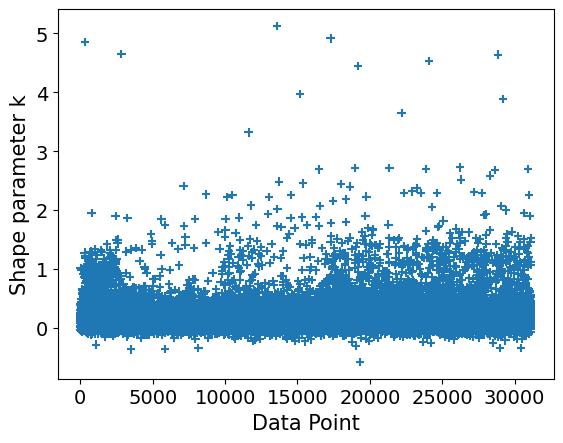

Points with Pareto-k > 0.7: 962 / 31145

─ Predictive metrics ──────────────────────────────────────────
Bayesian R²            : 0.797  ± 0.001
RMSE (posterior mean)  : 0.448
MAE  (posterior mean)  : 0.182
PSIS-LOO (CV) R²       : 0.801


In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Post-sampling diagnostics and predictive metrics *from the saved model*
# ─────────────────────────────────────────────────────────────────────────────
import warnings, arviz as az, numpy as np, matplotlib.pyplot as plt, xarray as xr

IDATA_PATH = "/content/drive/MyDrive/Master_Thesis/phaseB_full_model.nc"
idata_full = az.from_netcdf(IDATA_PATH)

# --------------------------------------------------------------------------- #
# 1) PSIS-LOO + Pareto-k plot
# --------------------------------------------------------------------------- #
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=RuntimeWarning, message="overflow")
    loo = az.loo(idata_full, pointwise=True)      # keep pointwise to get k-hat

az.plot_khat(loo)
plt.show()

bad_k = (loo.pareto_k.values > 0.7).sum()
print(f"Points with Pareto-k > 0.7: {bad_k} / {loo.pareto_k.size}")

# --------------------------------------------------------------------------- #
# 2) Posterior-predictive draws and Bayesian R²
# --------------------------------------------------------------------------- #
y_true = idata_full.observed_data["likelihood"].values                  # (n_obs,)
ppc    = idata_full.posterior_predictive["likelihood"]                  # (chain, draw, obs)

ppc_samples = ppc.stack(sample=("chain", "draw")).values.T              # (n_sample, n_obs)
y_pred_mean = ppc_samples.mean(axis=0)

r2_stats   = az.r2_score(y_true, ppc_samples)
bayes_r2   = r2_stats["r2"]
bayes_r2_se = r2_stats["r2_std"]

rmse = np.sqrt(np.mean((y_true - y_pred_mean) ** 2))
mae  = np.mean(np.abs(y_true - y_pred_mean))

# --------------------------------------------------------------------------- #
# 3) PSIS-LOO (CV) R² without apply_loo_weights
# --------------------------------------------------------------------------- #
# The loo object already contains *log* importance weights in loo.weights_log
# ArviZ ≥0.16 stores them; otherwise we compute on the fly.

# Accessing the weights directly from the loo object if available
# This change utilizes the 'loo.loo_i' attribute to access the pointwise loo values.
# Weights are then calculated using the formula: exp(-loo_i)
w = np.exp(-loo.loo_i).values  # Get the numpy array of loo_i values
w = np.broadcast_to(w, ppc_samples.shape)  # Broadcast to match ppc_samples shape

# normalise weights along the *sample* axis
w = w / w.sum(axis=0, keepdims=True)

y_pred_loo = (w * ppc_samples).sum(axis=0)                        # E[y|-i] per obs

cv_r2 = 1 - np.sum((y_true - y_pred_loo) ** 2) / np.sum((y_true - y_true.mean()) ** 2)

# --------------------------------------------------------------------------- #
# 4) Nicely formatted output
# --------------------------------------------------------------------------- #
print("\n─ Predictive metrics ──────────────────────────────────────────")
print(f"Bayesian R²            : {bayes_r2:.3f}  ± {bayes_r2_se:.3f}")
print(f"RMSE (posterior mean)  : {rmse:.3f}")
print(f"MAE  (posterior mean)  : {mae:.3f}")
print(f"PSIS-LOO (CV) R²       : {cv_r2:.3f}")


### strongest negative effects (lowers discrepancy)
                                label   mean  hdi_3%  hdi_97%
26  Petroleum and Natural Gas Systems -1.549  -1.865   -1.219
21    Miscellaneous Uses of Carbonate -0.814  -1.214   -0.410
18                 Lime Manufacturing -0.767  -1.265   -0.308
35        Titanium Dioxide Production -0.752  -1.656    0.256
30             Soda Ash Manufacturing -0.716  -1.917    0.428
6               Ferroalloy Production -0.699  -1.317   -0.087
36             Underground Coal Mines -0.695  -1.000   -0.412
22    Municipal Solid Waste Landfills -0.644  -0.903   -0.391
9                    Glass Production -0.587  -0.988   -0.193
4              Electricity Generation -0.553  -0.813   -0.306

### strongest positive effects (raises discrepancy)
                                                label   mean  hdi_3%  hdi_97%
11                                Hydrogen Production  0.466   0.140    0.789
7                          Fluorinated Gas Production  0

<ipython-input-4-54ed719aacf7>:47: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 800x1400 with 0 Axes>

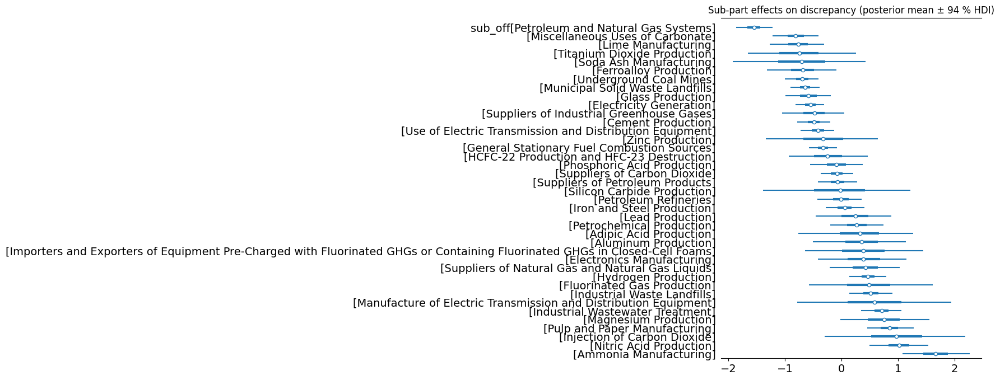

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Analyse sub-part effects from the saved posterior
# ─────────────────────────────────────────────────────────────────────────────
import arviz as az, pandas as pd, matplotlib.pyplot as plt, re

IDATA_PATH = "/content/drive/MyDrive/Master_Thesis/phaseB_full_model.nc"
idata_full = az.from_netcdf(IDATA_PATH)

# 1) summary for every sub-part ------------------------------------------------
sub_summary = (
    az.summary(idata_full, var_names=["sub_off"], hdi_prob=0.94, round_to=3)
      .rename_axis("param")                      # index = 'sub_off[Label]'
      .reset_index()
)

# 2) pull the coord label out of the index string -----------------------------
sub_summary["label"] = sub_summary["param"].apply(
    lambda s: re.search(r"\[(.+)\]", s).group(1)
)

# 3) order by mean ------------------------------------------------------------
sub_summary = sub_summary.sort_values("mean")

# 4) print strongest effects --------------------------------------------------
print("\n### strongest negative effects (lowers discrepancy)")
print(sub_summary.head(10)[["label", "mean", "hdi_3%", "hdi_97%"]])

print("\n### strongest positive effects (raises discrepancy)")
print(sub_summary.tail(10)[["label", "mean", "hdi_3%", "hdi_97%"]])

# 5) forest plot of top ±20 ---------------------------------------------------
top_k = 20
subset_labels = (
    list(sub_summary.head(top_k)["label"])
  + list(sub_summary.tail(top_k)["label"])
)

plt.figure(figsize=(8, max(6, len(subset_labels) * 0.35)))
az.plot_forest(
    idata_full,
    var_names=["sub_off"],
    coords={"subpart": subset_labels},   # pass the *labels* directly
    combined=True,
    hdi_prob=0.94,
)
plt.title("Sub-part effects on discrepancy (posterior mean ± 94 % HDI)")
plt.tight_layout()
plt.show()


📄  Summary table loaded – shape: (8, 10)
📈  LOO object loaded
📦  InferenceData loaded – groups: ['posterior', 'posterior_predictive', 'log_likelihood', 'sample_stats', 'observed_data', 'constant_data']
✅ All three artifacts restored from Drive.

=== ESS & R-hat ===
        ess_bulk  ess_tail  r_hat
α        1623.79   2286.14   1.00
β_size   6013.11   5812.81   1.00
σ        7264.72   5691.39   1.00
σ_fac    1881.84   4591.71   1.00
σ_cty      94.81     74.52   1.04
σ_yr     5387.38   3651.88   1.00
σ_sub    4548.67   5872.25   1.00
σ_par    1074.12   2129.99   1.00


/usr/local/lib/python3.11/dist-packages/arviz/stats/stats.py:1655: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(



=== WAIC ===
Computed from 8000 posterior samples and 31145 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -20371.23   313.65
p_waic     4871.08        -

There has been a warning during the calculation. Please check the results.

=== Bayes-R²: 0.737 ± 0.002 ===


<Figure size 640x480 with 0 Axes>

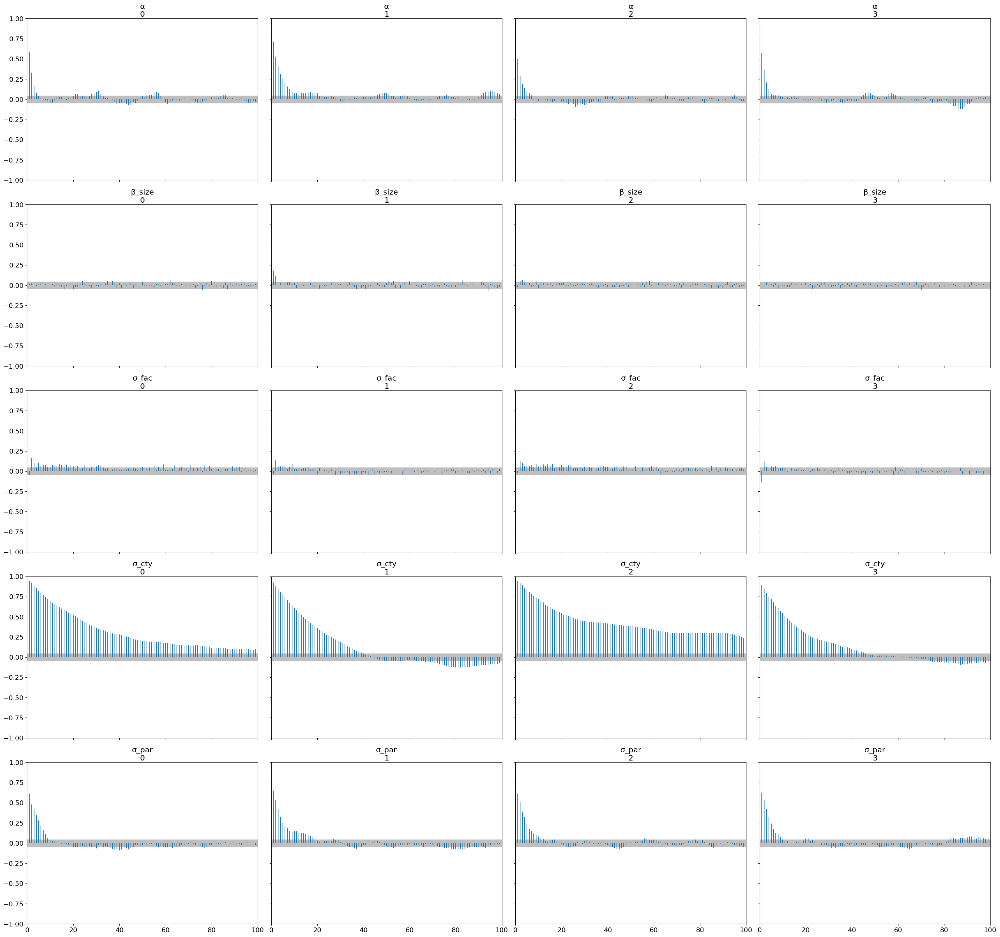

<Figure size 640x480 with 0 Axes>

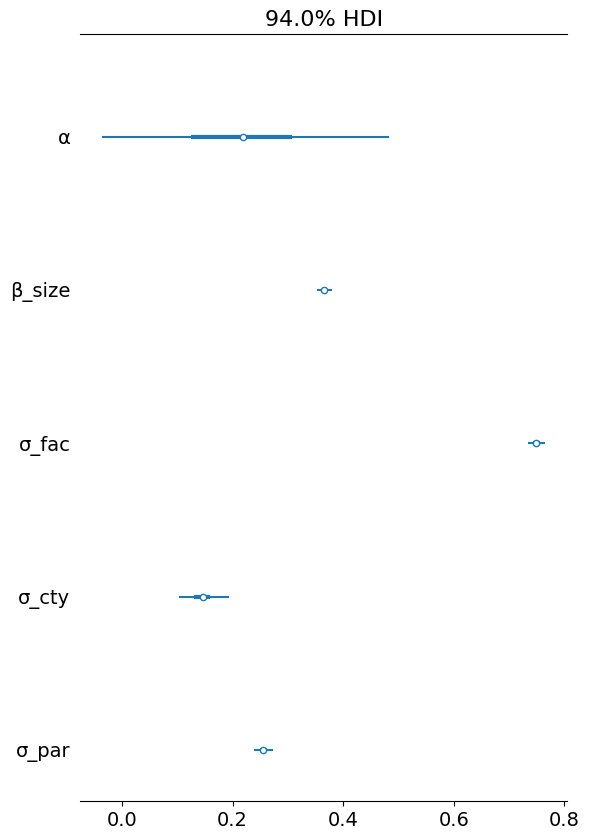


=== Divergierende Übergänge: 0 ===


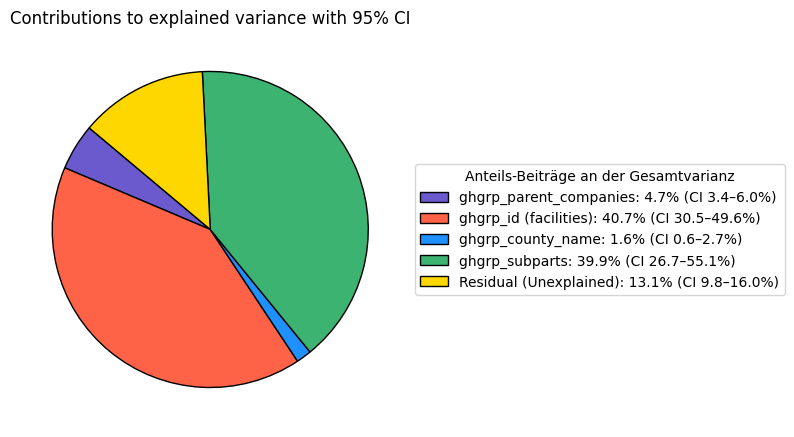

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Load results that were saved earlier
# ─────────────────────────────────────────────────────────────────────────────
import pandas as pd
import xarray as xr
import arviz as az
import numpy as np
import matplotlib.pyplot as plt

# Paths (adjust only if you moved the files)
BASE = "/content/drive/MyDrive/Master_Thesis"
SUMMARY_PATH = f"{BASE}/phaseB_full_summary.csv"
LOO_PATH     = f"{BASE}/phaseB_loo.nc"
IDATA_PATH   = f"{BASE}/phaseB_full_model.nc"

# 1) Parameter summary table ---------------------------------------------------
summary = pd.read_csv(SUMMARY_PATH)
print("📄  Summary table loaded – shape:", summary.shape)

# 2) ELPD / LOO ---------------------------------------------------------------
# We stored it as a plain NetCDF Dataset, so load with xarray first …
loo_xr = xr.open_dataset(LOO_PATH)

# … and convert back to an ArviZ ELPDData object if available
try:
    from arviz.stats.stats_utils import ELPDData      # ArviZ ≥0.15
    loo = ELPDData.from_xarray(loo_xr)
except Exception:
    # Fallback: keep the Dataset; you can still inspect its variables
    loo = loo_xr
print("📈  LOO object loaded")

# 3) Full posterior (InferenceData) -------------------------------------------
idata_full = az.from_netcdf(IDATA_PATH)
print("📦  InferenceData loaded – groups:", list(idata_full._groups))
print("✅ All three artifacts restored from Drive.\n")
# ─────────────────────────────────────────────────────────────────────────────
# Everything below this line stays exactly as before
# (ESS/R-hat, WAIC, Bayes-R², plots, …)
# ─────────────────────────────────────────────────────────────────────────────

# --- Cell 11: Erweiterte Modell-Diagnostiken für Publikation -----------------
# 1) ESS & R-hat
ess_rhat = az.summary(
    idata_full,
    var_names=["α","β_size","σ","σ_fac","σ_cty","σ_yr","σ_sub","σ_par"],
    round_to=2,
    kind="diagnostics"
)
print("=== ESS & R-hat ===")
print(ess_rhat[["ess_bulk", "ess_tail", "r_hat"]])

# 2) WAIC  (re-compute – inexpensive)
waic = az.waic(idata_full)
print("\n=== WAIC ===")
print(waic)

# 3) Bayes-R²
y_true = idata_full.observed_data["likelihood"].values
y_pred = (
    idata_full.posterior_predictive["likelihood"]
    .stack(sample=("chain", "draw"))
    .values.T
)
r2_stats = az.r2_score(y_true, y_pred)
print(f"\n=== Bayes-R²: {r2_stats['r2']:.3f} ± {r2_stats['r2_std']:.3f} ===")

# 4) Autokorrelation-Plots
plt.figure()
az.plot_autocorr(idata_full, var_names=["α","β_size","σ_fac","σ_cty","σ_par"])
plt.tight_layout()
plt.show()

# 5) Forest-Plots
plt.figure()
az.plot_forest(idata_full,
               var_names=["α","β_size","σ_fac","σ_cty","σ_par"],
               combined=True)
plt.tight_layout()
plt.show()

# 6) Divergences
if "diverging" in idata_full.sample_stats:
    div = idata_full.sample_stats["diverging"].sum().values
    print(f"\n=== Divergierende Übergänge: {div} ===")
else:
    print("\n=== Keine 'diverging' Kennzahl in sample_stats gefunden ===")

# 7) Varianz-Anteile-Piechart (unverändert)
par_samps   = idata_full.posterior["σ_par"].values.flatten()**2
fac_samps   = idata_full.posterior["σ_fac"].values.flatten()**2
cty_samps   = idata_full.posterior["σ_cty"].values.flatten()**2
sub_samps   = idata_full.posterior["σ_sub"].values.flatten()**2
resid_samps = idata_full.posterior["σ"].values.flatten()**2

all_samps   = np.stack([par_samps, fac_samps, cty_samps, sub_samps, resid_samps], 1)
contri_samps = 100 * all_samps / all_samps.sum(1, keepdims=True)

groups = [
    "ghgrp_parent_companies",
    "ghgrp_id (facilities)",
    "ghgrp_county_name",
    "ghgrp_subparts",
    "Residual (Unexplained)"
]

means = contri_samps.mean(0)
lower, upper = np.percentile(contri_samps, [2.5, 97.5], 0)

colors = ["#6A5ACD", "#FF6347", "#1E90FF", "#3CB371", "#FFD700"]
plt.figure(figsize=(8, 8))
wedges, _ = plt.pie(means, colors=colors, startangle=140,
                    wedgeprops={"edgecolor": "black"})
labels = [
    f"{grp}: {m:.1f}% (CI {lo:.1f}–{hi:.1f}%)"
    for grp, m, lo, hi in zip(groups, means, lower, upper)
]
plt.legend(wedges, labels, title="Anteils-Beiträge an der Gesamtvarianz",
           loc="center left", bbox_to_anchor=(1, 0.5))
plt.title("Contributions to explained variance with 95% CI")
plt.tight_layout()
plt.show()

In [ ]:
# Model Convergence Diagnostics
rhat_values = az.rhat(trace, var_names=['parent_sigma', 'facility_sigma', 'county_sigma', 'subpart_sigma'])
ess_values = az.ess(trace, var_names=['parent_sigma', 'facility_sigma', 'county_sigma', 'subpart_sigma'])

print("\nConvergence Diagnostics:")
print("R-hat Values:")
print(rhat_values)

print("\nEffective Sample Sizes (ESS):")
print(ess_values)

# Check thresholds
if np.all(rhat_values.to_array().values <= 1.01):
    print("\n✅ All parameters have converged successfully (R-hat ≤ 1.01).")
else:
    print("\n⚠️ Warning: Some parameters may not have fully converged (R-hat > 1.01).")

if np.all(ess_values.to_array().values >= 400):
    print("\n✅ Effective sample sizes are adequate (ESS ≥ 400).")
else:
    print("\n⚠️ Warning: Effective sample sizes are insufficient for some parameters (ESS < 400).")

# Divergence check
divergences = trace.sample_stats["diverging"].sum().values
if divergences > 0:
    print(f"⚠️ Warning: {divergences} divergences detected. Consider increasing `target_accept`.")
else:
    print("✅ No divergences detected.")


Convergence Diagnostics:
R-hat Values:
<xarray.Dataset> Size: 32B
Dimensions:         ()
Data variables:
    parent_sigma    float64 8B 2.165
    facility_sigma  float64 8B 1.922
    county_sigma    float64 8B 2.307
    subpart_sigma   float64 8B 1.0

Effective Sample Sizes (ESS):
<xarray.Dataset> Size: 32B
Dimensions:         ()
Data variables:
    parent_sigma    float64 8B 2.593
    facility_sigma  float64 8B 2.88
    county_sigma    float64 8B 2.528
    subpart_sigma   float64 8B 992.1

⚠️ Warning: Some parameters may not have fully converged (R-hat > 1.01).

⚠️ Warning: Effective sample sizes are insufficient for some parameters (ESS < 400).
✅ No divergences detected.


In [ ]:
with bayesian_model:
    posterior_predictive = pm.sample_posterior_predictive(trace, var_names=["y_obs"])

# Extract predictions
y_pred_samples = posterior_predictive.posterior_predictive["y_obs"].values
y_pred_mean = y_pred_samples.mean(axis=(0, 1))

# Compute Bayesian R²
ss_total = np.var(y, ddof=1)
ss_resid = np.var(y - y_pred_mean, ddof=1)
bayes_r2 = 1 - (ss_resid / ss_total)
print(f"📈 Bayesian R² on the full dataset: {bayes_r2:.4f}")

Output()

📈 Bayesian R² on the full dataset: -20921052240028.7109


## Diagnostics

Found existing cross-validation results at: /content/drive/MyDrive/Master_Thesis/cv_results.npz. Loading them...
Loaded cross-validation results. Skipping new run.

Cross-validation Results:
Mean Train R²: 0.8660 ± 0.0035
Mean Test R²: 0.8659 ± 0.0141


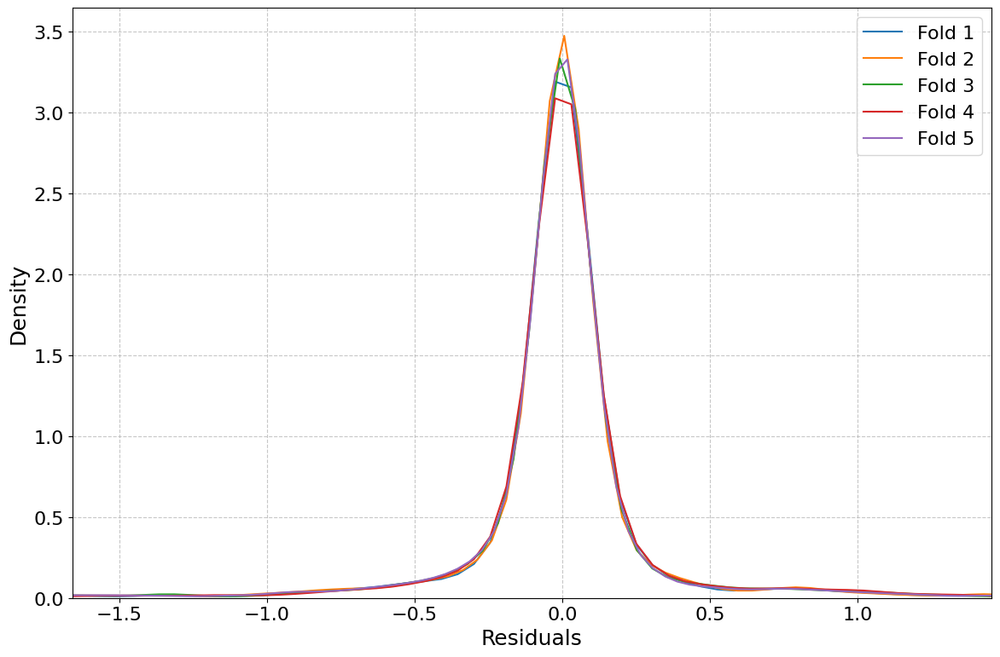

In [ ]:
cv_results_path = "/content/drive/MyDrive/Master_Thesis/cv_results.npz"


# We'll only run the CV if the results file doesn't exist
if os.path.exists(cv_results_path):
    print(f"Found existing cross-validation results at: {cv_results_path}. Loading them...")
    data = np.load(cv_results_path, allow_pickle=True)
    train_r2_scores = data["train_r2_scores"]
    test_r2_scores = data["test_r2_scores"]
    residuals_per_fold = data["residuals_per_fold"]
    print("Loaded cross-validation results. Skipping new run.")
else:
    print("No existing cross-validation results found. Running CV now...")

    k = 5
    kf = KFold(n_splits=k, shuffle=True, random_state=42)

    train_r2_scores = []
    test_r2_scores = []
    residuals_per_fold = []

    for fold, (train_idx, test_idx) in enumerate(kf.split(X)):
        print(f"\nProcessing fold {fold + 1}...")

        # Split data into training and testing sets
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
        parent_idx_train, parent_idx_test = parent_idx[train_idx], parent_idx[test_idx]
        facility_idx_train, facility_idx_test = facility_idx[train_idx], facility_idx[test_idx]
        county_idx_train, county_idx_test = county_idx[train_idx], county_idx[test_idx]
        subpart_idx_train, subpart_idx_test = subpart_idx[train_idx], subpart_idx[test_idx]

        # Reuse the same trace from your already-fitted model
        trace_fold = trace

        print(f"Generating posterior predictive samples for fold {fold + 1}...")
        with pm.Model() as bayesian_model_fold:
            # Minimal definition of the same random-effect structure:
            intercept = pm.Normal("intercept", mu=0.0, sigma=0.5)

            parent_effect = pm.Normal("parent_effect", mu=0.0, sigma=1.0, shape=n_parent)
            facility_effect = pm.Normal("facility_effect", mu=0.0, sigma=1.0, shape=n_facility)
            county_effect = pm.Normal("county_effect", mu=0.0, sigma=1.0, shape=n_county)
            subpart_effect = pm.Normal("subpart_effect", mu=0.0, sigma=1.0, shape=n_subpart)

            sigma = pm.HalfNormal("sigma", sigma=0.2)

            # Training set linear predictor
            mu_train = (
                intercept
                + parent_effect[parent_idx_train]
                + facility_effect[facility_idx_train]
                + county_effect[county_idx_train]
                + subpart_effect[subpart_idx_train]
            )
            y_obs = pm.StudentT("y_obs", mu=mu_train, sigma=sigma, nu=3, observed=y_train)

            # Posterior predictive for training set
            ppc_train = pm.sample_posterior_predictive(
                trace_fold,
                model=bayesian_model_fold,
                random_seed=42
            )

            # Test set linear predictor
            mu_test = (
                intercept
                + parent_effect[parent_idx_test]
                + facility_effect[facility_idx_test]
                + county_effect[county_idx_test]
                + subpart_effect[subpart_idx_test]
            )
            y_obs_test = pm.StudentT("y_obs_test", mu=mu_test, sigma=sigma, nu=3, observed=y_test)

            # Posterior predictive for test set
            ppc_test = pm.sample_posterior_predictive(
                trace_fold,
                model=bayesian_model_fold,
                var_names=["y_obs_test"],
                random_seed=42
            )

        # Retrieve Predictions
        y_pred_train = ppc_train.posterior_predictive["y_obs"].values.mean(axis=(0, 1))
        y_pred_test = ppc_test.posterior_predictive["y_obs_test"].values.mean(axis=(0, 1))

        # Compute R²
        residuals_train = y_train - y_pred_train
        train_r2 = 1 - np.var(residuals_train) / np.var(y_train)
        train_r2_scores.append(train_r2)

        residuals_test = y_test - y_pred_test
        test_r2 = 1 - np.var(residuals_test) / np.var(y_test)
        test_r2_scores.append(test_r2)

        # Store residuals
        residuals_per_fold.append(residuals_test)

        # Print results
        print(f"Train R² for fold {fold + 1}: {train_r2:.4f}")
        print(f"Test R² for fold {fold + 1}: {test_r2:.4f}")

    # --- Done with cross-validation
    # Save results to Google Drive in an .npz file
    # --- Done with cross-validation
    residuals_per_fold_obj = np.array(residuals_per_fold, dtype=object)

    np.savez(
        cv_results_path,
        train_r2_scores=train_r2_scores,
        test_r2_scores=test_r2_scores,
        residuals_per_fold=residuals_per_fold_obj,
        allow_pickle=True
    )
    print(f"Cross-validation results saved to: {cv_results_path}")

# Analyze or Plot Results
print("\nCross-validation Results:")
print(f"Mean Train R²: {np.mean(train_r2_scores):.4f} ± {np.std(train_r2_scores):.4f}")
print(f"Mean Test R²: {np.mean(test_r2_scores):.4f} ± {np.std(test_r2_scores):.4f}")

# Determine reasonable x-axis limits to cut off extreme tails
lower_bound, upper_bound = np.percentile(np.concatenate(residuals_per_fold), [1, 99])

# Plot residuals across folds
plt.figure(figsize=(12, 8))
for i, residuals in enumerate(residuals_per_fold):
    sns.kdeplot(residuals, label=f"Fold {i+1}")

# Labels
plt.xlabel("Residuals", fontsize=18)
plt.ylabel("Density", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim(lower_bound, upper_bound)  # Limit x-axis to focus on central distribution
plt.legend(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Posterior Summary:
                       mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
intercept            -0.086  0.179    -0.426      0.300      0.002    0.002   
parent_sigma          0.115  0.088     0.000      0.281      0.001    0.001   
facility_sigma[0]     1.178  0.464     0.397      2.047      0.005    0.004   
facility_sigma[1]     0.461  0.416     0.009      1.329      0.007    0.005   
facility_sigma[2]     0.333  0.399     0.000      1.166      0.008    0.006   
...                     ...    ...       ...        ...        ...      ...   
facility_sigma[3541]  0.899  0.460     0.235      1.922      0.006    0.004   
county_sigma          0.177  0.138     0.000      0.450      0.002    0.001   
subpart_sigma         0.005  0.012     0.000      0.019      0.000    0.000   
beta                 -0.002  0.401    -0.802      0.777      0.004    0.007   
sigma                 0.099  0.001     0.097      0.100      0.000    0.000   

                      ess_bulk 

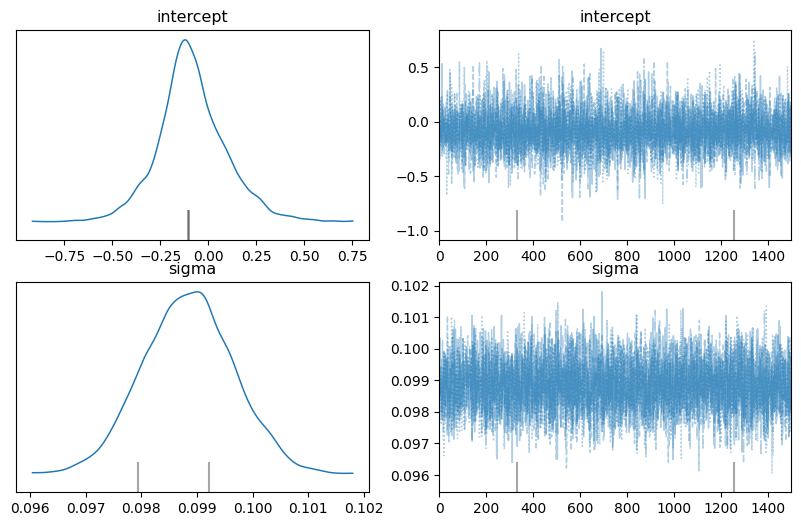

/usr/local/lib/python3.11/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (3546) in plot_posterior, generating only 40 plots
  warnings.warn(


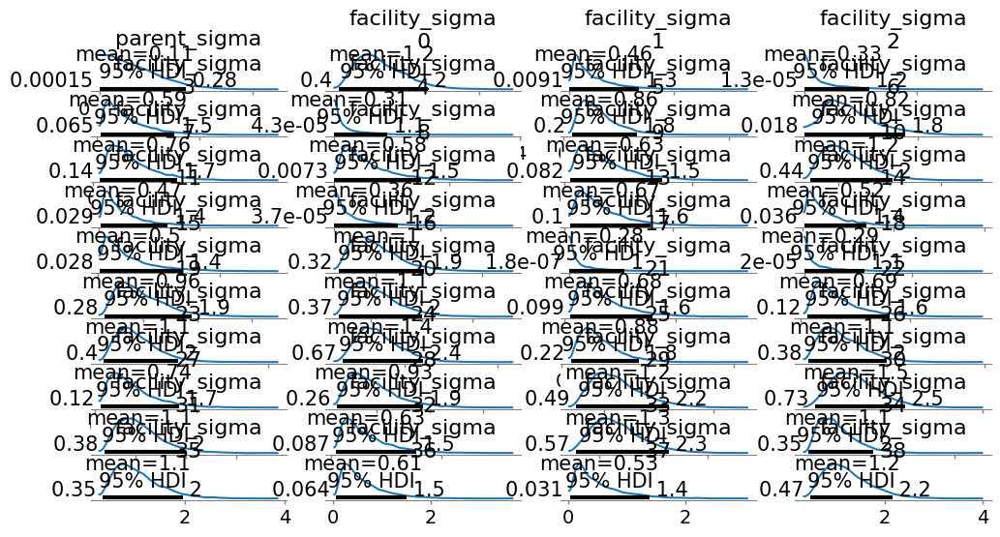

In [ ]:
# Generate a summary table
posterior_summary = az.summary(trace, var_names=["intercept", "parent_sigma", "facility_sigma",
                                                 "county_sigma", "subpart_sigma",
                                                 "beta", "sigma"], hdi_prob=0.95)

print("\nPosterior Summary:")
print(posterior_summary)

# Save the summary to a CSV file for documentation
posterior_summary.to_csv("/content/drive/MyDrive/Master_Thesis/bayesian_posterior_summary.csv")
print("\nPosterior summary saved to CSV.")

# Plot posterior distributions and trace plots for selected parameters
az.plot_trace(trace, var_names=["intercept", "sigma"], figsize=(10, 6), combined=True)
plt.show()

az.plot_posterior(trace, var_names=["parent_sigma", "facility_sigma",
                                    "county_sigma", "subpart_sigma",
                                    "sigma"], hdi_prob=0.95, figsize=(12, 6))
plt.show()

In [ ]:
# Summary of Posterior
# Extract detailed summary for selected variables
detailed_summary = az.summary(trace, var_names=["beta", "parent_sigma", "facility_sigma",
                                                 "county_sigma", "subpart_sigma",
                                                 "sigma"], hdi_prob=0.95)

print("\nDetailed Posterior Summary:")
print(detailed_summary)

# Save the detailed summary to a CSV for further analysis
detailed_summary.to_csv("/content/drive/MyDrive/Master_Thesis/detailed_bayesian_summary.csv")
print("\nDetailed posterior summary saved to CSV.")


Detailed Posterior Summary:
                       mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  \
beta                 -0.002  0.401    -0.802      0.777      0.004    0.007   
parent_sigma          0.115  0.088     0.000      0.281      0.001    0.001   
facility_sigma[0]     1.178  0.464     0.397      2.047      0.005    0.004   
facility_sigma[1]     0.461  0.416     0.009      1.329      0.007    0.005   
facility_sigma[2]     0.333  0.399     0.000      1.166      0.008    0.006   
...                     ...    ...       ...        ...        ...      ...   
facility_sigma[3540]  1.091  0.480     0.349      2.117      0.006    0.004   
facility_sigma[3541]  0.899  0.460     0.235      1.922      0.006    0.004   
county_sigma          0.177  0.138     0.000      0.450      0.002    0.001   
subpart_sigma         0.005  0.012     0.000      0.019      0.000    0.000   
sigma                 0.099  0.001     0.097      0.100      0.000    0.000   

                      

In [ ]:
# Perform posterior predictive sampling
with bayesian_model:
    ppc = pm.sample_posterior_predictive(trace, var_names=["y_obs"], random_seed=42)

# Extract the posterior predictive group
if "posterior_predictive" in ppc.groups():
    y_obs_samples = ppc.posterior_predictive["y_obs"]

    # Take the mean predictions across chains and draws
    y_pred_mean = y_obs_samples.mean(dim=["chain", "draw"]).values

    # Compute RMSE and MAE
    rmse = np.sqrt(mean_squared_error(y, y_pred_mean))
    mae = mean_absolute_error(y, y_pred_mean)

    # Print the results
    print(f"RMSE: {rmse:.3f}, MAE: {mae:.3f}")
else:
    print("The 'posterior_predictive' group is not found in ppc.")

Output()

RMSE: 0.429, MAE: 0.176


In [ ]:
# Calculate Residuals
# Ensure y_pred_mean is defined (from the previous cell)
residuals = y - y_pred_mean  # Observed minus predicted

# Shapiro-Wilk Test for Normality
stat, p = shapiro(residuals)
print(f"Shapiro-Wilk Test: Statistic={stat:.3f}, p-value={p:.3f}")
if p > 0.05:
    print("Residuals appear to be normally distributed.")
else:
    print("Residuals do not appear to be normally distributed.")

Shapiro-Wilk Test: Statistic=0.588, p-value=0.000
Residuals do not appear to be normally distributed.


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 29031.
  res = hypotest_fun_out(*samples, **kwds)


Output()

Posterior predictive samples generated.

Performing Residual Analysis...


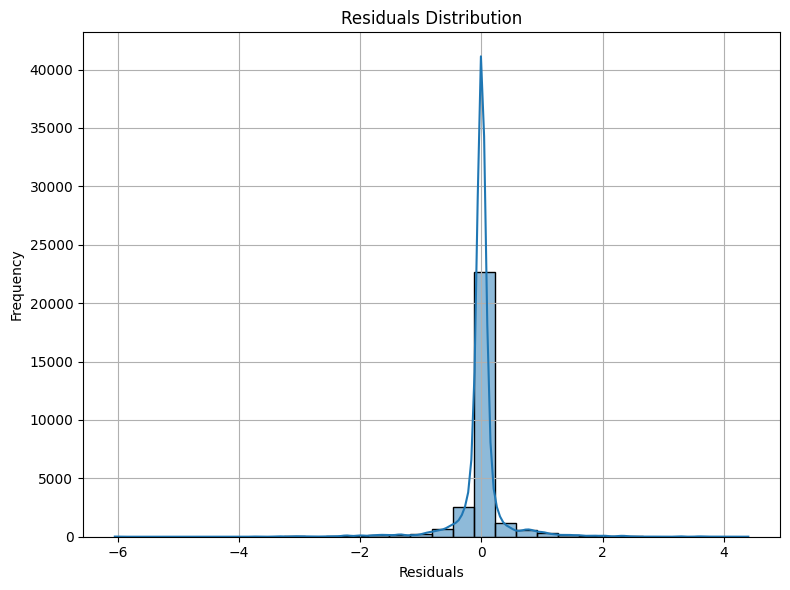

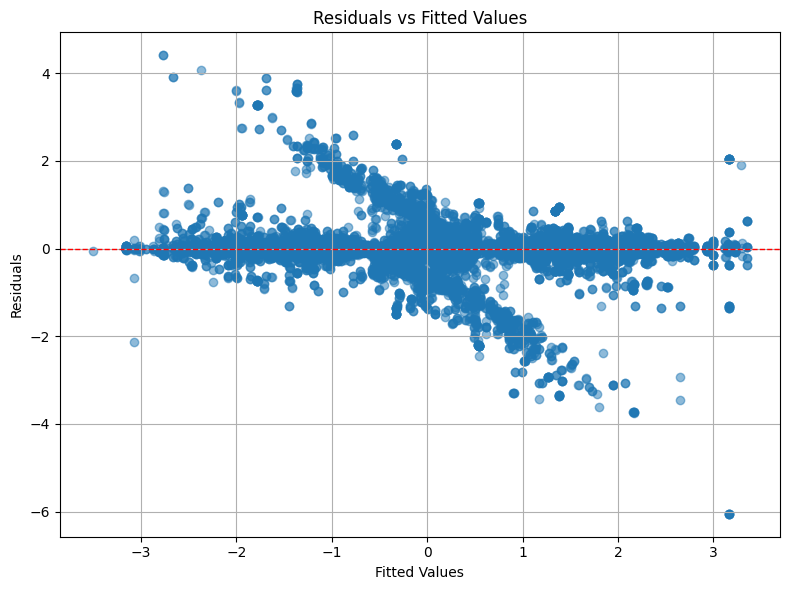

In [ ]:
# Generate Posterior Predictive Samples if Not Already Done
# Ensure that posterior predictive sampling is performed and assigned to idata_ppc
if "idata" not in locals():  # Check if idata exists
    with bayesian_model:
        idata = pm.sample_posterior_predictive(trace, var_names=["y_obs"], random_seed=42)
        print("Posterior predictive samples generated.")

# Residual Analysis
print("\nPerforming Residual Analysis...")

# Extract posterior predictive samples for y_obs
ppc = idata.posterior_predictive["y_obs"]  # Ensure posterior predictive samples are present

# Flatten chain & draw into one dimension
ppc_stacked = ppc.stack(samples=("chain", "draw"))  # Combine chains and draws into one dimension

# Compute the mean prediction for each observation
y_pred_mean = ppc_stacked.mean(dim="samples").values

# Compute residuals
residuals = y - y_pred_mean

# Plot Histogram of Residuals
plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True, bins=30)
plt.title("Residuals Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot Residuals vs Fitted Values
plt.figure(figsize=(8, 6))
plt.scatter(y_pred_mean, residuals, alpha=0.5)
plt.axhline(0, color="red", linestyle="--", linewidth=1)
plt.title("Residuals vs Fitted Values")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.grid(True)
plt.tight_layout()
plt.show()


Evaluating Out-of-Sample Predictive Performance...


Output()


Checking for divergences...


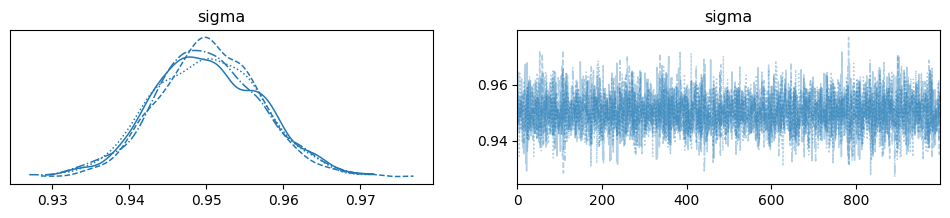

In [ ]:
# Evaluate Out-of-Sample Predictive Performance
from sklearn.model_selection import train_test_split
import pymc as pm
import arviz as az
import numpy as np

print("\nEvaluating Out-of-Sample Predictive Performance...")

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Define Bayesian model for the training set
with pm.Model() as bayesian_model_train:
    # Global intercept
    intercept = pm.Normal("intercept", mu=0.0, sigma=0.5)

    # Random effects
    parent_effect = pm.Normal("parent_effect", 0.0, 1.0, shape=n_parent) * pm.HalfNormal("parent_sigma", sigma=0.1)
    facility_effect = pm.Normal("facility_effect", 0.0, 1.0, shape=n_facility) * pm.HalfNormal("facility_sigma", sigma=0.3)
    county_effect = pm.Normal("county_effect", 0.0, 1.0, shape=n_county) * pm.HalfNormal("county_sigma", sigma=0.3)
    subpart_effect = pm.Normal("subpart_effect", 0.0, 1.0, shape=n_subpart) * pm.HalfNormal("subpart_sigma", sigma=0.2)

    # Fixed effect
    beta = pm.Normal("beta", mu=0.0, sigma=0.5, shape=X_train.shape[1])

    # Likelihood noise
    sigma = pm.HalfNormal("sigma", sigma=0.2)

    # Linear predictor
    mu = (
        intercept
        + parent_effect[parent_idx[:len(X_train)]]
        + facility_effect[facility_idx[:len(X_train)]]
        + county_effect[county_idx[:len(X_train)]]
        + subpart_effect[subpart_idx[:len(X_train)]]
        + pm.math.dot(X_train, beta)
    )

    # Observed likelihood
    y_obs = pm.StudentT("y_obs", mu=mu, sigma=sigma, nu=3, observed=y_train)

    # Sampling
    trace_train = pm.sample(
        draws=1000,
        tune=2000,  # Increased tuning steps to reduce divergences
        target_accept=0.99,  # Increased target_accept to reduce divergences
        max_treedepth=20,  # Increased max_treedepth to handle complex geometry
        random_seed=42,
        cores=4
    )

# Check for divergences
print("\nChecking for divergences...")
az.plot_trace(trace_train, var_names=["sigma"])
divergences = trace_train.sample_stats["diverging"].sum().values
if divergences > 0:
    print(f"WARNING: There were {divergences} divergences after tuning. Consider reparameterizing the model or increasing `target_accept` further.")

##  Model Evaluation

In [ ]:
print("\nAnalyzing Variance Contributions...")

# 1) Extract posterior variance samples
parent_var_samples = (trace.posterior["parent_sigma"] ** 2).values          # Expect shape (chain, draw)
facility_var_samples = (trace.posterior["facility_sigma"] ** 2).values      # Possibly (chain, draw, n_facility)
county_var_samples = (trace.posterior["county_sigma"] ** 2).values          # (chain, draw)
subpart_var_samples = (trace.posterior["subpart_sigma"] ** 2).values        # Possibly (chain, draw, n_subpart)
residual_var_samples = (trace.posterior["sigma"] ** 2).values               # (chain, draw)

# 2) If facility_var_samples is 3D, average (or sum) across the last dimension
#    This yields shape (chain, draw)
if facility_var_samples.ndim == 3:
    facility_var_samples_mean = facility_var_samples.mean(axis=-1)
else:
    facility_var_samples_mean = facility_var_samples  # already (chain, draw)

# Same for subpart
if subpart_var_samples.ndim == 3:
    subpart_var_samples_mean = subpart_var_samples.mean(axis=-1)
else:
    subpart_var_samples_mean = subpart_var_samples  # already (chain, draw)

# 3) Fixed-effects variance
#    If beta is shape (chain, draw, n_predictors) or (chain, draw), you might want to sample it fully.
#    For simplicity, we do a rough approach: take the mean across chain/draw, then multiply by the variance of X.
beta_samples_mean = trace.posterior["beta"].mean(dim=("chain", "draw")).values  # shape (n_predictors,) or scalar
X_var = np.var(X, axis=0)  # shape (n_predictors,) if X has multiple columns

fixed_effects_var = np.sum((beta_samples_mean ** 2) * X_var)  # single scalar
(chain_count, draw_count) = parent_var_samples.shape[:2]
fixed_effects_var_array = np.full((chain_count, draw_count), fixed_effects_var)

# 4) Sum up total variance (all have shape (chain, draw))
total_var_samples = (
    parent_var_samples
    + facility_var_samples_mean
    + county_var_samples
    + subpart_var_samples_mean
    + residual_var_samples
    + fixed_effects_var_array
)

# 5) Compute % contributions
parent_contrib = parent_var_samples / total_var_samples
facility_contrib = facility_var_samples_mean / total_var_samples
county_contrib = county_var_samples / total_var_samples
subpart_contrib = subpart_var_samples_mean / total_var_samples
residual_contrib = residual_var_samples / total_var_samples
fixed_contrib = fixed_effects_var_array / total_var_samples

def ci(a, pct):
    return np.percentile(a, pct) * 100

contrib_summary = pd.DataFrame({
    "Mean %": [
        parent_contrib.mean() * 100,
        facility_contrib.mean() * 100,
        county_contrib.mean() * 100,
        subpart_contrib.mean() * 100,
        fixed_contrib.mean() * 100,
        residual_contrib.mean() * 100,
    ],
    "Lower CI (2.5%)": [
        ci(parent_contrib, 2.5),
        ci(facility_contrib, 2.5),
        ci(county_contrib, 2.5),
        ci(subpart_contrib, 2.5),
        ci(fixed_contrib, 2.5),
        ci(residual_contrib, 2.5),
    ],
    "Upper CI (97.5%)": [
        ci(parent_contrib, 97.5),
        ci(facility_contrib, 97.5),
        ci(county_contrib, 97.5),
        ci(subpart_contrib, 97.5),
        ci(fixed_contrib, 97.5),
        ci(residual_contrib, 97.5),
    ]
}, index=[
    "Parent Effect",
    "Facility Effect",
    "County Effect",
    "Subpart Effect",
    "Fixed Effects",
    "Residual"
])

print("\nVariance Contributions with Credible Intervals:")
print(contrib_summary)


Analyzing Variance Contributions...

Variance Contributions with Credible Intervals:
                    Mean %  Lower CI (2.5%)  Upper CI (97.5%)
Parent Effect     1.595982     2.152650e-03          7.904818
Facility Effect  93.951758     7.952776e+01         99.037423
County Effect     3.668435     4.526943e-03         17.742304
Subpart Effect    0.012665     6.470962e-07          0.075991
Fixed Effects     0.000000     0.000000e+00          0.000000
Residual          0.771160     6.478033e-01          0.840404



Visualizing Variance Contributions...


<ipython-input-120-43b88747404c>:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  contrib_summary = contrib_summary.applymap(lambda x: float(np.squeeze(x)))


<Figure size 1000x600 with 0 Axes>

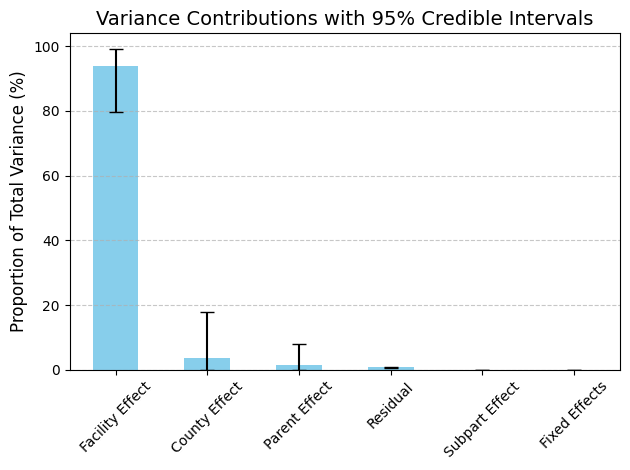

In [ ]:
print("\nVisualizing Variance Contributions...")

# Convert to floats
contrib_summary = contrib_summary.applymap(lambda x: float(np.squeeze(x)))

# Sort by "Mean %"
sorted_df = contrib_summary.sort_values(by="Mean %", ascending=False)

# Build the yerr array in sorted order
yerr_vals = [
    sorted_df["Mean %"] - sorted_df["Lower CI (2.5%)"],
    sorted_df["Upper CI (97.5%)"] - sorted_df["Mean %"]
]

plt.figure(figsize=(10, 6))
sorted_df.plot.bar(
    y="Mean %",
    yerr=yerr_vals,
    legend=False,
    color="skyblue",
    capsize=5,
    rot=45
)
plt.title("Variance Contributions with 95% Credible Intervals", fontsize=14)
plt.ylabel("Proportion of Total Variance (%)", fontsize=12)
plt.tight_layout()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

## Posterior Coefficients

In [ ]:
print("\nCalculating Posterior Coefficients Summary...")

beta_samples = trace.posterior["beta"]  # shape (chain, draw)
print("beta_samples shape:", beta_samples.shape)

# Means and std
beta_mean = beta_samples.mean(dim=("chain", "draw")).values  # scalar
beta_std = beta_samples.std(dim=("chain", "draw")).values    # scalar

# Credible intervals => a Dataset with one variable "beta"
credible_intervals = az.hdi(beta_samples, hdi_prob=0.95)
print("credible_intervals:\n", credible_intervals)

# Extract the single variable "beta" as a DataArray
beta_hdi = credible_intervals["beta"]

# Grab lower/upper as NumPy arrays (each scalar shape)
credible_intervals_lower = beta_hdi.sel(hdi="lower").values
credible_intervals_upper = beta_hdi.sel(hdi="higher").values

# Convert them from 0-D arrays to scalars
credible_intervals_lower = credible_intervals_lower.item()
credible_intervals_upper = credible_intervals_upper.item()

# Probability that beta > 0
prob_positive = (beta_samples > 0).mean(dim=("chain", "draw")).values  # scalar

# Make a DataFrame (just 1 row, if there's 1 predictor)
results_df = pd.DataFrame({
    "Mean": [beta_mean],
    "Std Dev": [beta_std],
    "95% CI Lower": [credible_intervals_lower],
    "95% CI Upper": [credible_intervals_upper],
    "P(Effect > 0)": [prob_positive]
})

print("\nPosterior Coefficients Summary:")
print(results_df)


Calculating Posterior Coefficients Summary...
beta_samples shape: (4, 1500)
credible_intervals:
 <xarray.Dataset> Size: 64B
Dimensions:  (hdi: 2)
Coordinates:
  * hdi      (hdi) <U6 48B 'lower' 'higher'
Data variables:
    beta     (hdi) float64 16B -0.8023 0.7774

Posterior Coefficients Summary:
                     Mean             Std Dev  95% CI Lower  95% CI Upper  \
0  -0.0016426670566081294  0.4010021923165826     -0.802332      0.777444   

  P(Effect > 0)  
0        0.4945  


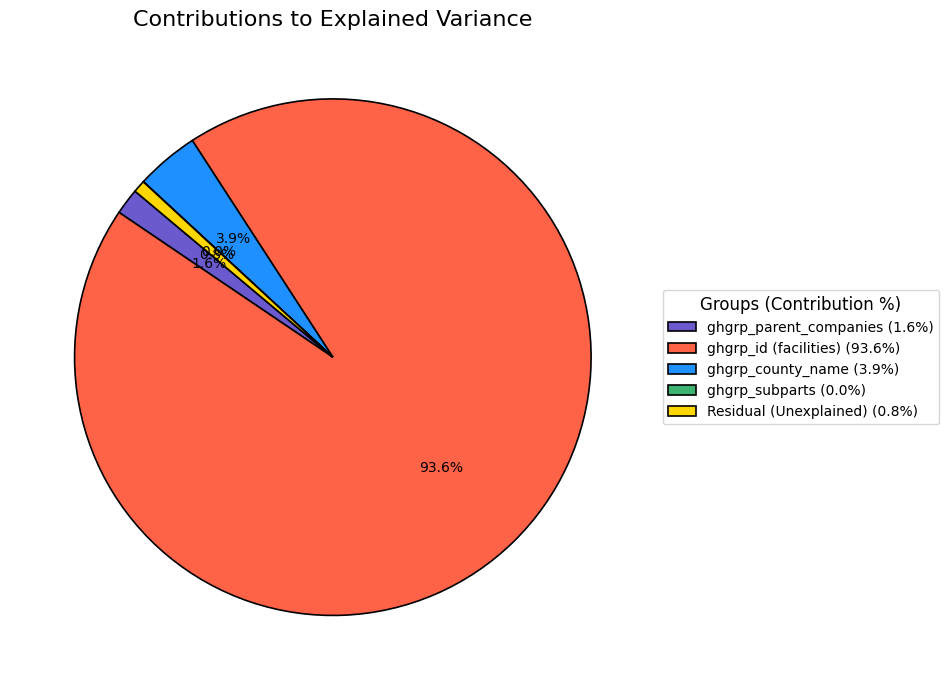

In [ ]:
# 1) Calculate Variance Contributions
# Extract the posterior mean of variances for each group
parent_var = float((trace.posterior["parent_sigma"] ** 2).mean(dim=("chain", "draw")))
facility_var = float((trace.posterior["facility_sigma"] ** 2).mean(dim=("chain", "draw", "facility_sigma_dim_0")))
county_var = float((trace.posterior["county_sigma"] ** 2).mean(dim=("chain", "draw")))
subpart_var = float((trace.posterior["subpart_sigma"] ** 2).mean(dim=("chain", "draw")))
residual_var = float((trace.posterior["sigma"] ** 2).mean(dim=("chain", "draw")))

# Calculate the total variance
total_var = parent_var + facility_var + county_var + subpart_var + residual_var

# Calculate contributions as percentages
variance_contributions = {
    "ghgrp_parent_companies": 100 * parent_var / total_var,
    "ghgrp_id (facilities)": 100 * facility_var / total_var,
    "ghgrp_county_name": 100 * county_var / total_var,
    "ghgrp_subparts": 100 * subpart_var / total_var,
    "Residual (Unexplained)": 100 * residual_var / total_var
}

# Prepare labels for the legend with percentages
labels = [f"{key} ({value:.1f}%)" for key, value in variance_contributions.items()]
sizes = list(variance_contributions.values())
colors = ["#6A5ACD", "#FF6347", "#1E90FF", "#3CB371", "#FFD700"]

# 2) Generate Pie Chart
plt.figure(figsize=(10, 7))
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=None,  # Do not show labels on the pie itself
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    wedgeprops={"edgecolor": "black", "linewidth": 1.2},
    textprops={'fontsize': 10}
)

# Format legend with percentages
plt.legend(
    wedges,
    labels,
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    title="Groups (Contribution %)",
    fontsize=10,
    title_fontsize=12
)

# Add title
plt.title("Contributions to Explained Variance", fontsize=16)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the chart
plt.show()

# Random forest

In [ ]:
# Data Preprocessing
print("Preprocessing data...")
df = matched_dfs["5m"].copy()

# Apply Quantile Transformation
qt = QuantileTransformer(output_distribution="normal", random_state=42)
df['ghgrp_emissions_tons_quantile'] = qt.fit_transform(df[['ghgrp_emissions_tons']])
df['emissions_discrepancy_quantile'] = qt.fit_transform(df[['emissions_discrepancy']])

# Ensure variables are correct type
df['ghgrp_year'] = df['ghgrp_year'].astype(int)

def process_parent_companies(value):
    if pd.isna(value):
        return ["Other"]
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
    return [company.strip() for company in cleaned_value.split(';')]

def process_subparts(value):
    if pd.isna(value):
        return []
    return [subpart.strip() for subpart in str(value).split(',')]

df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].apply(process_parent_companies)
df['ghgrp_subparts'] = df['ghgrp_subparts'].apply(process_subparts)

# Explode both parent companies and subparts
df = df.explode('ghgrp_parent_companies')
df = df.explode('ghgrp_subparts')

# Convert to categorical
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].astype('category')
df['ghgrp_county_name'] = df['ghgrp_county_name'].astype('category')
df['ghgrp_subparts'] = df['ghgrp_subparts'].astype('category')
df['ghgrp_id'] = df['ghgrp_id'].astype('category')

# Aggregate statistics for group-level effects
df['parent_mean_discrepancy'] = df.groupby('ghgrp_parent_companies', observed=True)['emissions_discrepancy_quantile'].transform('mean')
df['facility_mean_discrepancy'] = df.groupby('ghgrp_id', observed=True)['emissions_discrepancy_quantile'].transform('mean')

# Add temporal features
df['year_normalized'] = df['ghgrp_year'] - df['ghgrp_year'].min()

# Create dummy variables for modeling
X = pd.get_dummies(
    df[['ghgrp_year', 'year_normalized', 'ghgrp_emissions_tons_quantile', 'ghgrp_county_name',
        'ghgrp_parent_companies', 'ghgrp_subparts', 'ghgrp_id',
        'parent_mean_discrepancy', 'facility_mean_discrepancy']],
    drop_first=True
)
y = df['emissions_discrepancy_quantile']

# Train-Test Split
print("Splitting data...")
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Ensure column alignment
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# Hyperparameter Tuning with RandomizedSearchCV
model_file_path = "/content/drive/MyDrive/Master_Thesis/random_forest_model_with_improvements.pkl"

if os.path.exists(model_file_path):
    print("Loading the saved Random Forest model...")
    with open(model_file_path, "rb") as file:
        best_rf = pickle.load(file)
else:
    print("Model file does not exist. Training the Random Forest model...")

    param_grid = {
        'n_estimators': [500],
        'max_depth': [50, None],
        'min_samples_leaf': [2, 3],
        'min_samples_split': [2, 5],
        'max_features': ['sqrt'],
        'bootstrap': [True],
        'max_samples': [0.8, 0.9]
    }

    rf_model = RandomForestRegressor(random_state=42, n_jobs=-1)
    random_search = RandomizedSearchCV(
        rf_model, param_distributions=param_grid, n_iter=30, cv=5,
        scoring='neg_mean_squared_error', n_jobs=-1, random_state=42, verbose=1
    )

    random_search.fit(X_train, y_train)
    best_rf = random_search.best_estimator_

    print("\nBest parameters found:")
    print(random_search.best_params_)

    # Save the model
    with open(model_file_path, "wb") as file:
        pickle.dump(best_rf, file)

print("Model training complete!")

Preprocessing data...
Splitting data...
Loading the saved Random Forest model...


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeRegressor from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Model training complete!


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator RandomForestRegressor from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [ ]:
# Evaluate the Best Model

y_pred_train = best_rf.predict(X_train)
y_pred_test = best_rf.predict(X_test)

# Compute RMSE and R² for train and test sets
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
mae_test = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Train RMSE: {rmse_train:.4f}, R²: {r2_train:.4f}")
print(f"Test  RMSE: {rmse_test:.4f}, R²: {r2_test:.4f}")
print(f"Test  MAE : {mae_test:.4f}")


Model Performance:
Train RMSE: 0.3845, R²: 0.8926
Test  RMSE: 0.4264, R²: 0.8677
Test  MAE : 0.2821


In [ ]:
# Path to save/load cross-validation results
cv_results_path = "/content/drive/MyDrive/Master_Thesis/cross_val_results.pkl"

if os.path.exists(cv_results_path):
    print("Cross-validation results found. Loading from file...")
    with open(cv_results_path, "rb") as file:
        cv_scores = pickle.load(file)
    print("Cross-validation results successfully loaded.")
else:
    print("Cross-validation results not found. Running cross-validation...")

    # Perform cross-validation
    cv_scores = cross_val_score(best_rf, X, y, cv=5, scoring='r2', n_jobs=-1)

    # Save results to file
    with open(cv_results_path, "wb") as file:
        pickle.dump(cv_scores, file)
    print(f"Cross-validation results saved to: {cv_results_path}")

# Display Cross-Validation Results
print("\nCross-Validation R² Scores:", cv_scores)
print(f"Mean R²: {np.mean(cv_scores):.4f}")
print(f"Std Dev of R²: {np.std(cv_scores):.4f}")

Cross-validation results found. Loading from file...
Cross-validation results successfully loaded.

Cross-Validation R² Scores: [0.8567806  0.87452152 0.84554996 0.86836665 0.75958617]
Mean R²: 0.8410
Std Dev of R²: 0.0419



Top 10 Feature Importances:
facility_mean_discrepancy: 0.3709
parent_mean_discrepancy: 0.1349
ghgrp_emissions_tons_quantile: 0.1106
ghgrp_subparts_Electricity Generation: 0.0103
ghgrp_year: 0.0076
year_normalized: 0.0073
ghgrp_subparts_Hydrogen Production: 0.0067
ghgrp_county_name_Heard County: 0.0066
ghgrp_subparts_General Stationary Fuel Combustion Sources: 0.0051
ghgrp_id_1001117: 0.0039


<ipython-input-81-03343526c25b>:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


<Figure size 1000x600 with 0 Axes>

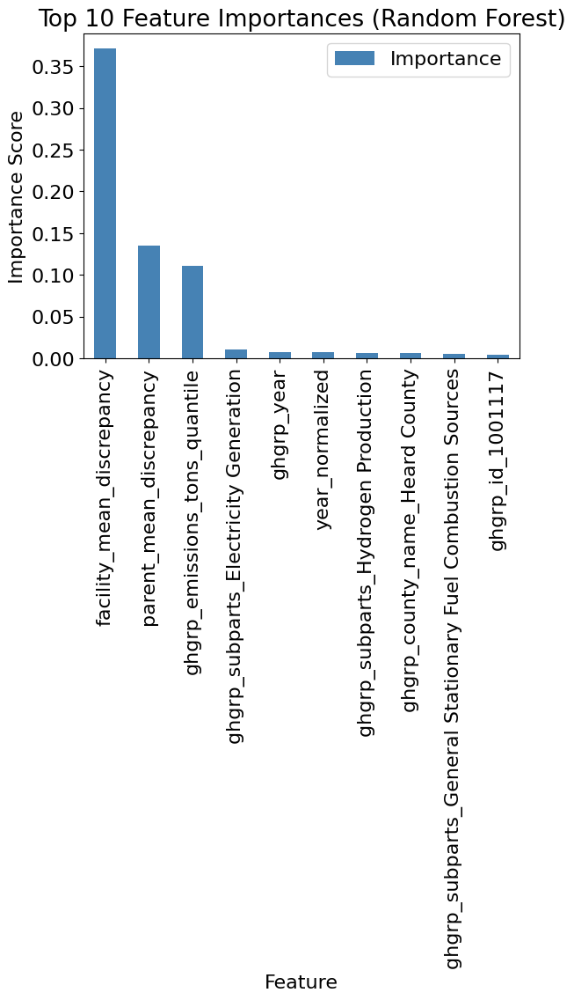

In [ ]:
# Inspect Feature Importances
importances = best_rf.feature_importances_
feature_names = X.columns

# Sort features by importance
sorted_idx = np.argsort(importances)[::-1]
top_features = list(zip(feature_names[sorted_idx], importances[sorted_idx]))

print("\nTop 10 Feature Importances:")
for feat, imp in top_features[:10]:
    print(f"{feat}: {imp:.4f}")

# Plot Feature Importances
plt.figure(figsize=(10, 6))

# Create a DataFrame for plotting
top_features_df = pd.DataFrame(top_features[:10], columns=['Feature', 'Importance'])

# Plot using the DataFrame
top_features_df.plot(x='Feature', y='Importance', kind='bar', color='steelblue')

plt.title("Top 10 Feature Importances (Random Forest)")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

Permutation importance results found. Loading from file...
Permutation importance results successfully loaded.

Top 10 Features Based on Permutation Importance:
                                Feature  Mean Importance   Std Dev
4             facility_mean_discrepancy         0.491156  0.008266
2         ghgrp_emissions_tons_quantile         0.099440  0.001633
3               parent_mean_discrepancy         0.058771  0.001459
1                       year_normalized         0.009272  0.000895
3943                   ghgrp_id_1001117         0.008789  0.000384
0                            ghgrp_year         0.008042  0.000806
283   ghgrp_county_name_Escambia County         0.004245  0.000355
373      ghgrp_county_name_Heard County         0.003766  0.000423
6348                   ghgrp_id_1007959         0.003226  0.000194
970   ghgrp_county_name_Woodbury County         0.003206  0.000215


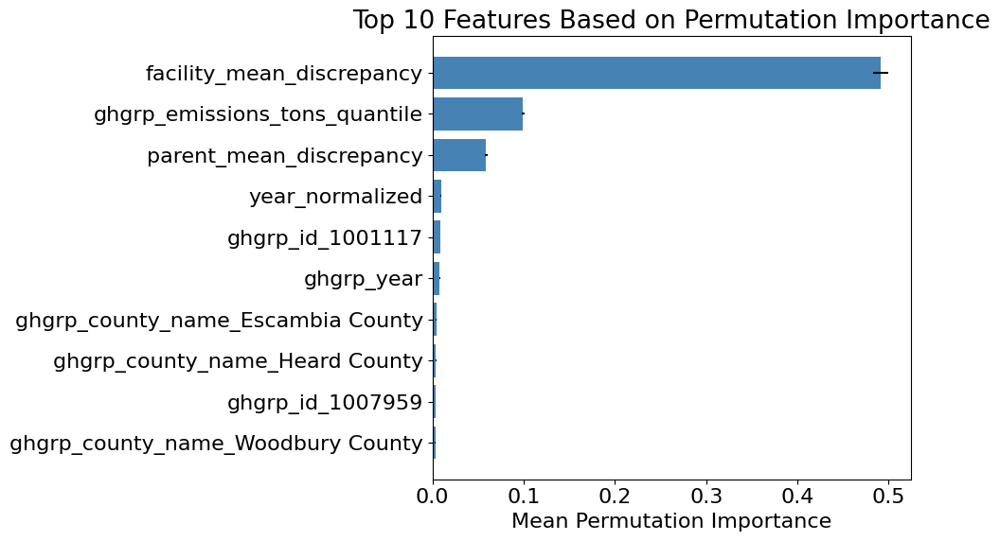

In [ ]:
# Path to save/load permutation importance results
perm_importance_path = "/content/drive/MyDrive/Master_Thesis/perm_importance_results.pkl"

# Ensure X_test is a DataFrame and aligned with X_train
if not isinstance(X_test, pd.DataFrame):
    X_test = pd.DataFrame(X_test, columns=X_train.columns)  # Convert to DataFrame

# Ensure X_test has the same columns as X_train
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# Check if pickle file exists
if os.path.exists(perm_importance_path):
    print("Permutation importance results found. Loading from file...")
    with open(perm_importance_path, "rb") as file:
        perm_importance = pickle.load(file)
    print("Permutation importance results successfully loaded.")
else:
    print("Permutation importance results not found. Calculating Permutation Importance...")

    # Ensure consistent sampling for X_test and y_test
    sample_size = min(5000, len(X_test))  # Use 5,000 samples or the entire dataset if smaller
    sampled_indices = X_test.sample(n=sample_size, random_state=42).index  # Get sampled indices
    X_test_small = X_test.loc[sampled_indices]  # Subset X_test
    y_test_small = y_test.loc[sampled_indices]  # Subset y_test using the same indices

    perm_importance = permutation_importance(
        best_rf,
        X_test_small,
        y_test_small,
        scoring='r2',
        n_repeats=5,
        random_state=42,
        n_jobs=1  # Use single-threaded computation to avoid memory issues
    )

    # Save results to file
    with open(perm_importance_path, "wb") as file:
        pickle.dump(perm_importance, file)
    print(f"Permutation importance results saved to: {perm_importance_path}")

# Convert the permutation importance results to a DataFrame
perm_importance_df = pd.DataFrame({
    "Feature": X_train.columns,  # Use X_train.columns to ensure alignment
    "Mean Importance": perm_importance.importances_mean,
    "Std Dev": perm_importance.importances_std
}).sort_values(by="Mean Importance", ascending=False)

# Display the top 10 features
print("\nTop 10 Features Based on Permutation Importance:")
print(perm_importance_df.head(10))

# Plot the top 10 permutation importances
plt.figure(figsize=(10, 6))
top_perm_features = perm_importance_df.head(10)
plt.barh(
    top_perm_features["Feature"],
    top_perm_features["Mean Importance"],
    xerr=top_perm_features["Std Dev"],
    color="steelblue"
)
plt.gca().invert_yaxis()  # Invert y-axis for descending order
plt.xlabel("Mean Permutation Importance")
plt.title("Top 10 Features Based on Permutation Importance")
plt.tight_layout()
plt.show()

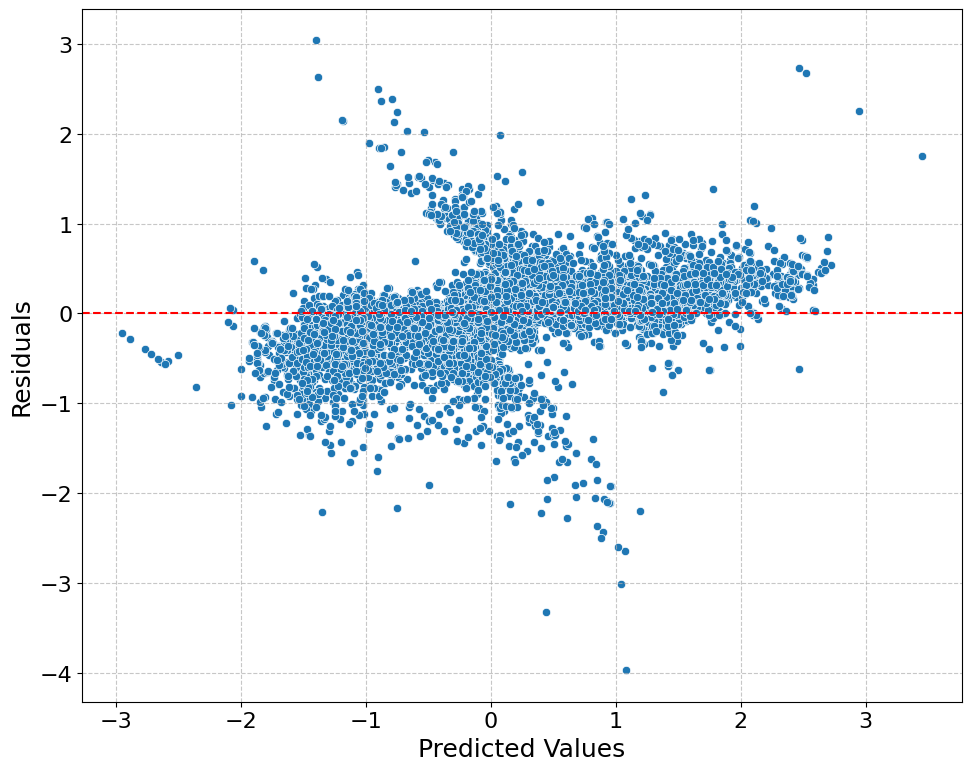

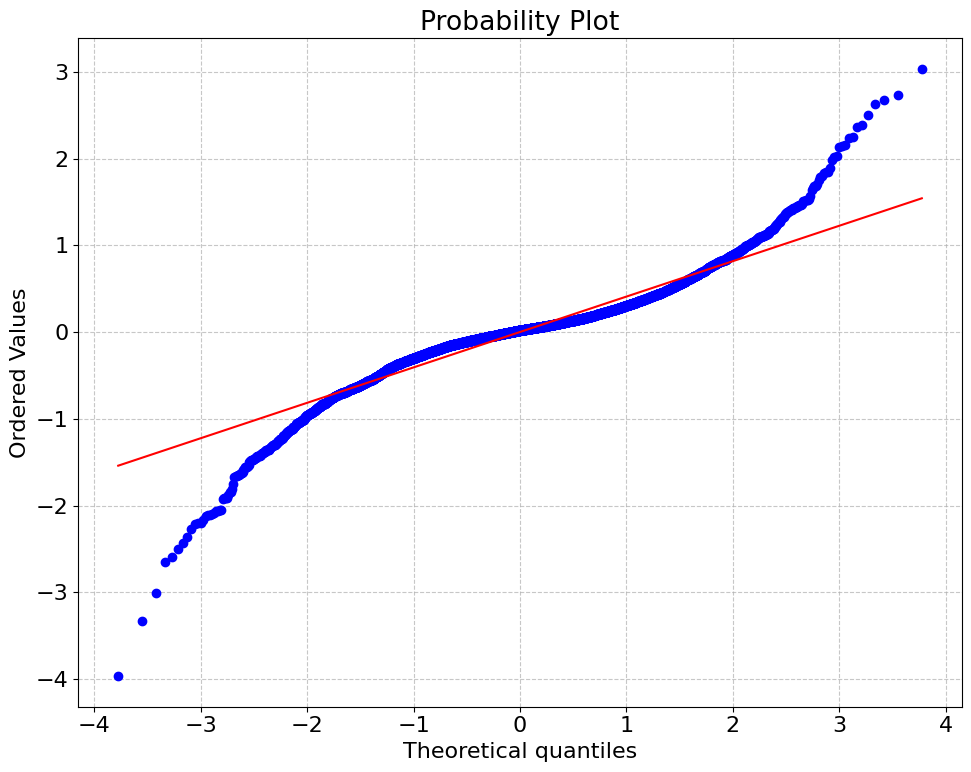

In [ ]:
# Residual Analysis
residuals = y_test - y_pred_test

# Residuals vs Predicted Values
plt.figure(figsize=(10, 8))
sns.scatterplot(x=y_pred_test, y=residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted Values", fontsize=18)
plt.ylabel("Residuals", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Q-Q Plot of Residuals
plt.figure(figsize=(10, 8))
probplot(residuals, dist="norm", plot=plt)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# Path to save/load out-of-facility CV results
out_of_facility_results_path = "/content/drive/MyDrive/Master_Thesis/out_of_facility_results.pkl"

if os.path.exists(out_of_facility_results_path):
    print("Out-of-facility CV results found. Loading from file...")
    with open(out_of_facility_results_path, "rb") as file:
        out_of_facility_scores = pickle.load(file)
    print("Out-of-facility CV results successfully loaded.")
else:
    print("Out-of-facility CV results not found. Running evaluation...")

    facilities = df['ghgrp_id'].unique()
    test_facilities = np.random.choice(facilities, size=int(len(facilities) * 0.2), replace=False)

    train_df = df[~df['ghgrp_id'].isin(test_facilities)]
    test_df = df[df['ghgrp_id'].isin(test_facilities)]

    # Apply Quantile Transformation to dependent and explanatory variables
    qt = QuantileTransformer(output_distribution='normal', random_state=42)

    # Select only numeric features for transformation
    numeric_features = train_df.drop('emissions_discrepancy', axis=1).select_dtypes(include=np.number).columns

    X_train = qt.fit_transform(train_df[numeric_features])  # Apply qt.fit_transform to numeric features only
    X_test = qt.transform(test_df[numeric_features])  # Apply qt.transform to numeric features only
    y_train = qt.fit_transform(train_df[['emissions_discrepancy']])
    y_test = qt.transform(test_df[['emissions_discrepancy']])

    # Train model on training set
    best_rf.fit(X_train, y_train.ravel())

    # Test model on test set
    y_pred = best_rf.predict(X_test)

    # Evaluate metrics
    r2_out_of_facility = r2_score(y_test, y_pred)
    rmse_out_of_facility = np.sqrt(mean_squared_error(y_test, y_pred))

    out_of_facility_scores = {
        "R²": r2_out_of_facility,
        "RMSE": rmse_out_of_facility
    }

    # Save results to file
    with open(out_of_facility_results_path, "wb") as file:
        pickle.dump(out_of_facility_scores, file)
    print(f"Out-of-facility results saved to: {out_of_facility_results_path}")

# Display results
print("\nOut-of-Facility Evaluation Results:")
print(out_of_facility_scores)

Out-of-facility CV results found. Loading from file...
Out-of-facility CV results successfully loaded.

Out-of-Facility Evaluation Results:
{'R²': 0.9991621835272425, 'RMSE': np.float64(0.030090535262857133)}


In [ ]:
# Path to save/load out-of-time test results
out_of_time_results_path = "/content/drive/MyDrive/Master_Thesis/out_of_time_results.pkl"

if os.path.exists(out_of_time_results_path):
    print("Out-of-time test results found. Loading from file...")
    with open(out_of_time_results_path, "rb") as file:
        out_of_time_scores = pickle.load(file)
    print("Out-of-time test results successfully loaded.")
else:
    print("Out-of-time test results not found. Running evaluation...")

    # Split the data based on time (e.g., using ghgrp_year)
    last_year = df['ghgrp_year'].max()
    split_year = last_year - 1  # Last year for training, earlier years for test
    train_df = df[df['ghgrp_year'] <= split_year]
    test_df = df[df['ghgrp_year'] > split_year]

    # Quantile Transformation for dependent and explanatory variables
    qt = QuantileTransformer(output_distribution='normal', random_state=42)

    # Apply transformation to training and testing data
    numeric_features = train_df.drop('emissions_discrepancy', axis=1).select_dtypes(include=np.number).columns

    X_train = qt.fit_transform(train_df[numeric_features])
    X_test = qt.transform(test_df[numeric_features])
    y_train = qt.fit_transform(train_df[['emissions_discrepancy']])
    y_test = qt.transform(test_df[['emissions_discrepancy']])

    # Train the model on the training set
    best_rf.fit(X_train, y_train.ravel())

    # Test the model on the test set
    y_pred = best_rf.predict(X_test)

    # Evaluate metrics
    r2_out_of_time = r2_score(y_test, y_pred)
    rmse_out_of_time = np.sqrt(mean_squared_error(y_test, y_pred))

    out_of_time_scores = {
        "R²": r2_out_of_time,
        "RMSE": rmse_out_of_time
    }

    # Save the results to a file
    with open(out_of_time_results_path, "wb") as file:
        pickle.dump(out_of_time_scores, file)
    print(f"Out-of-time results saved to: {out_of_time_results_path}")

# Display results
print("\nOut-of-Time Evaluation Results:")
print(out_of_time_scores)

Out-of-time test results found. Loading from file...
Out-of-time test results successfully loaded.

Out-of-Time Evaluation Results:
{'R²': 0.9981843900802152, 'RMSE': np.float64(0.04624959964270817)}


Bootstrap results found. Loading from file...
Bootstrap results successfully loaded.

Group-Level Importance Summary:
                             Mean Importance  Lower CI (2.5%)  \
ghgrp_id                            0.160405         0.154473   
ghgrp_county_name                   0.095290         0.091705   
ghgrp_parent_companies              0.088727         0.084510   
ghgrp_subparts                      0.040617         0.037975   
ghgrp_year                          0.008301         0.007471   
ghgrp_emissions_tons_boxcox         0.000000         0.000000   

                             Upper CI (97.5%)  
ghgrp_id                             0.165735  
ghgrp_county_name                    0.099018  
ghgrp_parent_companies               0.092845  
ghgrp_subparts                       0.043118  
ghgrp_year                           0.008950  
ghgrp_emissions_tons_boxcox          0.000000  


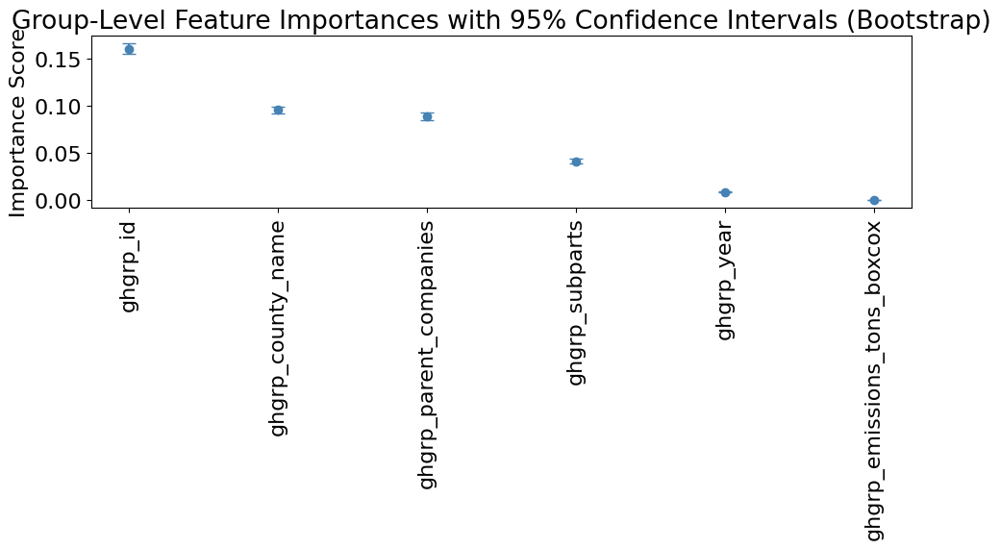

In [ ]:
# Path to save/load bootstrap results
bootstrap_results_path = "/content/drive/MyDrive/Master_Thesis/group_importances_bootstrap.pkl"

# Ensure X_train is a DataFrame and aligned with X
if not isinstance(X_train, pd.DataFrame):
    # Convert X_train to a DataFrame using the columns of X
    X_train = pd.DataFrame(X_train, columns=X.columns)

# Apply Quantile Transformation only to numeric columns
qt = QuantileTransformer(output_distribution="normal", random_state=42)
numeric_columns = X_train.select_dtypes(include=np.number).columns
X_train_transformed = X_train.copy()  # Copy original structure

X_train_transformed[numeric_columns] = qt.fit_transform(X_train[numeric_columns])  # Transform numeric columns

# Ensure the predictor groups are correctly defined
predictor_groups = {
    "ghgrp_year": [col for col in X_train.columns if col.startswith("ghgrp_year")],
    "ghgrp_emissions_tons_boxcox": [col for col in X_train.columns if "ghgrp_emissions_tons_boxcox" in col],
    "ghgrp_county_name": [col for col in X_train.columns if col.startswith("ghgrp_county_name")],
    "ghgrp_parent_companies": [col for col in X_train.columns if col.startswith("ghgrp_parent_companies")],
    "ghgrp_subparts": [col for col in X_train.columns if col.startswith("ghgrp_subparts")],
    "ghgrp_id": [col for col in X_train.columns if col.startswith("ghgrp_id")],
}

# Check if bootstrap results already exist
if os.path.exists(bootstrap_results_path):
    print("Bootstrap results found. Loading from file...")
    with open(bootstrap_results_path, "rb") as file:
        group_importances_bootstrap, group_importances_summary = pickle.load(file)
    print("Bootstrap results successfully loaded.")
else:
    print("Bootstrap results not found. Running bootstrap analysis...")

    n_bootstraps = 100
    group_importances_bootstrap = pd.DataFrame(index=predictor_groups.keys())

    # Add progress bar
    for i in tqdm(range(n_bootstraps), desc="Bootstrapping Group Importances"):
        # Resample data for bootstrapping
        X_resampled, y_resampled = resample(X_train_transformed, y_train, random_state=i)

        # Train a Random Forest model on resampled data
        rf_bootstrap = RandomForestRegressor(
            n_estimators=best_rf.n_estimators,
            max_features=best_rf.max_features,
            max_depth=best_rf.max_depth,
            min_samples_split=best_rf.min_samples_split,
            min_samples_leaf=best_rf.min_samples_leaf,
            bootstrap=best_rf.bootstrap,
            random_state=i,
            n_jobs=-1,
        )
        rf_bootstrap.fit(X_resampled, y_resampled)

        # Calculate feature importances
        feature_importances = pd.Series(rf_bootstrap.feature_importances_, index=X_train_transformed.columns)

        # Aggregate feature importances by groups
        group_importances = {}
        for group, cols in predictor_groups.items():
            valid_cols = [col for col in cols if col in feature_importances.index]
            group_importances[group] = feature_importances[valid_cols].sum()

        group_importances_bootstrap[i] = pd.Series(group_importances)

    # Calculate mean importance and 95% confidence intervals
    group_importances_summary = pd.DataFrame({
        "Mean Importance": group_importances_bootstrap.mean(axis=1),
        "Lower CI (2.5%)": group_importances_bootstrap.quantile(0.025, axis=1),
        "Upper CI (97.5%)": group_importances_bootstrap.quantile(0.975, axis=1),
    }).sort_values(by="Mean Importance", ascending=False)

    # Save results to file
    with open(bootstrap_results_path, "wb") as file:
        pickle.dump((group_importances_bootstrap, group_importances_summary), file)
    print(f"Bootstrap results saved to: {bootstrap_results_path}")

# Display Group-Level Summary
print("\nGroup-Level Importance Summary:")
print(group_importances_summary)

# Plot Group Importances with Confidence Intervals
plt.figure(figsize=(10, 6))
plt.errorbar(
    group_importances_summary.index,
    group_importances_summary["Mean Importance"],
    yerr=[
        group_importances_summary["Mean Importance"] - group_importances_summary["Lower CI (2.5%)"],
        group_importances_summary["Upper CI (97.5%)"] - group_importances_summary["Mean Importance"],
    ],
    fmt="o",
    capsize=5,
    color="steelblue",
)
plt.xticks(rotation=90)
plt.title("Group-Level Feature Importances with 95% Confidence Intervals (Bootstrap)")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

Top predictors for Partial Dependence Plots: ['facility_mean_discrepancy', 'parent_mean_discrepancy', 'ghgrp_emissions_tons_quantile']


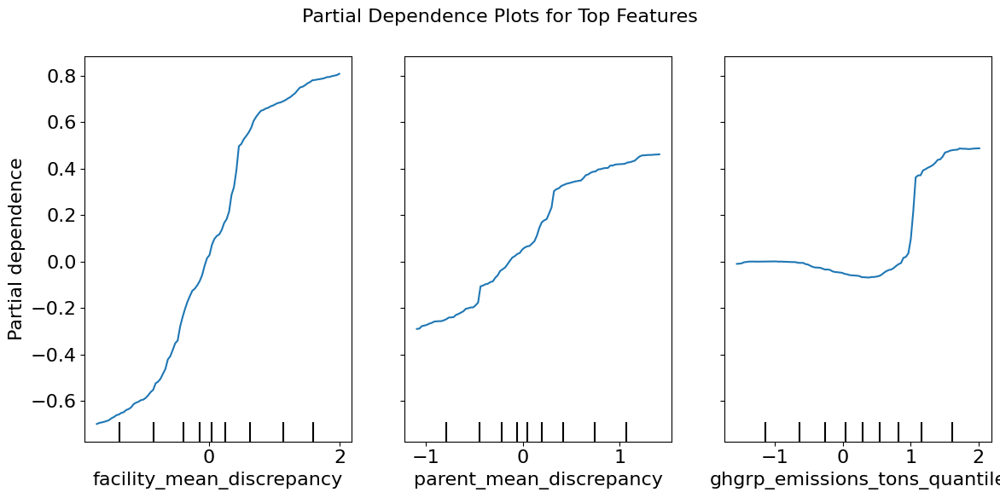

In [ ]:
# Ensure 'X_train' has columns for feature names
if not hasattr(X_train, 'columns'):
    raise ValueError("'X_train' must have column names for feature importance mapping.")

# Select top predictors based on Random Forest feature importances
feature_importances = pd.Series(best_rf.feature_importances_, index=X_train.columns)
top_features = feature_importances.sort_values(ascending=False)
top_features_list = top_features.head(3).index.tolist()

print("Top predictors for Partial Dependence Plots:", top_features_list)

# Partial Dependence Plots
try:
    fig, ax = plt.subplots(figsize=(12, 6))
    PartialDependenceDisplay.from_estimator(
        best_rf, X_test, features=top_features_list, ax=ax
    )
    plt.suptitle("Partial Dependence Plots for Top Features", fontsize=16)
    plt.tight_layout()
    plt.show()
except Exception as e:
    print("Error generating Partial Dependence Plots:", str(e))

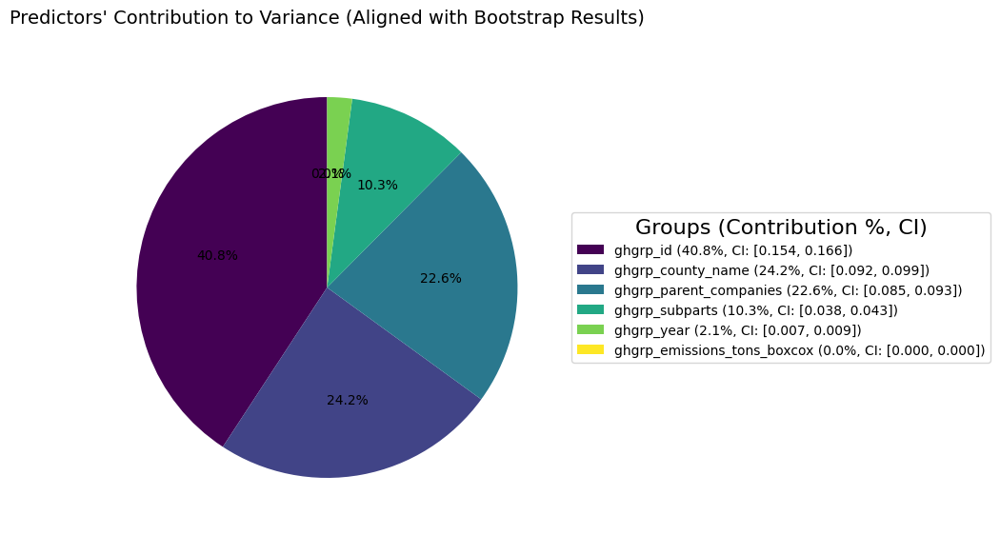

Normalized Group Contributions (as percentages):
                             Mean Importance  Percentage
ghgrp_id                            0.160405   40.780316
ghgrp_county_name                   0.095290   24.225901
ghgrp_parent_companies              0.088727   22.557256
ghgrp_subparts                      0.040617   10.326121
ghgrp_year                          0.008301    2.110407
ghgrp_emissions_tons_boxcox         0.000000    0.000000


In [ ]:
# Normalize importance values for consistency
group_contributions_df = group_importances_summary.copy()
total_importance = group_contributions_df["Mean Importance"].sum()
group_contributions_df["Percentage"] = (
    group_contributions_df["Mean Importance"] / total_importance * 100
)

# Generate colors for the pie chart
colors = plt.cm.viridis(np.linspace(0, 1, len(group_contributions_df)))

# Plot the pie chart
fig, ax = plt.subplots(figsize=(8, 8))

wedges, texts, autotexts = ax.pie(
    group_contributions_df["Percentage"],
    autopct="%1.1f%%",
    startangle=90,
    colors=colors,
    textprops={"fontsize": 10},
)

# Build labels with percentages and confidence intervals
labels = [
    f"{index} ({row['Percentage']:.1f}%, CI: [{row['Lower CI (2.5%)']:.3f}, {row['Upper CI (97.5%)']:.3f}])"
    for index, row in group_contributions_df.iterrows()
]

# Add legend on the right
ax.legend(
    wedges,
    labels,
    title="Groups (Contribution %, CI)",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10,
    frameon=True,
)

ax.set_aspect("equal")
plt.subplots_adjust(right=0.75)
plt.title("Predictors' Contribution to Variance (Aligned with Bootstrap Results)", fontsize=14, pad=20)
plt.show()

# Display normalized group contributions
print("Normalized Group Contributions (as percentages):")
print(group_contributions_df[["Mean Importance", "Percentage"]])

# Sensitivity analysis 75m

In [ ]:
# how many rows are in matched_dfs["50m"]

print(len(matched_dfs["75m"]))

33770


In [ ]:
# 1) Data Preprocessing
print("Preprocessing data...")
df = matched_dfs["75m"].copy()

# Apply Quantile Transformation
qt = QuantileTransformer(output_distribution="normal", random_state=42)
df['ghgrp_emissions_tons_quantile'] = qt.fit_transform(df[['ghgrp_emissions_tons']])
df['emissions_discrepancy_quantile'] = qt.fit_transform(df[['emissions_discrepancy']])

# Ensure variables are correct type
df['ghgrp_year'] = df['ghgrp_year'].astype(int)

def process_parent_companies(value):
    if pd.isna(value):
        return ["Other"]
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
    return [company.strip() for company in cleaned_value.split(';')]

def process_subparts(value):
    if pd.isna(value):
        return []
    return [subpart.strip() for subpart in str(value).split(',')]

df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].apply(process_parent_companies)
df['ghgrp_subparts'] = df['ghgrp_subparts'].apply(process_subparts)

# Explode both parent companies and subparts
df = df.explode('ghgrp_parent_companies')
df = df.explode('ghgrp_subparts')

# Convert to categorical
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].astype('category')
df['ghgrp_county_name'] = df['ghgrp_county_name'].astype('category')
df['ghgrp_subparts'] = df['ghgrp_subparts'].astype('category')
df['ghgrp_id'] = df['ghgrp_id'].astype('category')

# Aggregate statistics for group-level effects
df['parent_mean_discrepancy'] = df.groupby('ghgrp_parent_companies', observed=True)['emissions_discrepancy_quantile'].transform('mean')
df['facility_mean_discrepancy'] = df.groupby('ghgrp_id', observed=True)['emissions_discrepancy_quantile'].transform('mean')

# Add temporal features
df['year_normalized'] = df['ghgrp_year'] - df['ghgrp_year'].min()

# Create dummy variables for modeling
X = pd.get_dummies(
    df[['ghgrp_year', 'year_normalized', 'ghgrp_emissions_tons_quantile', 'ghgrp_county_name',
        'ghgrp_parent_companies', 'ghgrp_subparts', 'ghgrp_id',
        'parent_mean_discrepancy', 'facility_mean_discrepancy']],
    drop_first=True
)
y = df['emissions_discrepancy_quantile']

# 2) Train-Test Split
print("Splitting data...")
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Ensure column alignment
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# 3) Hyperparameter Tuning with RandomizedSearchCV
model_file_path = "/content/drive/MyDrive/Master_Thesis/75m_random_forest_model.pkl"

if os.path.exists(model_file_path):
    print("Loading the saved Random Forest model...")
    with open(model_file_path, "rb") as file:
        best_rf = pickle.load(file)
else:
    print("Model file does not exist. Training the Random Forest model...")

    param_grid = {
        'n_estimators': [500],
        'max_depth': [50, None],
        'min_samples_leaf': [2, 3],
        'min_samples_split': [2, 5],
        'max_features': ['sqrt'],
        'bootstrap': [True],
        'max_samples': [0.8, 0.9]
    }

    rf_model = RandomForestRegressor(random_state=42, n_jobs=-1)
    random_search = RandomizedSearchCV(
        rf_model, param_distributions=param_grid, n_iter=30, cv=5,
        scoring='neg_mean_squared_error', n_jobs=-1, random_state=42, verbose=1
    )

    random_search.fit(X_train, y_train)
    best_rf = random_search.best_estimator_

    print("\nBest parameters found:")
    print(random_search.best_params_)

    # Save the model
    with open(model_file_path, "wb") as file:
        pickle.dump(best_rf, file)

print("Model training complete!")

Preprocessing data...
Splitting data...
Loading the saved Random Forest model...
Model training complete!


In [ ]:
# Evaluate the Best Model

y_pred_train = best_rf.predict(X_train)
y_pred_test = best_rf.predict(X_test)

# Compute RMSE and R² for train and test sets
rmse_train_50m = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test_50m = np.sqrt(mean_squared_error(y_test, y_pred_test))
r2_train_50m = r2_score(y_train, y_pred_train)
r2_test_50m = r2_score(y_test, y_pred_test)
mae_test_50m = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Train RMSE: {rmse_train_50m:.4f}, R²: {r2_train_50m:.4f}")
print(f"Test  RMSE: {rmse_test_50m:.4f}, R²: {r2_test_50m:.4f}")
print(f"Test  MAE : {mae_test_50m:.4f}")


Model Performance:
Train RMSE: 0.3948, R²: 0.8779
Test  RMSE: 0.4369, R²: 0.8498
Test  MAE : 0.2925


In [ ]:
# Path to save/load cross-validation results
cv_results_path = "/content/drive/MyDrive/Master_Thesis/75m_cross_val_results.pkl"

if os.path.exists(cv_results_path):
    print("Cross-validation results found. Loading from file...")
    with open(cv_results_path, "rb") as file:
        cv_scores = pickle.load(file)
    print("Cross-validation results successfully loaded.")
else:
    print("Cross-validation results not found. Running cross-validation...")

    # Perform cross-validation
    cv_scores = cross_val_score(best_rf, X, y, cv=5, scoring='r2', n_jobs=-1)

    # Save results to file
    with open(cv_results_path, "wb") as file:
        pickle.dump(cv_scores, file)
    print(f"Cross-validation results saved to: {cv_results_path}")

# Display Cross-Validation Results
print("\nCross-Validation R² Scores:", cv_scores)
print(f"Mean R²: {np.mean(cv_scores):.4f}")
print(f"Std Dev of R²: {np.std(cv_scores):.4f}")

Cross-validation results found. Loading from file...
Cross-validation results successfully loaded.

Cross-Validation R² Scores: [0.85880369 0.87821957 0.82664701 0.82389093 0.75852244]
Mean R²: 0.8292
Std Dev of R²: 0.0408


Bootstrap results found. Loading from file...
Bootstrap results successfully loaded.

Group-Level Importance Summary:
                             Mean Importance  Lower CI (2.5%)  \
ghgrp_id                            0.148041         0.143033   
ghgrp_parent_companies              0.094696         0.091998   
ghgrp_county_name                   0.078921         0.076685   
ghgrp_subparts                      0.058210         0.055214   
ghgrp_year                          0.012425         0.011537   
ghgrp_emissions_tons_boxcox         0.000000         0.000000   

                             Upper CI (97.5%)  
ghgrp_id                             0.153041  
ghgrp_parent_companies               0.097568  
ghgrp_county_name                    0.081599  
ghgrp_subparts                       0.060643  
ghgrp_year                           0.013498  
ghgrp_emissions_tons_boxcox          0.000000  


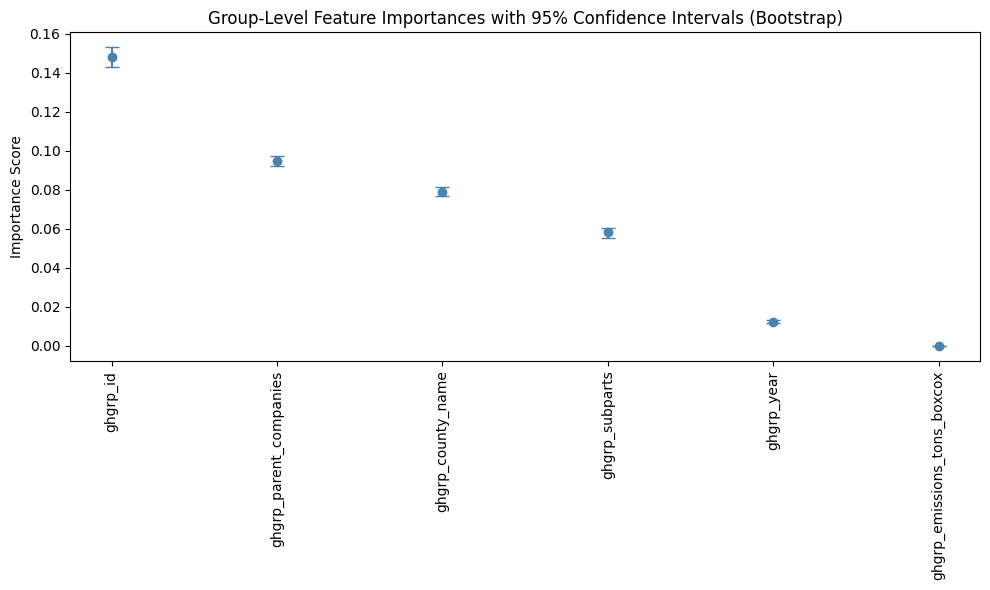

In [ ]:
# Path to save/load bootstrap results
bootstrap_results_path = "/content/drive/MyDrive/Master_Thesis/75m_group_importances_bootstrap.pkl"

# Ensure X_train is a DataFrame and aligned with X
if not isinstance(X_train, pd.DataFrame):
    # Convert X_train to a DataFrame using the columns of X
    X_train = pd.DataFrame(X_train, columns=X.columns)

# Apply Quantile Transformation only to numeric columns
qt = QuantileTransformer(output_distribution="normal", random_state=42)
numeric_columns = X_train.select_dtypes(include=np.number).columns
X_train_transformed = X_train.copy()  # Copy original structure

X_train_transformed[numeric_columns] = qt.fit_transform(X_train[numeric_columns])  # Transform numeric columns

# Ensure the predictor groups are correctly defined
predictor_groups = {
    "ghgrp_year": [col for col in X_train.columns if col.startswith("ghgrp_year")],
    "ghgrp_emissions_tons_boxcox": [col for col in X_train.columns if "ghgrp_emissions_tons_boxcox" in col],
    "ghgrp_county_name": [col for col in X_train.columns if col.startswith("ghgrp_county_name")],
    "ghgrp_parent_companies": [col for col in X_train.columns if col.startswith("ghgrp_parent_companies")],
    "ghgrp_subparts": [col for col in X_train.columns if col.startswith("ghgrp_subparts")],
    "ghgrp_id": [col for col in X_train.columns if col.startswith("ghgrp_id")],
}

# Check if bootstrap results already exist
if os.path.exists(bootstrap_results_path):
    print("Bootstrap results found. Loading from file...")
    with open(bootstrap_results_path, "rb") as file:
        group_importances_bootstrap, group_importances_summary = pickle.load(file)
    print("Bootstrap results successfully loaded.")
else:
    print("Bootstrap results not found. Running bootstrap analysis...")

    n_bootstraps = 100
    group_importances_bootstrap = pd.DataFrame(index=predictor_groups.keys())

    # Add progress bar
    for i in tqdm(range(n_bootstraps), desc="Bootstrapping Group Importances"):
        # Resample data for bootstrapping
        X_resampled, y_resampled = resample(X_train_transformed, y_train, random_state=i)

        # Train a Random Forest model on resampled data
        rf_bootstrap = RandomForestRegressor(
            n_estimators=best_rf.n_estimators,
            max_features=best_rf.max_features,
            max_depth=best_rf.max_depth,
            min_samples_split=best_rf.min_samples_split,
            min_samples_leaf=best_rf.min_samples_leaf,
            bootstrap=best_rf.bootstrap,
            random_state=i,
            n_jobs=-1,
        )
        rf_bootstrap.fit(X_resampled, y_resampled)

        # Calculate feature importances
        feature_importances = pd.Series(rf_bootstrap.feature_importances_, index=X_train_transformed.columns)

        # Aggregate feature importances by groups
        group_importances = {}
        for group, cols in predictor_groups.items():
            valid_cols = [col for col in cols if col in feature_importances.index]
            group_importances[group] = feature_importances[valid_cols].sum()

        group_importances_bootstrap[i] = pd.Series(group_importances)

    # Calculate mean importance and 95% confidence intervals
    group_importances_summary = pd.DataFrame({
        "Mean Importance": group_importances_bootstrap.mean(axis=1),
        "Lower CI (2.5%)": group_importances_bootstrap.quantile(0.025, axis=1),
        "Upper CI (97.5%)": group_importances_bootstrap.quantile(0.975, axis=1),
    }).sort_values(by="Mean Importance", ascending=False)

    # Save results to file
    with open(bootstrap_results_path, "wb") as file:
        pickle.dump((group_importances_bootstrap, group_importances_summary), file)
    print(f"Bootstrap results saved to: {bootstrap_results_path}")

# Display Group-Level Summary
print("\nGroup-Level Importance Summary:")
print(group_importances_summary)

# Plot Group Importances with Confidence Intervals
plt.figure(figsize=(10, 6))
plt.errorbar(
    group_importances_summary.index,
    group_importances_summary["Mean Importance"],
    yerr=[
        group_importances_summary["Mean Importance"] - group_importances_summary["Lower CI (2.5%)"],
        group_importances_summary["Upper CI (97.5%)"] - group_importances_summary["Mean Importance"],
    ],
    fmt="o",
    capsize=5,
    color="steelblue",
)
plt.xticks(rotation=90)
plt.title("Group-Level Feature Importances with 95% Confidence Intervals (Bootstrap)")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

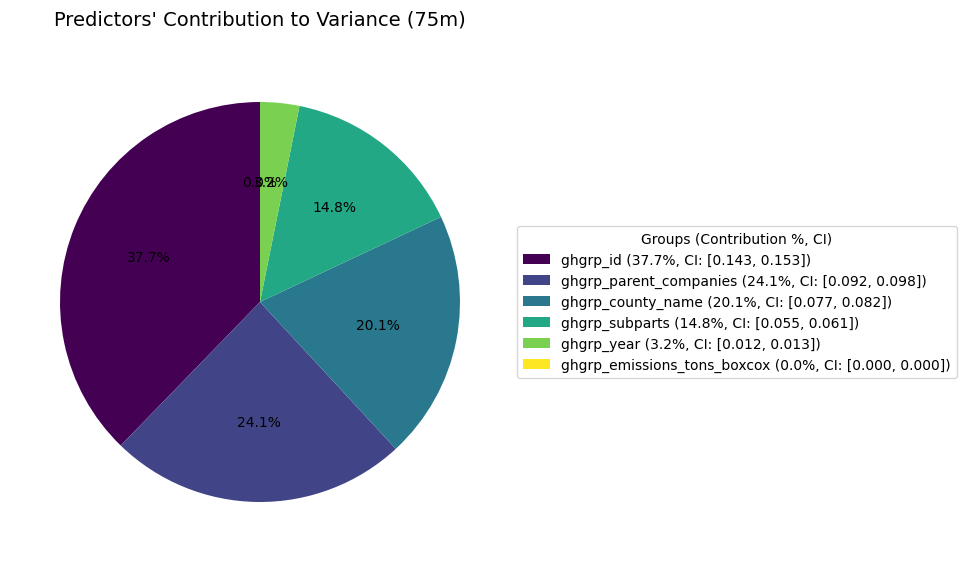

Normalized Group Contributions (as percentages):
                             Mean Importance  Percentage
ghgrp_id                            0.148041   37.737442
ghgrp_parent_companies              0.094696   24.139009
ghgrp_county_name                   0.078921   20.117823
ghgrp_subparts                      0.058210   14.838439
ghgrp_year                          0.012425    3.167286
ghgrp_emissions_tons_boxcox         0.000000    0.000000


In [ ]:
# Normalize importance values for consistency
group_contributions_df = group_importances_summary.copy()
total_importance = group_contributions_df["Mean Importance"].sum()
group_contributions_df["Percentage"] = (
    group_contributions_df["Mean Importance"] / total_importance * 100
)

# Generate colors for the pie chart
colors = plt.cm.viridis(np.linspace(0, 1, len(group_contributions_df)))

# Plot the pie chart
fig, ax = plt.subplots(figsize=(8, 8))

wedges, texts, autotexts = ax.pie(
    group_contributions_df["Percentage"],
    autopct="%1.1f%%",
    startangle=90,
    colors=colors,
    textprops={"fontsize": 10},
)

# Build labels with percentages and confidence intervals
labels = [
    f"{index} ({row['Percentage']:.1f}%, CI: [{row['Lower CI (2.5%)']:.3f}, {row['Upper CI (97.5%)']:.3f}])"
    for index, row in group_contributions_df.iterrows()
]

# Add legend on the right
ax.legend(
    wedges,
    labels,
    title="Groups (Contribution %, CI)",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10,
    frameon=True,
)

ax.set_aspect("equal")
plt.subplots_adjust(right=0.75)
plt.title("Predictors' Contribution to Variance (75m)", fontsize=14, pad=20)
plt.show()

# Display normalized group contributions
print("Normalized Group Contributions (as percentages):")
print(group_contributions_df[["Mean Importance", "Percentage"]])

# Sensitivity analysis excluding small discrepancies 1 Std Dev

In [ ]:
# 1) Data Preprocessing
print("Preprocessing data...")
df = matched_dfs["5m"].copy()

# Exclude rows with minimal discrepancies based on SD Around the Mean
# Calculate the mean and standard deviation of emissions_discrepancy
discrepancy_mean = df['emissions_discrepancy'].mean()
discrepancy_std = df['emissions_discrepancy'].std()

# Set the multiple of standard deviation for exclusion
sd_multiplier = 1  # Adjust this to 0.5, 1, or 2 based on your sensitivity analysis

# Define the lower and upper bounds for exclusion
lower_bound = discrepancy_mean - sd_multiplier * discrepancy_std
upper_bound = discrepancy_mean + sd_multiplier * discrepancy_std
len_df_original = len(df)

# Filter the dataset to exclude rows with discrepancies close to zero
df = df[(df['emissions_discrepancy'] < lower_bound) | (df['emissions_discrepancy'] > upper_bound)]

# Print the number of rows excluded
print(f"Rows excluded: {len_df_original - len(df)}")
print(f"Remaining rows: {len(df)}")

# Apply Quantile Transformation
qt = QuantileTransformer(output_distribution="normal", random_state=42)
df['ghgrp_emissions_tons_quantile'] = qt.fit_transform(df[['ghgrp_emissions_tons']])
df['emissions_discrepancy_quantile'] = qt.fit_transform(df[['emissions_discrepancy']])

# Ensure variables are correct type
df['ghgrp_year'] = df['ghgrp_year'].astype(int)

def process_parent_companies(value):
    if pd.isna(value):
        return ["Other"]
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
    return [company.strip() for company in cleaned_value.split(';')]

def process_subparts(value):
    if pd.isna(value):
        return []
    return [subpart.strip() for subpart in str(value).split(',')]

df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].apply(process_parent_companies)
df['ghgrp_subparts'] = df['ghgrp_subparts'].apply(process_subparts)

# Explode both parent companies and subparts
df = df.explode('ghgrp_parent_companies')
df = df.explode('ghgrp_subparts')

# Convert to categorical
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].astype('category')
df['ghgrp_county_name'] = df['ghgrp_county_name'].astype('category')
df['ghgrp_subparts'] = df['ghgrp_subparts'].astype('category')
df['ghgrp_id'] = df['ghgrp_id'].astype('category')

# Aggregate statistics for group-level effects
df['parent_mean_discrepancy'] = df.groupby('ghgrp_parent_companies', observed=True)['emissions_discrepancy_quantile'].transform('mean')
df['facility_mean_discrepancy'] = df.groupby('ghgrp_id', observed=True)['emissions_discrepancy_quantile'].transform('mean')

# Add temporal features
df['year_normalized'] = df['ghgrp_year'] - df['ghgrp_year'].min()

# Create dummy variables for modeling
X = pd.get_dummies(
    df[['ghgrp_year', 'year_normalized', 'ghgrp_emissions_tons_quantile', 'ghgrp_county_name',
        'ghgrp_parent_companies', 'ghgrp_subparts', 'ghgrp_id',
        'parent_mean_discrepancy', 'facility_mean_discrepancy']],
    drop_first=True
)
y = df['emissions_discrepancy_quantile']

# 2) Train-Test Split
print("Splitting data...")
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Ensure column alignment
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# 3) Hyperparameter Tuning with RandomizedSearchCV
model_file_path = "/content/drive/MyDrive/Master_Thesis/random_forest_model_big_discrepancies_only.pkl"

if os.path.exists(model_file_path):
    print("Loading the saved Random Forest model...")
    with open(model_file_path, "rb") as file:
        best_rf = pickle.load(file)
else:
    print("Model file does not exist. Training the Random Forest model...")

    param_grid = {
        'n_estimators': [500],
        'max_depth': [50, None],
        'min_samples_leaf': [2, 3],
        'min_samples_split': [2, 5],
        'max_features': ['sqrt'],
        'bootstrap': [True],
        'max_samples': [0.8, 0.9]
    }

    rf_model = RandomForestRegressor(random_state=42, n_jobs=-1)
    random_search = RandomizedSearchCV(
        rf_model, param_distributions=param_grid, n_iter=30, cv=5,
        scoring='neg_mean_squared_error', n_jobs=-1, random_state=42, verbose=1
    )

    random_search.fit(X_train, y_train)
    best_rf = random_search.best_estimator_

    print("\nBest parameters found:")
    print(random_search.best_params_)

    # Save the model
    with open(model_file_path, "wb") as file:
        pickle.dump(best_rf, file)

print("Model training complete!")

Preprocessing data...
Rows excluded: 15788
Remaining rows: 1979
Splitting data...
Loading the saved Random Forest model...


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeRegressor from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Model training complete!


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator RandomForestRegressor from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


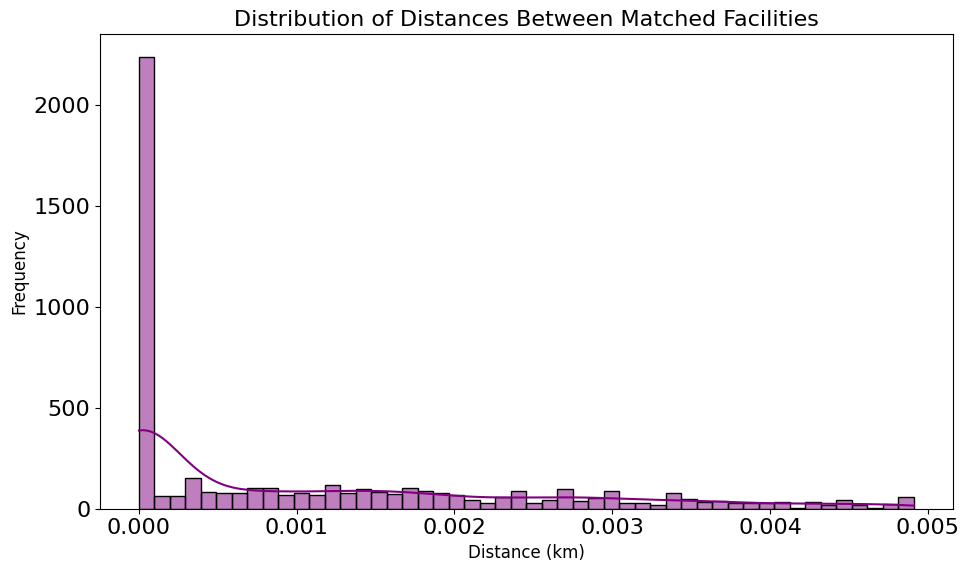

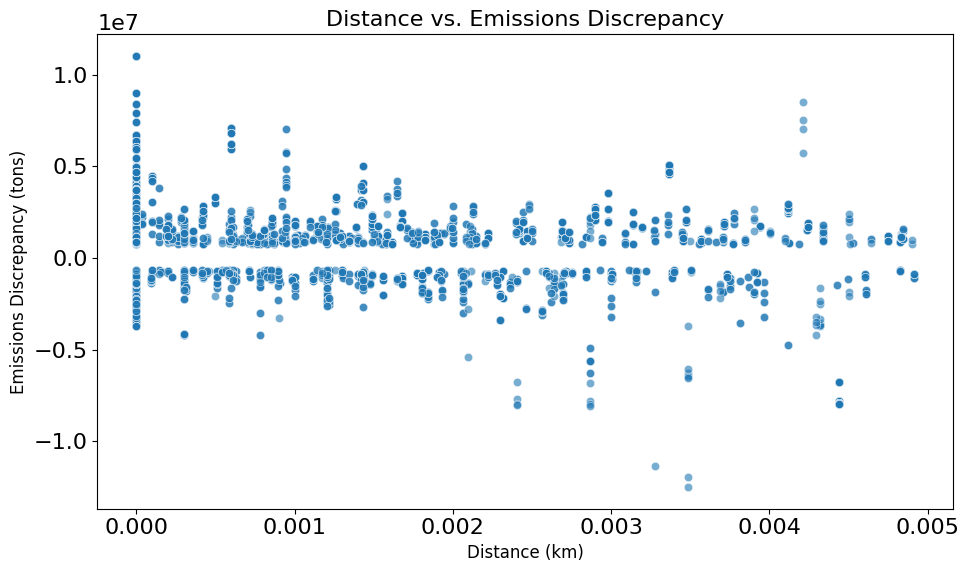

In [ ]:
# Histogram for distances
plt.figure(figsize=(10, 6))
sns.histplot(
    df['distance'],
    bins=50,
    kde=True,
    color="purple"
)
plt.title("Distribution of Distances Between Matched Facilities", fontsize=16)
plt.xlabel("Distance (km)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.tight_layout()
plt.show()

# Scatter plot for distance vs. emissions discrepancy
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='distance',
    y='emissions_discrepancy',
    data=df,
    alpha=0.6
)
plt.title("Distance vs. Emissions Discrepancy", fontsize=16)
plt.xlabel("Distance (km)", fontsize=12)
plt.ylabel("Emissions Discrepancy (tons)", fontsize=12)
plt.tight_layout()
plt.show()

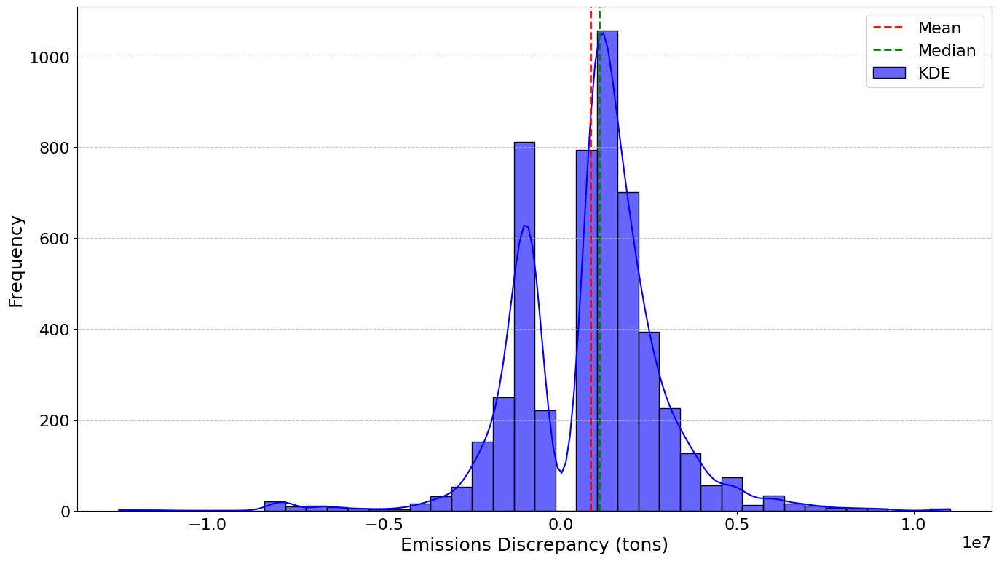

In [ ]:
# 1. Distribution Plot (Histogram and KDE)
plt.figure(figsize=(14, 8))
sns.histplot(df['emissions_discrepancy'], bins=40, kde=True, color="blue", label="KDE", alpha=0.6, edgecolor='black')
plt.axvline(df['emissions_discrepancy'].mean(), color='red', linestyle='dashed', linewidth=2, label="Mean")
plt.axvline(df['emissions_discrepancy'].median(), color='green', linestyle='dashed', linewidth=2, label="Median")

# Labels
plt.xlabel("Emissions Discrepancy (tons)", fontsize=18)
plt.ylabel("Frequency", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# Evaluate the Best Model

y_pred_train = best_rf.predict(X_train)
y_pred_test = best_rf.predict(X_test)

# Compute RMSE and R² for train and test sets
rmse_train_50m = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test_50m = np.sqrt(mean_squared_error(y_test, y_pred_test))
r2_train_50m = r2_score(y_train, y_pred_train)
r2_test_50m = r2_score(y_test, y_pred_test)
mae_test_50m = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Train RMSE: {rmse_train_50m:.4f}, R²: {r2_train_50m:.4f}")
print(f"Test  RMSE: {rmse_test_50m:.4f}, R²: {r2_test_50m:.4f}")
print(f"Test  MAE : {mae_test_50m:.4f}")


Model Performance:
Train RMSE: 0.2521, R²: 0.9405
Test  RMSE: 0.3173, R²: 0.9117
Test  MAE : 0.2014


In [ ]:
# Path to save/load cross-validation results
cv_results_path = "/content/drive/MyDrive/Master_Thesis/large_discrepancies_cross_val_results.pkl"

if os.path.exists(cv_results_path):
    print("Cross-validation results found. Loading from file...")
    with open(cv_results_path, "rb") as file:
        cv_scores = pickle.load(file)
    print("Cross-validation results successfully loaded.")
else:
    print("Cross-validation results not found. Running cross-validation...")

    # Perform cross-validation
    cv_scores = cross_val_score(best_rf, X, y, cv=5, scoring='r2', n_jobs=-1)

    # Save results to file
    with open(cv_results_path, "wb") as file:
        pickle.dump(cv_scores, file)
    print(f"Cross-validation results saved to: {cv_results_path}")

# Display Cross-Validation Results
print("\nCross-Validation R² Scores:", cv_scores)
print(f"Mean R²: {np.mean(cv_scores):.4f}")
print(f"Std Dev of R²: {np.std(cv_scores):.4f}")

Cross-validation results found. Loading from file...
Cross-validation results successfully loaded.

Cross-Validation R² Scores: [0.8548175  0.88472915 0.91771114 0.91098711 0.81491043]
Mean R²: 0.8766
Std Dev of R²: 0.0380


Bootstrap results found. Loading from file...
Bootstrap results successfully loaded.

Group-Level Importance Summary:
                             Mean Importance  Lower CI (2.5%)  \
ghgrp_id                            0.163467         0.155096   
ghgrp_county_name                   0.128272         0.121163   
ghgrp_parent_companies              0.092262         0.084425   
ghgrp_subparts                      0.018339         0.014948   
ghgrp_year                          0.010789         0.008023   
ghgrp_emissions_tons_boxcox         0.000000         0.000000   

                             Upper CI (97.5%)  
ghgrp_id                             0.171470  
ghgrp_county_name                    0.135907  
ghgrp_parent_companies               0.100715  
ghgrp_subparts                       0.021875  
ghgrp_year                           0.013918  
ghgrp_emissions_tons_boxcox          0.000000  


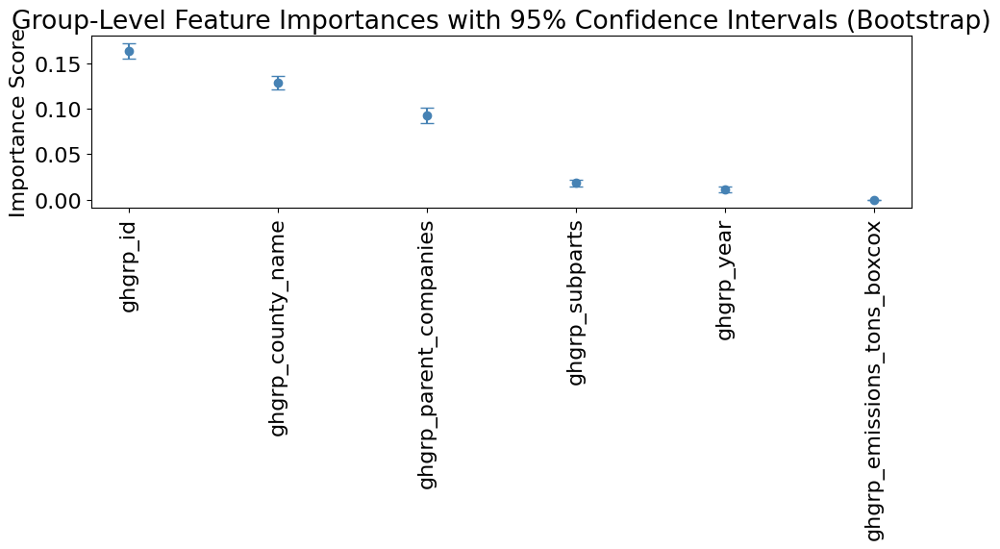

In [ ]:
# Path to save/load bootstrap results
bootstrap_results_path = "/content/drive/MyDrive/Master_Thesis/large_discrepancies_group_importances_bootstrap.pkl"

# Ensure X_train is a DataFrame and aligned with X
if not isinstance(X_train, pd.DataFrame):
    # Convert X_train to a DataFrame using the columns of X
    X_train = pd.DataFrame(X_train, columns=X.columns)

# Apply Quantile Transformation only to numeric columns
qt = QuantileTransformer(output_distribution="normal", random_state=42)
numeric_columns = X_train.select_dtypes(include=np.number).columns
X_train_transformed = X_train.copy()  # Copy original structure

X_train_transformed[numeric_columns] = qt.fit_transform(X_train[numeric_columns])  # Transform numeric columns

# Ensure the predictor groups are correctly defined
predictor_groups = {
    "ghgrp_year": [col for col in X_train.columns if col.startswith("ghgrp_year")],
    "ghgrp_emissions_tons_boxcox": [col for col in X_train.columns if "ghgrp_emissions_tons_boxcox" in col],
    "ghgrp_county_name": [col for col in X_train.columns if col.startswith("ghgrp_county_name")],
    "ghgrp_parent_companies": [col for col in X_train.columns if col.startswith("ghgrp_parent_companies")],
    "ghgrp_subparts": [col for col in X_train.columns if col.startswith("ghgrp_subparts")],
    "ghgrp_id": [col for col in X_train.columns if col.startswith("ghgrp_id")],
}

# Check if bootstrap results already exist
if os.path.exists(bootstrap_results_path):
    print("Bootstrap results found. Loading from file...")
    with open(bootstrap_results_path, "rb") as file:
        group_importances_bootstrap, group_importances_summary = pickle.load(file)
    print("Bootstrap results successfully loaded.")
else:
    print("Bootstrap results not found. Running bootstrap analysis...")

    n_bootstraps = 100
    group_importances_bootstrap = pd.DataFrame(index=predictor_groups.keys())

    # Add progress bar
    for i in tqdm(range(n_bootstraps), desc="Bootstrapping Group Importances"):
        # Resample data for bootstrapping
        X_resampled, y_resampled = resample(X_train_transformed, y_train, random_state=i)

        # Train a Random Forest model on resampled data
        rf_bootstrap = RandomForestRegressor(
            n_estimators=best_rf.n_estimators,
            max_features=best_rf.max_features,
            max_depth=best_rf.max_depth,
            min_samples_split=best_rf.min_samples_split,
            min_samples_leaf=best_rf.min_samples_leaf,
            bootstrap=best_rf.bootstrap,
            random_state=i,
            n_jobs=-1,
        )
        rf_bootstrap.fit(X_resampled, y_resampled)

        # Calculate feature importances
        feature_importances = pd.Series(rf_bootstrap.feature_importances_, index=X_train_transformed.columns)

        # Aggregate feature importances by groups
        group_importances = {}
        for group, cols in predictor_groups.items():
            valid_cols = [col for col in cols if col in feature_importances.index]
            group_importances[group] = feature_importances[valid_cols].sum()

        group_importances_bootstrap[i] = pd.Series(group_importances)

    # Calculate mean importance and 95% confidence intervals
    group_importances_summary = pd.DataFrame({
        "Mean Importance": group_importances_bootstrap.mean(axis=1),
        "Lower CI (2.5%)": group_importances_bootstrap.quantile(0.025, axis=1),
        "Upper CI (97.5%)": group_importances_bootstrap.quantile(0.975, axis=1),
    }).sort_values(by="Mean Importance", ascending=False)

    # Save results to file
    with open(bootstrap_results_path, "wb") as file:
        pickle.dump((group_importances_bootstrap, group_importances_summary), file)
    print(f"Bootstrap results saved to: {bootstrap_results_path}")

# Display Group-Level Summary
print("\nGroup-Level Importance Summary:")
print(group_importances_summary)

# Plot Group Importances with Confidence Intervals
plt.figure(figsize=(10, 6))
plt.errorbar(
    group_importances_summary.index,
    group_importances_summary["Mean Importance"],
    yerr=[
        group_importances_summary["Mean Importance"] - group_importances_summary["Lower CI (2.5%)"],
        group_importances_summary["Upper CI (97.5%)"] - group_importances_summary["Mean Importance"],
    ],
    fmt="o",
    capsize=5,
    color="steelblue",
)
plt.xticks(rotation=90)
plt.title("Group-Level Feature Importances with 95% Confidence Intervals (Bootstrap)")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

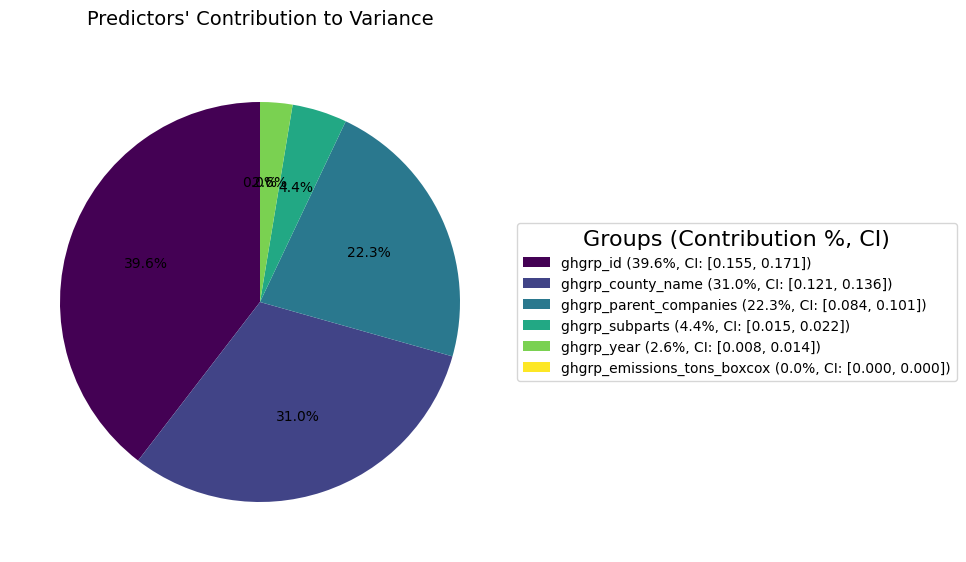

Normalized Group Contributions (as percentages):
                             Mean Importance  Percentage
ghgrp_id                            0.163467   39.568000
ghgrp_county_name                   0.128272   31.048853
ghgrp_parent_companies              0.092262   22.332520
ghgrp_subparts                      0.018339    4.439117
ghgrp_year                          0.010789    2.611510
ghgrp_emissions_tons_boxcox         0.000000    0.000000


In [ ]:
# Normalize importance values for consistency
group_contributions_df = group_importances_summary.copy()
total_importance = group_contributions_df["Mean Importance"].sum()
group_contributions_df["Percentage"] = (
    group_contributions_df["Mean Importance"] / total_importance * 100
)

# Generate colors for the pie chart
colors = plt.cm.viridis(np.linspace(0, 1, len(group_contributions_df)))

# Plot the pie chart
fig, ax = plt.subplots(figsize=(8, 8))

wedges, texts, autotexts = ax.pie(
    group_contributions_df["Percentage"],
    autopct="%1.1f%%",
    startangle=90,
    colors=colors,
    textprops={"fontsize": 10},
)

# Build labels with percentages and confidence intervals
labels = [
    f"{index} ({row['Percentage']:.1f}%, CI: [{row['Lower CI (2.5%)']:.3f}, {row['Upper CI (97.5%)']:.3f}])"
    for index, row in group_contributions_df.iterrows()
]

# Add legend on the right
ax.legend(
    wedges,
    labels,
    title="Groups (Contribution %, CI)",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10,
    frameon=True,
)

ax.set_aspect("equal")
plt.subplots_adjust(right=0.75)
plt.title("Predictors' Contribution to Variance", fontsize=14, pad=20)
plt.show()

# Display normalized group contributions
print("Normalized Group Contributions (as percentages):")
print(group_contributions_df[["Mean Importance", "Percentage"]])

# Sensitivity analysis excluding small discrepancies 2 Std Dev

In [ ]:
# 1) Data Preprocessing
print("Preprocessing data...")
df = matched_dfs["5m"].copy()

# Exclude rows with minimal discrepancies based on SD Around the Mean
# Calculate the mean and standard deviation of emissions_discrepancy
discrepancy_mean = df['emissions_discrepancy'].mean()
discrepancy_std = df['emissions_discrepancy'].std()

# Set the multiple of standard deviation for exclusion
sd_multiplier = 2  # Adjust this to 0.5, 1, or 2 based on your sensitivity analysis

# Define the lower and upper bounds for exclusion
lower_bound = discrepancy_mean - sd_multiplier * discrepancy_std
upper_bound = discrepancy_mean + sd_multiplier * discrepancy_std
len_df_original = len(df)

# Filter the dataset to exclude rows with discrepancies close to zero
df = df[(df['emissions_discrepancy'] < lower_bound) | (df['emissions_discrepancy'] > upper_bound)]

# Print the number of rows excluded
print(f"Rows excluded: {len_df_original - len(df)}")
print(f"Remaining rows: {len(df)}")

# Apply Quantile Transformation
qt = QuantileTransformer(output_distribution="normal", random_state=42)
df['ghgrp_emissions_tons_quantile'] = qt.fit_transform(df[['ghgrp_emissions_tons']])
df['emissions_discrepancy_quantile'] = qt.fit_transform(df[['emissions_discrepancy']])

# Ensure variables are correct type
df['ghgrp_year'] = df['ghgrp_year'].astype(int)

def process_parent_companies(value):
    if pd.isna(value):
        return ["Other"]
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
    return [company.strip() for company in cleaned_value.split(';')]

def process_subparts(value):
    if pd.isna(value):
        return []
    return [subpart.strip() for subpart in str(value).split(',')]

df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].apply(process_parent_companies)
df['ghgrp_subparts'] = df['ghgrp_subparts'].apply(process_subparts)

# Explode both parent companies and subparts
df = df.explode('ghgrp_parent_companies')
df = df.explode('ghgrp_subparts')

# Convert to categorical
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].astype('category')
df['ghgrp_county_name'] = df['ghgrp_county_name'].astype('category')
df['ghgrp_subparts'] = df['ghgrp_subparts'].astype('category')
df['ghgrp_id'] = df['ghgrp_id'].astype('category')

# Aggregate statistics for group-level effects
df['parent_mean_discrepancy'] = df.groupby('ghgrp_parent_companies', observed=True)['emissions_discrepancy_quantile'].transform('mean')
df['facility_mean_discrepancy'] = df.groupby('ghgrp_id', observed=True)['emissions_discrepancy_quantile'].transform('mean')

# Add temporal features
df['year_normalized'] = df['ghgrp_year'] - df['ghgrp_year'].min()

# Create dummy variables for modeling
X = pd.get_dummies(
    df[['ghgrp_year', 'year_normalized', 'ghgrp_emissions_tons_quantile', 'ghgrp_county_name',
        'ghgrp_parent_companies', 'ghgrp_subparts', 'ghgrp_id',
        'parent_mean_discrepancy', 'facility_mean_discrepancy']],
    drop_first=True
)
y = df['emissions_discrepancy_quantile']

# 2) Train-Test Split
print("Splitting data...")
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Ensure column alignment
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# 3) Hyperparameter Tuning with RandomizedSearchCV
model_file_path = "/content/drive/MyDrive/Master_Thesis/random_forest_model_big_discrepancies_only_2.pkl"

if os.path.exists(model_file_path):
    print("Loading the saved Random Forest model...")
    with open(model_file_path, "rb") as file:
        best_rf = pickle.load(file)
else:
    print("Model file does not exist. Training the Random Forest model...")

    param_grid = {
        'n_estimators': [500],
        'max_depth': [50, None],
        'min_samples_leaf': [2, 3],
        'min_samples_split': [2, 5],
        'max_features': ['sqrt'],
        'bootstrap': [True],
        'max_samples': [0.8, 0.9]
    }

    rf_model = RandomForestRegressor(random_state=42, n_jobs=-1)
    random_search = RandomizedSearchCV(
        rf_model, param_distributions=param_grid, n_iter=30, cv=5,
        scoring='neg_mean_squared_error', n_jobs=-1, random_state=42, verbose=1
    )

    random_search.fit(X_train, y_train)
    best_rf = random_search.best_estimator_

    print("\nBest parameters found:")
    print(random_search.best_params_)

    # Save the model
    with open(model_file_path, "wb") as file:
        pickle.dump(best_rf, file)

print("Model training complete!")

Preprocessing data...
Rows excluded: 16966
Remaining rows: 801
Splitting data...
Loading the saved Random Forest model...


/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_data.py:2829: UserWarning: n_quantiles (1000) is greater than the total number of samples (801). n_quantiles is set to n_samples.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_data.py:2829: UserWarning: n_quantiles (1000) is greater than the total number of samples (801). n_quantiles is set to n_samples.
  warnings.warn(


Model training complete!


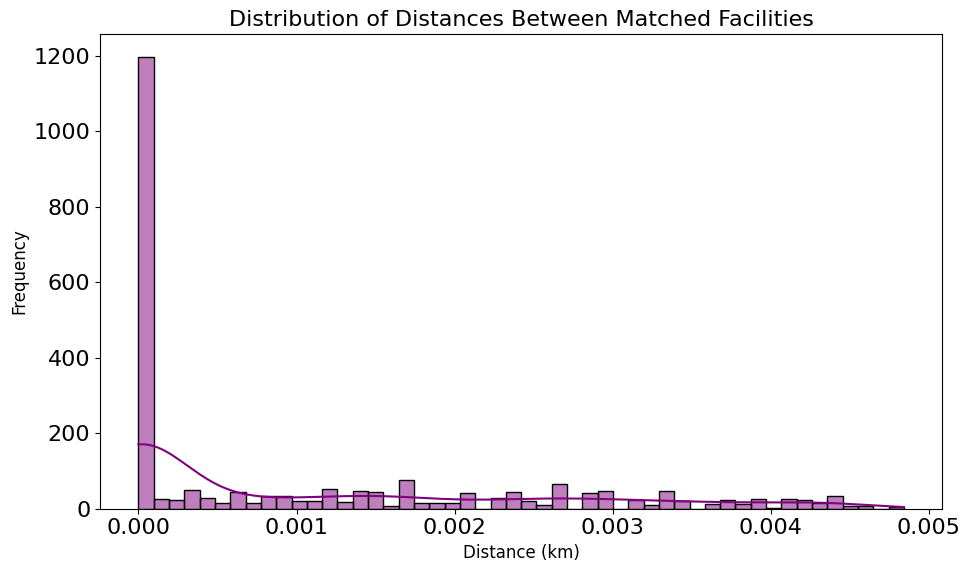

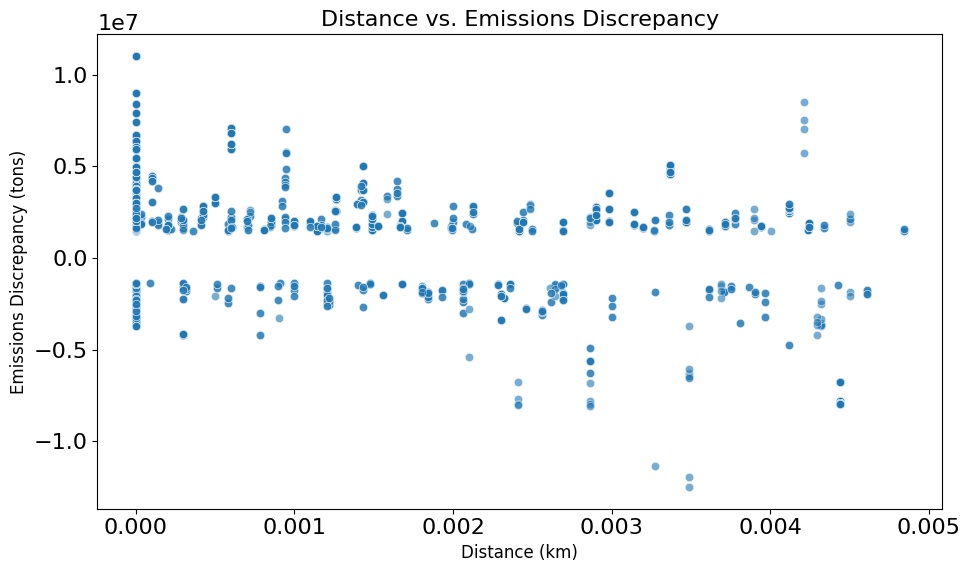

In [ ]:
# Histogram for distances
plt.figure(figsize=(10, 6))
sns.histplot(
    df['distance'],
    bins=50,
    kde=True,
    color="purple"
)
plt.title("Distribution of Distances Between Matched Facilities", fontsize=16)
plt.xlabel("Distance (km)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.tight_layout()
plt.show()

# Scatter plot for distance vs. emissions discrepancy
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='distance',
    y='emissions_discrepancy',
    data=df,
    alpha=0.6
)
plt.title("Distance vs. Emissions Discrepancy", fontsize=16)
plt.xlabel("Distance (km)", fontsize=12)
plt.ylabel("Emissions Discrepancy (tons)", fontsize=12)
plt.tight_layout()
plt.show()

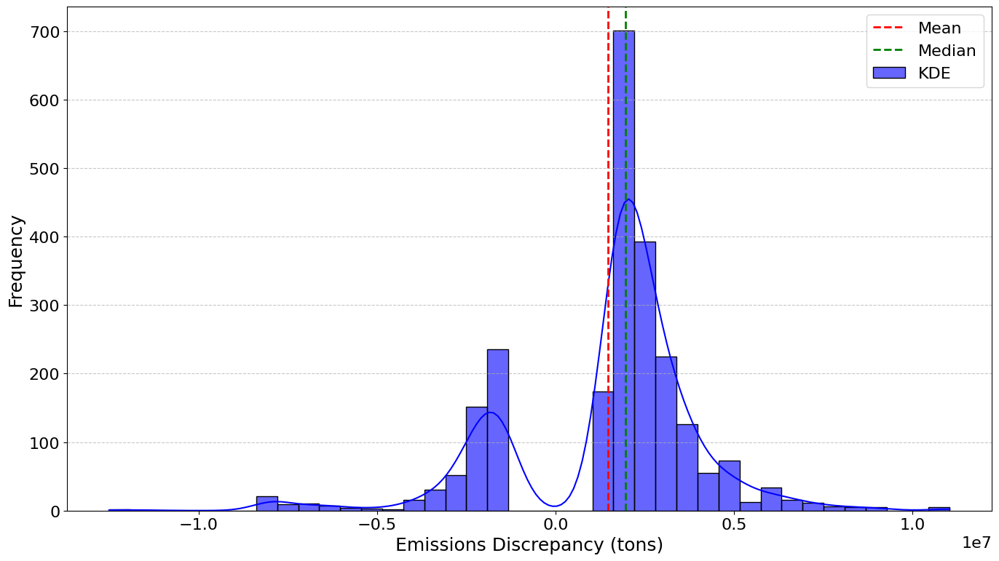

In [ ]:
# 1. Distribution Plot (Histogram and KDE)
plt.figure(figsize=(14, 8))
sns.histplot(df['emissions_discrepancy'], bins=40, kde=True, color="blue", label="KDE", alpha=0.6, edgecolor='black')
plt.axvline(df['emissions_discrepancy'].mean(), color='red', linestyle='dashed', linewidth=2, label="Mean")
plt.axvline(df['emissions_discrepancy'].median(), color='green', linestyle='dashed', linewidth=2, label="Median")

# Labels
plt.xlabel("Emissions Discrepancy (tons)", fontsize=18)
plt.ylabel("Frequency", fontsize=18)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# Evaluate the Best Model

y_pred_train = best_rf.predict(X_train)
y_pred_test = best_rf.predict(X_test)

# Compute RMSE and R² for train and test sets
rmse_train_50m = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test_50m = np.sqrt(mean_squared_error(y_test, y_pred_test))
r2_train_50m = r2_score(y_train, y_pred_train)
r2_test_50m = r2_score(y_test, y_pred_test)
mae_test_50m = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Train RMSE: {rmse_train_50m:.4f}, R²: {r2_train_50m:.4f}")
print(f"Test  RMSE: {rmse_test_50m:.4f}, R²: {r2_test_50m:.4f}")
print(f"Test  MAE : {mae_test_50m:.4f}")


Model Performance:
Train RMSE: 0.2430, R²: 0.9435
Test  RMSE: 0.2822, R²: 0.9117
Test  MAE : 0.1810


In [ ]:
# Path to save/load cross-validation results
cv_results_path = "/content/drive/MyDrive/Master_Thesis/large_discrepancies_cross_val_results_2.pkl"

if os.path.exists(cv_results_path):
    print("Cross-validation results found. Loading from file...")
    with open(cv_results_path, "rb") as file:
        cv_scores = pickle.load(file)
    print("Cross-validation results successfully loaded.")
else:
    print("Cross-validation results not found. Running cross-validation...")

    # Perform cross-validation
    cv_scores = cross_val_score(best_rf, X, y, cv=5, scoring='r2', n_jobs=-1)

    # Save results to file
    with open(cv_results_path, "wb") as file:
        pickle.dump(cv_scores, file)
    print(f"Cross-validation results saved to: {cv_results_path}")

# Display Cross-Validation Results
print("\nCross-Validation R² Scores:", cv_scores)
print(f"Mean R²: {np.mean(cv_scores):.4f}")
print(f"Std Dev of R²: {np.std(cv_scores):.4f}")

Cross-validation results found. Loading from file...
Cross-validation results successfully loaded.

Cross-Validation R² Scores: [0.79890228 0.91035247 0.8927723  0.91199102 0.7494383 ]
Mean R²: 0.8527
Std Dev of R²: 0.0663


Bootstrap results found. Loading from file...
Bootstrap results successfully loaded.

Group-Level Importance Summary:
                             Mean Importance  Lower CI (2.5%)  \
ghgrp_id                            0.161504         0.150081   
ghgrp_county_name                   0.149524         0.139939   
ghgrp_parent_companies              0.111387         0.100782   
ghgrp_subparts                      0.017886         0.013208   
ghgrp_year                          0.013148         0.008177   
ghgrp_emissions_tons_boxcox         0.000000         0.000000   

                             Upper CI (97.5%)  
ghgrp_id                             0.173937  
ghgrp_county_name                    0.161413  
ghgrp_parent_companies               0.125253  
ghgrp_subparts                       0.023630  
ghgrp_year                           0.018596  
ghgrp_emissions_tons_boxcox          0.000000  


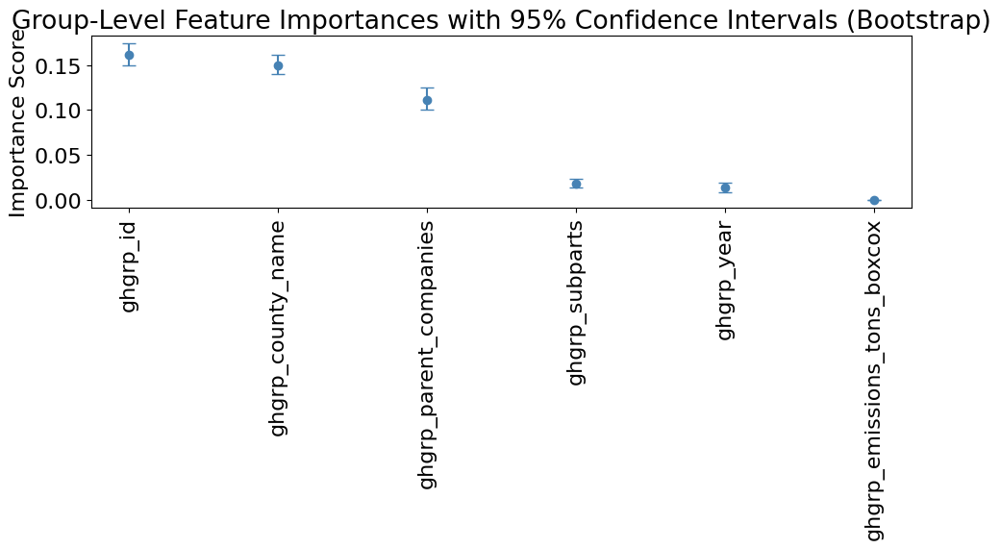

In [ ]:
# Path to save/load bootstrap results
bootstrap_results_path = "/content/drive/MyDrive/Master_Thesis/large_discrepancies_group_importances_bootstrap_2.pkl"

# Ensure X_train is a DataFrame and aligned with X
if not isinstance(X_train, pd.DataFrame):
    # Convert X_train to a DataFrame using the columns of X
    X_train = pd.DataFrame(X_train, columns=X.columns)

# Apply Quantile Transformation only to numeric columns
qt = QuantileTransformer(output_distribution="normal", random_state=42)
numeric_columns = X_train.select_dtypes(include=np.number).columns
X_train_transformed = X_train.copy()  # Copy original structure

X_train_transformed[numeric_columns] = qt.fit_transform(X_train[numeric_columns])  # Transform numeric columns

# Ensure the predictor groups are correctly defined
predictor_groups = {
    "ghgrp_year": [col for col in X_train.columns if col.startswith("ghgrp_year")],
    "ghgrp_emissions_tons_boxcox": [col for col in X_train.columns if "ghgrp_emissions_tons_boxcox" in col],
    "ghgrp_county_name": [col for col in X_train.columns if col.startswith("ghgrp_county_name")],
    "ghgrp_parent_companies": [col for col in X_train.columns if col.startswith("ghgrp_parent_companies")],
    "ghgrp_subparts": [col for col in X_train.columns if col.startswith("ghgrp_subparts")],
    "ghgrp_id": [col for col in X_train.columns if col.startswith("ghgrp_id")],
}

# Check if bootstrap results already exist
if os.path.exists(bootstrap_results_path):
    print("Bootstrap results found. Loading from file...")
    with open(bootstrap_results_path, "rb") as file:
        group_importances_bootstrap, group_importances_summary = pickle.load(file)
    print("Bootstrap results successfully loaded.")
else:
    print("Bootstrap results not found. Running bootstrap analysis...")

    n_bootstraps = 100
    group_importances_bootstrap = pd.DataFrame(index=predictor_groups.keys())

    # Add progress bar
    for i in tqdm(range(n_bootstraps), desc="Bootstrapping Group Importances"):
        # Resample data for bootstrapping
        X_resampled, y_resampled = resample(X_train_transformed, y_train, random_state=i)

        # Train a Random Forest model on resampled data
        rf_bootstrap = RandomForestRegressor(
            n_estimators=best_rf.n_estimators,
            max_features=best_rf.max_features,
            max_depth=best_rf.max_depth,
            min_samples_split=best_rf.min_samples_split,
            min_samples_leaf=best_rf.min_samples_leaf,
            bootstrap=best_rf.bootstrap,
            random_state=i,
            n_jobs=-1,
        )
        rf_bootstrap.fit(X_resampled, y_resampled)

        # Calculate feature importances
        feature_importances = pd.Series(rf_bootstrap.feature_importances_, index=X_train_transformed.columns)

        # Aggregate feature importances by groups
        group_importances = {}
        for group, cols in predictor_groups.items():
            valid_cols = [col for col in cols if col in feature_importances.index]
            group_importances[group] = feature_importances[valid_cols].sum()

        group_importances_bootstrap[i] = pd.Series(group_importances)

    # Calculate mean importance and 95% confidence intervals
    group_importances_summary = pd.DataFrame({
        "Mean Importance": group_importances_bootstrap.mean(axis=1),
        "Lower CI (2.5%)": group_importances_bootstrap.quantile(0.025, axis=1),
        "Upper CI (97.5%)": group_importances_bootstrap.quantile(0.975, axis=1),
    }).sort_values(by="Mean Importance", ascending=False)

    # Save results to file
    with open(bootstrap_results_path, "wb") as file:
        pickle.dump((group_importances_bootstrap, group_importances_summary), file)
    print(f"Bootstrap results saved to: {bootstrap_results_path}")

# Display Group-Level Summary
print("\nGroup-Level Importance Summary:")
print(group_importances_summary)

# Plot Group Importances with Confidence Intervals
plt.figure(figsize=(10, 6))
plt.errorbar(
    group_importances_summary.index,
    group_importances_summary["Mean Importance"],
    yerr=[
        group_importances_summary["Mean Importance"] - group_importances_summary["Lower CI (2.5%)"],
        group_importances_summary["Upper CI (97.5%)"] - group_importances_summary["Mean Importance"],
    ],
    fmt="o",
    capsize=5,
    color="steelblue",
)
plt.xticks(rotation=90)
plt.title("Group-Level Feature Importances with 95% Confidence Intervals (Bootstrap)")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

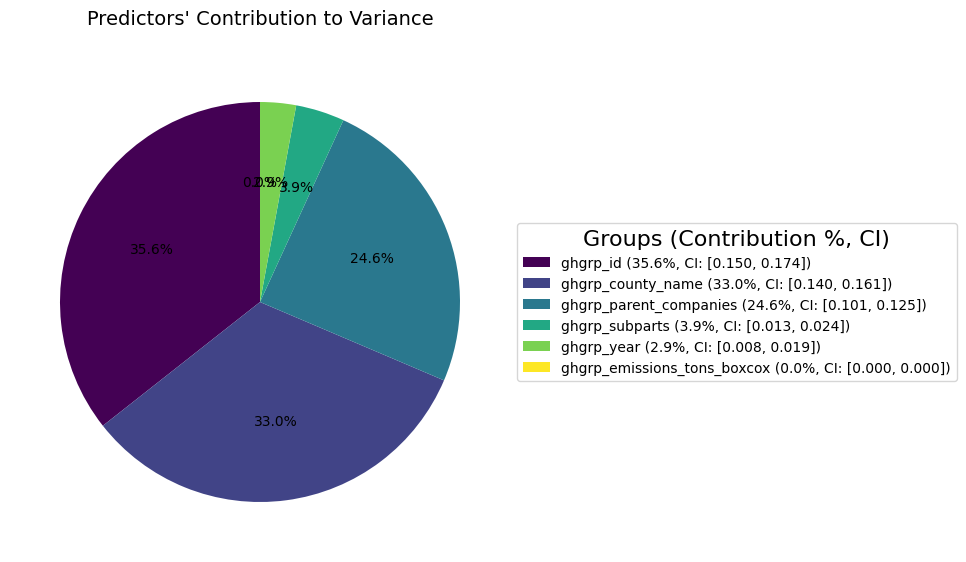

Normalized Group Contributions (as percentages):
                             Mean Importance  Percentage
ghgrp_id                            0.161504   35.616888
ghgrp_county_name                   0.149524   32.974800
ghgrp_parent_companies              0.111387   24.564400
ghgrp_subparts                      0.017886    3.944460
ghgrp_year                          0.013148    2.899452
ghgrp_emissions_tons_boxcox         0.000000    0.000000


In [ ]:
# Normalize importance values for consistency
group_contributions_df = group_importances_summary.copy()
total_importance = group_contributions_df["Mean Importance"].sum()
group_contributions_df["Percentage"] = (
    group_contributions_df["Mean Importance"] / total_importance * 100
)

# Generate colors for the pie chart
colors = plt.cm.viridis(np.linspace(0, 1, len(group_contributions_df)))

# Plot the pie chart
fig, ax = plt.subplots(figsize=(8, 8))

wedges, texts, autotexts = ax.pie(
    group_contributions_df["Percentage"],
    autopct="%1.1f%%",
    startangle=90,
    colors=colors,
    textprops={"fontsize": 10},
)

# Build labels with percentages and confidence intervals
labels = [
    f"{index} ({row['Percentage']:.1f}%, CI: [{row['Lower CI (2.5%)']:.3f}, {row['Upper CI (97.5%)']:.3f}])"
    for index, row in group_contributions_df.iterrows()
]

# Add legend on the right
ax.legend(
    wedges,
    labels,
    title="Groups (Contribution %, CI)",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10,
    frameon=True,
)

ax.set_aspect("equal")
plt.subplots_adjust(right=0.75)
plt.title("Predictors' Contribution to Variance", fontsize=14, pad=20)
plt.show()

# Display normalized group contributions
print("Normalized Group Contributions (as percentages):")
print(group_contributions_df[["Mean Importance", "Percentage"]])

# Random forest + temperature + precipitation + elevation


In [ ]:
# Add average county temp + ptecipitation from https://www.ncei.noaa.gov/access/monitoring/climate-at-a-glance/county/mapping

import os
import pandas as pd
from fuzzywuzzy import process, fuzz

# === Load + auto-detect separator + skip header if needed ===
def load_climate_csv(filepath):
    with open(filepath, "r", encoding="utf-8") as f:
        lines = [f.readline() for _ in range(2)]
        if all(sep not in lines[0] and sep in lines[1] for sep in [",", ";"]):
            skiprows = 1
        else:
            skiprows = 0
        sep = ";" if ";" in lines[skiprows] and "," not in lines[skiprows] else ","
    return pd.read_csv(filepath, sep=sep, skiprows=skiprows)

# === State abbreviation to full name ===
us_state_abbrev = {
    'AL': 'alabama', 'AK': 'alaska', 'AZ': 'arizona', 'AR': 'arkansas',
    'CA': 'california', 'CO': 'colorado', 'CT': 'connecticut', 'DE': 'delaware',
    'FL': 'florida', 'GA': 'georgia', 'HI': 'hawaii', 'ID': 'idaho',
    'IL': 'illinois', 'IN': 'indiana', 'IA': 'iowa', 'KS': 'kansas',
    'KY': 'kentucky', 'LA': 'louisiana', 'ME': 'maine', 'MD': 'maryland',
    'MA': 'massachusetts', 'MI': 'michigan', 'MN': 'minnesota', 'MS': 'mississippi',
    'MO': 'missouri', 'MT': 'montana', 'NE': 'nebraska', 'NV': 'nevada',
    'NH': 'new hampshire', 'NJ': 'new jersey', 'NM': 'new mexico',
    'NY': 'new york', 'NC': 'north carolina', 'ND': 'north dakota',
    'OH': 'ohio', 'OK': 'oklahoma', 'OR': 'oregon', 'PA': 'pennsylvania',
    'RI': 'rhode island', 'SC': 'south carolina', 'SD': 'south dakota',
    'TN': 'tennessee', 'TX': 'texas', 'UT': 'utah', 'VT': 'vermont',
    'VA': 'virginia', 'WA': 'washington', 'WV': 'west virginia',
    'WI': 'wisconsin', 'WY': 'wyoming', 'DC': 'district of columbia'
}

# === Path to your Drive folder ===
data_folder = "/content/drive/MyDrive/Master_Thesis/"

# === Start with your matched data ===
df = matched_dfs["5m"].copy()

# === Clean names for matching ===
df['ghgrp_STATE_clean'] = df['ghgrp_STATE'].str.strip().map(us_state_abbrev)
df['ghgrp_county_name_clean'] = df['ghgrp_county_name'].astype(str).str.strip().str.lower()

# === Fuzzy match helper ===
def get_fuzzy_value(county, state, lookup_dict, threshold=85):
    query = f"{county}, {state}"
    result = process.extractOne(query, lookup_dict.keys(), scorer=fuzz.token_sort_ratio)
    if result and result[1] >= threshold:
        return lookup_dict[result[0]]
    return None

# === Loop over years ===
for year in range(2015, 2024):
    print(f"\n🔄 Processing year {year}")

    # --- Temperature ---
    temp_file = os.path.join(data_folder, f"temp_{year}.csv")
    temp_dict = {}
    if os.path.exists(temp_file):
        temp_df = load_climate_csv(temp_file)
        temp_df.columns = temp_df.columns.str.strip()
        try:
            temp_df['State_clean'] = temp_df['State'].str.strip().str.lower()
            temp_df['County_clean'] = temp_df['Name'].str.strip().str.lower()
            temp_dict = {
                f"{row['County_clean']}, {row['State_clean']}": row['Value']
                for _, row in temp_df.iterrows()
            }
        except KeyError as e:
            print(f"⚠️ Temperature file missing expected columns for {year}: {e}")
    else:
        print(f"⚠️ Missing temperature file for {year}")

    # --- Precipitation ---
    precip_file = os.path.join(data_folder, f"precipitation_{year}.csv")
    precip_dict = {}
    if os.path.exists(precip_file):
        precip_df = load_climate_csv(precip_file)
        precip_df.columns = precip_df.columns.str.strip()
        try:
            precip_df['State_clean'] = precip_df['State'].str.strip().str.lower()
            precip_df['County_clean'] = precip_df['Name'].str.strip().str.lower()
            precip_dict = {
                f"{row['County_clean']}, {row['State_clean']}": row['Value']
                for _, row in precip_df.iterrows()
            }
        except KeyError as e:
            print(f"⚠️ Precipitation file missing expected columns for {year}: {e}")
    else:
        print(f"⚠️ Missing precipitation file for {year}")

    # --- Match values ---
    mask = df['ct_year'] == year
    year_df = df[mask].copy()
    year_df['combined'] = year_df['ghgrp_county_name_clean'] + ", " + year_df['ghgrp_STATE_clean']

    df.loc[mask, 'average_county_temperature'] = year_df['combined'].apply(
        lambda x: get_fuzzy_value(*x.split(', '), temp_dict) if pd.notna(x) else None
    )

    df.loc[mask, 'county_precipitation'] = year_df['combined'].apply(
        lambda x: get_fuzzy_value(*x.split(', '), precip_dict) if pd.notna(x) else None
    )

# === Impute missing values with state mean then overall mean ===
for col in ['average_county_temperature', 'county_precipitation']:
    col_state_mean = df.groupby('ghgrp_STATE_clean')[col].transform('mean')
    df[col] = df[col].fillna(col_state_mean)
    df[col] = df[col].fillna(df[col].mean())

# === Final cleanup ===
df.drop(columns=['ghgrp_STATE_clean', 'ghgrp_county_name_clean'], inplace=True)

# === Summary ===
print("\n✅ Final merge complete!")
print("✅ Rows with filled temperature:", df['average_county_temperature'].notna().sum())
print("✅ Rows with filled precipitation:", df['county_precipitation'].notna().sum())


🔄 Processing year 2015

🔄 Processing year 2016

🔄 Processing year 2017

🔄 Processing year 2018

🔄 Processing year 2019

🔄 Processing year 2020

🔄 Processing year 2021

🔄 Processing year 2022

✅ Final merge complete!
✅ Rows with filled temperature: 17767
✅ Rows with filled precipitation: 17767


In [ ]:
display(df.head())

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,...,distance,name_similarity,combined_score,emissions_discrepancy,zero_discrepancy_flag,emissions_percentage_discrepancy,ghgrp_subparts_total_emissions,weighted_percentage_discrepancy,average_county_temperature,county_precipitation
0,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,31.671177,-98.996513,BROWNWOOD,Brown County,TX,76801,...,0.000000,100,1.000000,-1.50226,False,-0.004087,55499268,-2.706810e-06,65.7,40.83
1,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,33.965480,-87.899360,GUIN,Marion County,AL,35563,...,0.001335,100,0.866485,-0.26183,False,-0.000826,55499268,-4.717720e-07,61.5,65.41
2,2015,3M Cottage Grove Center - Site,1004836,10746 Innovation Rd,44.789444,-92.908333,Cottage Grove,Washington County,MN,55016,...,0.000000,100,1.000000,14742.98360,False,32.462092,369405,3.991008e+00,46.4,39.24
3,2015,3M MAGNETIC TAPE MANUFACTURING DIVISION,1004914,905-915 ADAMS STREET SOUTHEAST,44.879677,-94.359598,HUTCHINSON,Mcleod County,MN,55350,...,0.000000,100,1.000000,-2602.80236,False,-7.166898,627627227,-4.147051e-04,45.7,29.54
4,2015,3M NEVADA PLANT,1004804,2120 E. AUSTIN,37.834476,-94.330625,NEVADA,Vernon County,MO,64772,...,0.000000,100,1.000000,-2.45383,False,-0.007914,627627227,-3.909693e-07,57.3,54.05


In [ ]:
# Add elevation data from https://open-meteo.com/en/docs/elevation-api?

import requests

# File path to store elevation data
elevation_cache_path = "/content/drive/MyDrive/Master_Thesis/ghgrp_elevation_cache.csv"

# Load or fetch elevation data
if os.path.exists(elevation_cache_path):
    print("📂 Loading cached elevation data...")
    elevation_df = pd.read_csv(elevation_cache_path)
else:
    print("🌐 Fetching elevation data from Open-Meteo API...")

    # Get unique ghgrp_id + coordinates
    unique_coords = df[['ghgrp_id', 'ghgrp_latitude', 'ghgrp_longitude']].drop_duplicates()

    # Drop rows with missing coordinates
    unique_coords = unique_coords.dropna(subset=['ghgrp_latitude', 'ghgrp_longitude'])

    elevation_records = []

    # Loop through unique coordinates
    for _, row in tqdm(unique_coords.iterrows(), total=len(unique_coords), desc="Fetching elevations"):
        ghgrp_id = row['ghgrp_id']
        lat = row['ghgrp_latitude']
        lon = row['ghgrp_longitude']

        # Skip invalid coordinates
        if not (-90 <= lat <= 90 and -180 <= lon <= 180):
            print(f"❌ Invalid coordinates for {ghgrp_id}: lat={lat}, lon={lon}")
            elevation = None
        else:
            # Make API request
            url = f"https://api.open-meteo.com/v1/elevation?latitude={lat}&longitude={lon}"
            try:
                response = requests.get(url, timeout=10)
                response.raise_for_status()
                data = response.json()
                elevation_list = data.get("elevation")
                elevation = elevation_list[0] if isinstance(elevation_list, list) and elevation_list else None
            except Exception as e:
                print(f"⚠️ Error fetching elevation for {ghgrp_id}: {e}")
                elevation = None

        elevation_records.append({
            'ghgrp_id': ghgrp_id,
            'elevation': elevation
        })

    # Save elevation data
    elevation_df = pd.DataFrame(elevation_records)
    elevation_df.to_csv(elevation_cache_path, index=False)
    print("✅ Elevation data saved to cache.")

# Merge into main df
df = df.merge(elevation_df, on='ghgrp_id', how='left')

# Optional: check how many values were filled
print("✅ Elevation values added for", df['elevation'].notna().sum(), "rows.")

📂 Loading cached elevation data...
✅ Elevation values added for 18839 rows.


In [ ]:
display(df.head())

,ghgrp_year,ghgrp_facility_name,ghgrp_id,ghgrp_reported_address,ghgrp_latitude,ghgrp_longitude,ghgrp_city_name,ghgrp_county_name,ghgrp_STATE,ghgrp_zip_code,...,name_similarity,combined_score,emissions_discrepancy,zero_discrepancy_flag,emissions_percentage_discrepancy,ghgrp_subparts_total_emissions,weighted_percentage_discrepancy,average_county_temperature,county_precipitation,elevation
0,2015,3M BROWNWOOD,1003188,4501 HIGHWAY 377 SOUTH,31.671177,-98.996513,BROWNWOOD,Brown County,TX,76801,...,100,1.000000,-1.50226,False,-0.004087,55499268,-2.706810e-06,65.7,40.83,435.0
1,2015,3M CO - GUIN,1003739,6675 US HIGHWAY 43,33.965480,-87.899360,GUIN,Marion County,AL,35563,...,100,0.866485,-0.26183,False,-0.000826,55499268,-4.717720e-07,61.5,65.41,142.0
2,2015,3M Cottage Grove Center - Site,1004836,10746 Innovation Rd,44.789444,-92.908333,Cottage Grove,Washington County,MN,55016,...,100,1.000000,14742.98360,False,32.462092,369405,3.991008e+00,46.4,39.24,246.0
3,2015,3M MAGNETIC TAPE MANUFACTURING DIVISION,1004914,905-915 ADAMS STREET SOUTHEAST,44.879677,-94.359598,HUTCHINSON,Mcleod County,MN,55350,...,100,1.000000,-2602.80236,False,-7.166898,627627227,-4.147051e-04,45.7,29.54,327.0
4,2015,3M NEVADA PLANT,1004804,2120 E. AUSTIN,37.834476,-94.330625,NEVADA,Vernon County,MO,64772,...,100,1.000000,-2.45383,False,-0.007914,627627227,-3.909693e-07,57.3,54.05,275.0


In [ ]:
# Random Forest Model

# Apply Quantile Transformation
qt = QuantileTransformer(output_distribution="normal", random_state=42)
df['ghgrp_emissions_tons_quantile'] = qt.fit_transform(df[['ghgrp_emissions_tons']])
df['emissions_discrepancy_quantile'] = qt.fit_transform(df[['emissions_discrepancy']])

# Ensure variables are correct type
df['ghgrp_year'] = df['ghgrp_year'].astype(int)

def process_parent_companies(value):
    if pd.isna(value):
        return ["Other"]
    cleaned_value = re.sub(r'\([^)]*\)', '', str(value))
    return [company.strip() for company in cleaned_value.split(';')]

def process_subparts(value):
    if pd.isna(value):
        return []
    return [subpart.strip() for subpart in str(value).split(',')]

df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].apply(process_parent_companies)
df['ghgrp_subparts'] = df['ghgrp_subparts'].apply(process_subparts)

# Explode both parent companies and subparts
df = df.explode('ghgrp_parent_companies')
df = df.explode('ghgrp_subparts')

# Convert to categorical
df['ghgrp_parent_companies'] = df['ghgrp_parent_companies'].astype('category')
df['ghgrp_county_name'] = df['ghgrp_county_name'].astype('category')
df['ghgrp_subparts'] = df['ghgrp_subparts'].astype('category')
df['ghgrp_id'] = df['ghgrp_id'].astype('category')

# Aggregate statistics for group-level effects
df['parent_mean_discrepancy'] = df.groupby('ghgrp_parent_companies', observed=True)['emissions_discrepancy_quantile'].transform('mean')
df['facility_mean_discrepancy'] = df.groupby('ghgrp_id', observed=True)['emissions_discrepancy_quantile'].transform('mean')

# Add temporal features
df['year_normalized'] = df['ghgrp_year'] - df['ghgrp_year'].min()

# Create dummy variables for modeling
X = pd.get_dummies(
    df[['ghgrp_year', 'year_normalized', 'ghgrp_emissions_tons_quantile',
        'ghgrp_county_name', 'ghgrp_parent_companies', 'ghgrp_subparts', 'ghgrp_id',
        'parent_mean_discrepancy', 'facility_mean_discrepancy',
        'average_county_temperature', 'county_precipitation', 'elevation']],
    drop_first=True
)
y = df['emissions_discrepancy_quantile']

# Train-Test Split
print("Splitting data...")
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

# Ensure column alignment
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# Hyperparameter Tuning with RandomizedSearchCV
model_file_path = "/content/drive/MyDrive/Master_Thesis/random_forest_model_with_temp_precip_elevation.pkl"

if os.path.exists(model_file_path):
    print("Loading the saved Random Forest model...")
    with open(model_file_path, "rb") as file:
        best_rf = pickle.load(file)
else:
    print("Model file does not exist. Training the Random Forest model...")

    param_grid = {
        'n_estimators': [500],
        'max_depth': [50, None],
        'min_samples_leaf': [2, 3],
        'min_samples_split': [2, 5],
        'max_features': ['sqrt'],
        'bootstrap': [True],
        'max_samples': [0.8, 0.9]
    }

    rf_model = RandomForestRegressor(random_state=42, n_jobs=-1)
    random_search = RandomizedSearchCV(
        rf_model, param_distributions=param_grid, n_iter=30, cv=5,
        scoring='neg_mean_squared_error', n_jobs=-1, random_state=42, verbose=1
    )

    random_search.fit(X_train, y_train)
    best_rf = random_search.best_estimator_

    print("\nBest parameters found:")
    print(random_search.best_params_)

    # Save the model
    with open(model_file_path, "wb") as file:
        pickle.dump(best_rf, file)

print("Model training complete!")

Splitting data...
Model file does not exist. Training the Random Forest model...
Fitting 5 folds for each of 16 candidates, totalling 80 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 16 is smaller than n_iter=30. Running 16 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(



Best parameters found:
{'n_estimators': 500, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_samples': 0.9, 'max_features': 'sqrt', 'max_depth': None, 'bootstrap': True}
Model training complete!


In [ ]:
# Evaluate the Best Model

y_pred_train = best_rf.predict(X_train)
y_pred_test = best_rf.predict(X_test)

# Compute RMSE and R² for train and test sets
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
mae_test = mean_absolute_error(y_test, y_pred_test)

print("\nModel Performance:")
print(f"Train RMSE: {rmse_train:.4f}, R²: {r2_train:.4f}")
print(f"Test  RMSE: {rmse_test:.4f}, R²: {r2_test:.4f}")
print(f"Test  MAE : {mae_test:.4f}")


Model Performance:
Train RMSE: 0.4040, R²: 0.8796
Test  RMSE: 0.4696, R²: 0.8376
Test  MAE : 0.3203


In [ ]:
# Path to save/load cross-validation results
cv_results_path = "/content/drive/MyDrive/Master_Thesis/cross_val_results_temp_precip_elev.pkl"

if os.path.exists(cv_results_path):
    print("Cross-validation results found. Loading from file...")
    with open(cv_results_path, "rb") as file:
        cv_scores = pickle.load(file)
    print("Cross-validation results successfully loaded.")
else:
    print("Cross-validation results not found. Running cross-validation...")

    # Perform cross-validation
    cv_scores = cross_val_score(best_rf, X, y, cv=5, scoring='r2', n_jobs=-1)

    # Save results to file
    with open(cv_results_path, "wb") as file:
        pickle.dump(cv_scores, file)
    print(f"Cross-validation results saved to: {cv_results_path}")

# Display Cross-Validation Results
print("\nCross-Validation R² Scores:", cv_scores)
print(f"Mean R²: {np.mean(cv_scores):.4f}")
print(f"Std Dev of R²: {np.std(cv_scores):.4f}")

Cross-validation results not found. Running cross-validation...
Cross-validation results saved to: /content/drive/MyDrive/Master_Thesis/cross_val_results_temp_precip_elev.pkl

Cross-Validation R² Scores: [0.84475089 0.85523972 0.81705874 0.84539985 0.73720371]
Mean R²: 0.8199
Std Dev of R²: 0.0433


In [ ]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd

# === Fit a lightweight Random Forest ===
rf_quick = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_quick.fit(X_train, y_train)

# === Get feature importances ===
feature_importances = pd.Series(rf_quick.feature_importances_, index=X_train.columns)

# === Group definitions (same as before) ===
predictor_groups = {
    "ghgrp_year": [col for col in X_train.columns if col.startswith("ghgrp_year")],
    "ghgrp_emissions_tons_quantile": [col for col in X_train.columns if "ghgrp_emissions_tons_quantile" in col],
    "ghgrp_county_name": [col for col in X_train.columns if col.startswith("ghgrp_county_name")],
    "ghgrp_parent_companies": [col for col in X_train.columns if col.startswith("ghgrp_parent_companies")],
    "ghgrp_subparts": [col for col in X_train.columns if col.startswith("ghgrp_subparts")],
    "ghgrp_id": [col for col in X_train.columns if col.startswith("ghgrp_id")],
    "parent_mean_discrepancy": [col for col in X_train.columns if col == "parent_mean_discrepancy"],
    "facility_mean_discrepancy": [col for col in X_train.columns if col == "facility_mean_discrepancy"],
    "average_county_temperature": [col for col in X_train.columns if col == "average_county_temperature"],
    "county_precipitation": [col for col in X_train.columns if col == "county_precipitation"],
    "elevation": [col for col in X_train.columns if col == "elevation"]
}

# === Aggregate importances by group ===
group_importance_summary = {
    group: feature_importances[[
        col for col in cols if col in feature_importances
    ]].sum()
    for group, cols in predictor_groups.items()
}

# === Display as sorted DataFrame ===
group_importance_df = pd.DataFrame.from_dict(group_importance_summary, orient="index", columns=["Importance"])
group_importance_df["Percentage"] = 100 * group_importance_df["Importance"] / group_importance_df["Importance"].sum()
group_importance_df = group_importance_df.sort_values(by="Importance", ascending=False)

# === Show ===
print("🔍 Quick Feature Group Importances:")
display(group_importance_df.round(3))

🔍 Quick Feature Group Importances:


,Importance,Percentage
facility_mean_discrepancy,0.897,90.092
ghgrp_emissions_tons_quantile,0.035,3.503
ghgrp_parent_companies,0.012,1.245
ghgrp_id,0.010,1.049
ghgrp_county_name,0.008,0.820
county_precipitation,0.008,0.765
average_county_temperature,0.007,0.680
parent_mean_discrepancy,0.006,0.625
ghgrp_subparts,0.005,0.493
ghgrp_year,0.005,0.471



🧠 Correlation with Target (emissions_discrepancy_quantile):
emissions_discrepancy_quantile    1.000000
elevation                         0.094764
average_county_temperature       -0.023877
county_precipitation             -0.064674
Name: emissions_discrepancy_quantile, dtype: float64


<ipython-input-160-4ef6558ab5fd>:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


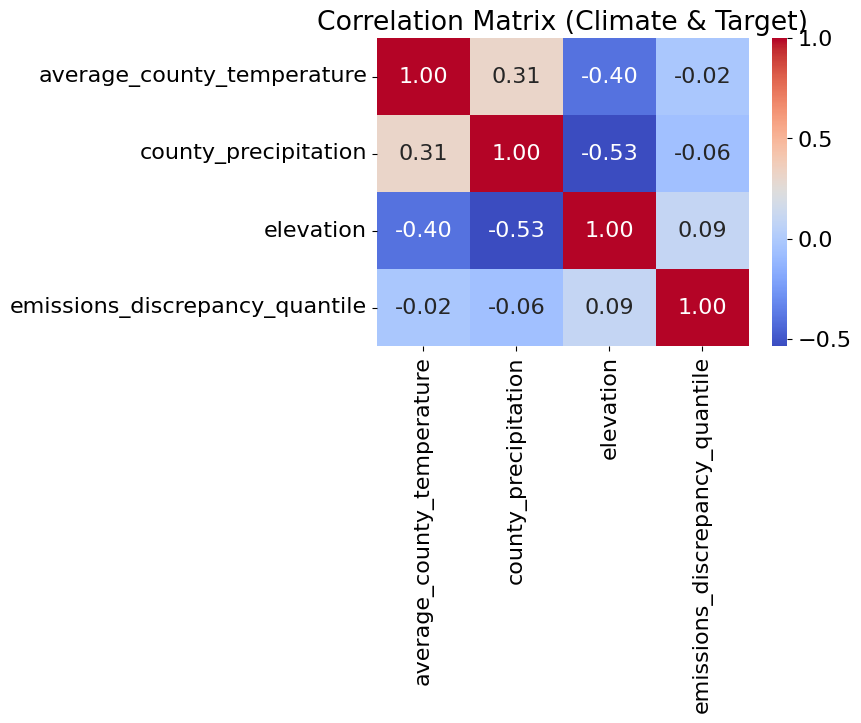

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant numeric variables + target
corr_cols = ['average_county_temperature', 'county_precipitation', 'elevation', 'emissions_discrepancy_quantile']
corr_matrix = df[corr_cols].corr()

# Print plain correlations
print("\n🧠 Correlation with Target (emissions_discrepancy_quantile):")
print(corr_matrix['emissions_discrepancy_quantile'].sort_values(ascending=False))

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix (Climate & Target)")
plt.tight_layout()
plt.show()


In [ ]:
# === Path to save/load bootstrap results ===
bootstrap_results_path = "/content/drive/MyDrive/Master_Thesis/group_importances_bootstrap_temp_precipation.pkl"

# === Ensure X_train is a DataFrame and aligned with X ===
if not isinstance(X_train, pd.DataFrame):
    X_train = pd.DataFrame(X_train, columns=X.columns)

# === Quantile transform ONLY the appropriate numeric variables ===
qt = QuantileTransformer(output_distribution="normal", random_state=42)
X_train_transformed = X_train.copy()

# Only apply transformation to emissions-related columns
columns_to_transform = [col for col in X_train.columns if "emissions_tons_quantile" in col or "discrepancy" in col]
X_train_transformed[columns_to_transform] = qt.fit_transform(X_train[columns_to_transform])

# === Define predictor groups (updated with new variables) ===
predictor_groups = {
    "ghgrp_year": [col for col in X_train.columns if col.startswith("ghgrp_year")],
    "ghgrp_emissions_tons_quantile": [col for col in X_train.columns if "ghgrp_emissions_tons_quantile" in col],
    "ghgrp_county_name": [col for col in X_train.columns if col.startswith("ghgrp_county_name")],
    "ghgrp_parent_companies": [col for col in X_train.columns if col.startswith("ghgrp_parent_companies")],
    "ghgrp_subparts": [col for col in X_train.columns if col.startswith("ghgrp_subparts")],
    "ghgrp_id": [col for col in X_train.columns if col.startswith("ghgrp_id")],
    "parent_mean_discrepancy": [col for col in X_train.columns if col == "parent_mean_discrepancy"],
    "facility_mean_discrepancy": [col for col in X_train.columns if col == "facility_mean_discrepancy"],
    "average_county_temperature": [col for col in X_train.columns if col == "average_county_temperature"],
    "county_precipitation": [col for col in X_train.columns if col == "county_precipitation"],
    "elevation": [col for col in X_train.columns if col == "elevation"]
}

# === Load or run bootstrap ===
if os.path.exists(bootstrap_results_path):
    print("Bootstrap results found. Loading from file...")
    with open(bootstrap_results_path, "rb") as file:
        group_importances_bootstrap, group_importances_summary = pickle.load(file)
    print("Bootstrap results successfully loaded.")
else:
    print("Bootstrap results not found. Running bootstrap analysis...")

    n_bootstraps = 100
    group_importances_bootstrap = pd.DataFrame(index=predictor_groups.keys())

    for i in tqdm(range(n_bootstraps), desc="Bootstrapping Group Importances"):
        # Resample
        X_resampled, y_resampled = resample(X_train_transformed, y_train, random_state=i)

        # Train model
        rf_bootstrap = RandomForestRegressor(
            n_estimators=best_rf.n_estimators,
            max_features=best_rf.max_features,
            max_depth=best_rf.max_depth,
            min_samples_split=best_rf.min_samples_split,
            min_samples_leaf=best_rf.min_samples_leaf,
            bootstrap=best_rf.bootstrap,
            random_state=i,
            n_jobs=-1,
        )
        rf_bootstrap.fit(X_resampled, y_resampled)

        # Feature importances
        feature_importances = pd.Series(rf_bootstrap.feature_importances_, index=X_train_transformed.columns)

        # Group aggregation
        group_importances = {}
        for group, cols in predictor_groups.items():
            valid_cols = [col for col in cols if col in feature_importances.index]
            group_importances[group] = feature_importances[valid_cols].sum()

        group_importances_bootstrap[i] = pd.Series(group_importances)

    # === Summary stats ===
    group_importances_summary = pd.DataFrame({
        "Mean Importance": group_importances_bootstrap.mean(axis=1),
        "Lower CI (2.5%)": group_importances_bootstrap.quantile(0.025, axis=1),
        "Upper CI (97.5%)": group_importances_bootstrap.quantile(0.975, axis=1),
    }).sort_values(by="Mean Importance", ascending=False)

    # Save
    with open(bootstrap_results_path, "wb") as file:
        pickle.dump((group_importances_bootstrap, group_importances_summary), file)
    print(f"✅ Bootstrap results saved to: {bootstrap_results_path}")

# === Display Summary ===
print("\nGroup-Level Importance Summary:")
print(group_importances_summary)

# === Plot ===
plt.figure(figsize=(10, 6))
plt.errorbar(
    group_importances_summary.index,
    group_importances_summary["Mean Importance"],
    yerr=[
        group_importances_summary["Mean Importance"] - group_importances_summary["Lower CI (2.5%)"],
        group_importances_summary["Upper CI (97.5%)"] - group_importances_summary["Mean Importance"],
    ],
    fmt="o",
    capsize=5,
    color="steelblue",
)
plt.xticks(rotation=90)
plt.title("Group-Level Feature Importances with 95% Confidence Intervals (Bootstrap)")
plt.ylabel("Importance Score")
plt.tight_layout()
plt.show()

Bootstrap results not found. Running bootstrap analysis...


Bootstrapping Group Importances:   4%|▍         | 4/100 [19:53<7:57:30, 298.44s/it]


KeyboardInterrupt: 

In [ ]:
# === Normalize importance values for consistency ===
group_contributions_df = group_importances_summary.copy()
total_importance = group_contributions_df["Mean Importance"].sum()
group_contributions_df["Percentage"] = (
    group_contributions_df["Mean Importance"] / total_importance * 100
)

# === Generate colors ===
colors = plt.cm.viridis(np.linspace(0, 1, len(group_contributions_df)))

# === Plot pie chart ===
fig, ax = plt.subplots(figsize=(8, 8))

wedges, texts, autotexts = ax.pie(
    group_contributions_df["Percentage"],
    autopct="%1.1f%%",
    startangle=90,
    colors=colors,
    textprops={"fontsize": 10},
)

# === Build labels with CIs ===
labels = [
    f"{index} ({row['Percentage']:.1f}%, CI: [{row['Lower CI (2.5%)']:.3f}, {row['Upper CI (97.5%)']:.3f}])"
    for index, row in group_contributions_df.iterrows()
]

# === Add legend ===
ax.legend(
    wedges,
    labels,
    title="Groups (Contribution %, CI)",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10,
    frameon=True,
)

ax.set_aspect("equal")
plt.subplots_adjust(right=0.75)
plt.title("Group-Level Feature Contributions to Model Variance (Random Forest Bootstrap)", fontsize=14, pad=20)
plt.show()

# === Print percentages as table ===
print("\n✅ Normalized Group Contributions (% of Total Importance):")
display(group_contributions_df[["Mean Importance", "Percentage"]].round(2))

NameError: name 'group_importances_summary' is not defined

In [ ]:
import pyarrow.parquet as pq
import pandas as pd
import pyreadstat

# 1. Read the Parquet file
table = pq.read_table("/content/drive/MyDrive/Master_Thesis/ghg_matched_50m.parquet")
df = table.to_pandas()

# 2. Write as a SAS transport (XPORT) file
pyreadstat.write_xport(df, "ghg_matched_50m.xpt")
from google.colab import files
files.download("ghg_matched_50m.xpt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pyarrow.parquet as pq
import pandas as pd

# ─────────── 1. File & Metadata ───────────
file_path = "/content/drive/MyDrive/Master_Thesis/ghg_matched_50m.parquet"
pf = pq.ParquetFile(file_path)
meta = pf.metadata

print("=== ParquetFile metadata ===")
print(f"• Row groups : {pf.num_row_groups}")
print(f"• Total rows : {meta.num_rows}")
print(f"• Total cols : {meta.num_columns}\n")

# Print schema as a simple list
schema = pf.schema_arrow
print("=== Schema (name: type) ===")
for name, typ in zip(schema.names, schema.types):
    print(f"  • {name:30s} {typ}")
print()

# ─────────── 2. Load into pandas ───────────
df = pf.read().to_pandas()

# ─────────── 3. Basic DataFrame overview ───────────
print("=== DataFrame overview ===")
print(f"Shape            : {df.shape[0]} rows × {df.shape[1]} cols")
print(f"Memory footprint : {df.memory_usage(deep=True).sum() / (1024**2):.1f} MB")
print("\nColumn dtypes:")
print(df.dtypes)
print()

# ─────────── 4. Missing values ───────────
miss = df.isnull().sum()
print("=== Missing values per column ===")
print(miss[miss > 0] if miss.any() else "None")
print()



=== ParquetFile metadata ===
• Row groups : 1
• Total rows : 31145
• Total cols : 35

=== Schema (name: type) ===
  • ghgrp_year                     int64
  • ghgrp_facility_name            string
  • ghgrp_id                       int64
  • ghgrp_reported_address         string
  • ghgrp_latitude                 double
  • ghgrp_longitude                double
  • ghgrp_city_name                string
  • ghgrp_county_name              string
  • ghgrp_STATE                    string
  • ghgrp_zip_code                 string
  • ghgrp_parent_companies         string
  • ghgrp_emissions_tons           int64
  • ghgrp_subparts                 string
  • ghgrp_coordinate               list<element: double>
  • ghgrp_broad_category           string
  • ct_source_id                   int64
  • ct_year                        int32
  • ct_emissions_quantity          double
  • ct_source_name                 string
  • ct_subsector                   string
  • ct_lat                         d